# **GDSCA-2022** GD Survey Data Notebook

## Imports

In [1]:
import os
import sys
import math

import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plot_likert
import seaborn as sns
import PIL
from IPython.display import display, Markdown

%matplotlib inline

## Configuration

In [2]:
single_region = 'Global'  # name of a single region to run (e.g. 'Oceania'), or False to run all regions

my_dpi = 192
show_plots = True  #show plots inline in notebook, or just save them to disk
output_pngs = True
output_pdfs = True
output_svgs = True
separate_legends = False
matplotlib.rcParams['figure.dpi'] = my_dpi

all_region_list = [
    'Africa',
    'Asia',
    'Europe',
    'Oceania',
    'Americas',
    'Global',
    'Economies',
    'SIDS',
]

region_list = all_region_list
if single_region:
    region_list = [single_region]

constructed_regions = ['Americas', 'Global', 'Economies', 'SIDS']

orderR = {
    'Africa' : [
        'Northern Africa',
        'Western Africa',
        'Middle Africa',
        'Eastern Africa',
        'Southern Africa'
    ],
    'Asia' : [
        'Western Asia',
        'Southern Asia',
        'Eastern Asia',
        'Southeastern Asia'
    ],
    'Europe' : [
        'Northern Europe',
        'Western Europe',
        'Eastern Europe',
        'Southern Europe'
    ],
    'Oceania' : [
        'Micronesia',
        'Melanesia',
        'Polynesia',
        'Australia and New Zealand'
    ],
    'Americas' : [
        'Northern America',
        'Central America',
        'Caribbean',
        'South America'
    ],
    'Global' : [
        'Europe',
        'Asia',
        'Northern America',
        'Africa',
        'Oceania',
        'Latin America and the Caribbean'
    ],
    'Economies': [
        'High income',
        'Upper middle income',
        'Lower middle income',
        'Low income',
        'Not classified'
    ],
    'SIDS': [
        'High income',
        'Upper middle income',
        'Lower middle income',
        'Low income',
        'Not classified'
    ],
}

ignoreR = {
    'Asia' : ['Central Asia']
}

label_adjustments = {  # note: can use /n as a line break if using double quotes
    'Latin America and the Caribbean': 'L Amer & Carib',
    'Northern America': 'N America',
    'Australia and New Zealand': 'Aus & NZ',
    'Upper middle income': 'Upper middle',
    'Lower middle income': 'Lower middle',
}

# override some things if we are being run by the render_figures_and_notebooks.sh script
if 'GDSCA_SINGLE_REGION' in os.environ:
    single_region = os.getenv('GDSCA_SINGLE_REGION') or False
    if single_region:
        region_list = [single_region]
    else:
        region_list = all_region_list

    show_plots = True
    output_pngs = True
    output_pdfs = True
    output_svgs = True
    separate_legends = True

    if 'GDSCA_OUTPUT_IMAGES' in os.environ:
        if os.getenv('GDSCA_OUTPUT_IMAGES'):
            output_pngs = True
            output_pdfs = True
            output_svgs = True
        else:
            output_pngs = False
            output_pdfs = False
            output_svgs = True

    if 'GDSCA_SEPARATE_LEGENDS' in os.environ:
        if os.getenv('GDSCA_SEPARATE_LEGENDS'):
            separate_legends = True
        else:
            separate_legends = False

## Define color palettes

In [3]:
likert = ['white', '#368D95', '#95BABF', '#D4D4D4', '#B6C8AA', '#7EA56B']
cat_02 = ['#194958', '#C6744C', '#D4D4D4']
cat_03 = ['#194958', '#C6744C', '#DBC064', '#D4D4D4']
cat_04 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#D4D4D4']
cat_05 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78', '#D4D4D4']
cat_06 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#D4D4D4']
cat_07 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#011B44', '#D4D4D4']
cat_08 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#011B44', '#8A2630', '#D4D4D4']
cat_10 = ['#194958', '#C6744C', '#DBC064', '#368D95', '#3B3C78',
          '#7EA56B', '#011B44', '#8A2630', '#0963A2', '#E09AA7', '#D4D4D4']
val_04 = ['#000D22', '#1F5664', '#3D9FA5', '#CAF1EE']
val_04_rev = ['#CAF1EE', '#3D9FA5', '#1F5664', '#000D22']

val_05 = ['#000d22', '#194958', '#368d95', '#71bdc0', '#caf1ee', '#a2a6a9']
val_05_rev = ['#caf1ee', '#71bdc0', '#368d95', '#194958', '#000d22', '#a2a6a9']
val_06 = ['#000d22', '#143d4d', '#1f5664', '#368d95', '#57afb3', '#caf1ee', '#a2a6a9']
val_06_rev = ['#caf1ee', '#57afb3', '#368d95', '#1f5664', '#143d4d', '#000d22', '#a2a6a9']

sub_americas = ['#08517A', '#759A64', '#08453D', '#2A7976']
sub_europe = ['#4C3375', '#948ED8', '#494C8F', '#302A5A']
sub_africa = ['#FBC762', '#BC8C28', '#FCE393', '#C3A93A', '#927227']
sub_oceania = ['#EC6665', '#B5002B', '#FA9E8E', '#6D0110']
sub_asia = ['#FEB267', '#B05633', '#E68F48', '#873D20']  #, '#FCB8EF'] <- central asia
global_regions = ['#3B3C78', '#C6744C', '#0963A2', '#DBC064', '#8A2630', '#194958']
global_econ_wb = ['#000D22', '#194958', '#368D95', '#8CCDCE', '#A2A6A9']

cat_d23e123_by_region = {
    'Africa': sub_africa,
    'Asia': sub_asia,
    'Europe': sub_europe,
    'Oceania': sub_oceania,
    'Americas': sub_americas,
    'Global': global_regions,
    'Economies': global_econ_wb,
    'SIDS': global_econ_wb
}

## Load data tables

In [4]:
# survey data
data = pd.read_csv('gdsca-2022-data/survey_data.csv', keep_default_na=False)
display(Markdown('**Survey Data**'))
display(data.head())
print(data.shape)

# question table
questions = pd.read_csv('gdsca-2022-data/question_table.csv')
display(Markdown('**Questions**'))
display(questions.head())
print(questions.shape)

# research data
research = pd.read_csv('gdsca-2022-data/research_data.csv')
display(Markdown('**Research Data**'))
display(research.head())
print(research.shape)

# country table
country_table = pd.read_csv('gdsca-2022-data/country_table.csv')
display(Markdown('**Country Data**'))
display(country_table.head())
print(country_table.shape)

**Survey Data**

,language,respondent_id,col_name,selection,selection_survey_clean,question,question_type,selection_other,age,country,...,degree,degree_other,sector,sector_other,region,subregion,geoarea,sids,economy_sids,income_group_wb
0,EN,12906633394,Q1,Albania,,Q1,choose-1,Albania,,Albania,...,,,,,Europe,Southern Europe,Albania,,Developed,Upper middle income
1,FR,12850123626,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income
2,FR,13204231228,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income
3,FR,13204803692,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income
4,FR,13212618824,Q1,Algeria,,Q1,choose-1,Algeria,,Algeria,...,,,,,Africa,Northern Africa,Algeria,,Developing,Lower middle income


(64080, 24)


**Questions**

,col_name,question,question_type,text
0,Q1,Q1,choose-1,Which country would you like to represent for ...
1,Q1_other,Q1,choose-1,Which country would you like to represent for ...
2,Q2,Q2,choose-1,The country/nation identified in the previous ...
3,Q2_other,Q2,choose-1,The country/nation identified in the previous ...
4,Q3_basic_science,Q3,choose-3,What are the 3 most important deep sea issues ...


(178, 4)


**Research Data**

,geoarea,researcher,col_name,question,selection,region,subregion,sids,economy_sids,income_group_wb,...,[FR],[AR],[SP],[PT],[BD],research_tech,research_tech_clean,research_CID,research_org,research_org_clean
0,Albania,Baldwin,notes,notes,Plan to boost blue ecoNomy 2018 https://www.a...,Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
1,Albania,Baldwin,Q10_comments,Q10,10b Albania have joined the moratorium on deep...,Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
2,Albania,Baldwin,Q10_mining,Q10,No [A],Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
3,Albania,Baldwin,Q10_renewable_energy,Q10,No [A],Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN
4,Albania,Baldwin,Q10_research,Q10,No [A],Europe,Southern Europe,NaN,Developed,Upper middle income,...,FALSE,FALSE,FALSE,FALSE,FALSE,0,0,NaN,NaN,NaN


(10415, 33)


**Country Data**

,geoarea,status,region,subregion,geoarea_esri,iso-alpha3,economy,sids,economy_sids,un_region_code,...,dsc-ai-vessel,dsc-ai-dsv,dsc-ai-sensor,dsc-ai-data,dsc-si-all,dsc-si-vessel,dsc-si-dsv,dsc-si-sensor,dsc-si-data,dsc-index-group
0,Bassas da India,Territory,Africa,Eastern Africa,French Southern Territories,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Crozet,Territory,Africa,Southern Africa,French Southern Territories,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Europa Island,Territory,Africa,Eastern Africa,French Southern Territories,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Glorieuse Islands,Territory,Africa,Eastern Africa,Glorioso Islands,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Juan de Nova Island,Territory,Africa,Eastern Africa,Juan De Nova Island,ATF,Unclassified,NaN,Unclassified,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(259, 83)


## Subset data into regions

In [5]:
# read R as "by region"
dataR           = {}
researchR       = {}
country_tableR  = {}

for region in all_region_list:
    if region in constructed_regions:
        continue  # these are specially constructed below
    dataR[region]          = data[data['region'] == region].copy()
    researchR[region]      = research[research['region'] == region].copy()
    country_tableR[region] = country_table[country_table['region'] == region].copy()
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']

if 'Americas' in all_region_list:
    region = 'Americas'
    dataR[region]          = data[data['subregion'].isin(orderR[region])]
    researchR[region]      = research[research['subregion'].isin(orderR[region])]
    country_tableR[region] = country_table[country_table['subregion'].isin(orderR[region])].copy()
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']

if 'Global' in all_region_list:
    region = 'Global'
    dataR[region]          = data[data['region'].isin(orderR[region])]
    researchR[region]      = research[research['region'].isin(orderR[region])]
    country_tableR[region] = country_table[country_table['region'].isin(orderR[region])]
    dataR[region]['subregion']          = dataR[region]['region']
    researchR[region]['subregion']      = researchR[region]['region']
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']
    country_tableR[region]['subregion'] = country_tableR[region]['region']

if 'Economies' in all_region_list:
    region = 'Economies'
    dataR[region]          = data[data['income_group_wb'].isin(orderR[region])]
    researchR[region]      = research[research['income_group_wb'].isin(orderR[region])]
    country_tableR[region] = country_table[country_table['income_group_wb'].isin(orderR[region])]
    dataR[region]['subregion']          = dataR[region]['income_group_wb']
    researchR[region]['subregion']      = researchR[region]['income_group_wb']
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion']
    country_tableR[region]['subregion'] = country_tableR[region]['income_group_wb']

if 'SIDS' in all_region_list:
    region = 'SIDS'
    dataR[region]          = data[data['income_group_wb'].isin(orderR[region])].copy()
    dataR[region]          = dataR[region][dataR[region]['economy_sids'] == 'SIDS']
    researchR[region]      = research[research['income_group_wb'].isin(orderR[region]) & (research['economy_sids'] == 'SIDS')].copy()
    country_tableR[region] = country_table[country_table['income_group_wb'].isin(orderR[region]) & (country_table['economy_sids'] == 'SIDS')].copy()
    dataR[region]['subregion']          = dataR[region]['income_group_wb']
    researchR[region]['subregion']      = researchR[region]['income_group_wb']
    country_tableR[region]['subregion_orig'] = country_tableR[region]['subregion'].copy()
    country_tableR[region]['subregion'] = country_tableR[region]['income_group_wb']

# some required country cleanup
for region in all_region_list:
    ## change np.nan in economy column to 'NA'
    country_tableR[region].loc[country_tableR[region]['subregion'].isna() == True, 'subregion'] = 'NA'

    ## create ocean column
    country_tableR[region]['ocean'] = 'No Ocean'
    country_tableR[region].loc[(country_tableR[region]['total_eez_area'].isna() == False) &
                     (country_tableR[region]['total_eez_area'] > 0), 'ocean'] = 'EEZ with no Deep Ocean'
    country_tableR[region].loc[(country_tableR[region]['eez_deeper_than_200'].isna() == False) &
                     (country_tableR[region]['eez_deeper_than_200'] > 0), 'ocean'] = 'EEZ with Deep Ocean'

## Helper functions

In [6]:
def prep_fig_data_for_plotting(fig_data, region, axis='index', barh=False, order=False):
    if not order:
        order = orderR[region]
    if barh:
        order = list(reversed(order))

    if axis in [0, 'index']:
        fig_data = reorder_rows_and_rename(fig_data, order, createmissingrows=True)
    elif axis in [1, 'columns']:
        fig_data = reorder_columns(fig_data, order, createmissingcolumns=True)
    else:
        raise ValueError('unknown axis argument:', axis)
    fig_data = adjust_labels_to_fit(fig_data, axis=axis)
        
    return fig_data

def adjust_labels_to_fit(fig_data, axis='index'):
    fig_data.rename(label_adjustments, axis=axis, inplace=True)
    return fig_data

def undo_label_adjustment(label):
    if label in label_adjustments.values():
        reverse_label_adjustments = dict(zip(label_adjustments.values(), label_adjustments.keys()))
        orig_label = reverse_label_adjustments[label]
    else:
        orig_label = label
    return orig_label

def reorder_rows_and_rename(df, order_and_names, warnonly=False, createmissingrows=False, ignorerows=None):
    newdf = df.copy()
    order = []

    for index in df.index:
        found = False
        for name in order_and_names:
            if not isinstance(name, list):
                name = [name]
            if index == name[0]:
                found = True
                break
        if not found:
            if ignorerows and name not in ignorerows:
                errmsg = 'row found with index "'+index+'" that is not in order list'
                if not warnonly:
                    raise ValueError(errmsg)
                else:
                    print('warning: '+errmsg, file=sys.stderr)

    for name in order_and_names:
        if not isinstance(name, list):
            name = [name]
        if (not name[0] in newdf.index):
            if createmissingrows:
                print('Adding missing row '+name[0])
                newvalues = pd.Series([]*(newdf.shape[1]-1), name=name[0], dtype='float64')
                newrow = pd.DataFrame([newvalues], columns=df.columns)
                newdf = pd.concat([newdf, newrow])
            else:
                errmsg = 'row index name "' + name[0] +'" not found'
                if not warnonly:
                    raise ValueError(errmsg)
                else:
                    print('warning: '+errmsg, file=sys.stderr)
        if len(name) == 2:
            newdf.rename(index={name[0]: name[1]}, inplace=True)
            order.append(name[1])
        else:
            order.append(name[0])
    return newdf.reindex(order)

def reorder_columns(df, columnorder, createmissingcolumns=False, warnonly=False):
    newdf = df.copy()
    for column in newdf.columns:
        if column not in columnorder:
            errmsg = 'found column with name "'+column+'" that is not in order list'
            if not warnonly:
                raise ValueError(errmsg)
            else:
                print('warning: '+errmsg, file=sys.stderr)
            
    for column in columnorder:
        if not column in newdf.columns:
            if createmissingcolumns:
                print('Adding missing column '+column)
                newdf[column] = np.nan
            else:
                errmsg = 'column "'+column+'" not found'
                if not warnonly:
                    raise ValueError(errmsg)
                else:
                    print('warning: '+errmsg, file=sys.stderr)
    newdf = newdf[columnorder]
    return newdf        

def barh_pixel_fix(ax):
    # bump all the bars in a barh graph over one pixel to the left
    # to close a slight gap between the base of the bar and the
    # y-axis that appears when you use edgecolor='white'
    for container in ax.containers:
        for rectangle in container:
            rectangle.set_x(rectangle.get_x()-0.05)

def loc_tweaker(region, loc_tweaks, letter=False):
    for key in loc_tweaks.keys():
        if not key in all_region_list:
            raise ValueError('unknown region '+key)
    loc = 'best'
    if 'default' in loc_tweaks:
        loc = loc_tweaks['default']
    if region in loc_tweaks:
        loc = loc_tweaks[region]
    return loc

def notTotalRow(df):
    not_total = []
    for rowname in df.index.values.tolist():
        not_total.append(rowname != 'Total')
    return not_total

def compute_totals_table(fig_data):
    totals_table = fig_data.copy()
    totals_table.loc['Total'] = totals_table.sum()
    total = totals_table.loc['Total'].sum()
    totals_table['Total'] = totals_table.loc[:,:].sum(axis=1)
    totals_table = totals_table.fillna(0)
    return totals_table, total

def compute_percents_table(fig_data, total):
    copy_data = fig_data.copy()
    copy_data['Total'] = copy_data.loc[:, :].sum(axis=1)
    percents_table = pd.concat([round((copy_data/copy_data.sum())*100, 1)])
    new_column_names = []
    for column in percents_table.columns:
        new_column_names.append('% '+column)
    percents_table.columns = new_column_names
    
    percents_table['% Total'] = round((copy_data['Total']/total)*100, 1)
    percents_table.loc['% Total'] = percents_table.sum().round()

    percents_table = percents_table.fillna(0)
    return percents_table

def show_totals(fig_data, total=None):
    totals_table, tt_total = compute_totals_table(fig_data)
    display(totals_table)

def my_plot_likert(fig_data, my_scale, figsize):
    # do some crude auto scaling of the xticks
    xtick_interval=1
    ax = plot_likert.plot_likert(fig_data, 
                                 my_scale,
                                 figsize=figsize,
                                 colors=likert,
                                 xtick_interval=xtick_interval)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count > 10:
        xtick_interval = 2
    if xtick_count > 20:
        xtick_interval = 5
    if xtick_count > 40:
        xtick_interval = 10
    if xtick_count > 100:
        xtick_interval = 20
    if xtick_count > 200:
        xtick_interval = 40
    if xtick_count > 500:
        xtick_interval = 50
    plt.close()
    
    # start again with new interval
    ax = plot_likert.plot_likert(fig_data, 
                                 my_scale,
                                 figsize=figsize,
                                 colors=likert,
                                 xtick_interval=xtick_interval)
    return ax    

def assemble_filename_and_mkdir(region, format, letter, modifier=False, cropped=False):
    save_path = os.path.join('figures', region, format)
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    filename = os.path.join(save_path, region+'_'+letter)
    if modifier:
        filename += modifier
    if cropped:
        filename += '_cropped'
    filename += '.'+format
    return filename

def savefigs(plt, region, letter, modifier=False, alsocropped=False):
    if not output_pngs and not output_pdfs and not output_svgs:
        return
    if output_pngs:
        filename = assemble_filename_and_mkdir(region, 'png', letter, modifier)
        plt.savefig(filename,
                #facecolor='white',
                transparent=True,
                dpi=my_dpi,
                bbox_inches='tight')

        if alsocropped:
            image = PIL.Image.open(filename)
            imageBox = image.getbbox()
            cropped = image.crop(imageBox)
            filename = assemble_filename_and_mkdir(region, 'png', letter, modifier, cropped=True)
            cropped.save(filename)

    if output_pdfs:
        filename = assemble_filename_and_mkdir(region, 'pdf', letter, modifier)
        plt.savefig(filename,
                #facecolor='white',
                transparent=True,
                dpi=my_dpi,
                bbox_inches='tight')
    
    if output_svgs:
        filename = assemble_filename_and_mkdir(region, 'svg', letter, modifier)
        plt.savefig(filename,
                #facecolor='white',
                transparent=True,
                dpi=my_dpi,
                bbox_inches='tight')

def outputfigs(plt, fig, ax, region, section, letter):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if not fig:
        ax.spines['left'].set_visible(False)
        ax.tick_params(axis="y", left=False)
    for child in ax.get_children():
        if isinstance(child, matplotlib.legend.Legend):
            child.get_frame().set_linewidth(0.0)
            #child.get_frame().set_edgecolor('white')

    savefigs(plt, region, letter)
    
    if separate_legends:
        for child in ax.get_children():
            if not child.get_visible:
                print('warning: figure had non-visible artists and will probably not render correctly in the notebook', file=sys.stderr)
            if isinstance(child, matplotlib.legend.Legend):
                child.set_visible(False)

        savefigs(plt, region, letter, '_plain')

        for child in ax.get_children():
            if isinstance(child, matplotlib.legend.Legend):
                child.set_visible(True)
            else:
                child.set_visible(False)

        savefigs(plt, region, letter, '_legend', alsocropped=True)
        
        for child in ax.get_children():
            child.set_visible(True)
        # it seems we need to do this again here??
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        if not fig:
            ax.spines['left'].set_visible(False)
            ax.tick_params(axis="y", left=False)

    if show_plots: plt.show()
    #if show_plots: display(fig)
    plt.close()

---
# **Section 1** Country Ref

## **Fig B1** Country Ref: status

In [7]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['geoarea', 'subregion', 'status']].groupby(['subregion', 'status'])
                                                  .count()
                                                  .rename(columns={'geoarea': 'count'})
                                                  .reset_index()
                                                  .pivot(columns='status',
                                                         index='subregion',
                                                         values='count'))


    fig_data[region].rename({
        'Sovereign': 'Sovereign Country',
        'Territory': 'Dependent Territory'},
        axis=1,
        inplace=True)
    columnorder = [
        'Sovereign Country',
        'Dependent Territory'
    ]
    fig_data[region] = reorder_columns(fig_data[region], columnorder, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)

    # Add total
    fig_debug = fig_data[region].copy()
    fig_debug.loc['Total'] = fig_debug.sum()

    display(fig_debug)

status,Sovereign Country,Dependent Territory
subregion,,
Not classified,4.0,43.0
Low income,27.0,NaN
Lower middle,54.0,NaN
Upper middle,53.0,1.0
High income,59.0,18.0
Total,197.0,62.0


In [8]:
## Print additional statistics

for region in region_list:
    print()
    display(Markdown('**'+region+'**'))
    print('Number of subregions: {}'.format(country_tableR[region]['subregion'].nunique()))
    print('Number of GeoAreas: {}'.format(country_tableR[region].shape[0]))
    print('Number of countries in region: {}'.format(fig_data[region].loc[:,
                                                          'Sovereign Country'].sum()))
    print('Number of territories in region: {}'.format(fig_data[region].loc[:,
                                                            'Dependent Territory'].sum()))
    print('GeoAreas that are countries: {:.1%}'.format(
        round((fig_data[region].loc[:,
                    'Sovereign Country'].sum()/country_tableR[region].shape[0]), 2)))
    print('GeoAreas that are territories: {:.1%}'.format(
        round((fig_data[region].loc[:,
                    'Dependent Territory'].sum()/country_tableR[region].shape[0]), 2)))

**Economies**

Number of subregions: 5
Number of GeoAreas: 259
Number of countries in region: 197.0
Number of territories in region: 62.0
GeoAreas that are countries: 76.0%
GeoAreas that are territories: 24.0%


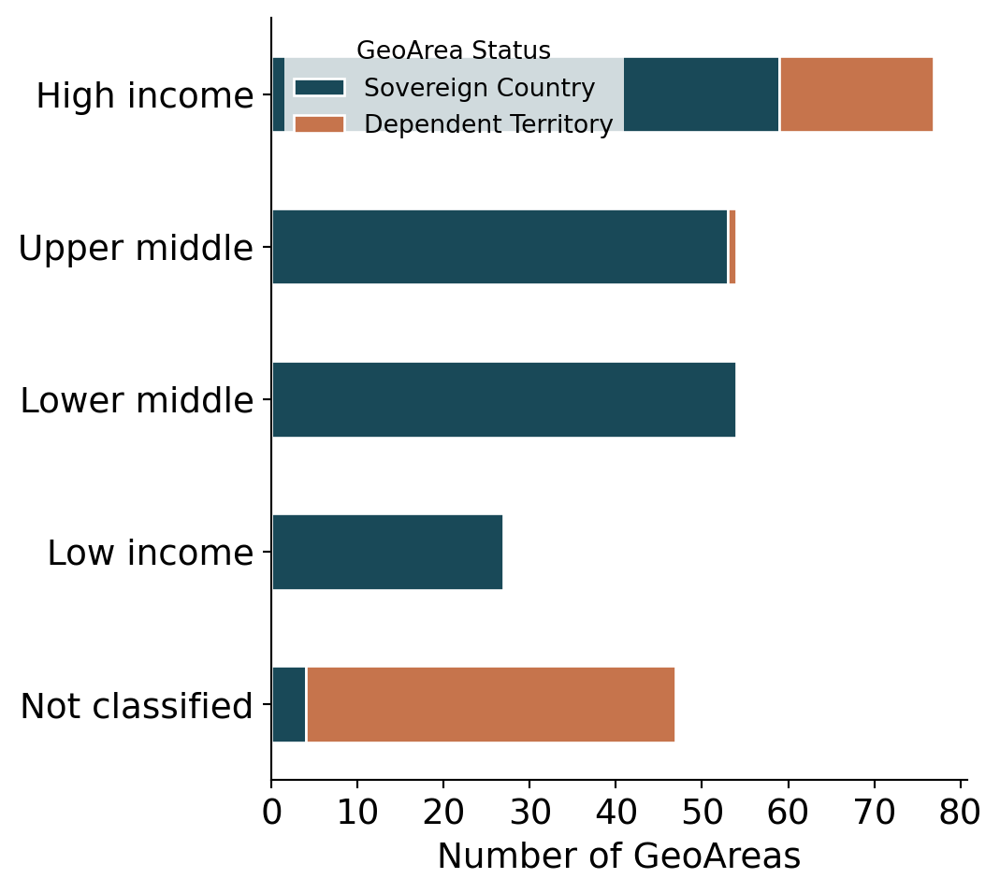

In [9]:
## Create horizontal bar plot

w = 960
h = 1080

figs = []
outs = []
for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_03,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='GeoArea Status',
              fontsize=10,
              title_fontsize=10)
    
    outputfigs(plt, fig, ax, region, section='1', letter='B1')

## **Fig B3** Country Ref: economies

In [10]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['geoarea', 'subregion', 'income_group_wb']].groupby(['subregion', 'income_group_wb'])
                                                                   .count()
                                                                   .rename(columns={'geoarea': 'count'})
                                                                   .reset_index()
                                                                   .pivot(columns='income_group_wb',
                                                                          index='subregion',
                                                                          values='count'))

    column_order = [
        'High income',
        'Upper middle income',
        'Lower middle income',
        'Low income',
        'Not classified',
    ]
    fig_data[region] = reorder_columns(fig_data[region], column_order, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)

    show_totals(fig_data[region])

income_group_wb,High income,Upper middle income,Lower middle income,Low income,Not classified,Total
subregion,,,,,,
Not classified,0.0,0.0,0.0,0.0,47.0,47.0
Low income,0.0,0.0,0.0,27.0,0.0,27.0
Lower middle,0.0,0.0,54.0,0.0,0.0,54.0
Upper middle,0.0,54.0,0.0,0.0,0.0,54.0
High income,77.0,0.0,0.0,0.0,0.0,77.0
Total,77.0,54.0,54.0,27.0,47.0,259.0


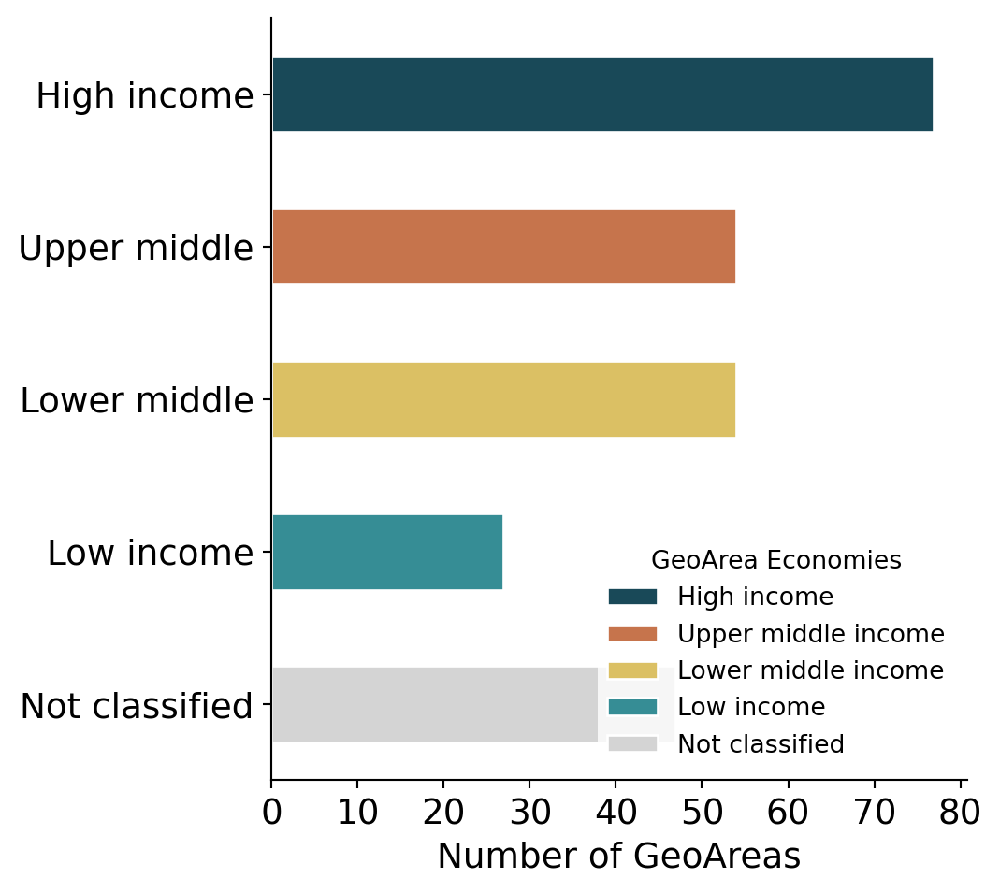

In [11]:
## Create horizontal bar plot 

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_04,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks), 
          title='GeoArea Economies', 
          fontsize=10, 
          title_fontsize=10)
    
    outputfigs(plt, fig, ax, region, section='1', letter='B2')

In [12]:
## Calculate fig data

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region]
                .groupby('subregion')[['survey_research','survey_alone','research_alone','no_data']]
                .sum()
                .reset_index())

    # Change subregion to index
    fig_data[region].set_index('subregion', inplace=True)

    fig_data[region].rename(
        {'survey_research': 'Survey & Research',
         'survey_alone':    'Survey Only',
         'research_alone':  'Research Only',
         'no_data':         'No Data'
        },
        axis=1,
        inplace=True
    )
    columnorder = [
        'Survey & Research',
        'Survey Only',
        'Research Only',
        'No Data'
    ]
    fig_data[region] = reorder_columns(fig_data[region], columnorder, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    show_totals(fig_data[region])

,Survey & Research,Survey Only,Research Only,No Data,Total
subregion,,,,,
High income,36,5,17,19,77
Upper middle,30,1,12,11,54
Lower middle,37,0,4,13,54
Low income,11,0,4,12,27
Not classified,4,0,25,18,47
Total,118,6,62,73,259


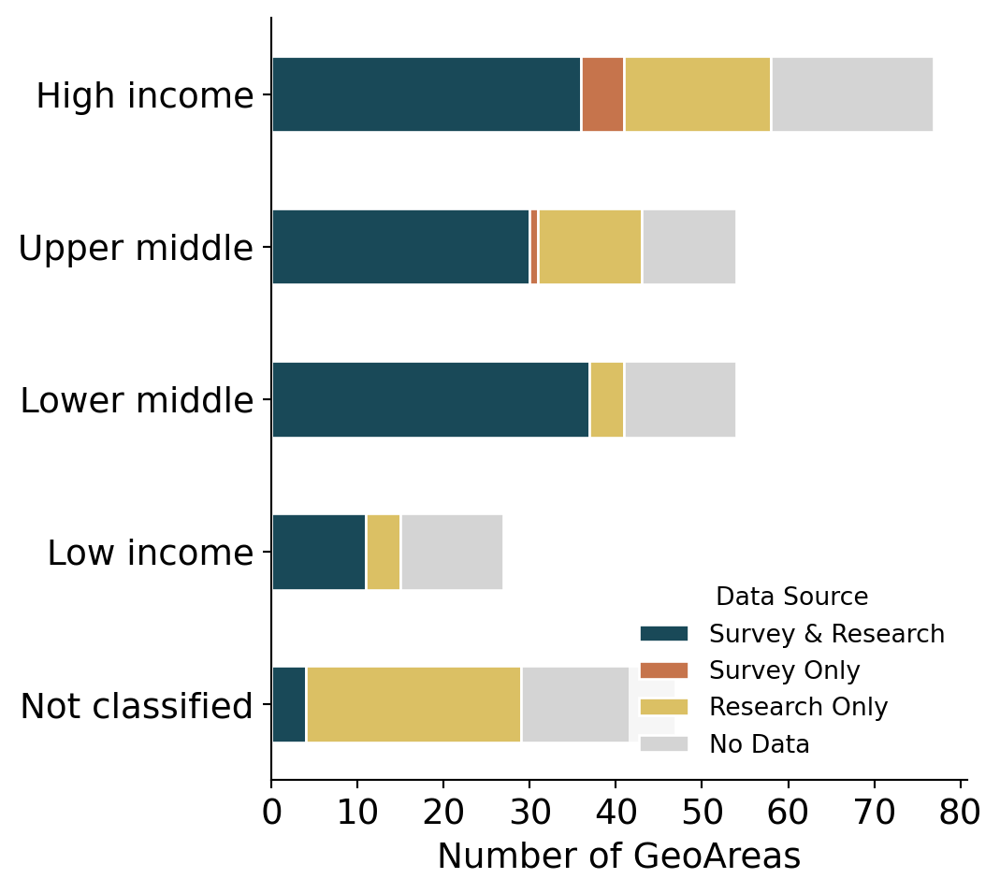

In [13]:
## Plot figure

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].loc[notTotalRow(fig_data[region]), :].iloc[::-1].plot(kind='barh', 
              stacked=True,
              fontsize=14,
              color=cat_03,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    ax.set_ylabel('')
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)

    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
          title='Data Source', 
          fontsize=10, 
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='1', letter='B3')

## **Fig C1** Q1 & Research: Country representation

In [14]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['geoarea', 'subregion', 'ocean']].groupby(['subregion', 'ocean'])
                                                            .count()
                                                            .rename(columns={'geoarea': 'count'})
                                                            .reset_index()
                                                            .pivot(columns='ocean',
                                                                   index='subregion',
                                                                   values='count'))

    fig_data[region].rename({
        'EEZ with Deep Ocean': 'EEZ with >1% deep ocean',
        'EEZ with no Deep Ocean': 'EEZ with <1% deep ocean',
        'No Ocean': 'No marine EEZ'},
        axis=1,
        inplace=True)
    columnorder = [
        'EEZ with >1% deep ocean',
        'EEZ with <1% deep ocean',
        'No marine EEZ'
    ]
    fig_data[region] = reorder_columns(fig_data[region], columnorder, createmissingcolumns=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    display(fig_data[region])
    show_totals(fig_data[region])

ocean,EEZ with >1% deep ocean,EEZ with <1% deep ocean,No marine EEZ
subregion,,,
High income,56.0,12.0,9.0
Upper middle,45.0,2.0,7.0
Lower middle,41.0,1.0,12.0
Low income,15.0,NaN,12.0
Not classified,46.0,NaN,1.0


ocean,EEZ with >1% deep ocean,EEZ with <1% deep ocean,No marine EEZ,Total
subregion,,,,
High income,56.0,12.0,9.0,77.0
Upper middle,45.0,2.0,7.0,54.0
Lower middle,41.0,1.0,12.0,54.0
Low income,15.0,0.0,12.0,27.0
Not classified,46.0,0.0,1.0,47.0
Total,203.0,15.0,41.0,259.0


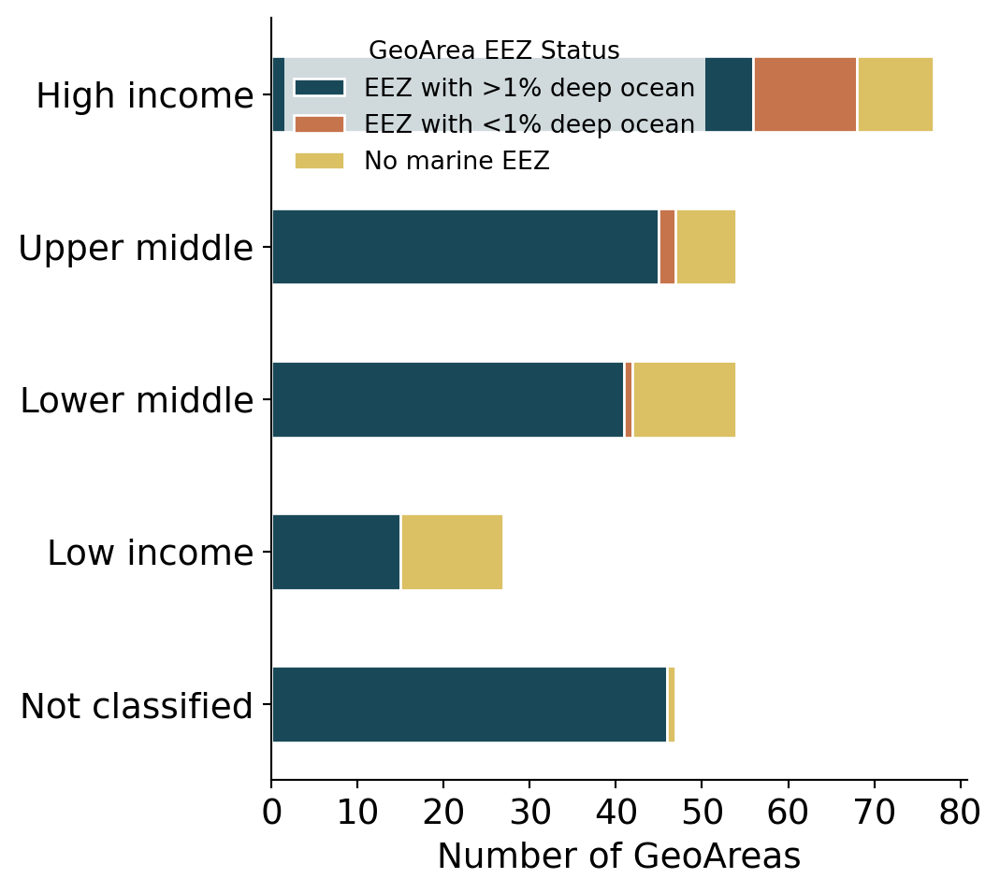

In [15]:
## Create horizontal bar plot 

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_03,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    ax.set_ylabel('')
    plt.locator_params(axis='x', integer=True)
    barh_pixel_fix(ax)

    loc_tweaks = {'Africa': 'upper right', 'Oceania': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks), 
              title='GeoArea EEZ Status', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='1', letter='C1')

## **Fig C2** Country Ref: EEZ depth zones

In [16]:
## Calculate values for plot

cols = ['geoarea', 
        'subregion', 
        'eez_area_0_to_200m', 
        'eez_area_200_to_1000m', 
        'eez_area_1000_to_2000m',
        'eez_area_2000_to_4000m', 
        'eez_area_4000_to_6000m', 
        'eez_area_deeper_than_6000m']

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][cols].groupby(['subregion'])
                                  .sum())

    # Rename columns
    fig_data[region].columns = ['200 m', '1000 m', '2000 m', '4000 m', '6000 m', '6000+ m']

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    # Sort depths as Katy specified
    sorted_cols = ['6000+ m', '6000 m', '4000 m', '2000 m', '1000 m', '200 m']
    fig_data[region] = fig_data[region][sorted_cols]

    # Add 200+
    fig_data[region]['200 m +'] = fig_data[region].loc[:, '6000+ m':'1000 m'].sum(axis=1)

    # Add total
    fig_data[region]['Total'] = (country_tableR[region][['geoarea', 'subregion', 'total_eez_area']]
                         .groupby('subregion')['total_eez_area']
                         .sum())
    fig_data[region].loc['Total'] = fig_data[region].sum()

    display(fig_data[region])

,6000+ m,6000 m,4000 m,2000 m,1000 m,200 m,200 m +,Total
subregion,,,,,,,,
High income,7.101973e+05,1.733895e+07,1.557477e+07,5.401811e+06,6.333756e+06,1.077812e+07,4.535948e+07,5.613760e+07
Upper middle,2.371397e+05,7.594125e+06,1.137647e+07,2.766741e+06,2.837102e+06,8.637605e+06,2.481158e+07,NaN
Lower middle,2.883778e+05,9.327453e+06,9.410363e+06,3.082766e+06,1.841748e+06,4.354966e+06,2.395071e+07,NaN
Low income,0.000000e+00,1.154294e+06,1.409714e+06,5.184506e+05,3.358502e+05,5.399122e+05,3.418309e+06,3.958221e+06
Not classified,1.100080e+05,7.079744e+06,6.823198e+06,9.065677e+05,8.065749e+05,7.050542e+05,1.572609e+07,1.643115e+07
Total,1.345723e+06,4.249456e+07,4.459452e+07,1.267634e+07,1.215503e+07,2.501566e+07,1.132662e+08,7.652697e+07


In [17]:
## Calculate additional statistics

for region in region_list:
    print('')
    display(Markdown(region))
    print('Total area of EEZs in region (sq km): {}'.format(country_tableR[region]['total_eez_area'].sum().astype('int64')))
    print("Total Area of deep ocean within region's EEZs (sq km): {}".format(
        country_tableR[region]['eez_deeper_than_200'].sum().astype('int64')))
    print('Percent of deep ocean vs total EEZ area within region: {:2.2%}'.format(
        ((country_tableR[region]['eez_deeper_than_200'].sum()/country_tableR[region]['total_eez_area'].sum()))))

    names = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 0]
             .to_list())
    print('Names of GeoAreas with 5 biggest **deep** EEZs in region: ' + ', '.join(names))

    areas = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 1]
             .to_list())
    print('Area of each of 5 biggest **deep** EEZs in region (sq km): ' + ', '.join(list(map(lambda n: '{:.1f}'.format(n), areas))))

Economies

Total area of EEZs in region (sq km): 138281827
Total Area of deep ocean within region's EEZs (sq km): 113266171
Percent of deep ocean vs total EEZ area within region: 81.91%
Names of GeoAreas with 5 biggest **deep** EEZs in region: United States of America, Australia, French Polynesia, Indonesia, New Zealand
Area of each of 5 biggest **deep** EEZs in region (sq km): 6441221.7, 5219223.6, 4746873.8, 4113002.6, 3829570.2


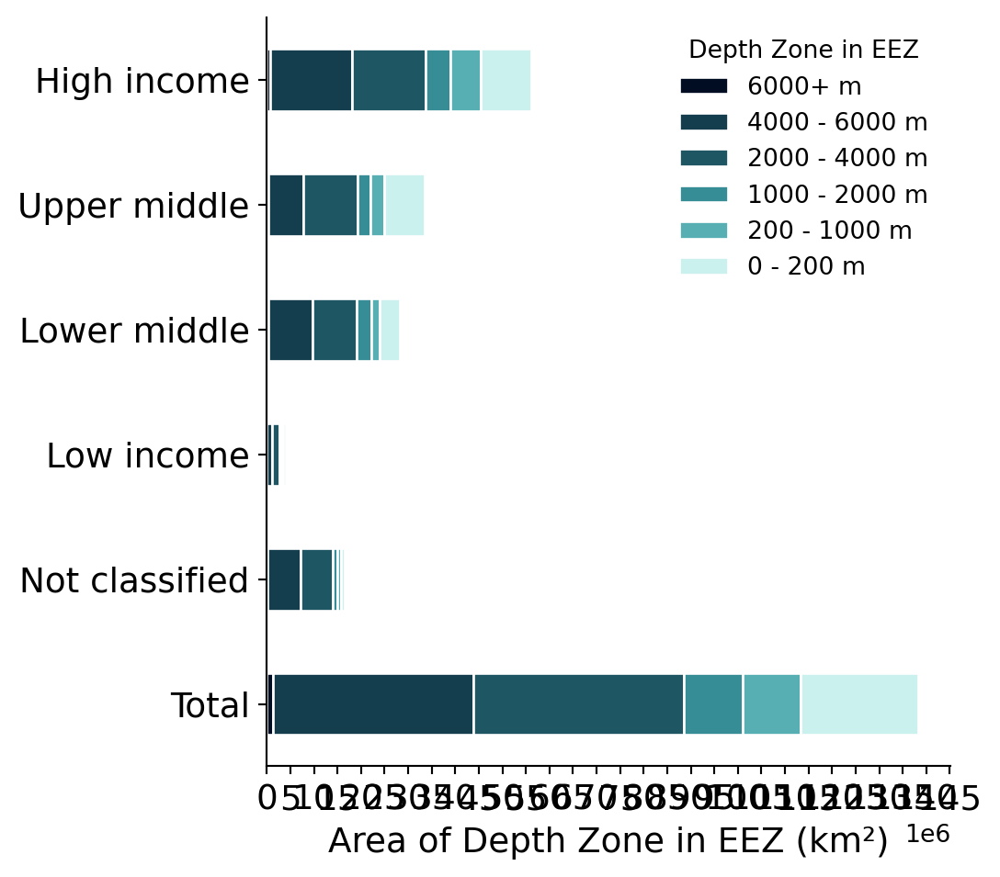

In [18]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].loc[:, '6000+ m':'200 m'].plot(kind='barh', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=val_06,
              edgecolor='white',
              ax=ax)
    barh_pixel_fix(ax)
    ax.set_xlabel('Area of Depth Zone in EEZ (km²)', fontsize=14)
    ax.set_ylabel('')

    ax.ticklabel_format(axis='x', style='sci', scilimits=(6, 6))
    loc = matplotlib.ticker.MultipleLocator(base=5000000)
    ax.xaxis.set_major_locator(loc)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count < 5:
        loc = matplotlib.ticker.MultipleLocator(base=1000000)
        ax.xaxis.set_major_locator(loc)
    elif xtick_count < 6:
        loc = matplotlib.ticker.MultipleLocator(base=2000000)
        ax.xaxis.set_major_locator(loc)

    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
          labels=['6000+ m',
                  '4000 - 6000 m',
                  '2000 - 4000 m',
                  '1000 - 2000 m',
                  '200 - 1000 m',
                  '0 - 200 m'], 
          title='Depth Zone in EEZ', 
          fontsize=10, 
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='1', letter='C2')

## **Fig C3**

In [19]:
## Calculate values for plot

renames = {
    'eez_area_0_to_200m':         '0 - 200', 
    'eez_area_200_to_1000m':      '200 - 1000', 
    'eez_area_1000_to_2000m':     '1000 - 2000',
    'eez_area_2000_to_4000m':     '2000 - 4000', 
    'eez_area_4000_to_6000m':     '4000 - 6000', 
    'eez_area_deeper_than_6000m': '6000+'
}
cols = list(renames.keys())

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][cols]
                                  .sum())
    # Rename columns
    fig_data[region] = fig_data[region].rename(index=renames)

    display(fig_data[region])

0 - 200        2.501566e+07
200 - 1000     1.215503e+07
1000 - 2000    1.267634e+07
2000 - 4000    4.459452e+07
4000 - 6000    4.249456e+07
6000+          1.345723e+06
dtype: float64

In [20]:
## Calculate additional statistics

for region in region_list:
    print('')
    display(Markdown(region))
    print('Total area of EEZs in region (sq km): {}'.format(country_tableR[region]['total_eez_area'].sum().astype('int64')))
    print("Total Area of deep ocean within region's EEZs (sq km): {}".format(
        country_tableR[region]['eez_deeper_than_200'].sum().astype('int64')))
    print('Percent of deep ocean vs total EEZ area within region: {:2.2%}'.format(
        ((country_tableR[region]['eez_deeper_than_200'].sum()/country_tableR[region]['total_eez_area'].sum()))))

    names = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 0]
             .to_list())
    print('Names of GeoAreas with 5 biggest **deep** EEZs in region: ' + ', '.join(names))

    areas = (country_tableR[region][['geoarea', 'eez_deeper_than_200']]
             .sort_values(by='eez_deeper_than_200', ascending=False).iloc[0:5, 1]
             .to_list())
    print('Area of each of 5 biggest **deep** EEZs in region (sq km): ' + ', '.join(list(map(lambda n: '{:.1f}'.format(n), areas))))

Economies

Total area of EEZs in region (sq km): 138281827
Total Area of deep ocean within region's EEZs (sq km): 113266171
Percent of deep ocean vs total EEZ area within region: 81.91%
Names of GeoAreas with 5 biggest **deep** EEZs in region: United States of America, Australia, French Polynesia, Indonesia, New Zealand
Area of each of 5 biggest **deep** EEZs in region (sq km): 6441221.7, 5219223.6, 4746873.8, 4113002.6, 3829570.2


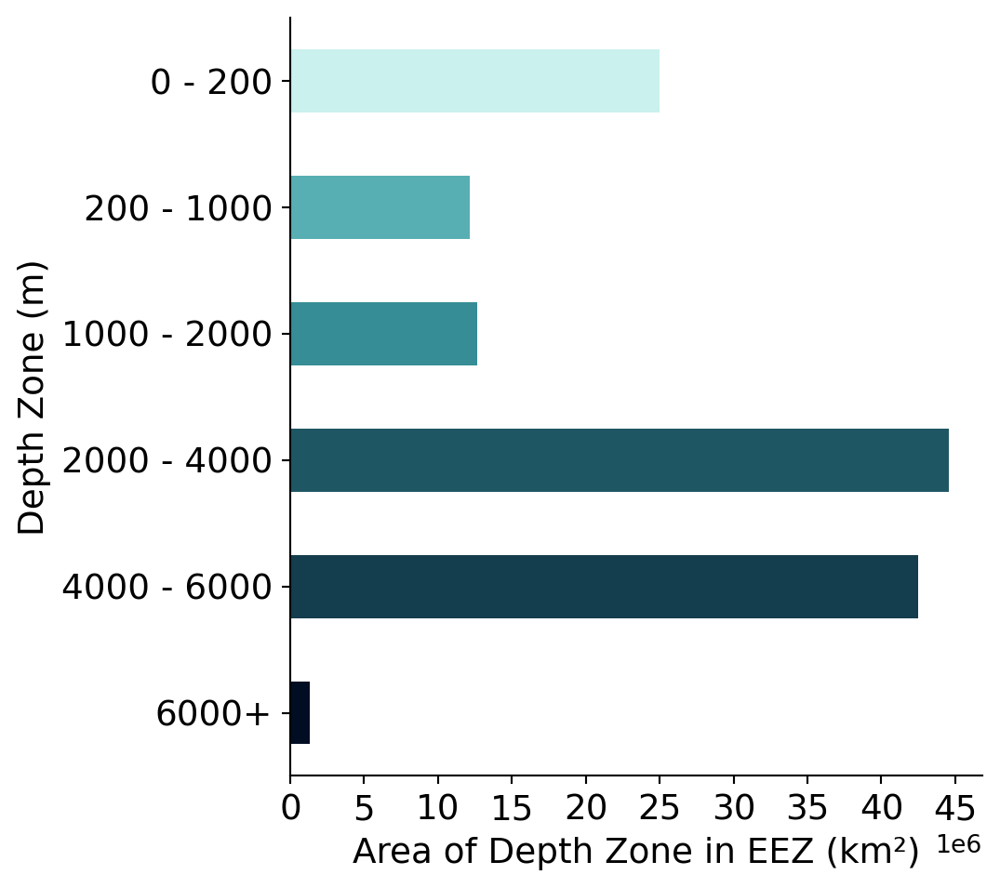

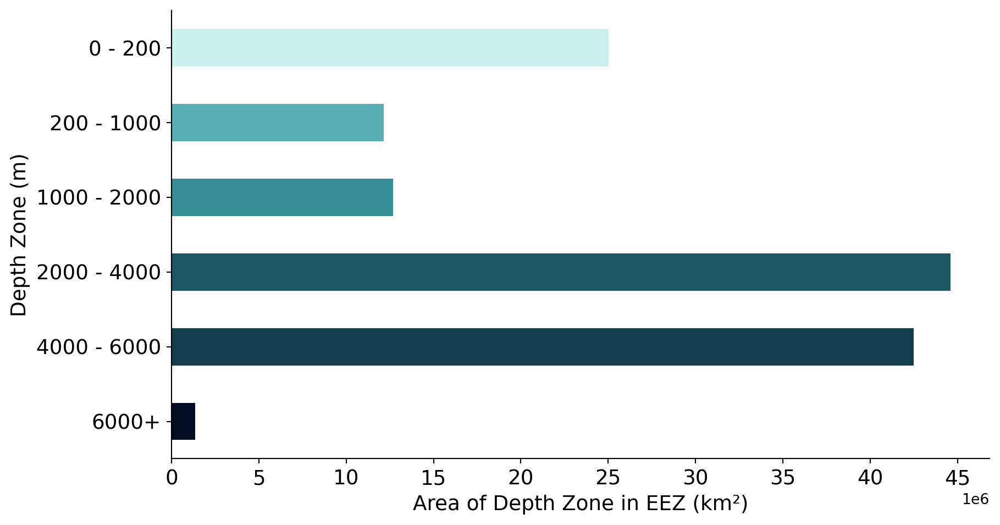

In [21]:
## Create plots

for region in region_list:
    w = 960
    h = 1080
    
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].plot(kind='barh', 
              fontsize=14,
              color=val_06,
              ax=ax)
    ax.set_xlabel('Area of Depth Zone in EEZ (km²)', fontsize=14)
    ax.set_ylabel('Depth Zone (m)', fontsize=14)

    ax.ticklabel_format(axis='x', style='sci', scilimits=(6, 6))
    loc = matplotlib.ticker.MultipleLocator(base=5000000)
    ax.xaxis.set_major_locator(loc)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count < 5:
        loc = matplotlib.ticker.MultipleLocator(base=1000000)
        ax.xaxis.set_major_locator(loc)
    elif xtick_count < 6:
        loc = matplotlib.ticker.MultipleLocator(base=2000000)
        ax.xaxis.set_major_locator(loc)

    outputfigs(plt, fig, ax, region, section='1', letter='C3')


    ### C4 - same graph in a wider size

    w = 1920
    h = 1080
    
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].iloc[::-1].plot(kind='barh', 
              fontsize=14,
              color=val_06,
              ax=ax)
    ax.set_xlabel('Area of Depth Zone in EEZ (km²)', fontsize=14)
    ax.set_ylabel('Depth Zone (m)', fontsize=14)

    ax.ticklabel_format(axis='x', style='sci', scilimits=(6, 6))
    loc = matplotlib.ticker.MultipleLocator(base=5000000)
    ax.xaxis.set_major_locator(loc)
    xtick_count = len(ax.get_xticklabels())
    if xtick_count < 5:
        loc = matplotlib.ticker.MultipleLocator(base=1000000)
        ax.xaxis.set_major_locator(loc)
    elif xtick_count < 6:
        loc = matplotlib.ticker.MultipleLocator(base=2000000)
        ax.xaxis.set_major_locator(loc)

    outputfigs(plt, fig, ax, region, section='1', letter='C4')

---
# **Section 2** Demographics

## Q1 & Q40: Country representation

In [22]:
## Calculate statistics

region_data = {}
for region in region_list:
    region_data[region] = dataR[region][(dataR[region]['question'] == 'Q1') &
                 ~(dataR[region]['col_name'].str.endswith('other'))]

    display(Markdown('**'+region+'**'))
    print('Number of complete responses from region: {}'.format(region_data[region].shape[0]))
    print('Number of complete responses from each subregion:')
    #Because 'subregion' is wrong in the data spreadsheet. the true subregions are in the 'subregion' column, for some reason. ??
    display(region_data[region].groupby('subregion')['respondent_id'].count())

    print('Number of GeoAreas that submitted responses for region: {}'.format(region_data[region]['selection'].nunique()))

    print('Number of GeoAreas that submitted responses for each subregion:')
    display(region_data[region][['subregion', 'selection']].drop_duplicates().groupby('subregion')['selection'].nunique())

**Economies**

Number of complete responses from region: 360
Number of complete responses from each subregion:


subregion
High income            136
Low income              24
Lower middle income    107
Not classified          18
Upper middle income     75
Name: respondent_id, dtype: int64

Number of GeoAreas that submitted responses for region: 124
Number of GeoAreas that submitted responses for each subregion:


subregion
High income            41
Low income             11
Lower middle income    37
Not classified          4
Upper middle income    31
Name: selection, dtype: int64

In [23]:
for region in region_list:
    print('Number of GeoAreas that submitted responses for region {}: {}'.format(region, region_data[region]['selection'].nunique()))

Number of GeoAreas that submitted responses for region Economies: 124


In [24]:
for region in region_list:
    print()
    print('Number of GeoAreas that submitted responses for each subregion in {}:'.format(region))
    display(region_data[region][['subregion', 'selection']].drop_duplicates().groupby('subregion')['selection'].nunique())


Number of GeoAreas that submitted responses for each subregion in Economies:


subregion
High income            41
Low income             11
Lower middle income    37
Not classified          4
Upper middle income    31
Name: selection, dtype: int64

In [25]:
for region in region_list:
    display(Markdown('**'+region+'**'))
    mode = region_data[region].groupby('geoarea')['respondent_id'].count().value_counts()
    if (mode.size):
        print('{mode} response was most common, and there were {num} GeoAreas that submitted {mode} each.'.format(
            mode=mode.index[0], num=mode.iloc[0]))
    else:
        print('no responses for region', region)
    print('3 GeoAreas that submitted the most, and how many:')
    top3 = region_data[region].groupby('geoarea')['respondent_id'].count().sort_values(ascending=False).iloc[0:3]
    display(top3)

**Economies**

1 response was most common, and there were 50 GeoAreas that submitted 1 each.
3 GeoAreas that submitted the most, and how many:


geoarea
United States of America    34
Republic of Korea           11
Venezuela                   11
Name: respondent_id, dtype: int64

In [26]:
for region in region_list:
    print()
    display(Markdown('**'+region+'**'))
    q1_q40_comparison = dataR[region].loc[(dataR[region]['question'] == 'Q40') &
                            ~(dataR[region]['col_name'].str.endswith('other')), ['respondent_id',
                                                                         'subregion',
                                                                         'selection_other', 
                                                                         'geoarea']]
    exceptions = q1_q40_comparison[q1_q40_comparison['selection_other'] != q1_q40_comparison['geoarea']]

    if region_data[region].shape[0] > 0:
        print('Responses from people living in-country: {:.0%}'.format(
            round(((region_data[region].shape[0] - exceptions.shape[0])/region_data[region].shape[0]), 2)))
    else:
        print('zero responses for region', region)
        continue

    for subregion in orderR[region]:
        rd = region_data[region]
        count_all = rd[rd['subregion'] == subregion].shape[0]
        count_exceptions = exceptions[exceptions['subregion'] == subregion].shape[0]
        if (count_all > 0):
            responses = ((count_all - count_exceptions) / count_all)
            print('Responses for '+subregion+': {:.0%}'.format(round(responses, 2)))
        else:
            print('zero responses for subregion '+subregion)

**Economies**

Responses from people living in-country: 90%
Responses for High income: 92%
Responses for Upper middle income: 89%
Responses for Lower middle income: 91%
Responses for Low income: 88%
Responses for Not classified: 78%


## **Fig D2** Q41: Gender

In [27]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    gender = dataR[region].loc[dataR[region]['col_name'] == 'Q41', ['respondent_id', 'subregion', 'selection']]


    fig_data[region] = (gender.groupby(['subregion', 'selection'])
                  .count()
                  .rename(columns={'respondent_id': 'count'})
                  .reset_index()
                  .pivot(columns='subregion',
                         index='selection',
                         values='count'))

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    fig_data[region] = reorder_rows_and_rename(
        fig_data[region],
        [
            ['Male',                 'Male'],
            ['Female',               'Female'],
            ['Gender fluid',         'Fluid'],
            ['Agender',              'Agender'],
            ['Prefer not to answer', 'NR']
        ],
        createmissingrows=True
    )

    num_respondents = gender.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Male
Adding missing row Female
Adding missing row Gender fluid
Adding missing row Agender
Adding missing row Prefer not to answer


subregion,High income,Upper middle,Lower middle,Low income,Not classified,Total
Male,0.0,0.0,0.0,0.0,0.0,0.0
Female,0.0,0.0,0.0,0.0,0.0,0.0
Fluid,0.0,0.0,0.0,0.0,0.0,0.0
Agender,0.0,0.0,0.0,0.0,0.0,0.0
NR,0.0,0.0,0.0,0.0,0.0,0.0
Total,0.0,0.0,0.0,0.0,0.0,0.0


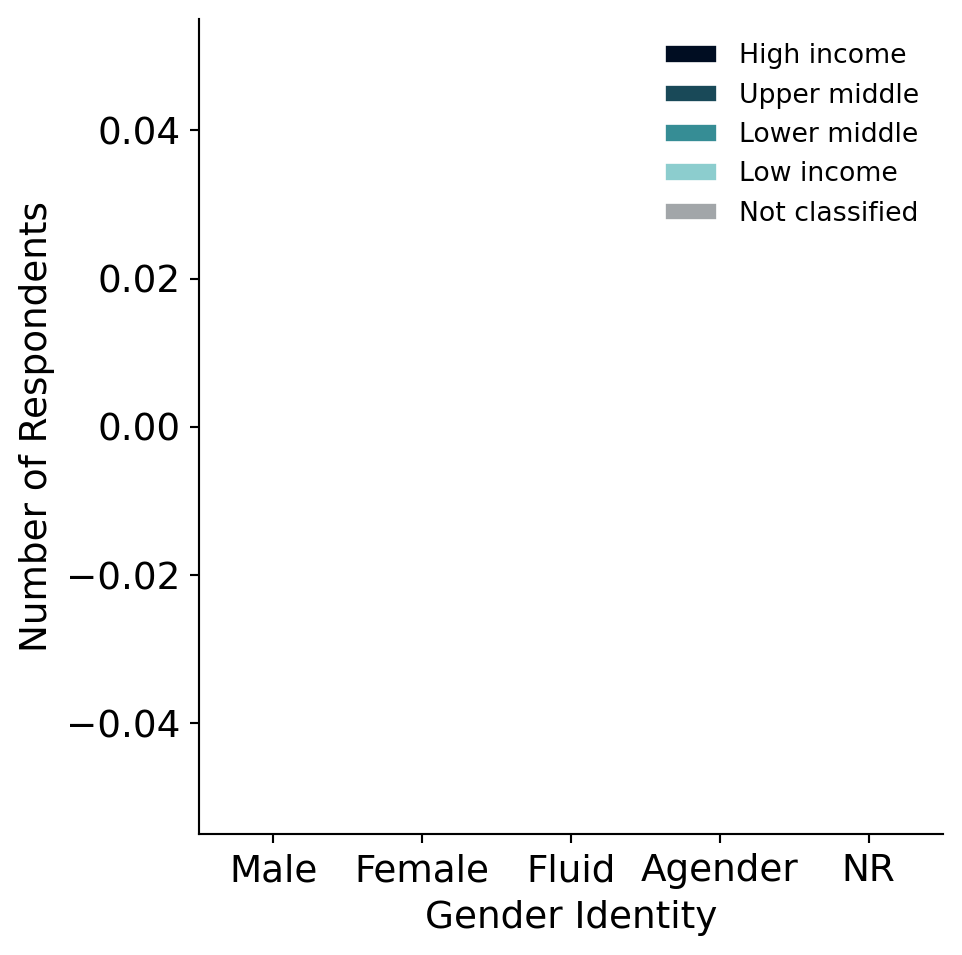

In [28]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
              stacked=True,
              legend=True,
              fontsize=14,
              rot=0,
              color=cat_d23e123_by_region[region],
              edgecolor='white',
              ax=ax)

    ax.set_xlabel('Gender Identity', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              #title='Subregion', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='D2')

## **Fig D3** Q39: Age

In [29]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    age = dataR[region].loc[dataR[region]['col_name'] == 'Q39', ['respondent_id', 'subregion', 'selection']]

    fig_data[region] = (age.groupby(['subregion', 'selection'])
               .count()
               .rename(columns={'respondent_id': 'count'})
               .reset_index()
               .pivot(columns='subregion',
                      index='selection',
                      values='count'))

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    num_respondents = age.shape[0]
    show_totals(fig_data[region], num_respondents)

subregion,High income,Upper middle,Lower middle,Low income,Not classified,Total
selection,,,,,,
,136,75,107,24,18,360
Total,136,75,107,24,18,360


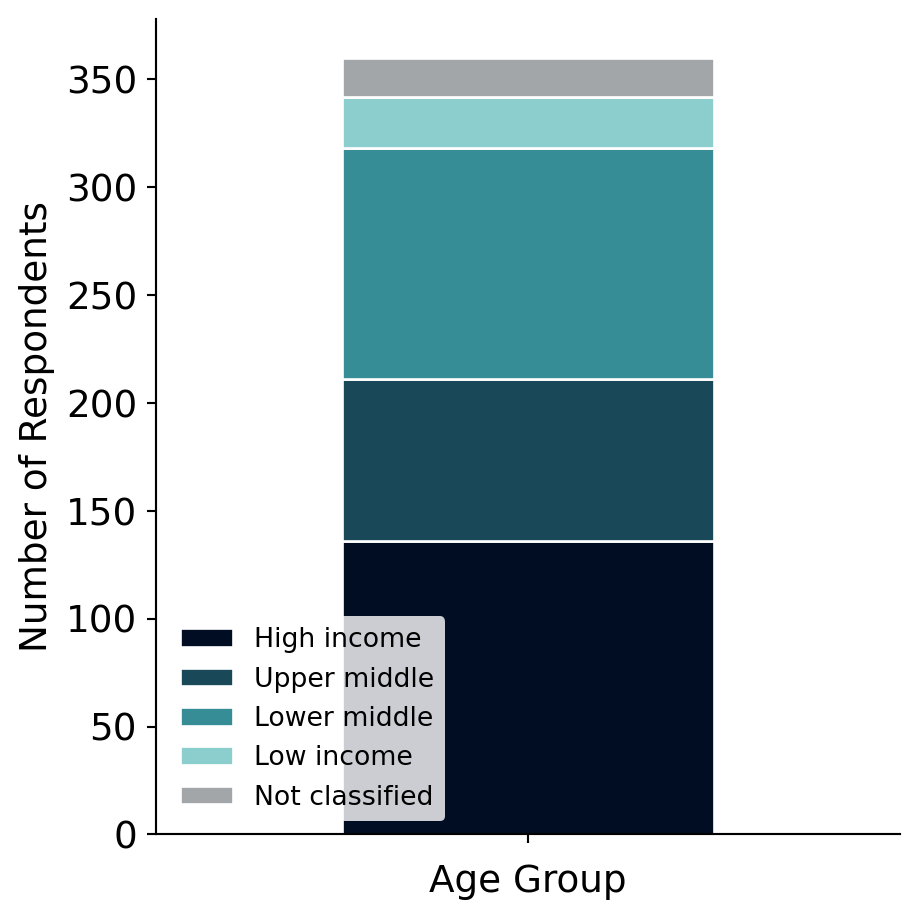

In [30]:
# Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Age Group', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='D3')

## Fig E - Q42: Education

In [31]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    education = dataR[region].loc[dataR[region]['col_name'] == 'Q42', ['respondent_id', 'subregion', 'selection_survey_clean']]
    education['education'] = education['selection_survey_clean'].copy()

    fig_data[region] = (education.groupby(['subregion', 'education'])
                         .count()
                         .rename(columns={'respondent_id': 'count'})
                         .reset_index()
                         .pivot(columns='subregion',
                                index='education',
                                values='count'))

    fig_data[region] = reorder_rows_and_rename(
        fig_data[region],
        [
            ['Doctoral Degree',    'PhD'],
            ['Master\'s Degree',   'MS'],
            ['Bachelor\'s Degree', 'BS'],
            ['Other',              'Other']
        ],
        createmissingrows=True,
        warnonly=True,
        ignorerows=ignoreR.get(region)
    )
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    display(fig_data[region])
    num_respondents = education.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Doctoral Degree
Adding missing row Master's Degree
Adding missing row Bachelor's Degree
Adding missing row Other


subregion,High income,Upper middle,Lower middle,Low income,Not classified
PhD,NaN,NaN,NaN,NaN,NaN
MS,NaN,NaN,NaN,NaN,NaN
BS,NaN,NaN,NaN,NaN,NaN
Other,NaN,NaN,NaN,NaN,NaN


subregion,High income,Upper middle,Lower middle,Low income,Not classified,Total
PhD,0.0,0.0,0.0,0.0,0.0,0.0
MS,0.0,0.0,0.0,0.0,0.0,0.0
BS,0.0,0.0,0.0,0.0,0.0,0.0
Other,0.0,0.0,0.0,0.0,0.0,0.0
Total,0.0,0.0,0.0,0.0,0.0,0.0


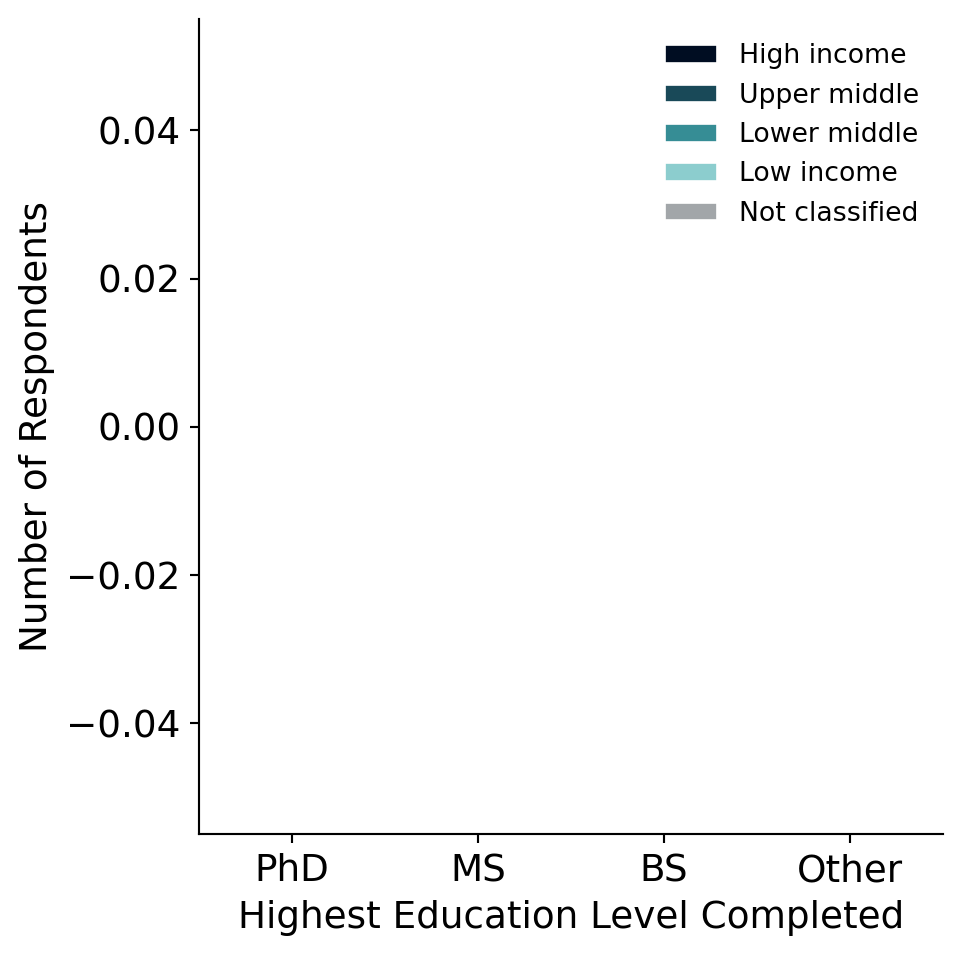

In [32]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Highest Education Level Completed', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              #title='Subregion', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='E1')

### Q43: Sector

In [33]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    # Select relevant survey data
    sector = dataR[region].loc[dataR[region]['col_name'] == 'Q43', ['respondent_id', 'subregion', 'selection_survey_clean']]
    sector['sector'] = sector['selection_survey_clean'].copy()

    fig_data[region] = (sector.groupby(['subregion', 'sector'])
                      .count()
                      .rename(columns={'respondent_id': 'count'})
                      .reset_index()
                      .pivot(columns='subregion',
                             index='sector',
                             values='count'))

    fig_data[region] = reorder_rows_and_rename(
        fig_data[region], [
            ['Academia',   'Acad'],
            ['Government', 'Gov'],
            ['Non-profit', 'NFP'],
            ['NGO',        'NGO'],
            ['Other',      'Other']
        ],
        createmissingrows=True
    )

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    
    display(fig_data[region])
    num_respondents = sector.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Academia
Adding missing row Government
Adding missing row Non-profit
Adding missing row NGO
Adding missing row Other


subregion,High income,Upper middle,Lower middle,Low income,Not classified
Acad,NaN,NaN,NaN,NaN,NaN
Gov,NaN,NaN,NaN,NaN,NaN
NFP,NaN,NaN,NaN,NaN,NaN
NGO,NaN,NaN,NaN,NaN,NaN
Other,NaN,NaN,NaN,NaN,NaN


subregion,High income,Upper middle,Lower middle,Low income,Not classified,Total
Acad,0.0,0.0,0.0,0.0,0.0,0.0
Gov,0.0,0.0,0.0,0.0,0.0,0.0
NFP,0.0,0.0,0.0,0.0,0.0,0.0
NGO,0.0,0.0,0.0,0.0,0.0,0.0
Other,0.0,0.0,0.0,0.0,0.0,0.0
Total,0.0,0.0,0.0,0.0,0.0,0.0


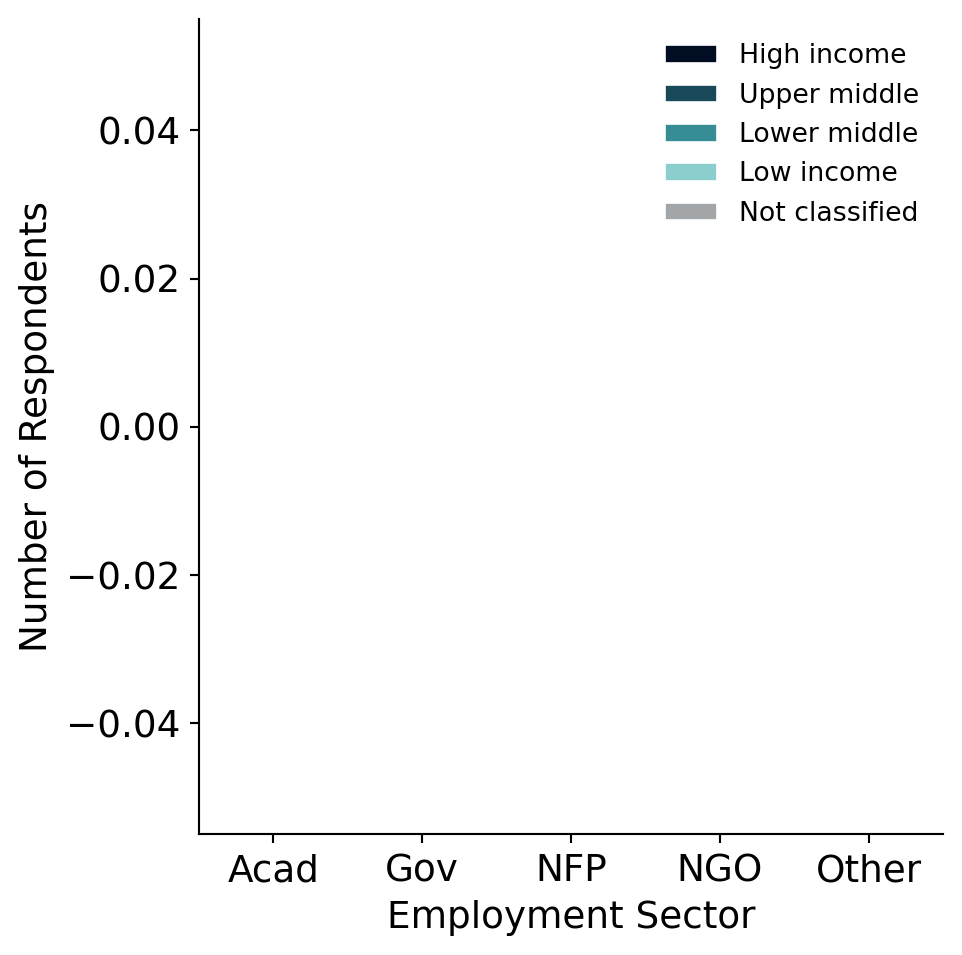

In [34]:
## Create plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar',
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Employment Sector', fontsize=14)
    ax.set_ylabel('Number of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              #title='Subregion', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='E2')

### Q5: Roles

In [35]:
## Calculate values for plot

fig_data = {}
for region in region_list:
    roles = dataR[region].loc[(dataR[region]['question'] == 'Q5') &
                 (dataR[region]['selection_survey_clean'] != ''), ['respondent_id', 'subregion', 'col_name', 'selection_survey_clean']]
    roles['roles'] = roles['selection_survey_clean'].copy()

    fig_data[region] = (roles.groupby(['subregion', 'roles'])
                     .count()
                     .rename(columns={'respondent_id': 'count'})
                     .reset_index()
                     .pivot(columns='subregion',
                            index='roles',
                            values='count'))

    order = [
        ['Scientist/Researcher',        'Sci'],
        ['Education/Outreach',          'Edu'],
        ['Conservation/Advocacy',       'Cons'],
        ['Policy/Law/Management',       'Mgt'],
        ['Student/Early Career',        'ECR'],
        ['Engineering/Technology',      'Eng'],
        ['Developing Nation/Community', 'Dev'],
        ['Aquatics/Recreation',         'Aqua'],
        ['Traditional Knowledge',       'TEK'],
        ['Government',                  'Gov'],
        ['Other',                       'Other']
    ]
    fig_data[region] = reorder_rows_and_rename(fig_data[region], order, createmissingrows=True)
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    display(fig_data[region])
    num_respondents = roles.shape[0]
    show_totals(fig_data[region], num_respondents)

Adding missing row Scientist/Researcher
Adding missing row Education/Outreach
Adding missing row Conservation/Advocacy
Adding missing row Policy/Law/Management
Adding missing row Student/Early Career
Adding missing row Engineering/Technology
Adding missing row Developing Nation/Community
Adding missing row Aquatics/Recreation
Adding missing row Traditional Knowledge
Adding missing row Government
Adding missing row Other
Adding missing column High income
Adding missing column Upper middle income
Adding missing column Lower middle income
Adding missing column Low income
Adding missing column Not classified


subregion,High income,Upper middle,Lower middle,Low income,Not classified
Sci,NaN,NaN,NaN,NaN,NaN
Edu,NaN,NaN,NaN,NaN,NaN
Cons,NaN,NaN,NaN,NaN,NaN
Mgt,NaN,NaN,NaN,NaN,NaN
ECR,NaN,NaN,NaN,NaN,NaN
Eng,NaN,NaN,NaN,NaN,NaN
Dev,NaN,NaN,NaN,NaN,NaN
Aqua,NaN,NaN,NaN,NaN,NaN
TEK,NaN,NaN,NaN,NaN,NaN
Gov,NaN,NaN,NaN,NaN,NaN


subregion,High income,Upper middle,Lower middle,Low income,Not classified,Total
Sci,0.0,0.0,0.0,0.0,0.0,0.0
Edu,0.0,0.0,0.0,0.0,0.0,0.0
Cons,0.0,0.0,0.0,0.0,0.0,0.0
Mgt,0.0,0.0,0.0,0.0,0.0,0.0
ECR,0.0,0.0,0.0,0.0,0.0,0.0
Eng,0.0,0.0,0.0,0.0,0.0,0.0
Dev,0.0,0.0,0.0,0.0,0.0,0.0
Aqua,0.0,0.0,0.0,0.0,0.0,0.0
TEK,0.0,0.0,0.0,0.0,0.0,0.0
Gov,0.0,0.0,0.0,0.0,0.0,0.0


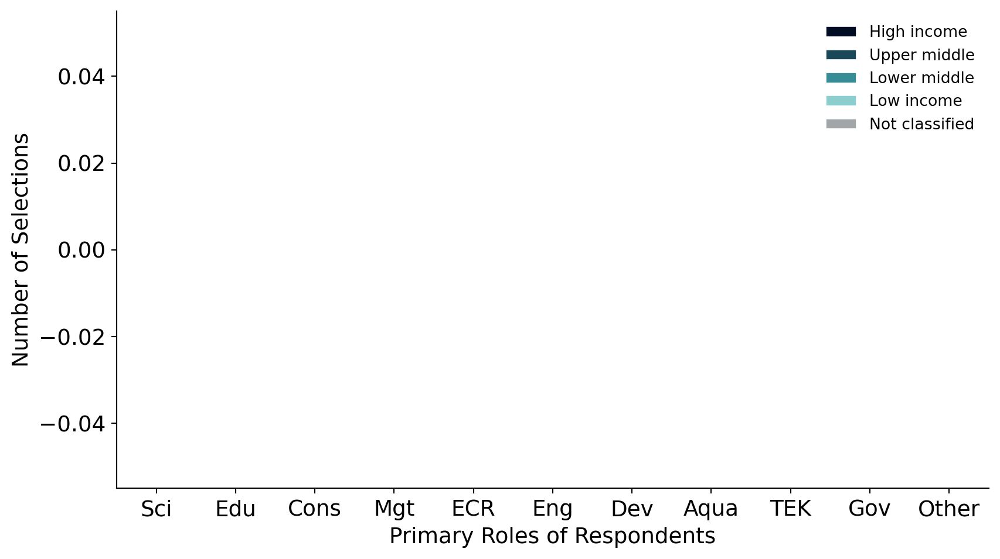

In [36]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  rot=0,
                  fontsize=14,
                  color=cat_d23e123_by_region[region],
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Primary Roles of Respondents', fontsize=14)
    ax.set_ylabel('Number of Selections', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='E3')

## Fig F - Q6: Field Work Environment

In [37]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    field_work = dataR[region].loc[dataR[region]['question'] == 'Q6', 
                      ['respondent_id', 'subregion', 'selection_survey_clean']]
    field_work = field_work[field_work['selection_survey_clean'] != '']
    
    covariate = 'subregion'

    selection_list = field_work['selection_survey_clean'].unique().tolist()
    selection_list.sort()

    fig_data[region] = (field_work.groupby([covariate, 'selection_survey_clean'])['respondent_id']
                      .count()
                      .rename('count')
                      .reset_index())
    
    renames = {
        'Inshore':                                 'Inshore',
        'Nearshore (within 3 miles of the coast)': 'Nearshore',
        'On the continental shelf (~<200 m)':      'Continental Shelf',
        'Deep water (>200 m)':                     'Deepwater',
        'Other':                                   'Other',
        'None of the above':                       'None of the above',
    }
    hue_order = renames.values()
    fig_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

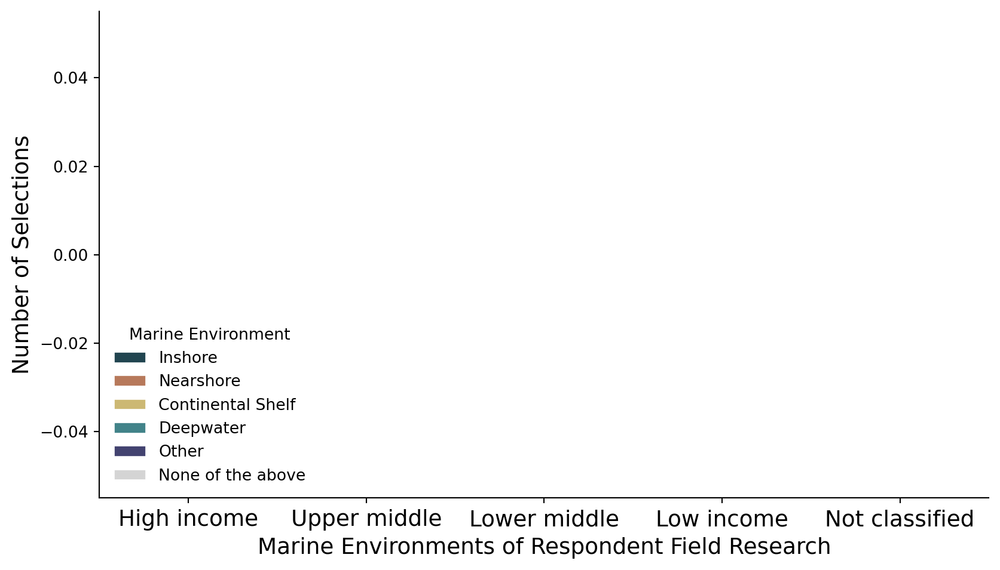

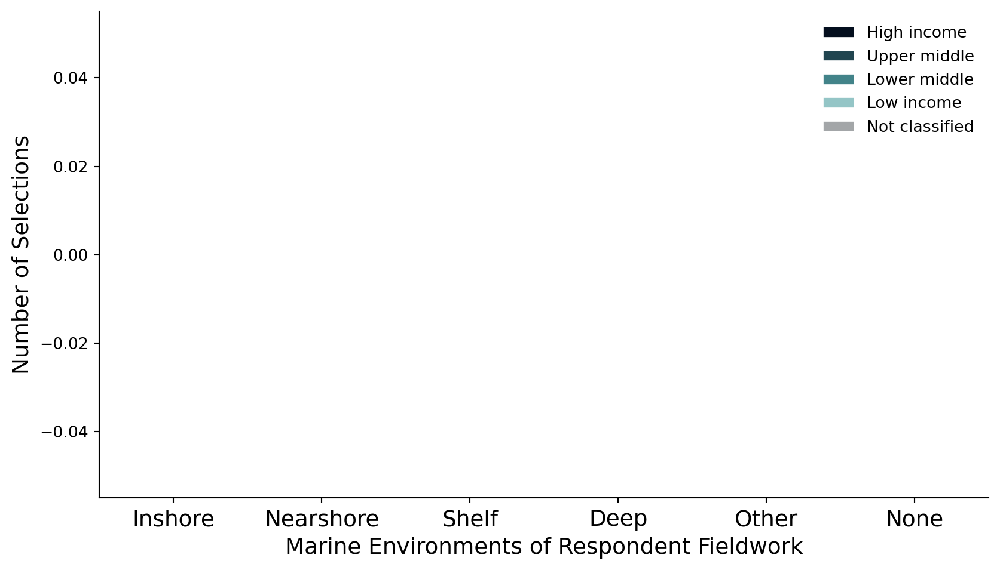

In [38]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='count',
                     order=label_order[region],
                     hue='selection_survey_clean',
                     hue_order=hue_order,
                     palette=cat_05,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set_xlabel('Marine Environments of Respondent Field Research', fontsize=14)
    ax.set_ylabel('Number of Selections', fontsize=14)
    plt.locator_params(axis='y', integer=True)
    loc_tweaks = {'Africa': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Marine Environment',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='F1')
    
    ## F2
    
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='count',
                     order=hue_order,
                     hue='subregion',
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(['Inshore', 'Nearshore', 'Shelf', 'Deep', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_xlabel('Marine Environments of Respondent Fieldwork', fontsize=14)
    ax.set_ylabel('Number of Selections', fontsize=14)
    plt.locator_params(axis='y', integer=True)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='2', letter='F2')

---
# **Section 3**

## Fig G - Q4a: Importance

In [39]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Strongly disagree', 'Disagree', "I don't agree or disagree", 'Agree', 'Strongly agree']

importance = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    importance[region] = dataR[region].loc[dataR[region]['col_name'] == 'Q4_importance', 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Strongly disagree': 'Strongly disagree',
                      '2 - Disagree': 'Disagree',
                      "3 - I don't agree or disagree": "I don't agree or disagree",
                      '4 - Agree': 'Agree',
                      '5 - Strongly agree': 'Strongly agree'}, inplace=True)

    display(fig_data[region].head())

subregion,High income,Upper middle,Lower middle,Low income,Not classified
respondent_id,,,,,
12393972654,I don't agree or disagree,NaN,NaN,NaN,NaN
12410372842,NaN,NaN,Agree,NaN,NaN
12413837013,Disagree,NaN,NaN,NaN,NaN
12413981730,NaN,Disagree,NaN,NaN,NaN
12535759742,Agree,NaN,NaN,NaN,NaN


In [40]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion                     High income Low income Lower middle income   
selection                                                                  
1 - Strongly disagree                12.0        3.0                11.0   
2 - Disagree                         29.0        5.0                19.0   
3 - I don't agree or disagree        22.0        NaN                12.0   
4 - Agree                            57.0        6.0                35.0   
5 - Strongly agree                   16.0       10.0                30.0   
Total                               136.0       24.0               107.0   

                                                                     percent  \
subregion                     Not classified Upper middle income High income   
selection                                                                      
1 - Strongly disagree                    6.0                11.0        8.82   
2 - Disagree                             3.0                30.0       21.32   
3 - I don't agree or disagree            1.0                 9.0       16.18   
4 - Agree                                4.0                16.0       41.91   
5 - Strongly agree                       4.0                 9.0       11.76   
Total                                   18.0                75.0       99.99   

                                                                             \
subregion                     Low income Lower middle income Not classified   
selection                                                                     
1 - Strongly disagree              12.50               10.28          33.33   
2 - Disagree                       20.83               17.76          16.67   
3 - I don't agree or disagree        NaN               11.21           5.56   
4 - Agree                          25.00               32.71          22.22   
5 - Strongly agree                 41.67               28.04          22.22   
Total                             100.00              100.00         100.00   

                                                   count percent  
subregion                     Upper middle income  Total   Total  
selection                                                         
1 - Strongly disagree                       14.67   43.0   11.94  
2 - Disagree                                40.00   86.0   23.89  
3 - I don't agree or disagree               12.00   44.0   12.22  
4 - Agree                                   21.33  118.0   32.78  
5 - Strongly agree                          12.00   69.0   19.17  
Total                                      100.00  360.0  100.00

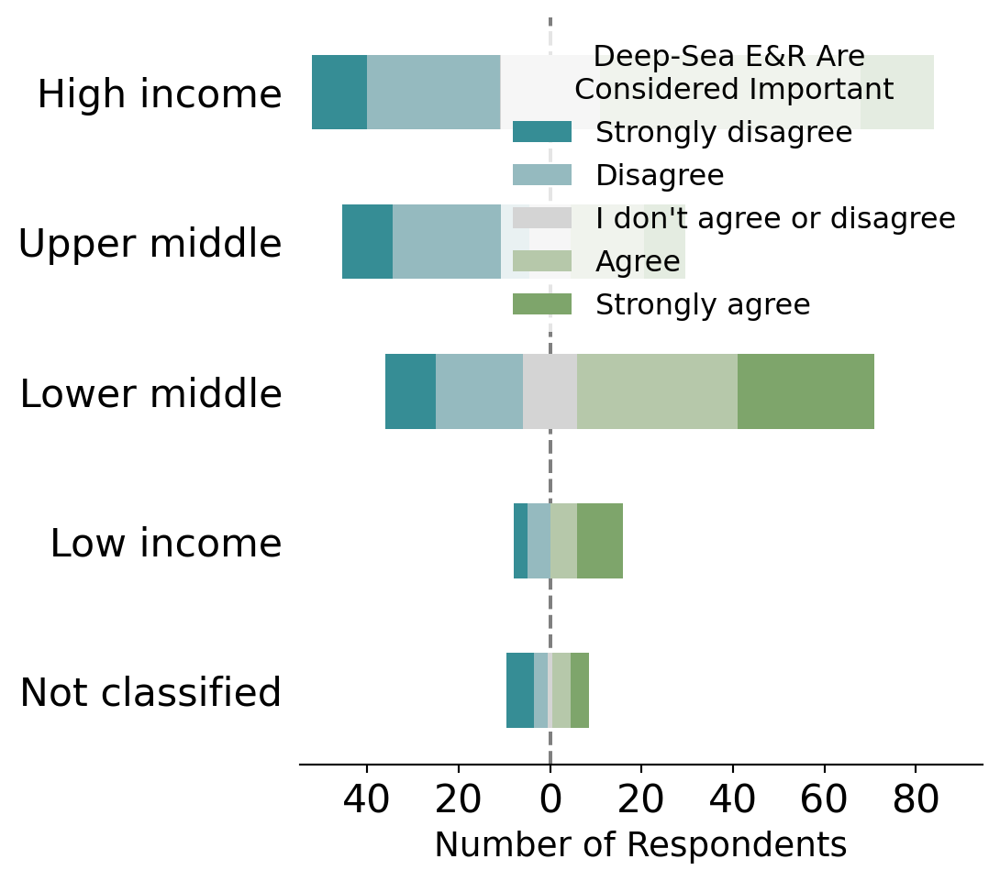

In [41]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale,
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Asia': 'lower left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='  Deep-Sea E&R Are\nConsidered Important',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='3', letter='G1')

### Q4: Tools

In [42]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Strongly disagree', 'Disagree', "I don't agree or disagree", 'Agree', 'Strongly agree']

tools = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    tools[region] = dataR[region].loc[dataR[region]['col_name'] == 'Q4_in-country_tools', 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = tools[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Strongly disagree': 'Strongly disagree',
                      '2 - Disagree': 'Disagree',
                      "3 - I don't agree or disagree": "I don't agree or disagree",
                      '4 - Agree': 'Agree',
                      '5 - Strongly agree': 'Strongly agree'}, inplace=True)

    display(fig_data[region])

subregion,High income,Upper middle,Lower middle,Low income,Not classified
respondent_id,,,,,
12393972654,Strongly agree,NaN,NaN,NaN,NaN
12410372842,NaN,NaN,Agree,NaN,NaN
12413837013,Agree,NaN,NaN,NaN,NaN
12413981730,NaN,I don't agree or disagree,NaN,NaN,NaN
12535759742,Agree,NaN,NaN,NaN,NaN
...,...,...,...,...,...
13238295139,NaN,NaN,Strongly disagree,NaN,NaN
13238317961,NaN,NaN,Strongly disagree,NaN,NaN
13238625495,NaN,NaN,I don't agree or disagree,NaN,NaN


In [43]:
## Calculate statistics

for region in region_list:
    percent_data = (tools[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = tools[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion                     High income Low income Lower middle income   
selection                                                                  
1 - Strongly disagree                16.0       14.0                28.0   
2 - Disagree                         18.0        7.0                34.0   
3 - I don't agree or disagree        12.0        2.0                29.0   
4 - Agree                            43.0        1.0                14.0   
5 - Strongly agree                   47.0        NaN                 2.0   
Total                               136.0       24.0               107.0   

                                                                     percent  \
subregion                     Not classified Upper middle income High income   
selection                                                                      
1 - Strongly disagree                   15.0                22.0       11.76   
2 - Disagree                             1.0                28.0       13.24   
3 - I don't agree or disagree            2.0                13.0        8.82   
4 - Agree                                NaN                 6.0       31.62   
5 - Strongly agree                       NaN                 6.0       34.56   
Total                                   18.0                75.0      100.00   

                                                                             \
subregion                     Low income Lower middle income Not classified   
selection                                                                     
1 - Strongly disagree              58.33               26.17          83.33   
2 - Disagree                       29.17               31.78           5.56   
3 - I don't agree or disagree       8.33               27.10          11.11   
4 - Agree                           4.17               13.08            NaN   
5 - Strongly agree                   NaN                1.87            NaN   
Total                             100.00              100.00         100.00   

                                                   count percent  
subregion                     Upper middle income  Total   Total  
selection                                                         
1 - Strongly disagree                       29.33   95.0   26.39  
2 - Disagree                                37.33   88.0   24.44  
3 - I don't agree or disagree               17.33   58.0   16.11  
4 - Agree                                    8.00   64.0   17.78  
5 - Strongly agree                           8.00   55.0   15.28  
Total                                       99.99  360.0  100.00

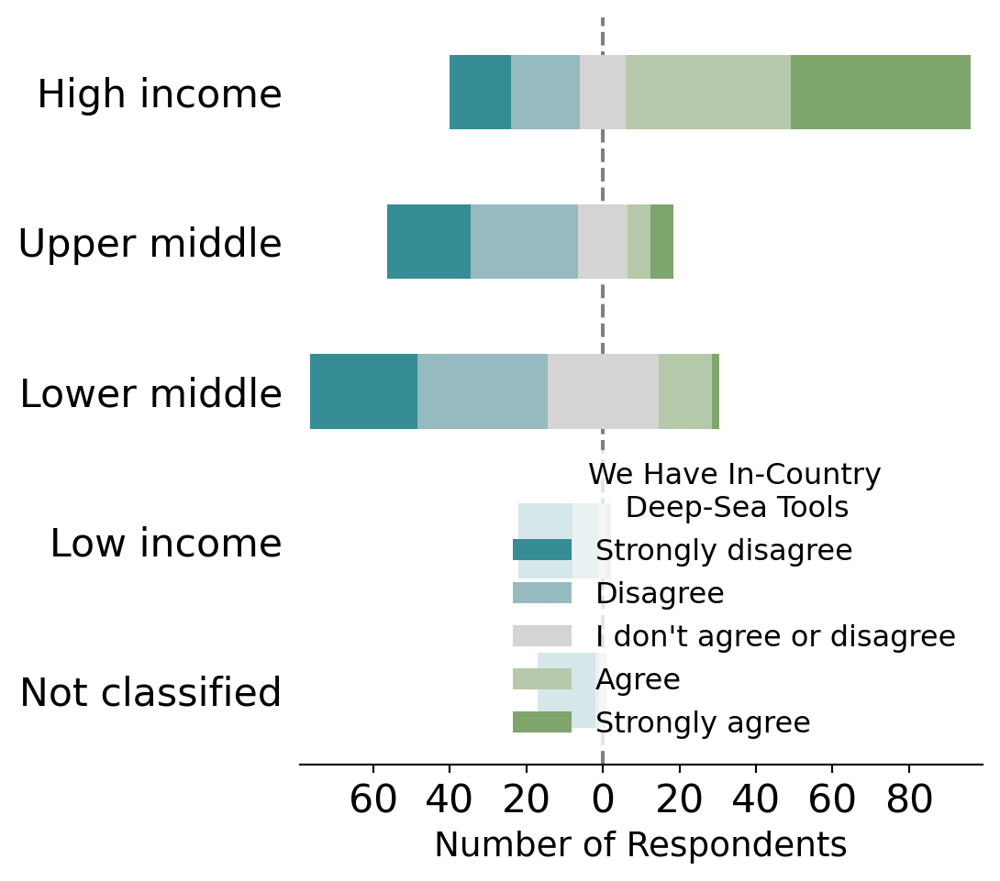

In [44]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale,
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='We Have In-Country\n    Deep-Sea Tools',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='3', letter='G3')

### Q4: ExpertiseA

In [45]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Strongly disagree', 'Disagree', "I don't agree or disagree", 'Agree', 'Strongly agree']

expertise = {}
fig_data = {}

for region in region_list:
    # Select relevant survey data
    expertise[region] = dataR[region].loc[dataR[region]['col_name'] == 'Q4_in-country_expertise', 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = expertise[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Strongly disagree': 'Strongly disagree',
                      '2 - Disagree': 'Disagree',
                      "3 - I don't agree or disagree": "I don't agree or disagree",
                      '4 - Agree': 'Agree',
                      '5 - Strongly agree': 'Strongly agree'}, inplace=True)

    display(fig_data[region])

subregion,High income,Upper middle,Lower middle,Low income,Not classified
respondent_id,,,,,
12393972654,Strongly agree,NaN,NaN,NaN,NaN
12410372842,NaN,NaN,Agree,NaN,NaN
12413837013,Strongly agree,NaN,NaN,NaN,NaN
12413981730,NaN,Agree,NaN,NaN,NaN
12535759742,Strongly agree,NaN,NaN,NaN,NaN
...,...,...,...,...,...
13238295139,NaN,NaN,Strongly disagree,NaN,NaN
13238317961,NaN,NaN,Disagree,NaN,NaN
13238625495,NaN,NaN,Agree,NaN,NaN


In [46]:
## Calculate statistics

for region in region_list:
    percent_data = (expertise[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = expertise[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion                     High income Low income Lower middle income   
selection                                                                  
1 - Strongly disagree                 9.0        6.0                21.0   
2 - Disagree                         10.0        7.0                20.0   
3 - I don't agree or disagree        18.0        6.0                19.0   
4 - Agree                            42.0        4.0                41.0   
5 - Strongly agree                   57.0        1.0                 6.0   
Total                               136.0       24.0               107.0   

                                                                     percent  \
subregion                     Not classified Upper middle income High income   
selection                                                                      
1 - Strongly disagree                    7.0                 9.0        6.62   
2 - Disagree                             5.0                21.0        7.35   
3 - I don't agree or disagree            1.0                15.0       13.24   
4 - Agree                                4.0                20.0       30.88   
5 - Strongly agree                       1.0                10.0       41.91   
Total                                   18.0                75.0      100.00   

                                                                             \
subregion                     Low income Lower middle income Not classified   
selection                                                                     
1 - Strongly disagree              25.00               19.63          38.89   
2 - Disagree                       29.17               18.69          27.78   
3 - I don't agree or disagree      25.00               17.76           5.56   
4 - Agree                          16.67               38.32          22.22   
5 - Strongly agree                  4.17                5.61           5.56   
Total                             100.01              100.01         100.01   

                                                   count percent  
subregion                     Upper middle income  Total   Total  
selection                                                         
1 - Strongly disagree                       12.00   52.0   14.44  
2 - Disagree                                28.00   63.0   17.50  
3 - I don't agree or disagree               20.00   59.0   16.39  
4 - Agree                                   26.67  111.0   30.83  
5 - Strongly agree                          13.33   75.0   20.83  
Total                                      100.00  360.0  100.00

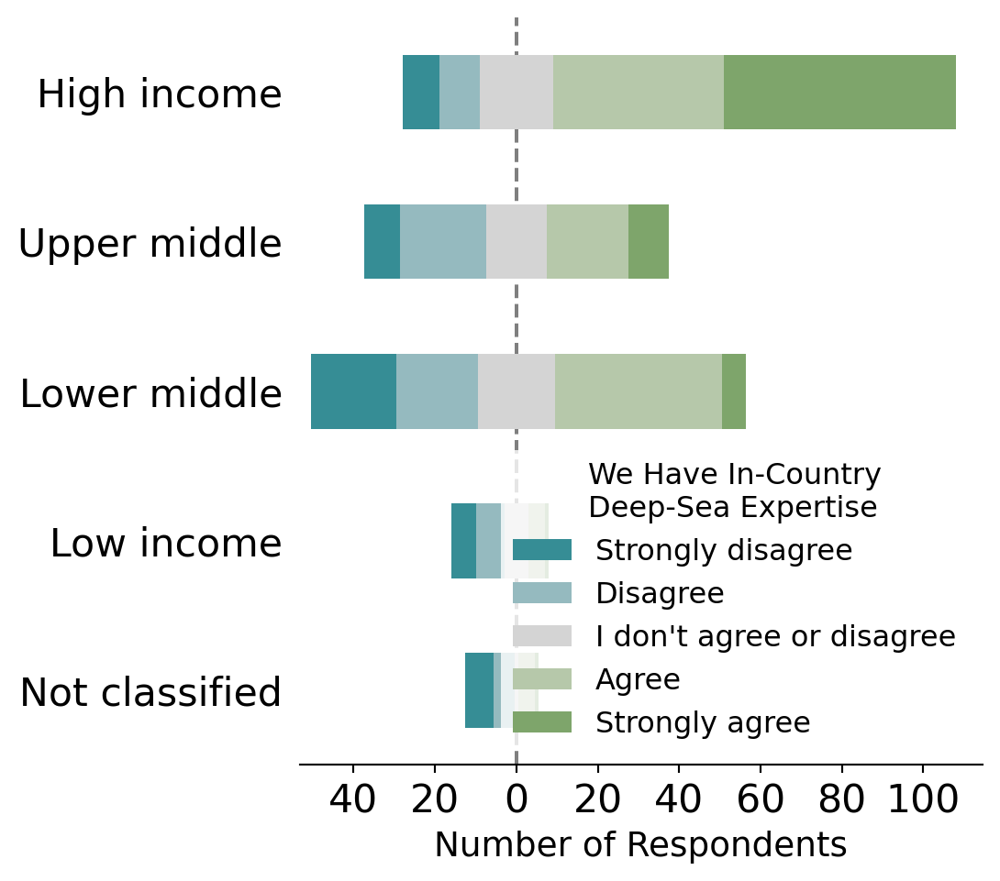

In [47]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale,
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Economies': 'lower right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='We Have In-Country\nDeep-Sea Expertise',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='3', letter='G4')

,dscsr-group-tools,dscsr-group-exp,dscsr-group-imp
dscsr-group,,,
A,5.00,5.00,4.67
D,1.50,3.00,4.50
E,1.25,1.75,4.25
F,1.00,1.80,2.60
B,4.50,5.00,2.50
C,2.00,3.40,2.40


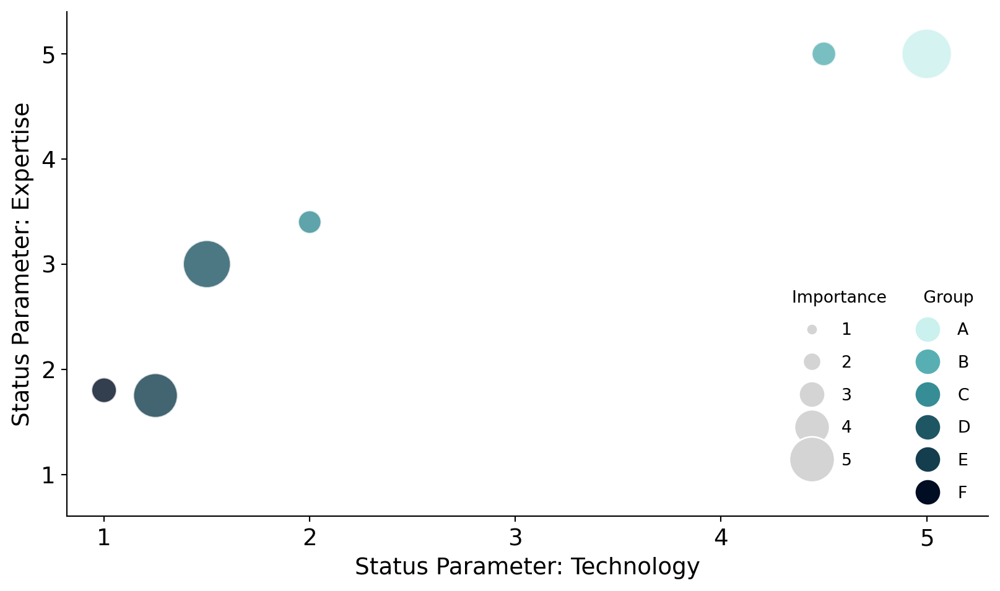

In [48]:
##### Calculate fig data

fig_data = {}
for region in region_list:
    fig_data[region] = (country_tableR[region][['subregion_orig', 'dscsr-group', 'dscsr-group-tools', 'dscsr-group-exp', 'dscsr-group-imp']]
                        .groupby('dscsr-group')
                        .mean())
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dscsr-group-imp', ascending=False)

    display(fig_data[region])

## Plot figure

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dscsr-group-imp'].tolist()]
    groups=['A', 'B', 'C', 'D', 'E', 'F']
    colors = [groups.index(x) for x in fig_data[region].index.tolist()]

    fig_data[region].plot('dscsr-group-tools', 'dscsr-group-exp', kind='scatter', 
                  legend=False,
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors,
                  cmap=matplotlib.colors.ListedColormap(val_06_rev[0:-1]),
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)
    ax.set_xlabel('Status Parameter: Technology', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Status Parameter: Expertise', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.3)
    plt.ylim(0.6,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white',
                                               marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
        markers[i].set_zorder(6-i)
    markers.append(matplotlib.lines.Line2D(range(1), range(1), color='none', marker='o', markersize=0, markerfacecolor='none'))
    labels.append('')
    for i in range(0,6):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_06_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    legend = plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Importance       Group',
                             loc='lower right')
    ax.add_artist(legend)

    outputfigs(plt, fig, ax, region, section='5', letter='G5')

In [49]:
##### Calculate fig data

regions_to_skip = ['Global', 'Economies', 'SIDS']

fig_data_global = (country_tableR['Global'][['subregion_orig', 'dscsr-group', 'dscsr-group-tools', 'dscsr-group-exp', 'dscsr-group-imp']]
                    .groupby(['subregion_orig', 'dscsr-group'])
                    .head(1))
fig_data_global = fig_data_global.set_index('subregion_orig')
display(fig_data_global)

colors = {}
fig_data = {}
for region in region_list:
    if region in regions_to_skip:
        print('Skipping region', region);
        continue

    fig_data[region] = fig_data_global.copy()
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dscsr-group-imp', ascending=False)
    
    # move bubbles to be colored to the end so they are plotted last
    # and not obscured by gray bubbles in the same position
    these_subregions = orderR[region]
    color = fig_data[region].query('subregion_orig in @these_subregions')
    grays = fig_data[region].query('subregion_orig not in @these_subregions')
    fig_data[region] = pd.concat([grays, color])
    
    groups=['A', 'B', 'C', 'D', 'E', 'F']
    colors[region] = []
    for index in fig_data[region].index:
        if index in orderR[region]:
            group = fig_data[region].loc[index]['dscsr-group']
            colors[region].append(val_06_rev[groups.index(group)])
        else:
            colors[region].append('#d4d4d4')

## Plot figure

w = 1920
h = 1080

for region in region_list:
    if region in regions_to_skip:
        continue

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dscsr-group-imp'].tolist()]
    fig_data[region].plot('dscsr-group-tools', 'dscsr-group-exp', kind='scatter', 
                  legend=False,
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors[region],
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)
    ax.set_xlabel('Status Parameter: Technology', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Status Parameter: Expertise', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.3)
    plt.ylim(0.6,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
    markers.append(matplotlib.lines.Line2D(range(1), range(1), color='none', marker='o', markersize=0, markerfacecolor='none'))
    labels.append('')
    for i in range(0,6):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_06_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    ax.add_artist(plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Importance       Group',
                             loc='lower right'))

    outputfigs(plt, fig, ax, region, section='5', letter='G5b')

,dscsr-group,dscsr-group-tools,dscsr-group-exp,dscsr-group-imp
subregion_orig,,,,
Western Africa,D,1.50,3.00,4.50
Eastern Africa,E,1.25,1.75,4.25
Middle Africa,F,1.00,1.80,2.60
Northern Africa,C,2.00,3.40,2.40
Southern Africa,F,1.00,1.80,2.60
Southeastern Asia,D,1.50,3.00,4.50
Eastern Asia,A,5.00,5.00,4.67
Western Asia,C,2.00,3.40,2.40
Southern Asia,E,1.25,1.75,4.25


Skipping region Economies


adding empty row for 1


subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,0.0,0.0,0.0,0.0,0.0
2,4.0,5.0,3.0,NaN,2.0
3,2.0,5.0,2.0,3.0,2.0
4,2.0,2.0,4.0,2.0,NaN
5,4.0,1.0,2.0,NaN,NaN


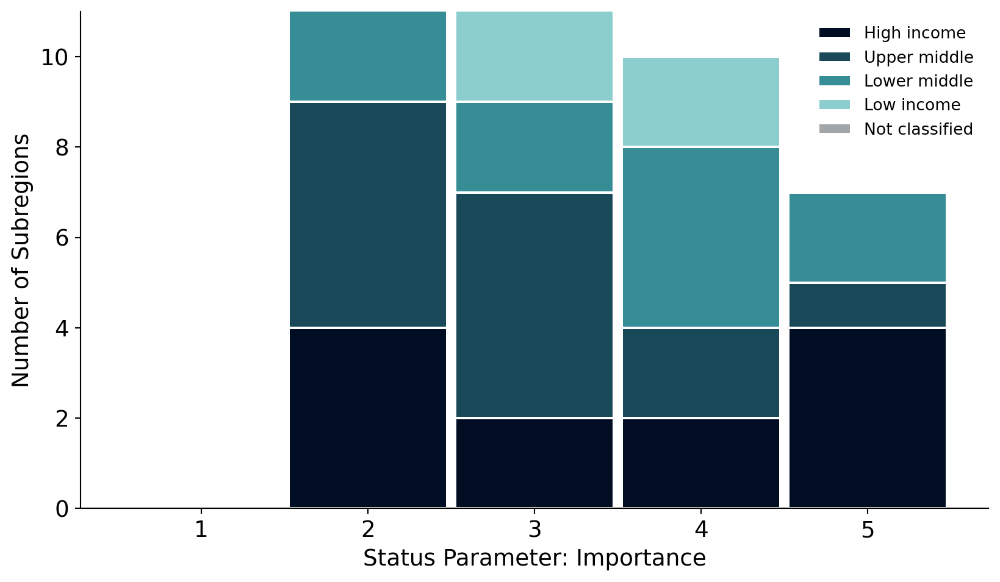

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,4.0,9.0,8.0,3.0,3.0
2,1.0,2.0,3.0,1.0,NaN
3,2.0,2.0,NaN,1.0,1.0
4,1.0,NaN,NaN,NaN,NaN
5,4.0,NaN,NaN,NaN,NaN


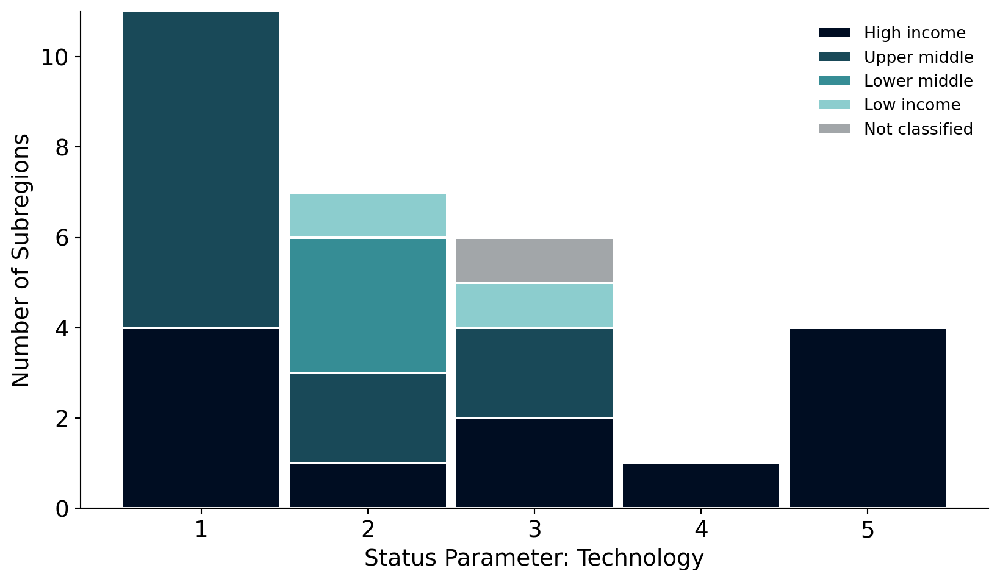

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,1.0,1.0,1.0,NaN,1.0
2,2.0,6.0,6.0,2.0,1.0
3,3.0,4.0,3.0,3.0,2.0
4,1.0,2.0,1.0,NaN,NaN
5,5.0,NaN,NaN,NaN,NaN


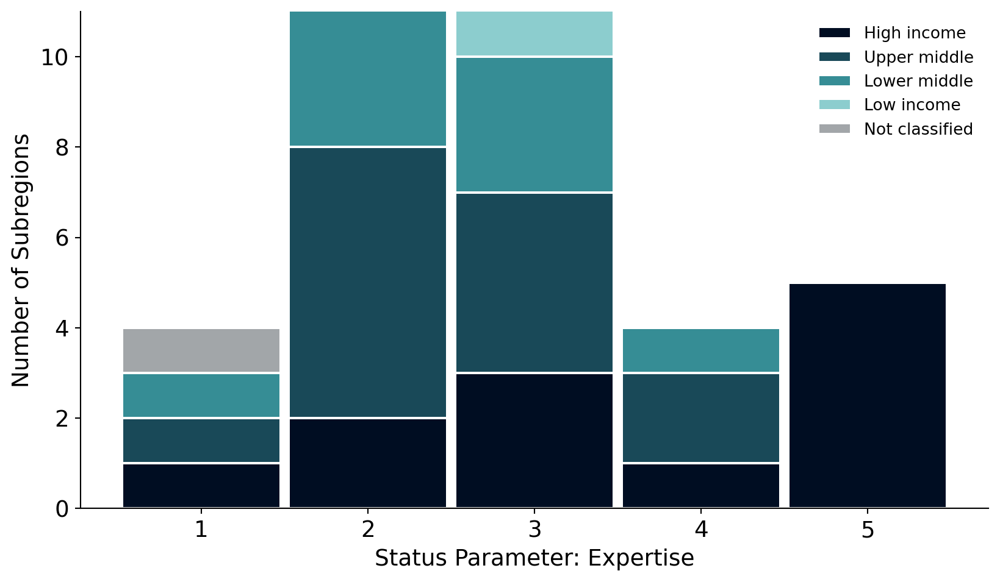

In [50]:
## Calculate fig data

dsc_types = {
    'dscsr-imp':
        { 'x-label': 'Status Parameter: Importance',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G6'
        },
    'dscsr-tools':
        { 'x-label': 'Status Parameter: Technology',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G7'
        },
    'dscsr-exp':
        { 'x-label': 'Status Parameter: Expertise',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G8'
        }
}

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                    .mean()
                    .rename('mean')
                    .reset_index())
        fig_data[region] = (fig_data[region]
                    .groupby(['mean', 'subregion'])['mean']
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region]['mean'] = fig_data[region]['mean'].astype(int)
        fig_data[region] = fig_data[region].pivot(index='mean', columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis=1)
        display(fig_data[region])

    ## Plot figure

    w = 1920
    h = 1080
    
    for region in region_list:
        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

        fig_data[region].plot(kind='bar', 
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      color=cat_d23e123_by_region[region],
                      edgecolor='white',
                      linewidth=1.5,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        plt.ylim(0, 11)

        ax.legend(fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

In [51]:
## Calculate fig data

dsc_types = {
    'dscsr-imp':
        { 'x-label': 'Status Parameter: Importance',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G6b'
        },
    'dscsr-tools':
        { 'x-label': 'Status Parameter: Technology',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G7b'
        },
    'dscsr-exp':
        { 'x-label': 'Status Parameter: Expertise',
          'y-label': 'Number of Subregions',
          'fig-letter': 'G8b'
        }
}

regions_to_skip = ['Global', 'Economies', 'SIDS']

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        if region in regions_to_skip:
            print('Skipping region', region);
            continue

        for r in ['Global', region]:
            fig_data[r] = (country_tableR[r]
                        .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                        .mean()
                        .rename('mean')
                        .reset_index())
            fig_data[r] = (fig_data[r]
                        .groupby(['mean', 'subregion'])['mean']
                        .count()
                        .rename('count')
                        .reset_index())
            fig_data[r]['mean'] = fig_data[r]['mean'].astype(int)

            fig_data[r] = fig_data[r].pivot(index='mean', columns=['subregion'], values='count')
            for n in range(1,6):
                if n not in fig_data[r].index:
                    print('adding empty row for', n)
                    fig_data[r].loc[n] = 0
            fig_data[r] = fig_data[r].sort_index()
            fig_data[r] = prep_fig_data_for_plotting(fig_data[r], r, axis=1)

        if region == 'Americas':
            colnum = fig_data['Global'].columns.get_loc('N America')
            fig_data['Global'] = fig_data['Global'].rename(columns={'N America': 'Old N America'})
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=['Old N America', 'L Amer & Carib'])
        else:
            colnum = fig_data['Global'].columns.get_loc(region)
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=region)
        fig_data[region] = fig_data['Global']

        display(fig_data['Global'])

    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        if region in regions_to_skip:
            continue

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      edgecolor='white',
                      linewidth=1,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        plt.ylim(0, 11)
        
        colors = []
        edgecolors = []
        for (columnname, data) in fig_data[region].iteritems():
            for datum in data:
                orig_columnname = undo_label_adjustment(columnname)
                if orig_columnname in orderR[region]:
                    colors.append(cat_d23e123_by_region[region][orderR[region].index(orig_columnname)])
                    edgecolors.append('black')
                else:
                    colors.append('#d4d4d4')
                    edgecolors.append('white')
        for p,color in zip(ax.patches,colors):
            p.set_facecolor(color)
        for p,edgecolor in zip(ax.patches,edgecolors):
            p.set_edgecolor(edgecolor)
            if edgecolor != 'white':
                p.set_zorder(10)

        prunedhandles = []
        prunedlabels = []
        currenthandles, currentlabels = ax.get_legend_handles_labels()   #get the handles
        for handle, label in zip(currenthandles, currentlabels):
            if undo_label_adjustment(label) in orderR[region]:
                prunedhandles.append(handle)
                prunedlabels.append(label)
        patch = matplotlib.patches.Patch(facecolor='#d4d4d4', edgecolor='white')
        prunedhandles.append(patch)
        prunedlabels.append('All other regions')

        ax.legend(prunedhandles,
                  prunedlabels,
                  fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

Skipping region Economies
Skipping region Economies
Skipping region Economies


---
# **Section 4**

## Fig H - Q3: Issues

In [52]:
## Calculate values for plot

issues = {}
fig_data = {}
for region in region_list:
    issues[region] = dataR[region].loc[(dataR[region]['question'] == 'Q3') &
                  (dataR[region]['selection_survey_clean'] != ''),
                  ['respondent_id', 'subregion', 'selection_survey_clean']].copy()

    covariate = 'subregion'

    selection_list = issues[region]['selection_survey_clean'].unique().tolist()
    selection_list.sort()

    fig_data[region] = (issues[region].groupby([covariate, 'selection_survey_clean'])['respondent_id']
                         .count()
                         .rename('count')
                         .reset_index())

    fig_data[region]['total'] = fig_data[region]['count'].groupby(fig_data[region]['subregion']).transform('sum')
    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='percent')

    sorted_cols = ['Conservation & protection',
                   'Basic science & exploration',
                   'Fisheries & aquaculture',
                   'Offshore oil & gas',
                   'Climate change',
                   'Seabed mining',
                   'Safety & security',
                   'Maritime archaeology & history',
                   'Renewable energy',
                   'Telecommunications',
                   'Other']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols, createmissingcolumns=True)

    # Change table to print better below
    percent_data = fig_data[region].copy()
    percent_data.rename(columns={'Telecommunications': 'Telecomm.'}, inplace=True)

    display(percent_data)
    percent_data.fillna(0)

selection_survey_clean,Conservation & protection,Basic science & exploration,Fisheries & aquaculture,Offshore oil & gas,Climate change,Seabed mining,Safety & security,Maritime archaeology & history,Renewable energy,Telecomm.,Other
subregion,,,,,,,,,,,
High income,20.35,19.60,13.32,14.32,13.32,7.04,3.27,2.26,3.02,2.01,1.51
Low income,18.31,12.68,22.54,11.27,9.86,1.41,12.68,5.63,1.41,1.41,2.82
Lower middle income,15.53,15.53,22.33,14.56,15.53,3.88,5.83,2.59,1.29,0.97,1.94
Not classified,22.45,26.53,14.29,12.24,4.08,10.20,4.08,2.04,2.04,2.04,NaN
Upper middle income,18.89,19.82,17.51,18.43,10.14,6.91,5.07,0.92,0.46,1.38,0.46


In [53]:
## Calculate statistics

for region in region_list:
    count_data = (issues[region].groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())

    pivoted = count_data.pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    pivoted.loc['Total'] = pivoted.sum()

    # Sort subregions as Katy specified
    sorted_cols = ['Conservation & protection',
                   'Basic science & exploration',
                   'Fisheries & aquaculture',
                   'Offshore oil & gas',
                   'Climate change',
                   'Seabed mining',
                   'Safety & security',
                   'Maritime archaeology & history',
                   'Renewable energy',
                   'Telecommunications',
                   'Other']
    pivoted = reorder_columns(pivoted, sorted_cols, createmissingcolumns=True)

    pivoted['Total'] = pivoted.sum(axis=1)

    pivoted.rename(columns={'Telecommunications': 'Telecomm.'}, inplace=True)
    display(pivoted)
    
    # Calculate percentages for the entire region
    display(round((count_data.groupby('selection_survey_clean')['count']
                 .sum()/count_data['count'].sum())*100, 2).rename('percent').reset_index())

selection_survey_clean,Conservation & protection,Basic science & exploration,Fisheries & aquaculture,Offshore oil & gas,Climate change,Seabed mining,Safety & security,Maritime archaeology & history,Renewable energy,Telecomm.,Other,Total
subregion,,,,,,,,,,,,
High income,81.0,78.0,53.0,57.0,53.0,28.0,13.0,9.0,12.0,8.0,6.0,398.0
Low income,13.0,9.0,16.0,8.0,7.0,1.0,9.0,4.0,1.0,1.0,2.0,71.0
Lower middle income,48.0,48.0,69.0,45.0,48.0,12.0,18.0,8.0,4.0,3.0,6.0,309.0
Not classified,11.0,13.0,7.0,6.0,2.0,5.0,2.0,1.0,1.0,1.0,NaN,49.0
Upper middle income,41.0,43.0,38.0,40.0,22.0,15.0,11.0,2.0,1.0,3.0,1.0,217.0
Total,194.0,191.0,183.0,156.0,132.0,61.0,53.0,24.0,19.0,16.0,15.0,1044.0


,selection_survey_clean,percent
0,Basic science & exploration,18.30
1,Climate change,12.64
2,Conservation & protection,18.58
3,Fisheries & aquaculture,17.53
4,Maritime archaeology & history,2.30
5,Offshore oil & gas,14.94
6,Other,1.44
7,Renewable energy,1.82
8,Safety & security,5.08
9,Seabed mining,5.84


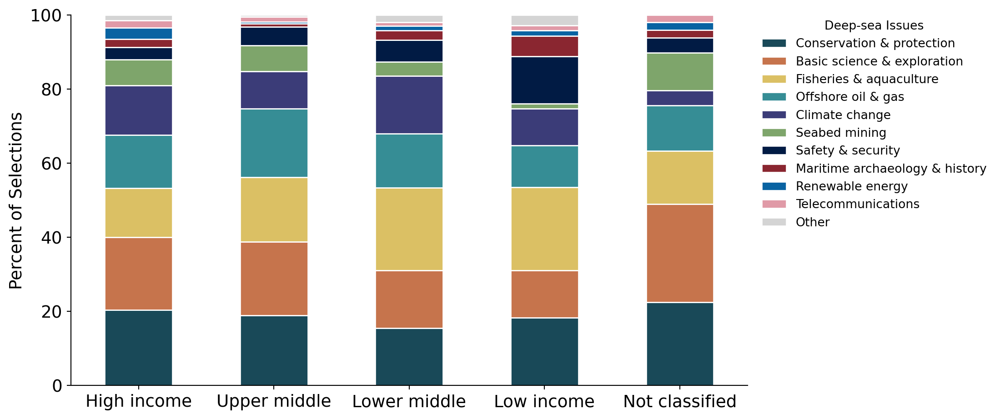

In [54]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  rot=0,
                  color=cat_10,
                  edgecolor='white',
                  ax=ax)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylabel('Percent of Selections', fontsize=14)
    ax.set_ylim([0, 100])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              title='Deep-sea Issues', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='4', letter='H')

## Fig I - Q33: Challenges

In [55]:
## Calculate values for plot

challenges = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    challenges[region] = dataR[region].loc[(dataR[region]['question'] == 'Q33') &
                      (dataR[region]['selection_survey_clean'] != ''),
                        ['respondent_id', 'subregion', 'selection_survey_clean']].copy()

    display(challenges[region])
    covariate = 'subregion'
    fig_data[region] = (challenges[region].groupby([covariate, 'selection_survey_clean'])['respondent_id']
                         .count()
                         .rename('count')
                         .reset_index())

    fig_data[region]['total'] = fig_data[region]['count'].groupby(fig_data[region]['subregion']).transform('sum')
    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='percent')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    # Sort subregions as Katy specified
    sorted_cols = ['Funding',
                   'Human capacity/knowledge to do deep sea research',
                   'Access to vessels',
                   'Access to deep submergence vehicles',
                   'Access to deep sea sensors',
                   'Scalability of technologies',
                   'Lack of connections with other deep sea researchers',
                   'Access to data tools',
                   'Other']
    display(fig_data[region])
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)
    display(fig_data[region])

,respondent_id,subregion,selection_survey_clean
39960,12673531336,Lower middle income,Lack of connections with other deep sea resear...
39961,12674177252,High income,Lack of connections with other deep sea resear...
39962,12751483616,Lower middle income,Lack of connections with other deep sea resear...
39963,12881514349,High income,Lack of connections with other deep sea resear...
39964,12897429486,Low income,Lack of connections with other deep sea resear...
...,...,...,...
43011,12979297027,Upper middle income,Access to vessels
43012,13165714192,High income,Access to vessels
43013,12961204767,Lower middle income,Access to vessels
43014,12718597061,High income,Access to vessels


selection_survey_clean,Access to data tools,Access to deep sea sensors,Access to deep submergence vehicles,Access to vessels,Funding,Human capacity/knowledge to do deep sea research,Lack of connections with other deep sea researchers,Other,Scalability of technologies
subregion,,,,,,,,,
High income,2.53,4.05,17.22,19.75,30.89,12.91,3.80,2.53,6.33
Upper middle,5.33,3.56,15.11,16.89,29.78,17.78,5.33,0.89,5.33
Lower middle,7.72,8.36,14.15,13.50,25.40,20.26,5.47,0.64,4.50
Low income,4.48,5.97,13.43,16.42,26.87,17.91,8.96,1.49,4.48
Not classified,7.55,5.66,9.43,13.21,32.08,18.87,7.55,3.77,1.89


selection_survey_clean,Funding,Human capacity/knowledge to do deep sea research,Access to vessels,Access to deep submergence vehicles,Access to deep sea sensors,Scalability of technologies,Lack of connections with other deep sea researchers,Access to data tools,Other
subregion,,,,,,,,,
High income,30.89,12.91,19.75,17.22,4.05,6.33,3.80,2.53,2.53
Upper middle,29.78,17.78,16.89,15.11,3.56,5.33,5.33,5.33,0.89
Lower middle,25.40,20.26,13.50,14.15,8.36,4.50,5.47,7.72,0.64
Low income,26.87,17.91,16.42,13.43,5.97,4.48,8.96,4.48,1.49
Not classified,32.08,18.87,13.21,9.43,5.66,1.89,7.55,7.55,3.77


In [56]:
## Calculate statistics

for region in region_list:
    count_data = (challenges[region].groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())

    pivoted = count_data.pivot(columns='selection_survey_clean', index='subregion', values='count')
    pivoted = prep_fig_data_for_plotting(pivoted, region)
    pivoted.loc['Total'] = pivoted.sum()

    # Sort subregions as Katy specified
    sorted_cols = ['Funding',
                   'Human capacity/knowledge to do deep sea research',
                   'Access to vessels',
                   'Access to deep submergence vehicles',
                   'Access to deep sea sensors',
                   'Scalability of technologies',
                   'Lack of connections with other deep sea researchers',
                   'Access to data tools',
                   'Other']
    pivoted = reorder_columns(pivoted, sorted_cols, createmissingcolumns=True)

    pivoted['Total'] = pivoted.sum(axis=1)

    display(pivoted)

selection_survey_clean,Funding,Human capacity/knowledge to do deep sea research,Access to vessels,Access to deep submergence vehicles,Access to deep sea sensors,Scalability of technologies,Lack of connections with other deep sea researchers,Access to data tools,Other,Total
subregion,,,,,,,,,,
High income,122,51,78,68,16,25,15,10,10,395
Upper middle,67,40,38,34,8,12,12,12,2,225
Lower middle,79,63,42,44,26,14,17,24,2,311
Low income,18,12,11,9,4,3,6,3,1,67
Not classified,17,10,7,5,3,1,4,4,2,53
Total,303,176,176,160,57,55,54,53,17,1051


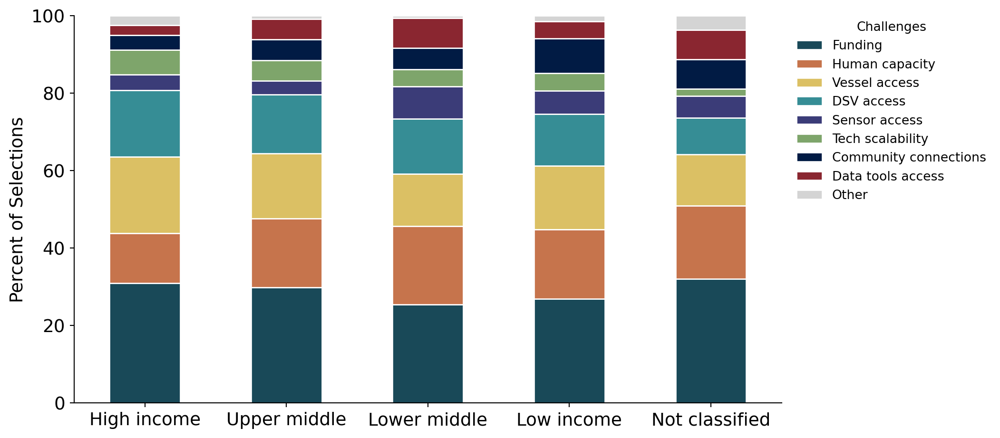

In [57]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  rot=0,
                  color=cat_08,
                  edgecolor='white',
                  ax=ax)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylabel('Percent of Selections', fontsize=14)
    ax.set_ylim([0, 100])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              labels=['Funding',
                      'Human capacity',
                      'Vessel access',
                      'DSV access',
                      'Sensor access',
                      'Tech scalability',
                      'Community connections',
                      'Data tools access',
                      'Other'],
              title='Challenges', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='4', letter='I')

## Fig J - Q34: Opportunities

In [58]:
## Calculate values for plot

opportunities = {}
fig_data = {}
for region in region_list:
    # Select relevant survey data
    opportunities[region] = dataR[region].loc[(dataR[region]['question'] == 'Q34') &
                  (dataR[region]['selection_survey_clean'] != ''),
                         ['respondent_id', 'subregion', 'selection_survey_clean']].copy()  
    
    covariate = 'subregion'

    fig_data[region] = (opportunities[region].groupby([covariate, 'selection_survey_clean'])['respondent_id']
                         .count()
                         .rename('count')
                         .reset_index())

    fig_data[region]['total'] = fig_data[region]['count'].groupby(fig_data[region]['subregion']).transform('sum')
    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='percent')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)
    # Sort subregions as Katy specified
    sorted_cols = ['Training opportunities',
                   'Less expensive data collection technologies',
                   'Better data access and analysis tools',
                   'Networking/connecting with others',
                   'Better/more precise data collection technologies',
                   'Technology that can go deeper',
                   'Scalable platforms & sensors',
                   'Other']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols, createmissingcolumns=True)

In [59]:
## Calculate statistics

for region in region_list:
    count_data = (opportunities[region].groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())

    pivoted = count_data.pivot(columns='selection_survey_clean', index='subregion', values='count')
    pivoted.loc['Total'] = pivoted.sum()

    pivoted = prep_fig_data_for_plotting(pivoted, region)
    # Sort subregions as Katy specified
    sorted_cols = ['Training opportunities',
                   'Less expensive data collection technologies',
                   'Better data access and analysis tools',
                   'Networking/connecting with others',
                   'Better/more precise data collection technologies',
                   'Technology that can go deeper',
                   'Scalable platforms & sensors',
                   'Other']
    pivoted = reorder_columns(pivoted, sorted_cols, createmissingcolumns=True)

    pivoted['Total'] = pivoted.sum(axis=1)

    display(pivoted)

selection_survey_clean,Training opportunities,Less expensive data collection technologies,Better data access and analysis tools,Networking/connecting with others,Better/more precise data collection technologies,Technology that can go deeper,Scalable platforms & sensors,Other,Total
subregion,,,,,,,,,
High income,56,87,53,48,56,53,51,7,411
Upper middle,59,41,34,38,33,34,26,6,271
Lower middle,94,65,64,67,61,59,46,5,461
Low income,19,10,16,13,14,16,10,2,100
Not classified,12,9,10,9,10,5,5,3,63


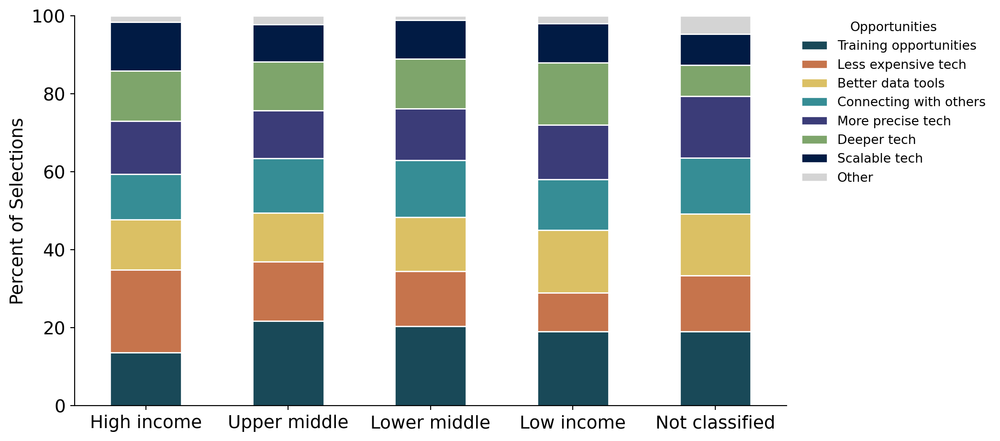

In [60]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='bar', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  rot=0,
                  color=cat_07,
                  edgecolor='white',
                  ax=ax)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylabel('Percent of Selections', fontsize=14)
    ax.set_ylim([0, 100])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              labels=['Training opportunities',
                      'Less expensive tech',
                      'Better data tools',
                      'Connecting with others',
                      'More precise tech',
                      'Deeper tech',
                      'Scalable tech',
                      'Other'],
              title='Opportunities', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='4', letter='J')

---
# **Section 5**

## Fig AA - Marine industries (research)

In [61]:
## Calculate values for plot
industries = {}
num_areas_per_subregion = {}
label_order = {}
fig_data = {}
for region in region_list:
    industries[region] = researchR[region].loc[(researchR[region]['question'] == 'Q10') &
                          (researchR[region]['col_name'] != 'Q10_comments'), ['subregion', 
                                                                     'geoarea',
                                                                     'col_name', 
                                                                     'research_tech_clean']]
    industries[region]['selection_binary'] = industries[region]['research_tech_clean']
    
    # Aggregate selections
    industries[region].loc[industries[region]['col_name'] == 'Q10_aquaculture',   'col_name'] = 'Q10_fisheries'
    industries[region].loc[industries[region]['col_name'] == 'Q10_biotechnology', 'col_name'] = 'Q10_research'
    industries[region].loc[industries[region]['col_name'] == 'Q10_shipping',      'col_name'] = 'Q10_transport'
    
    # Drop duplicates to accomodate "OR" logic
    industries[region].drop_duplicates(inplace=True)
    display(industries[region])
    
    fig_data[region] = (industries[region].groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion[region] = industries[region].groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion[region].index, num_areas_per_subregion[region].values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q10_fisheries':        'Fisheries & Aquaculture',
        'Q10_transport':        'Marine Transportation',
        'Q10_tourism':          'Tourism',
        'Q10_conservation':     'Conservation & Protection',
        'Q10_offshore_oil':     'Offshore Oil & Gas',
        'Q10_safety':           'Safety & Surveillance',
        'Q10_construction':     'Marine Construction',
        'Q10_research':         'Marine R&D',
        'Q10_renewable_energy': 'Ocean Renewable Energy',
        'Q10_mining':           'Deep-sea Mining',
    }
    fig_data[region]['col_name'].replace(renames, inplace=True)
    hue_order = renames.values()

    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'conservation'):('count', 'transport')].sum()
    pivoted.loc['Total', ('percent', 'conservation'):('percent', 'transport')] = \
        ((pivoted.loc['Total', ('count', 'conservation'):('count', 'transport')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

,subregion,geoarea,col_name,research_tech_clean,selection_binary
2,Upper middle income,Albania,Q10_mining,0,0
3,Upper middle income,Albania,Q10_renewable_energy,0,0
4,Upper middle income,Albania,Q10_research,0,0
34,Lower middle income,Algeria,Q10_mining,0,0
62,Upper middle income,American Samoa,Q10_research,0,0
...,...,...,...,...,...
8427,Low income,Yemen,Q10_fisheries,1,1
8428,Low income,Yemen,Q10_conservation,1,1
8430,Low income,Yemen,Q10_offshore_oil,1,1
8431,Low income,Yemen,Q10_safety,1,1


count                  \
col_name       Conservation & Protection Deep-sea Mining   
subregion                                                  
High income                         45.0             6.0   
Low income                          14.0             0.0   
Lower middle                        37.0             0.0   
Not classified                      28.0             0.0   
Upper middle                        39.0             2.0   
Total                              163.0             8.0   

                                                                       \
col_name       Fisheries & Aquaculture Marine Construction Marine R&D   
subregion                                                               
High income                       52.0                47.0       39.0   
Low income                        15.0                14.0        9.0   
Lower middle                      41.0                29.0       33.0   
Not classified                    27.0                11.0       17.0   
Upper middle                      41.0                36.0       33.0   
Total                            176.0               137.0      131.0   

                                                             \
col_name       Marine Transportation Ocean Renewable Energy   
subregion                                                     
High income                     52.0                   28.0   
Low income                      15.0                    5.0   
Lower middle                    41.0                   21.0   
Not classified                  28.0                    8.0   
Upper middle                    42.0                   13.0   
Total                          178.0                   75.0   

                                                                 \
col_name       Offshore Oil & Gas Safety & Surveillance Tourism   
subregion                                                         
High income                  25.0                  46.0    52.0   
Low income                   11.0                  12.0    11.0   
Lower middle                 26.0                  36.0    40.0   
Not classified                3.0                  17.0    24.0   
Upper middle                 21.0                  31.0    38.0   
Total                        86.0                 142.0   165.0   

                                 percent                  \
col_name       Conservation & Protection Deep-sea Mining   
subregion                                                  
High income                        84.91           11.32   
Low income                         93.33            0.00   
Lower middle                       90.24            0.00   
Not classified                     96.55            0.00   
Upper middle                       92.86            4.76   
Total                             457.89           16.08   

                                                                       \
col_name       Fisheries & Aquaculture Marine Construction Marine R&D   
subregion                                                               
High income                      98.11               88.68      73.58   
Low income                      100.00               93.33      60.00   
Lower middle                    100.00               70.73      80.49   
Not classified                   93.10               37.93      58.62   
Upper middle                     97.62               85.71      78.57   
Total                           488.83              376.38     351.26   

                                                             \
col_name       Marine Transportation Ocean Renewable Energy   
subregion                                                     
High income                    98.11                  52.83   
Low income                    100.00                  33.33   
Lower middle                  100.00                  51.22   
Not classified                 96.55                  27.59   
Upper middle            

In [62]:
## Percent of areas in subregion that have all industry types

for region in region_list:
    num_types = (industries[region].groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    num_types['has_all'] = 0
    num_types.loc[num_types['num_types'] == 10, 'has_all'] = 1

    all_types = num_types.groupby('subregion')['has_all'].sum().reset_index()
    all_types['total'] = num_areas_per_subregion[region].values
    all_types['percent'] = round((all_types['has_all']/all_types['total'])*100, 2)

    display(all_types)

    ## Percent of areas in subregion that have < 3 industry types
    num_types['less_than_3'] = 0
    num_types.loc[num_types['num_types'] < 3, 'less_than_3'] = 1

    few_types = num_types.groupby('subregion')['less_than_3'].sum().reset_index()
    few_types['total'] = num_areas_per_subregion[region].values
    few_types['percent'] = round((few_types['less_than_3']/few_types['total'])*100, 2)

    display(few_types)

,subregion,has_all,total,percent
0,High income,4,53,7.55
1,Low income,0,15,0.00
2,Lower middle income,0,41,0.00
3,Not classified,0,29,0.00
4,Upper middle income,0,42,0.00


,subregion,less_than_3,total,percent
0,High income,1,53,1.89
1,Low income,0,15,0.00
2,Lower middle income,0,41,0.00
3,Not classified,1,29,3.45
4,Upper middle income,0,42,0.00


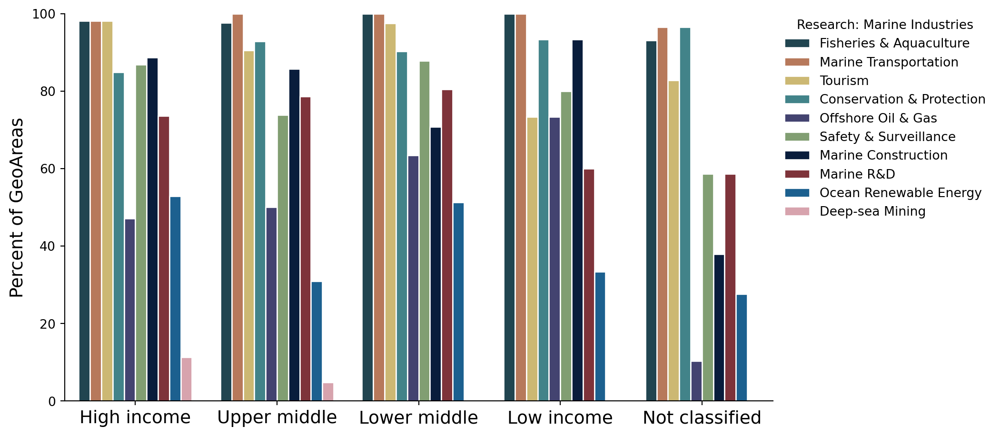

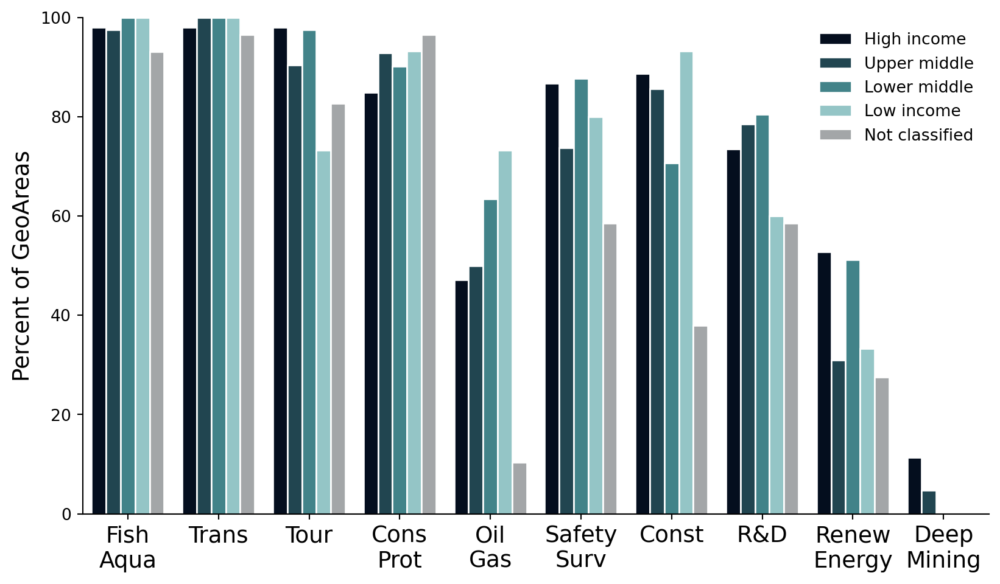

In [63]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_10,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Marine Industries',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA1')

    ### AA1b

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(["Fish\nAqua", "Trans", "Tour", "Cons\nProt", "Oil\nGas", "Safety\nSurv", "Const", "R&D", "Renew\nEnergy", "Deep\nMining"], rotation=0, fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)

    xaxis_key = [
        'Fisheries & Aquaculture',
        'Marine Transportation',
        'Tourism',
        'Conservation & Protection',
        'Offshore Oil & Gas',
        'Safety & Surveillance',
        'Marine Construction',
        'Marine R&D',
        'Ocean Renewable Energy',
        'Deep-sea Mining'
    ]

    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)
                  
    outputfigs(plt, fig, ax, region, section='5', letter='AA1b')

Marine industries (survey)

In [64]:
### Calculate values for plot
industries = {}
label_order = {}
fig_data = {}
num_areas_per_subregion = {}
for region in region_list:
    industries[region] = dataR[region].loc[(dataR[region]['question'] == 'Q10'), ['subregion', 
                                                  'geoarea',
                                                  'selection_survey_clean']]

    industries[region] = industries[region][industries[region]['selection_survey_clean'] != '']

    fig_data[region] = (industries[region].groupby(['subregion', 'selection_survey_clean'])['geoarea']
                .count()
                .rename('count')
                .reset_index())
    
    hue_order = [
        'Fisheries & Aquaculture',
        'Marine Transportation',
        'Tourism',
        'Conservation & Protection',
        'Offshore Oil & Gas',
        'Safety & Surveillance',
        'Marine Construction',
        'Marine R&D',
        'Ocean Renewable Energy',
        'Deep-sea Mining',
        'Other'
    ]

    country_num_survey = country_tableR[region].groupby(['subregion'])[['subregion', 'num_survey']].sum()
    display(country_num_survey)

    num_survey_dict = dict(zip(country_num_survey.index, country_num_survey.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_survey_dict, inplace=True)
    display(fig_data[region])

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)
    
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)
    display(fig_data[region])


    if industries[region].shape[0] == 0:
        print('zero results for region', region, 'skipping it', file=sys.stderr)
        continue
    pivoted = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_in_region = pivoted.loc['Total', ('count', 'Deep sea mining'):('count', 'Tourism')].sum()
    pivoted.loc['Total', ('percent', 'Deep sea mining'):('percent', 'Tourism')] = \
        ((pivoted.loc['Total', ('count', 'Deep sea mining'):('count', 'Tourism')]/total_in_region).values)*100

    out = round(pivoted['count'], 2)
    display(Markdown('**'+region+'**'), out)

,num_survey
subregion,
High income,136
Low income,24
Lower middle income,107
Not classified,18
Upper middle income,75


,subregion,selection_survey_clean,count,total
0,High income,Conservation & Protection,98,136
1,High income,Deep-sea Mining,40,136
2,High income,Fisheries & Aquaculture,133,136
3,High income,Marine Construction,92,136
4,High income,Marine R&D,96,136
5,High income,Marine Transportation,127,136
6,High income,Ocean Renewable Energy,75,136
7,High income,Offshore Oil & Gas,105,136
8,High income,Other,6,136
9,High income,Safety & Surveillance,88,136


,subregion,selection_survey_clean,count,total,percent
0,High income,Conservation & Protection,98,136,72.06
1,High income,Deep-sea Mining,40,136,29.41
2,High income,Fisheries & Aquaculture,133,136,97.79
3,High income,Marine Construction,92,136,67.65
4,High income,Marine R&D,96,136,70.59
5,High income,Marine Transportation,127,136,93.38
6,High income,Ocean Renewable Energy,75,136,55.15
7,High income,Offshore Oil & Gas,105,136,77.21
8,High income,Other,6,136,4.41
9,High income,Safety & Surveillance,88,136,64.71


**Economies**

selection_survey_clean,Conservation & Protection,Deep-sea Mining,Fisheries & Aquaculture,Marine Construction,Marine R&D,Marine Transportation,None of the above,Ocean Renewable Energy,Offshore Oil & Gas,Other,Safety & Surveillance,Tourism
subregion,,,,,,,,,,,,
High income,98.0,40.0,133.0,92.0,96.0,127.0,NaN,75.0,105.0,6.0,88.0,114.0
Low income,9.0,1.0,21.0,4.0,4.0,18.0,1.0,NaN,4.0,NaN,5.0,9.0
Lower middle,71.0,14.0,103.0,41.0,33.0,89.0,2.0,16.0,55.0,3.0,52.0,69.0
Not classified,10.0,1.0,15.0,4.0,3.0,13.0,1.0,NaN,9.0,3.0,6.0,12.0
Upper middle,46.0,13.0,70.0,28.0,34.0,69.0,1.0,13.0,44.0,3.0,23.0,54.0
Total,234.0,69.0,342.0,169.0,170.0,316.0,5.0,104.0,217.0,15.0,174.0,258.0


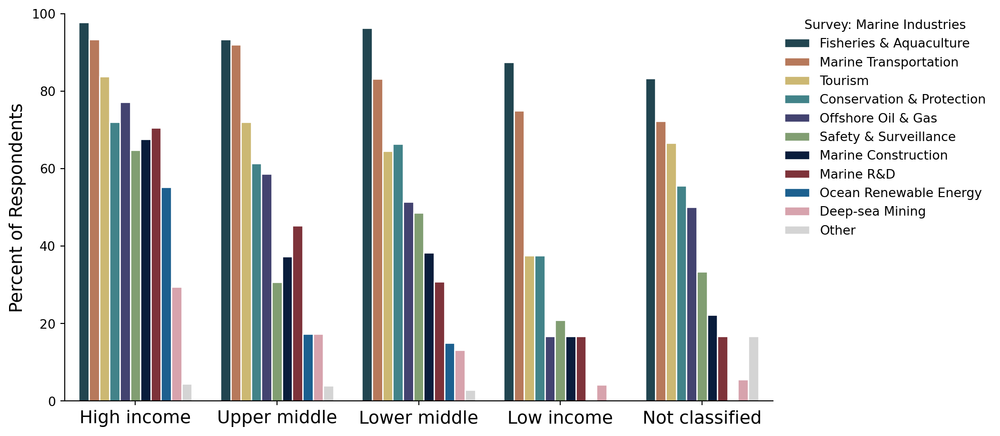

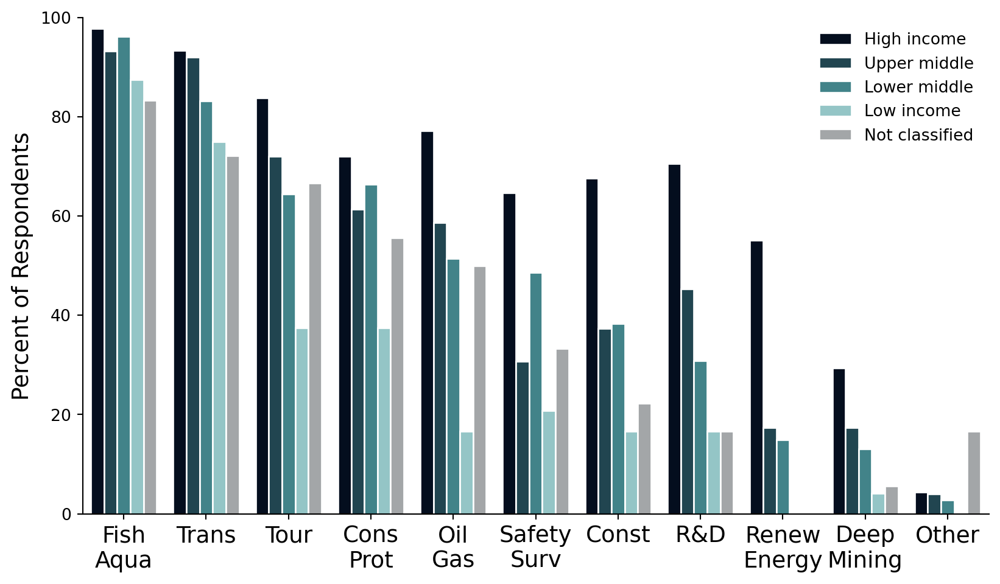

In [65]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                 y='percent',
                 hue='selection_survey_clean',
                 order=label_order[region],
                 hue_order=hue_order,
                 palette=cat_10,
                 edgecolor='white',
                 ci=None,
                 data=fig_data[region][fig_data[region]['selection_survey_clean'] != 'None of the above'])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
          loc=loc_tweaker(region, loc_tweaks),
          labels=hue_order,
          title='Survey: Marine Industries',
          fontsize=10,
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA2')

    ### AA2b

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                 y='percent',
                 hue='subregion',
                 order=hue_order,
                 hue_order=label_order[region],
                 palette=cat_d23e123_by_region[region],
                 edgecolor='white',
                 ci=None,
                 data=fig_data[region][fig_data[region]['selection_survey_clean'] != 'None of the above'])            

    ax.set_xticklabels(["Fish\nAqua",
                        "Trans",
                        "Tour",
                        "Cons\nProt",
                        "Oil\nGas",
                        "Safety\nSurv",
                        "Const",
                        "R&D",
                        "Renew\nEnergy",
                        "Deep\nMining",
                        "Other"],
                       rotation=0,
                       fontsize=14)

    ax.set_xlabel('', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
          loc=loc_tweaker(region, loc_tweaks),
          labels=['Fisheries & Aquaculture',
                  'Marine Transportation',
                  'Tourism',
                  'Conservation & Protection',
                  'Offshore Oil & Gas',
                  'Safety & Surveillance',
                  'Marine Construction',
                  'Marine R&D',
                  'Ocean Renewable Energy',
                  'Deep-sea Mining',
                  'Other'],
          title='Survey: Marine Industries',
          fontsize=10,
          title_fontsize=10)

    xaxis_key = [
        'Fisheries & Aquaculture',
        'Marine Transportation',
        'Tourism',
        'Conservation & Protection',
        'Offshore Oil & Gas',
        'Safety & Surveillance',
        'Marine Construction',
        'Marine R&D',
        'Ocean Renewable Energy',
        'Deep-sea Mining'
    ]

    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA2b')

In [66]:
# Select relevant data for bar plot
research_q7q8q9 = {}
orgtype_count = {}
for region in region_list:
    research_q7q8q9[region] = researchR[region].loc[researchR[region]['question'].isin(['Q7', 'Q8', 'Q9'])]
    print(research_q7q8q9[region].shape)

    orgtype_count[region] = (
        research_q7q8q9[region].loc[research_q7q8q9[region]['research_org_clean'] != 'FALSE', 
                        ['geoarea', 'subregion', 'research_org_clean']]
                                .copy()
                                #.drop_duplicates() # no!
                                .groupby(['subregion', 'research_org_clean'])['geoarea']
                                #.nunique() # nope!
                                .count()
                                .rename('count')
                                .reset_index())

    display(orgtype_count[region])

(2136, 33)


,subregion,research_org_clean,count
0,High income,gov,234
1,High income,lab,262
2,High income,org,152
3,Low income,gov,66
4,Low income,lab,47
5,Low income,org,47
6,Lower middle income,gov,202
7,Lower middle income,lab,194
8,Lower middle income,org,118
9,Not classified,gov,62


In [67]:
fig_data = {}
for region in region_list:
    fig_data[region] = pd.pivot_table(data=orgtype_count[region], index=['subregion'], columns=['research_org_clean'], values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region)

    display(fig_data[region])

research_org_clean,gov,lab,org
subregion,,,
High income,234,262,152
Upper middle,187,170,97
Lower middle,202,194,118
Low income,66,47,47
Not classified,62,33,56


In [68]:
# Select relevant data for line plot

fig_data_2 = {}
for region in region_list:
    country_survey_and_research_geo = country_tableR[region][['subregion','num_survey','num_research_geo']]
    country_survey_and_research_geo.set_index('subregion')

    fig_data_2[region] = country_survey_and_research_geo[['subregion','num_survey','num_research_geo']].groupby('subregion').sum()

    surveys_plus_research = fig_data_2[region][['num_survey','num_research_geo']].sum(axis=1)
    fig_data_2[region]['total'] = surveys_plus_research

    fig_data_2[region] = prep_fig_data_for_plotting(fig_data_2[region], region)
    display(fig_data_2[region])


,num_survey,num_research_geo,total
subregion,,,
High income,136,53,189
Upper middle,75,42,117
Lower middle,107,41,148
Low income,24,15,39
Not classified,18,29,47


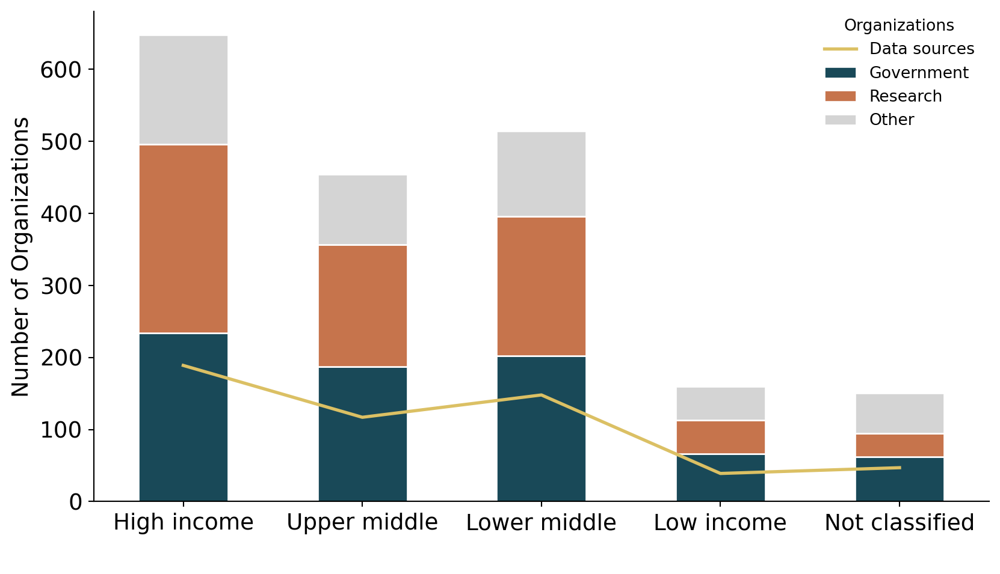

In [69]:
### Create plots

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    
    fig_data[region].plot(kind='bar', 
              stacked=True,
              legend=True,
              fontsize=14,
              color=cat_02,
              edgecolor='white',
              ax=ax)
    ax.set_xlabel('Number of GeoAreas', fontsize=14)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
          labels=['Sovereign Country', 
                  'Dependent Territory'], title='GeoArea Status', fontsize=10, title_fontsize=10)


    sns.lineplot(x='subregion',
                  y='total',
                  color='#DBC064',
                  linewidth=2,
                  ci=None,
                  data=fig_data_2[region])

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_xlabel(' ', fontsize=14)
    ax.set_ylabel('Number of Organizations', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
          loc=loc_tweaker(region, loc_tweaks),          
          labels=['Data sources',
                  'Government', 'Research', 'Other'],
          title='Organizations',
          fontsize=10,
          title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='5', letter='AA3')

## Fig AB1 - DSC Access / Presence / Satisfaction

[1080, 625, 625, 625, 625, 320, 320, 320, 320, 320, 320, 135, 135, 135, 135, 135, 135, 135, 135, 40, 40]


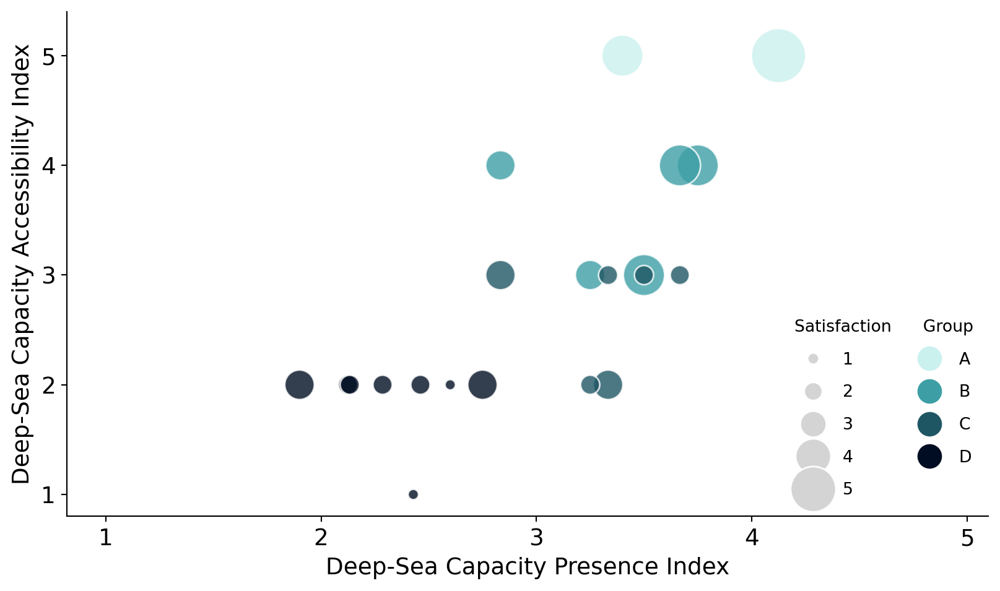

In [70]:
## Calculate fig data

fig_data = {}
for region in region_list:
    dsc_pi_means = (country_tableR[region]
                .groupby('subregion_orig')['dsc-pi-all']
                .mean()
                .rename('dsc-pi-mean'))
    dsc_ai = (country_tableR[region]
                .groupby('subregion_orig')['dsc-ai-all']
                .mean()
                .rename('dsc-ai-mean'))
    dsc_si = (country_tableR[region]
                .groupby('subregion_orig')['dsc-si-all']
                .mean()
                .fillna(0)
                .astype(int)
                .rename('dsc-si-mean'))
    dsc_group = (country_tableR[region].loc[country_tableR[region]['dsc-index-group'].notna()]
                .groupby('subregion_orig')[['subregion_orig', 'dsc-index-group']]
                .head(1))
    dsc_group = dsc_group.set_index('subregion_orig')
        
    fig_data[region] = pd.concat([dsc_pi_means, dsc_ai, dsc_si, dsc_group], axis=1)
    drops = []
    for key in ignoreR:
        drops += ignoreR[key]
    fig_data[region] = fig_data[region].drop(drops, errors='ignore')
    
    nancount = fig_data[region].isnull().sum().sum()
    if nancount > 0:
        print('warning: found {} NaNs in the data for region {}, dropping rows with NaN'.format(nancount, region), file=sys.stderr)
        rows_before = fig_data[region].shape[0]
        fig_data[region] = fig_data[region].dropna()
        rows_after = fig_data[region].shape[0]
        print('warning: dropped {} rows with NaN for region {}'.format(rows_before - rows_after, region), file=sys.stderr)
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dsc-si-mean', ascending=False)


## Plot figure

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dsc-si-mean'].tolist()]
    print(sizes)
    groups=['A', 'B', 'C', 'D']
    colors = [groups.index(x) for x in fig_data[region]['dsc-index-group'].tolist()]

    fig_data[region].plot('dsc-pi-mean', 'dsc-ai-mean', kind='scatter', 
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors,
                  cmap=matplotlib.colors.ListedColormap(val_04_rev),
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)

    ax.set_xlabel('Deep-Sea Capacity Presence Index', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Deep-Sea Capacity Accessibility Index', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.1)
    plt.ylim(0.8,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
    for i in range(0,4):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_04_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    ax.add_artist(plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Satisfaction      Group',
                             bbox_to_anchor=(1, 0.42),
                             loc='upper right'))

    outputfigs(plt, fig, ax, region, section='5', letter='AB1')

## Fig AB1b

In [71]:
## Calculate fig data

regions_to_skip = ['Global', 'Economies', 'SIDS']

dsc_pi_means = (country_tableR['Global']
            .groupby('subregion_orig')['dsc-pi-all']
            .mean()
            .rename('dsc-pi-mean'))
dsc_ai = (country_tableR['Global']
            .groupby('subregion_orig')['dsc-ai-all']
            .mean()
            .rename('dsc-ai-mean'))
dsc_si = (country_tableR['Global']
            .groupby('subregion_orig')['dsc-si-all']
            .mean()
            .fillna(0)
            .astype(int)
            .rename('dsc-si-mean'))
dsc_group = (country_tableR['Global'].loc[country_tableR['Global']['dsc-index-group'].notna()]
            .groupby('subregion_orig')[['subregion_orig', 'dsc-index-group']]
            .head(1))
dsc_group = dsc_group.set_index('subregion_orig')

fig_data_global = pd.concat([dsc_pi_means, dsc_ai, dsc_si, dsc_group], axis=1)
drops = []
for key in ignoreR:
    drops += ignoreR[key]
fig_data_global = fig_data_global.drop(drops, errors='ignore')

colors = {}
fig_data = {}
for region in region_list:
    if region in regions_to_skip:
        print('Skipping region', region);
        continue

    fig_data[region] = fig_data_global.copy()
    # sort by reverse bubble size so small bubbles are not obscured by larger ones
    fig_data[region] = fig_data[region].sort_values('dsc-si-mean', ascending=False)

    groups=['A', 'B', 'C', 'D']
    colors[region] = []
    for index in fig_data[region].index:
        if index in orderR[region]:
            group = fig_data[region].loc[index]['dsc-index-group']
            colors[region].append(val_04_rev[groups.index(group)])
        else:
            colors[region].append('#d4d4d4')


## Plot figure

w = 1920
h = 1080

for region in region_list:
    if region in regions_to_skip:
        continue

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    sizes = [((x+1)**3)*5 for x in fig_data[region]['dsc-si-mean'].tolist()]

    fig_data[region].plot('dsc-pi-mean', 'dsc-ai-mean', kind='scatter', 
                  rot=0,
                  fontsize=14,
                  s=sizes,
                  c=colors[region],
                  edgecolor='white',
                  alpha=0.8,
                  ax=ax)
    ax.set_xlabel('Deep-Sea Capacity Presence Index', fontsize=14)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_xticklabels(['1','2','3','4','5'])
    ax.set_ylabel('Deep-Sea Capacity Accessibility Index', fontsize=14)
    ax.set_yticks([1, 2, 3, 4, 5])
    ax.set_yticklabels(['1','2','3','4','5'])
    plt.xlim(0.82,5.1)
    plt.ylim(0.8,5.4)

    markers = []
    labels = []
    for i in range(0, 5):
        size = math.sqrt(((i+2)**3)*3)+2
        color = '#d4d4d4'
        labels.append(str(i+1)+'     ')
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color, markeredgecolor='white'))
    for i in range(0,4):
        size = math.sqrt(((2+2)**3)*3)+2
        color = val_04_rev[i]
        labels.append(groups[i])
        markers.append(matplotlib.lines.Line2D(range(1), range(1), color='white', marker='o', markersize=size, markerfacecolor=color))
    ax.add_artist(plt.legend(markers, labels, numpoints=1, fontsize=10, labelspacing=1, ncol=2, title='Satisfaction      Group',
                             bbox_to_anchor=(1, 0.42),
                             loc='upper right'))

    outputfigs(plt, fig, ax, region, section='5', letter='AB1b')

Skipping region Economies


## Fig AC - Distribution of DSC-PI-vessel presence (country)

subregion,High income,Upper middle,Lower middle,Low income,Not classified
dsc-pi-all,,,,,
1,4.0,4.0,4.0,2.0,7.0
2,10.0,12.0,14.0,10.0,15.0
3,15.0,10.0,11.0,3.0,4.0
4,14.0,15.0,12.0,NaN,3.0
5,10.0,1.0,NaN,NaN,NaN


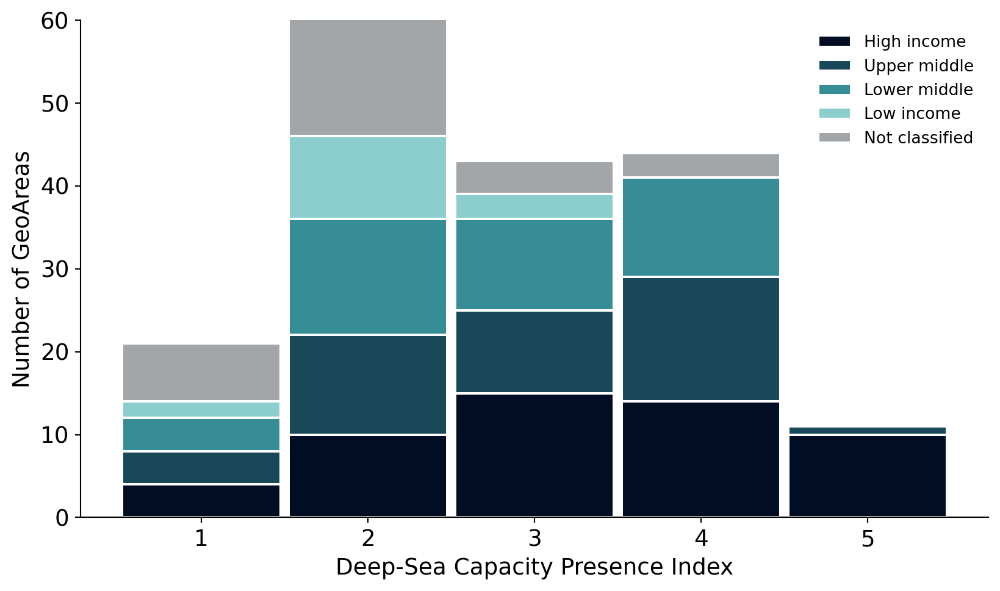

subregion,High income,Upper middle,Lower middle,Low income,Not classified
dsc-pi-vessel,,,,,
1,1.0,1.0,NaN,NaN,3.0
2,8.0,1.0,1.0,1.0,10.0
3,7.0,8.0,3.0,1.0,5.0
4,8.0,8.0,11.0,2.0,4.0
5,29.0,24.0,26.0,11.0,7.0


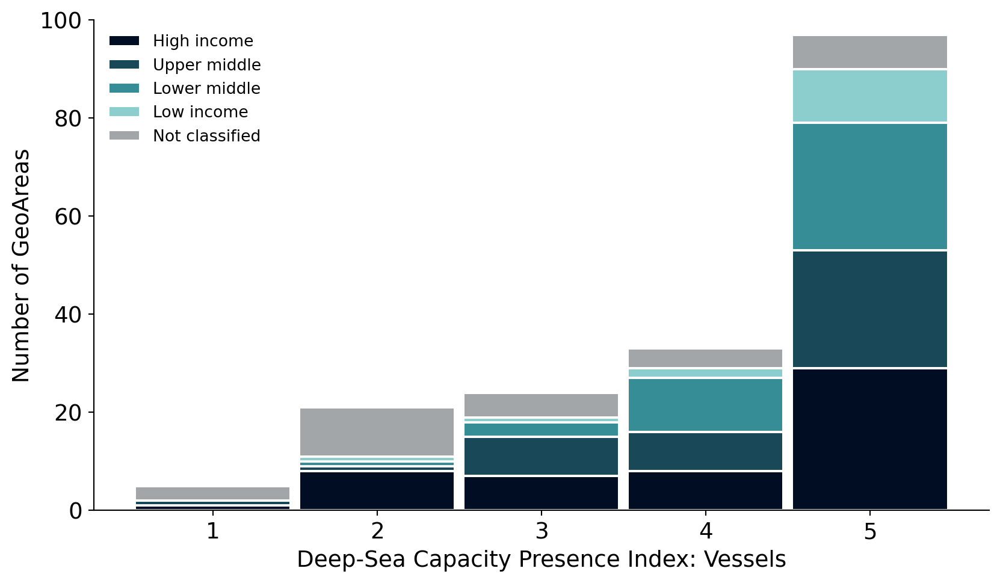

subregion,High income,Upper middle,Lower middle,Low income,Not classified
dsc-pi-dsv,,,,,
1,17.0,23.0,26.0,14.0,21.0
2,10.0,5.0,5.0,1.0,6.0
3,5.0,10.0,7.0,NaN,NaN
4,10.0,1.0,3.0,NaN,1.0
5,11.0,3.0,NaN,NaN,1.0


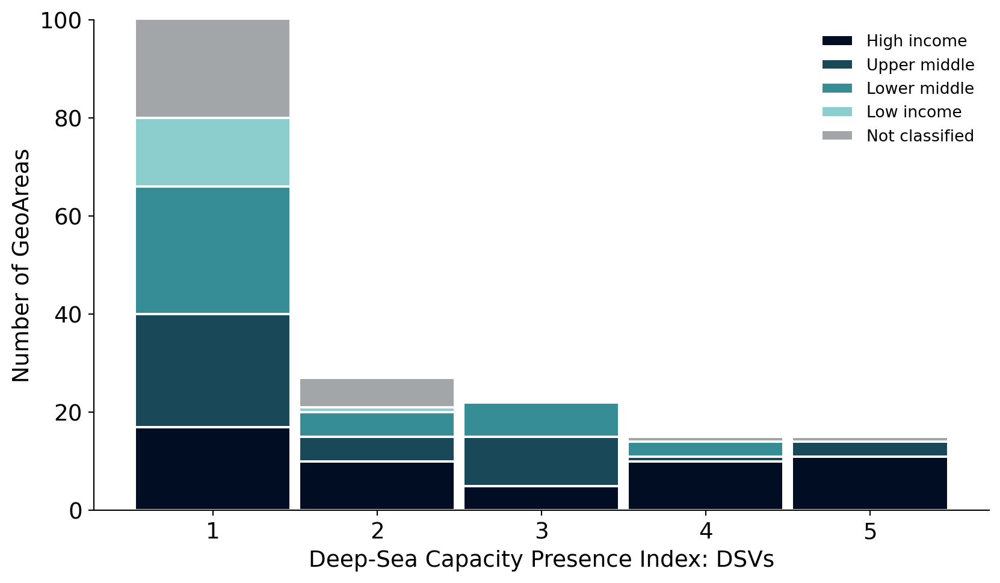

subregion,High income,Upper middle,Lower middle,Low income,Not classified
dsc-pi-sensor,,,,,
1,7.0,9.0,13.0,12.0,14.0
2,6.0,5.0,3.0,2.0,1.0
3,10.0,9.0,9.0,1.0,9.0
4,5.0,5.0,9.0,NaN,1.0
5,25.0,14.0,7.0,NaN,4.0


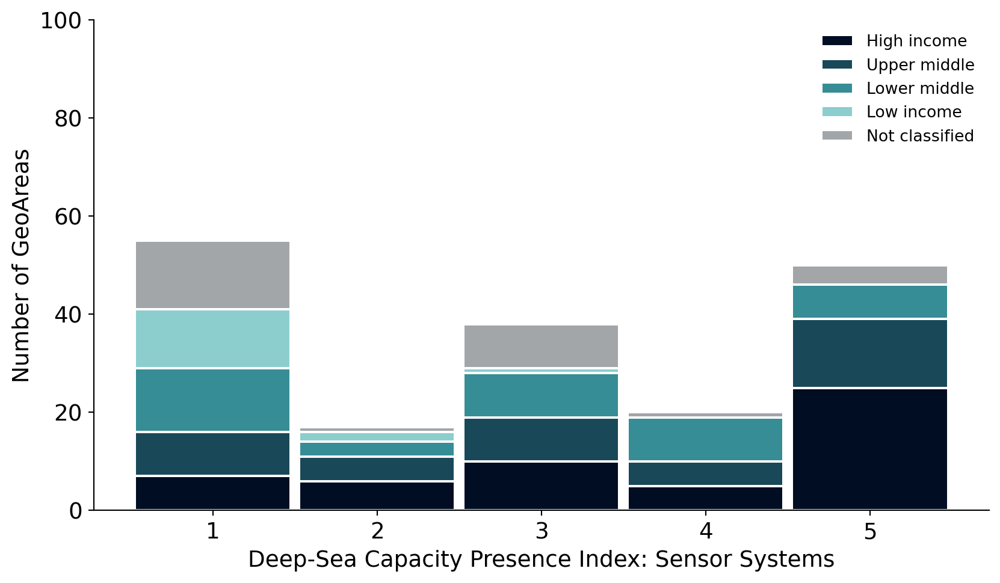

subregion,High income,Upper middle,Lower middle,Low income,Not classified
dsc-pi-data,,,,,
1,5.0,1.0,1.0,NaN,5.0
2,4.0,3.0,5.0,2.0,8.0
3,9.0,11.0,8.0,5.0,9.0
4,5.0,6.0,5.0,6.0,2.0
5,30.0,21.0,22.0,2.0,5.0


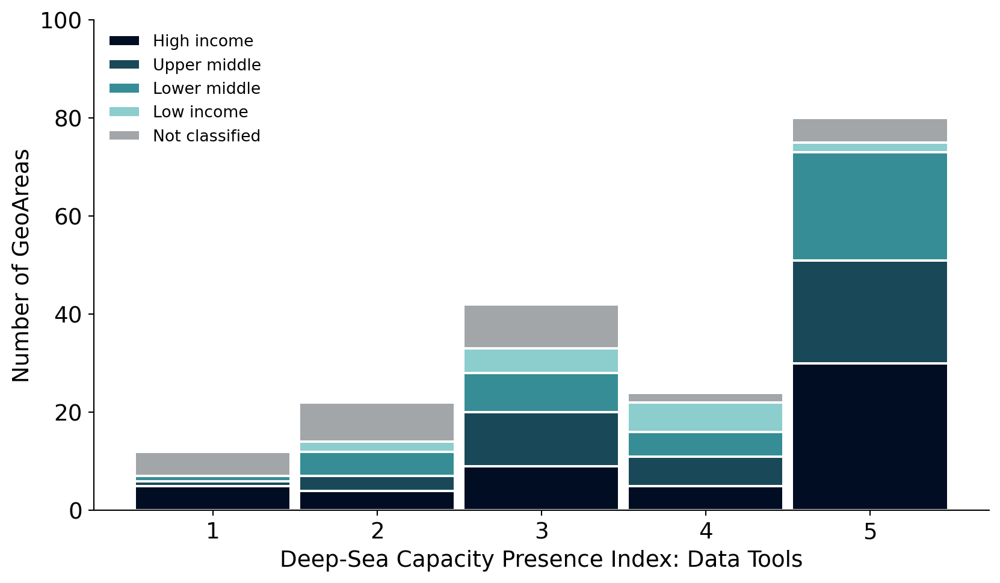

subregion,High income,Upper middle,Lower middle,Low income,Not classified
dsc-pi-org,,,,,
1,13,5,6,2,13
2,8,11,8,2,9
3,13,9,6,2,4
4,9,10,12,3,2
5,10,7,9,6,1


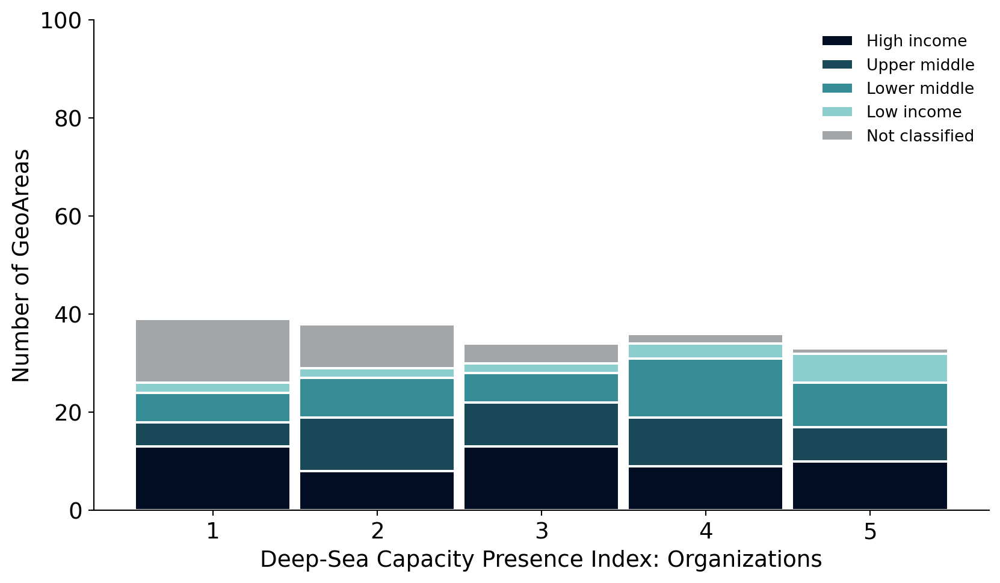

subregion,High income,Upper middle,Lower middle,Low income,Not classified
dsc-pi-ind,,,,,
1,1.0,NaN,NaN,NaN,1.0
2,1.0,4.0,NaN,2.0,6.0
3,10.0,9.0,11.0,2.0,14.0
4,27.0,22.0,19.0,7.0,5.0
5,14.0,7.0,11.0,4.0,3.0


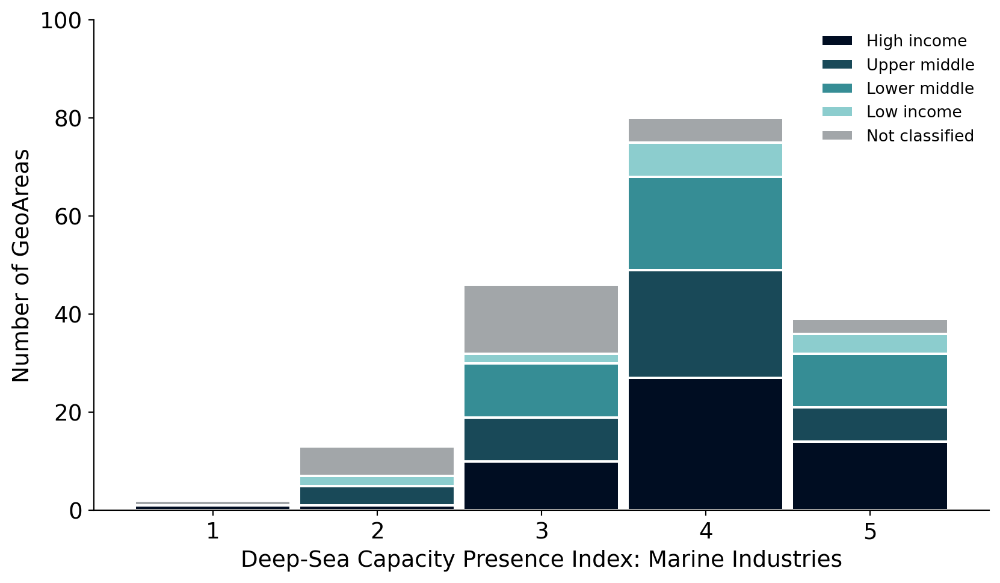

In [72]:
## Calculate fig data

dsc_types = {
    'dsc-pi-all':
        { 'x-label': 'Deep-Sea Capacity Presence Index',
          'y-label': 'Number of GeoAreas',
          'y-limit-override': 60,
          'fig-letter': 'AC1',
        },
    'dsc-pi-vessel':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Vessels',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC2'
        },
    'dsc-pi-dsv':
        { 'x-label': 'Deep-Sea Capacity Presence Index: DSVs',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC3'
        },
    'dsc-pi-sensor':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Sensor Systems',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC4'
        },
    'dsc-pi-data':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Data Tools',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC5'
        },
    'dsc-pi-org':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Organizations',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC6'
        },
    'dsc-pi-ind':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Marine Industries',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC7'
        }
}

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion'])[dsc_type]
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region][dsc_type] = fig_data[region][dsc_type].astype(int)
        fig_data[region] = fig_data[region].pivot(index=dsc_type, columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis=1)
        display(fig_data[region])

    ## Plot figure

    w = 1920
    h = 1080
    
    for region in region_list:
        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

        fig_data[region].plot(kind='bar', 
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      color=cat_d23e123_by_region[region],
                      edgecolor='white',
                      linewidth=1.5,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 100
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])

        ax.legend(fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

## Fig ACb

In [73]:
## Calculate fig data

dsc_types = {
    'dsc-pi-all':
        { 'x-label': 'Deep-Sea Capacity Presence Index',
          'y-label': 'Number of GeoAreas',
          'y-limit-override': 60,
          'fig-letter': 'AC1b'
        },
    'dsc-pi-vessel':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Vessels',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC2b'
        },
    'dsc-pi-dsv':
        { 'x-label': 'Deep-Sea Capacity Presence Index: DSVs',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC3b'
        },
    'dsc-pi-sensor':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Sensor Systems',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC4b'
        },
    'dsc-pi-data':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Data Tools',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC5b'
        },
    'dsc-pi-org':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Organizations',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC6b'
        },
    'dsc-pi-ind':
        { 'x-label': 'Deep-Sea Capacity Presence Index: Marine Industries',
          'y-label': 'Number of GeoAreas',
          'fig-letter': 'AC7b'
        }
}

regions_to_skip = ['Global', 'Economies', 'SIDS']

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        if region in regions_to_skip:
            print('Skipping region', region);
            continue

        for r in ['Global', region]:
            fig_data[r] = (country_tableR[r]
                        .groupby([dsc_type, 'subregion'])[dsc_type]
                        .count()
                        .rename('count')
                        .reset_index())
            fig_data[r][dsc_type] = fig_data[r][dsc_type].astype(int)
            fig_data[r] = fig_data[r].pivot(index=dsc_type, columns=['subregion'], values='count')
            for n in range(1,6):
                if n not in fig_data[r].index:
                    print('adding empty row for', n)
                    fig_data[r].loc[n] = 0
            fig_data[r] = fig_data[r].sort_index()
            fig_data[r] = prep_fig_data_for_plotting(fig_data[r], r, axis=1)

        display(fig_data[region])

        if region == 'Americas':
            colnum = fig_data['Global'].columns.get_loc('N America')
            fig_data['Global'] = fig_data['Global'].rename(columns={'N America': 'Old N America'})
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=['Old N America', 'L Amer & Carib'])
        else:
            colnum = fig_data['Global'].columns.get_loc(region)
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=region)
        fig_data[region] = fig_data['Global']

        display(fig_data['Global'])

    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        if region in regions_to_skip:
            continue

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      edgecolor='white',
                      linewidth=1,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 100
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])

        colors = []
        edgecolors = []
        for (columnname, data) in fig_data[region].iteritems():
            for datum in data:
                orig_columnname = undo_label_adjustment(columnname)
                if orig_columnname in orderR[region]:
                    colors.append(cat_d23e123_by_region[region][orderR[region].index(orig_columnname)])
                    edgecolors.append('black')
                else:
                    colors.append('#d4d4d4')
                    edgecolors.append('white')
        for p,color in zip(ax.patches,colors):
            p.set_facecolor(color)
        for p,edgecolor in zip(ax.patches,edgecolors):
            p.set_edgecolor(edgecolor)
            if edgecolor != 'white':
                p.set_zorder(10)

        prunedhandles = []
        prunedlabels = []
        currenthandles, currentlabels = ax.get_legend_handles_labels()   #get the handles
        for handle, label in zip(currenthandles, currentlabels):
            if undo_label_adjustment(label) in orderR[region]:
                prunedhandles.append(handle)
                prunedlabels.append(label)
        patch = matplotlib.patches.Patch(facecolor='#d4d4d4', edgecolor='white')
        prunedhandles.append(patch)
        prunedlabels.append('All other regions')

        ax.legend(prunedhandles,
                  prunedlabels,
                  fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies


## Fig AD & AE - DSC Accessibility/Satisfaction Indexes

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,1.0,NaN,1.0,NaN,NaN
2,3.0,8.0,7.0,4.0,3.0
3,3.0,4.0,3.0,1.0,1.0
4,3.0,1.0,NaN,NaN,NaN
5,2.0,NaN,NaN,NaN,NaN


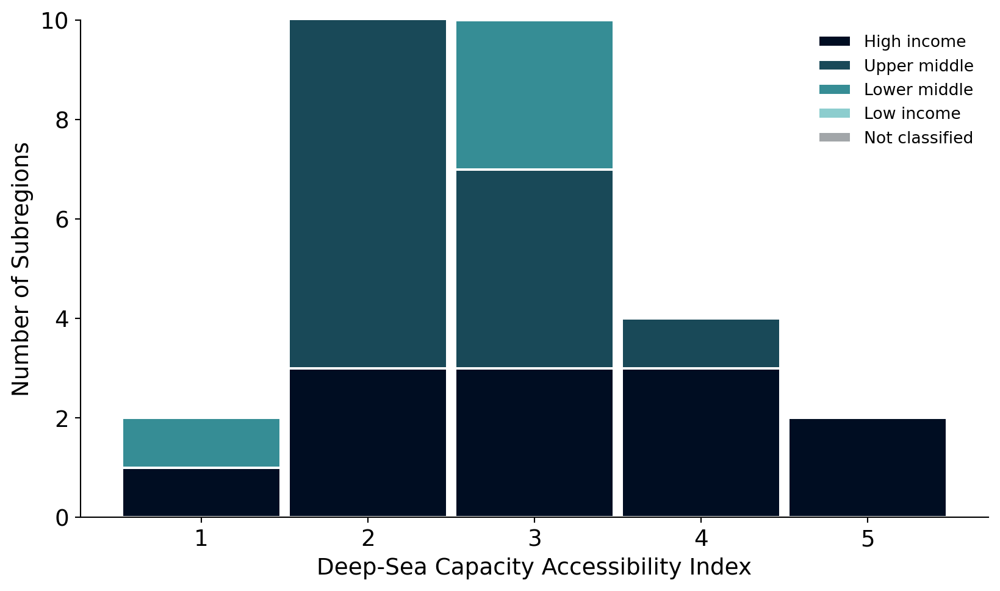

adding empty row for 5


subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,2.0,1.0,NaN,NaN,1.0
2,8.0,10.0,11.0,5.0,2.0
3,2.0,1.0,NaN,NaN,NaN
4,NaN,1.0,NaN,NaN,1.0
5,0.0,0.0,0.0,0.0,0.0


adding empty row for 5


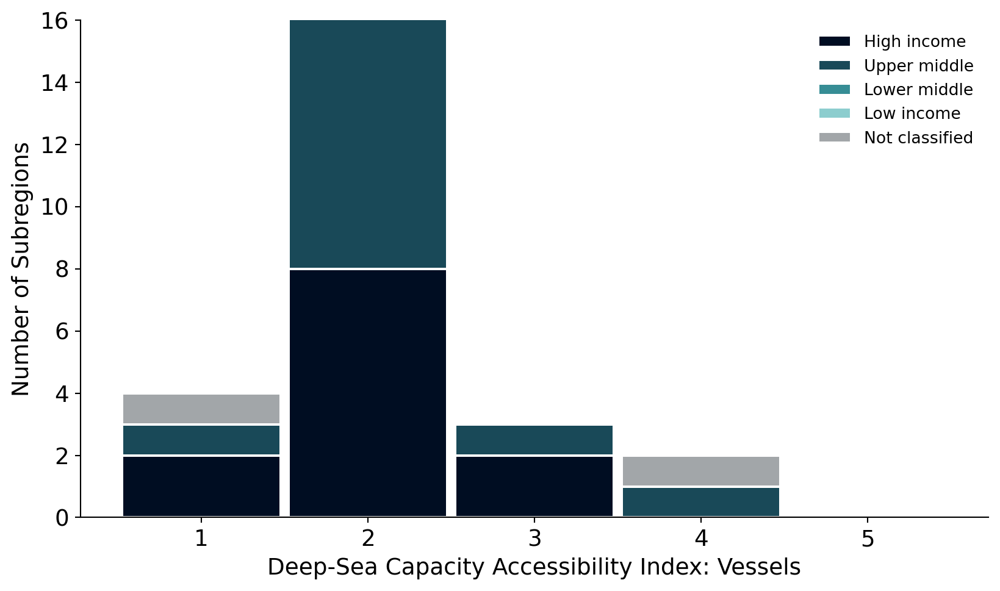

adding empty row for 5


subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,4.0,10.0,10.0,4.0,3.0
2,3.0,3.0,NaN,1.0,1.0
3,1.0,NaN,NaN,NaN,NaN
4,3.0,NaN,NaN,NaN,NaN
5,0.0,0.0,0.0,0.0,0.0


adding empty row for 5


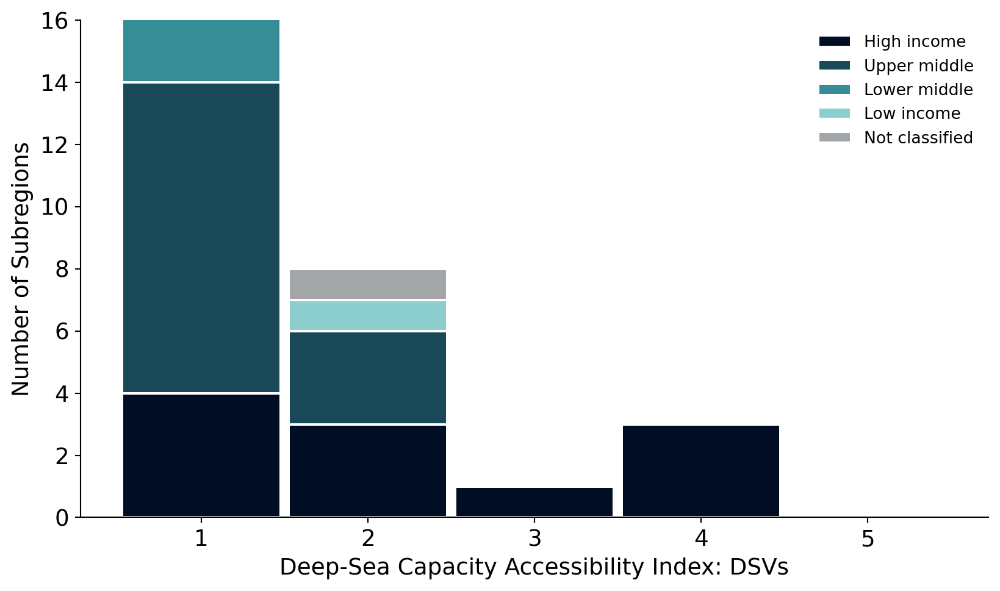

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,NaN,1.0,NaN,NaN,1.0
2,3.0,6.0,6.0,3.0,2.0
3,1.0,3.0,3.0,1.0,NaN
4,5.0,3.0,1.0,1.0,1.0
5,2.0,NaN,NaN,NaN,NaN


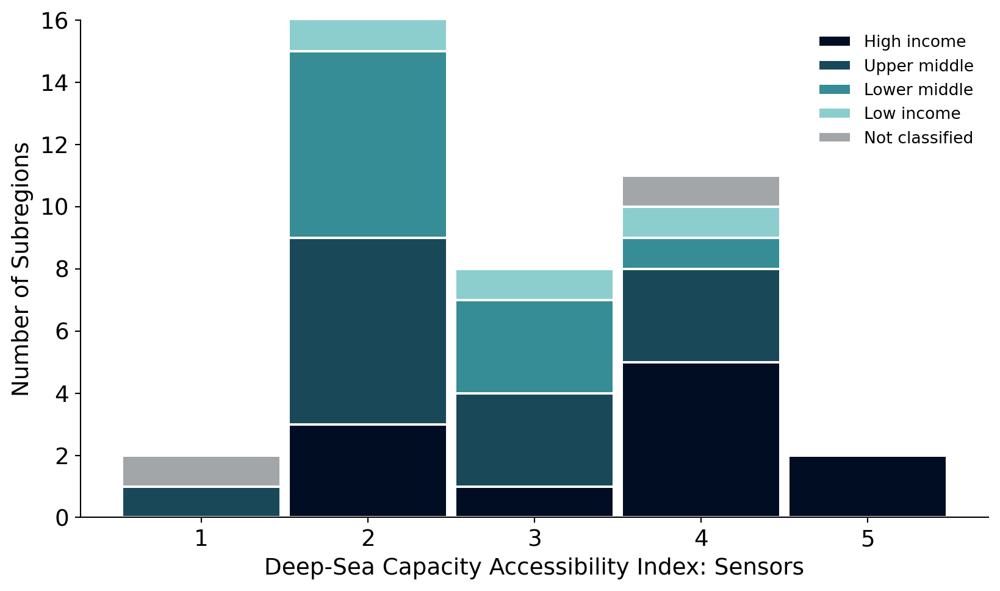

adding empty row for 1


subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,0.0,0.0,0.0,0.0,0.0
2,2.0,3.0,3.0,2.0,NaN
3,4.0,8.0,5.0,3.0,4.0
4,2.0,1.0,1.0,NaN,NaN
5,3.0,1.0,1.0,NaN,NaN


adding empty row for 1


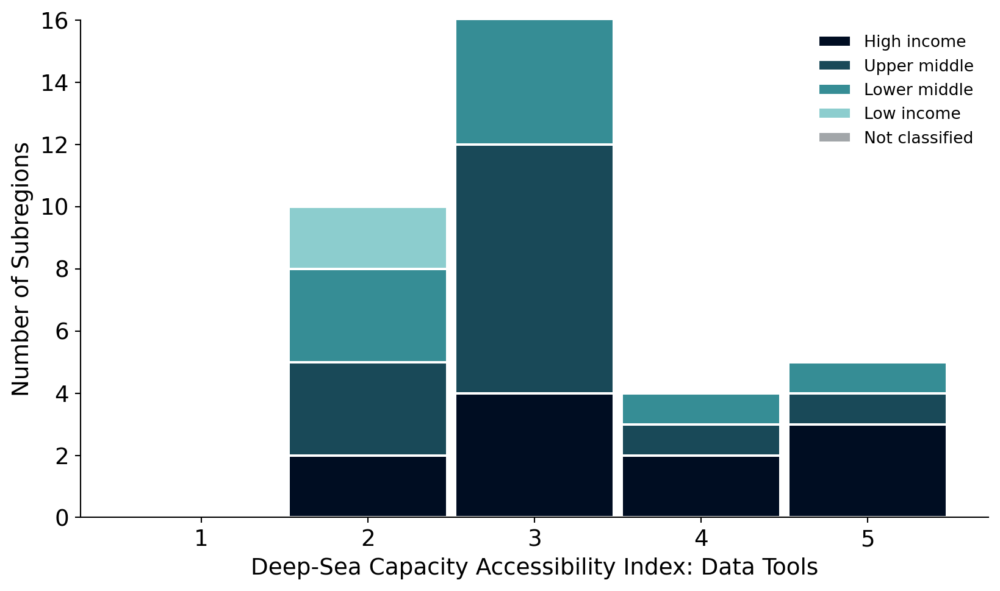

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,1.0,1.0,2.0,NaN,NaN
2,3.0,6.0,6.0,3.0,2.0
3,3.0,5.0,3.0,2.0,2.0
4,4.0,1.0,NaN,NaN,NaN
5,1.0,NaN,NaN,NaN,NaN


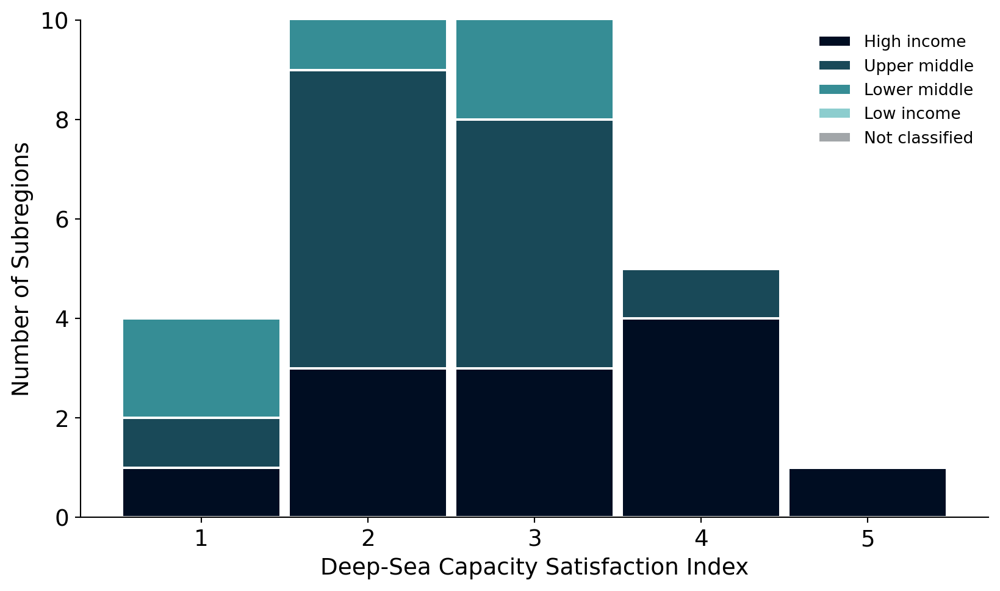

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,2.0,5.0,5.0,3.0,2.0
2,4.0,6.0,3.0,1.0,2.0
3,2.0,2.0,3.0,1.0,NaN
4,1.0,NaN,NaN,NaN,NaN
5,3.0,NaN,NaN,NaN,NaN


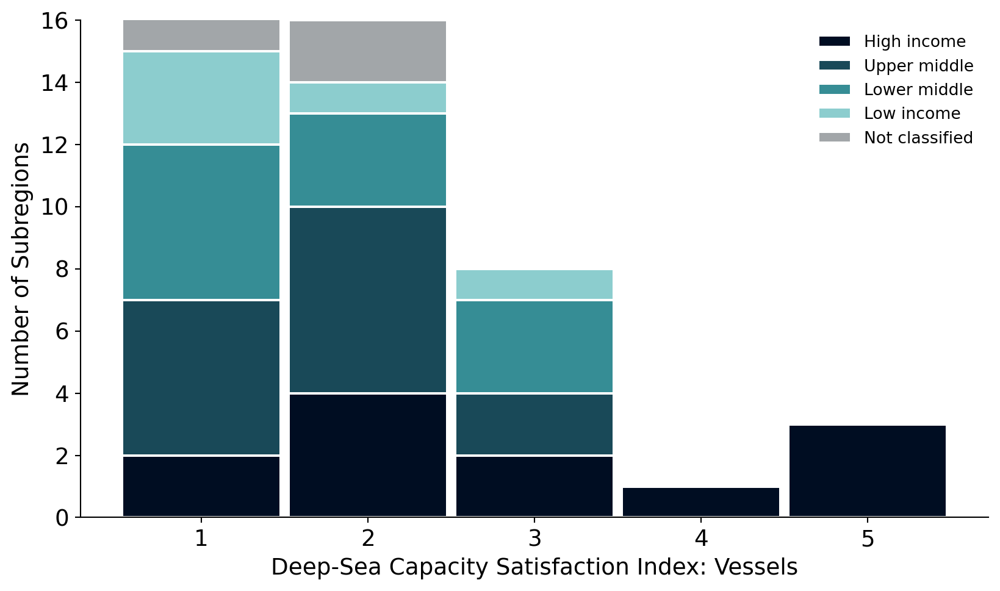

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,2.0,3.0,3.0,1.0,1.0
2,4.0,7.0,5.0,3.0,2.0
3,1.0,1.0,1.0,1.0,1.0
4,3.0,1.0,NaN,NaN,NaN
5,1.0,NaN,NaN,NaN,NaN


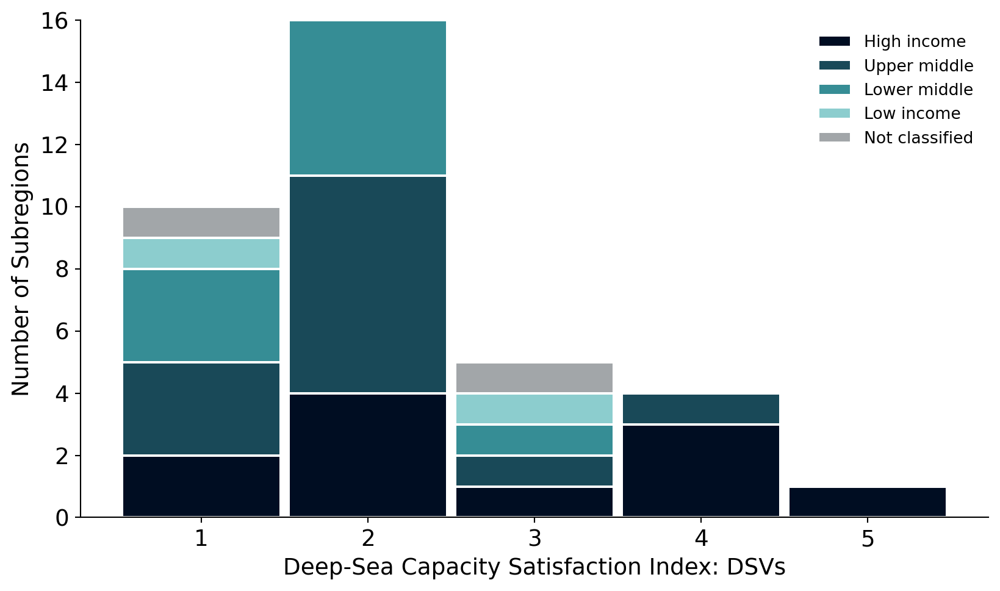

subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,1.0,1.0,1.0,NaN,1.0
2,2.0,5.0,5.0,3.0,1.0
3,2.0,3.0,2.0,2.0,1.0
4,4.0,3.0,1.0,NaN,1.0
5,2.0,1.0,1.0,NaN,NaN


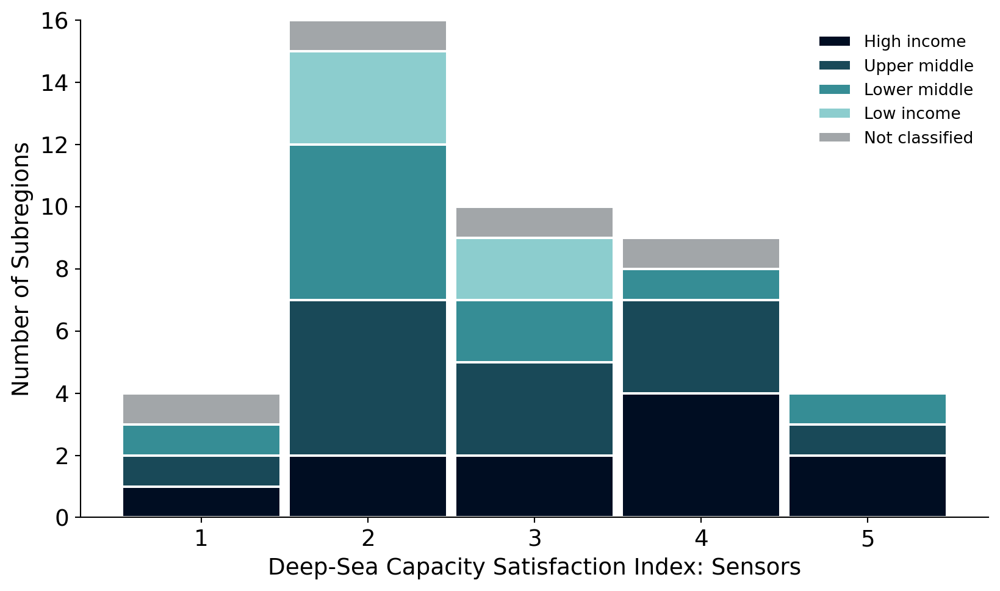

adding empty row for 4


subregion,High income,Upper middle,Lower middle,Low income,Not classified
mean,,,,,
1,2.0,5.0,3.0,2.0,3.0
2,3.0,4.0,5.0,2.0,NaN
3,5.0,3.0,1.0,1.0,1.0
4,0.0,0.0,0.0,0.0,0.0
5,1.0,1.0,1.0,NaN,NaN


adding empty row for 4


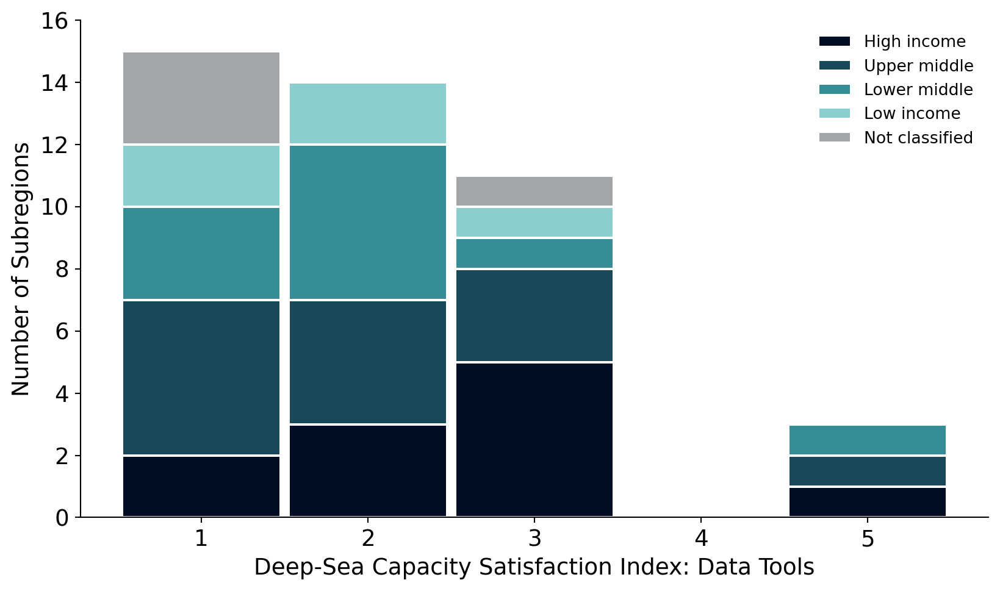

In [74]:
## Calculate fig data

dsc_types = {
    'dsc-ai-all':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AD1'
        },
    'dsc-ai-vessel':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD2'
        },
    'dsc-ai-dsv':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD3'
        },
    'dsc-ai-sensor':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD4'
        },
    'dsc-ai-data':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD5'
        },
    'dsc-si-all':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AE1'
        },
    'dsc-si-vessel':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE2'
        },
    'dsc-si-dsv':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE3'
        },
    'dsc-si-sensor':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE4'
        },
    'dsc-si-data':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE5'
        }
}

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                    .mean()
                    .rename('mean')
                    .reset_index())
        fig_data[region] = (fig_data[region]
                    .groupby(['mean', 'subregion'])['mean']
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region]['mean'] = fig_data[region]['mean'].astype(int)
        fig_data[region] = fig_data[region].pivot(index='mean', columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis=1)
        display(fig_data[region])

    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        r = region
        fig_data[region] = (country_tableR[region]
                    .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                    .mean()
                    .rename('mean')
                    .reset_index())
        fig_data[region] = (fig_data[region]
                    .groupby(['mean', 'subregion'])['mean']
                    .count()
                    .rename('count')
                    .reset_index())
        fig_data[region]['mean'] = fig_data[region]['mean'].astype(int)

        fig_data[region] = fig_data[region].pivot(index='mean', columns=['subregion'], values='count')
        for n in range(1,6):
            if n not in fig_data[region].index:
                print('adding empty row for', n)
                fig_data[region].loc[n] = 0
        fig_data[region] = fig_data[region].sort_index()
        fig_data[region] = prep_fig_data_for_plotting(fig_data[region], r, axis=1)

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      color=cat_d23e123_by_region[region],
                      edgecolor='white',
                      linewidth=1.5,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 16
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])

        ax.legend(fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

## Fig ADb & AEb

In [75]:
## Calculate fig data

dsc_types = {
    'dsc-ai-all':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AD1b'
        },
    'dsc-ai-vessel':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD2b'
        },
    'dsc-ai-dsv':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD3b'
        },
    'dsc-ai-sensor':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD4b'
        },
    'dsc-ai-data':
        { 'x-label': 'Deep-Sea Capacity Accessibility Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AD5b'
        },
    'dsc-si-all':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index',
          'y-label': 'Number of Subregions',
          'y-limit-override': 10,
          'fig-letter': 'AE1b'
        },
    'dsc-si-vessel':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Vessels',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE2b'
        },
    'dsc-si-dsv':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: DSVs',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE3b'
        },
    'dsc-si-sensor':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Sensors',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE4b'
        },
    'dsc-si-data':
        { 'x-label': 'Deep-Sea Capacity Satisfaction Index: Data Tools',
          'y-label': 'Number of Subregions',
          'fig-letter': 'AE5b'
        }
}

regions_to_skip = ['Global', 'Economies', 'SIDS']

for dsc_type, labels in dsc_types.items():
    fig_data = {}
    for region in region_list:
        if region in regions_to_skip:
            print('Skipping region', region);
            continue

        for r in ['Global', region]:
            fig_data[r] = (country_tableR[r]
                        .groupby([dsc_type, 'subregion', 'subregion_orig'])[dsc_type]
                        .mean()
                        .rename('mean')
                        .reset_index())
            fig_data[r] = (fig_data[r]
                        .groupby(['mean', 'subregion'])['mean']
                        .count()
                        .rename('count')
                        .reset_index())
            fig_data[r]['mean'] = fig_data[r]['mean'].astype(int)

            fig_data[r] = fig_data[r].pivot(index='mean', columns=['subregion'], values='count')
            for n in range(1,6):
                if n not in fig_data[r].index:
                    print('adding empty row for', n)
                    fig_data[r].loc[n] = 0
            fig_data[r] = fig_data[r].sort_index()
            fig_data[r] = prep_fig_data_for_plotting(fig_data[r], r, axis=1)

        if region == 'Americas':
            colnum = fig_data['Global'].columns.get_loc('N America')
            fig_data['Global'] = fig_data['Global'].rename(columns={'N America': 'Old N America'})
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=['Old N America', 'L Amer & Carib'])
        else:
            colnum = fig_data['Global'].columns.get_loc(region)
            i=0
            for columnname, column in fig_data[region].iteritems():
                fig_data['Global'].insert(colnum+i, columnname, column)
                i+=1
            fig_data['Global'] = fig_data['Global'].drop(columns=region)
        fig_data[region] = fig_data['Global']

        display(fig_data['Global'])


    ## Plot figures

    w = 1920
    h = 1080
    
    for region in region_list:
        if region in regions_to_skip:
            continue

        fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
        fig_data[region].plot(kind='bar',
                      stacked=True,
                      rot=0,
                      fontsize=14,
                      width=0.95,
                      edgecolor='white',
                      linewidth=1,
                      ax=ax)
        ax.set_xlabel(labels['x-label'], fontsize=14)
        ax.set_ylabel(labels['y-label'], fontsize=14)
        plt.locator_params(axis='y', integer=True)
        ylim_max = 16
        if 'y-limit-override' in labels:
            ylim_max = labels['y-limit-override']
        ax.set_ylim([0, ylim_max])
        
        colors = []
        edgecolors = []
        linewidths = []
        for (columnname, data) in fig_data[region].iteritems():
            for datum in data:
                orig_columnname = undo_label_adjustment(columnname)
                if orig_columnname in orderR[region]:
                    colors.append(cat_d23e123_by_region[region][orderR[region].index(orig_columnname)])
                    edgecolors.append('black')
                    linewidths.append(1)
                else:
                    colors.append('#d4d4d4')
                    edgecolors.append('white')
                    linewidths.append(1)
        for p,color in zip(ax.patches,colors):
            p.set_facecolor(color)
        for p,edgecolor in zip(ax.patches,edgecolors):
            p.set_edgecolor(edgecolor)
            if edgecolor != 'white':
                p.set_zorder(10)
        for p,linewidth in zip(ax.patches,linewidths):
            p.set_linewidth(linewidth)

        prunedhandles = []
        prunedlabels = []
        currenthandles, currentlabels = ax.get_legend_handles_labels()   #get the handles
        for handle, label in zip(currenthandles, currentlabels):
            if undo_label_adjustment(label) in orderR[region]:
                prunedhandles.append(handle)
                prunedlabels.append(label)
        patch = matplotlib.patches.Patch(facecolor='#d4d4d4', edgecolor='white')
        prunedhandles.append(patch)
        prunedlabels.append('All other regions')

        ax.legend(prunedhandles,
                  prunedlabels,
                  fontsize=10,
                  title_fontsize=10)

        outputfigs(plt, fig, ax, region, section='5', letter=labels['fig-letter'])

Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies
Skipping region Economies


---
# **Section 6**

## Fig K - Research: Vessel presence

In [76]:
## Calculate values for plot

vessel_presence = {}
label_order = {}
fig_data = {}
for region in region_list:
    vessel_presence[region] = researchR[region].loc[(researchR[region]['question'] == 'Q13')
                                   & (researchR[region]['col_name'] != 'Q13_comments')
                                   & (researchR[region]['col_name'] != 'Q13_other'),
                                                                             ['geoarea',
                                                                              'col_name',
                                                                              'subregion',
                                                                              'research_tech_clean']]
    vessel_presence[region]['selection_binary'] = vessel_presence[region]['research_tech_clean']
    fig_data[region] = (vessel_presence[region].groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = vessel_presence[region].groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q13_research':     'Research',
        'Q13_fishing':      'Fishing',
        'Q13_recreational': 'Recreational',
        'Q13_traditional':  'Traditional',
        'Q13_cruise':       'Cruise',
        'Q13_navy':         'Navy',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'cruise'):('count', 'traditional')].sum()
    pivoted.loc['Total', ('percent', 'cruise'):('percent', 'traditional')] = \
        ((pivoted.loc['Total', ('count', 'cruise'):('count', 'traditional')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

count                                                   \
col_name       Cruise Fishing   Navy Recreational Research Traditional   
subregion                                                                
High income      29.0    48.0   38.0         49.0     37.0        30.0   
Low income       10.0    15.0   15.0         13.0      5.0        13.0   
Lower middle     29.0    40.0   36.0         36.0     22.0        30.0   
Not classified   11.0    23.0   10.0         23.0     10.0        13.0   
Upper middle     25.0    39.0   34.0         38.0     31.0        25.0   
Total           104.0   165.0  133.0        159.0    105.0       111.0   

               percent                                                    
col_name        Cruise Fishing    Navy Recreational Research Traditional  
subregion                                                                 
High income      54.72   90.57   71.70        92.45    69.81       56.60  
Low income       66.67  100.00  100.00        86.67    33.33       86.67  
Lower middle     70.73   97.56   87.80        87.80    53.66       73.17  
Not classified   37.93   79.31   34.48        79.31    34.48       44.83  
Upper middle     59.52   92.86   80.95        90.48    73.81       59.52  
Total           289.57  460.30  374.93       436.71   265.09      320.79

In [77]:
## Names of GeoAreas with all types present

for region in region_list:
    num_types = (vessel_presence[region][vessel_presence[region]['col_name'] != 'Q13_other']
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    num_types[num_types['num_types'] == num_types['num_types'].max()]
    
    ## Names of GeoAreas with fewest types present
    num_types[num_types['num_types'] == num_types['num_types'].min()]
    
    ## % of areas in region that have all types -- OTHER EXCLUDED
    num_types = (vessel_presence[region][vessel_presence[region]['col_name'] != 'Q13_other']
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    round((num_types[num_types['num_types'] == 6].shape[0]/num_types.shape[0])*100, 2)
    
    ## % of areas in region with < 3 types -- OTHER INCLUDED
    num_types = (vessel_presence[region]
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2)

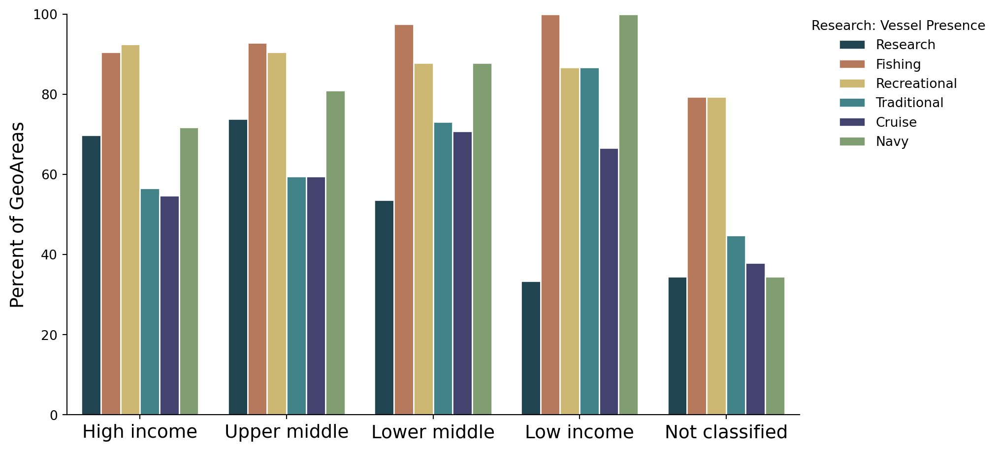

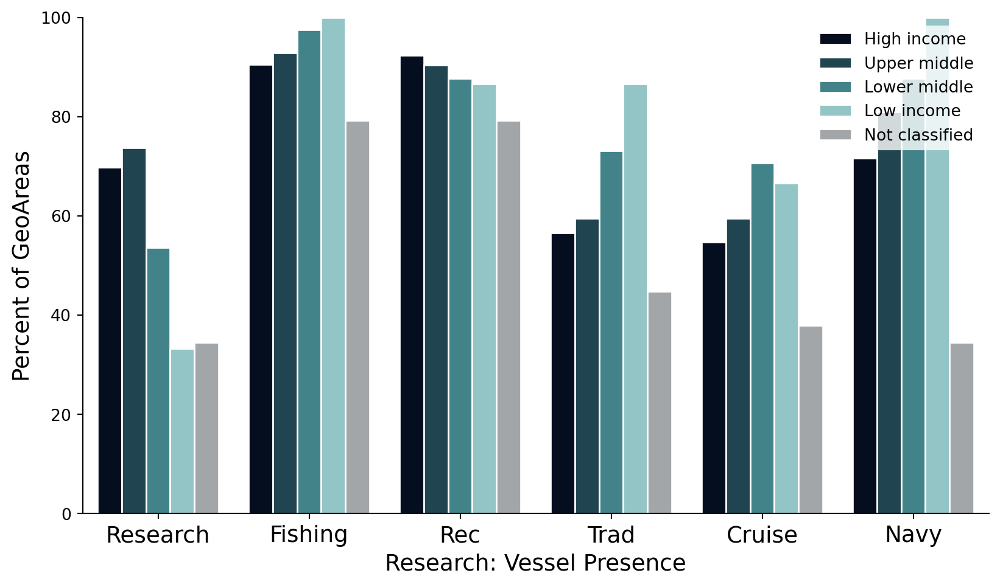

In [78]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_06,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Vessel Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='K1')

    ## K2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(['Research', 'Fishing', 'Rec', 'Trad', 'Cruise', 'Navy'], rotation=0, fontsize=14)
    ax.set_xlabel('Research: Vessel Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='K2')

## Fig L - Q12/13: Vessel presence

In [79]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
fig_data = {}
percent_data = {}
for region in region_list:
    vessels = dataR[region].loc[dataR[region]['question'] == 'Q13', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data[region] = (vessels.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    renames = {
        'Research vessels':               'Research',
        'Fishing vessels':                'Fishing',
        'Recreational vessels':           'Recreational',
        'Traditional vessels':            'Traditional',
        'Cruise ships':                   'Cruise',
        'Other':                          'Other',
        "I don't have access to vessels": 'None of the above',
    }
    hue_order = renames.values()
    fig_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    # Calculate percentages
    percent_data[region] = fig_data[region].copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    num_respondents_per_subregion['subregion'].replace(label_adjustments, inplace=True)

    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data[region]['total'] = percent_data[region]['subregion']
    percent_data[region]['total'].replace(respondent_sub_dict, inplace=True)
    percent_data[region]['percent'] = round((percent_data[region]['count']/percent_data[region]['total'])*100, 2)

    pivoted = percent_data[region].pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/101)*num_respondents, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)

count                                         \
subregion              High income Low income Lower middle Not classified   
selection_survey_clean                                                      
Cruise                        10.0        NaN         10.0            2.0   
Fishing                       43.0        9.0         52.0            7.0   
None of the above             23.0        9.0         36.0            7.0   
Other                         17.0        3.0         12.0            5.0   
Recreational                  26.0        1.0         11.0            7.0   
Research                      97.0        2.0         44.0            4.0   
Traditional                   14.0        7.0         26.0            3.0   
Total                        136.0       24.0        105.0           18.0   

                                        percent                          \
subregion              Upper middle High income Low income Lower middle   
selection_survey_clean                                                    
Cruise                          1.0        7.35        NaN         9.52   
Fishing                        24.0       31.62      37.50        49.52   
None of the above              20.0       16.91      37.50        34.29   
Other                          18.0       12.50      12.50        11.43   
Recreational                   13.0       19.12       4.17        10.48   
Research                       37.0       71.32       8.33        41.90   
Traditional                     8.0       10.29      29.17        24.76   
Total                          75.0      482.06      85.07       372.18   

                                                    count percent  
subregion              Not classified Upper middle  Total   Total  
selection_survey_clean                                             
Cruise                          11.11         1.33   23.0    6.42  
Fishing                         38.89        32.00  135.0   37.71  
None of the above               38.89        26.67   95.0   26.54  
Other                           27.78        24.00   55.0   15.36  
Recreational                    38.89        17.33   58.0   16.20  
Research                        22.22        49.33  184.0   51.40  
Traditional                     16.67        10.67   58.0   16.20  
Total                           63.80       265.84  358.0  100.00

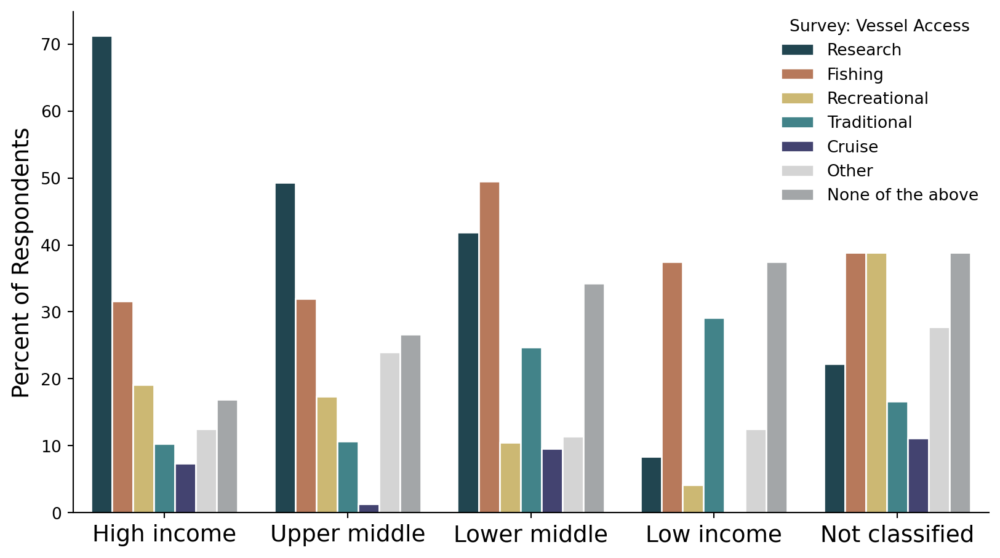

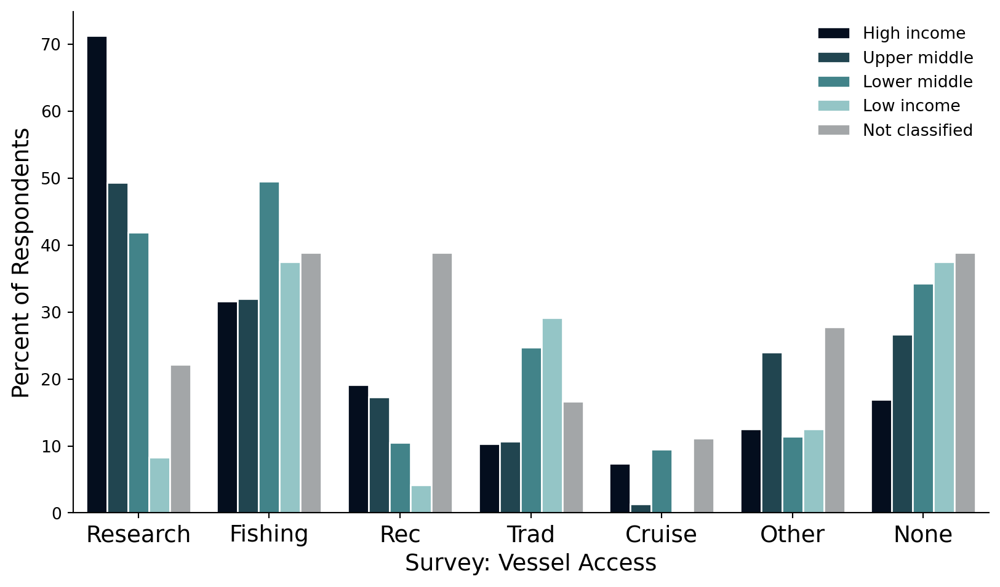

In [80]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_05 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    # ax.set_yticks([0, 5, 10, 15, 20])
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc=loc_tweaker(region, loc_tweaks),
              title='Survey: Vessel Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='L1')
    
    ## L2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(['Research', 'Fishing', 'Rec', 'Trad', 'Cruise', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Vessel Access', fontsize=14)
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='6', letter='L2')

## Fig M - Q14: Vessel satisfaction

In [81]:
## Select data

satisfaction = {}
missing_responses = {}
for region in region_list:
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q14', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q14_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]
    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])
    display(satisfaction[region].head())

,col_name,subregion,geoarea,respondent_id,selection,selection_other,row_num
9720,Q14_availability,High income,Portugal,12803251122,1 - Very dissatisfied,1 - Very dissatisfied,0
9721,Q14_availability,Upper middle income,Fiji,12707579765,1 - Very dissatisfied,1 - Very dissatisfied,1
9722,Q14_availability,Not classified,Venezuela,12906593096,1 - Very dissatisfied,1 - Very dissatisfied,2
9723,Q14_availability,Not classified,Cook Islands,12671701920,1 - Very dissatisfied,1 - Very dissatisfied,3
9724,Q14_availability,Low income,Madagascar,12897429486,1 - Very dissatisfied,1 - Very dissatisfied,4


In [82]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [83]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                         46.0       31.0   
2 - Dissatisfied                             117.0       30.0   
3 - Neither satisfied nor dissatisfied       119.0       13.0   
4 - Satisfied                                226.0       12.0   
5 - Very satisfied                            90.0        6.0   
Total                                        598.0       92.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 83.0           37.0   
2 - Dissatisfied                                     118.0           21.0   
3 - Neither satisfied nor dissatisfied               117.0            6.0   
4 - Satisfied                                        132.0            9.0   
5 - Very satisfied                                    23.0            NaN   
Total                                                473.0           73.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 46.0        7.69   
2 - Dissatisfied                                     110.0       19.57   
3 - Neither satisfied nor dissatisfied                71.0       19.90   
4 - Satisfied                                         78.0       37.79   
5 - Very satisfied                                    10.0       15.05   
Total                                                315.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       33.70               17.55   
2 - Dissatisfied                            32.61               24.95   
3 - Neither satisfied nor dissatisfied      14.13               24.74   
4 - Satisfied                               13.04               27.91   
5 - Very satisfied                           6.52                4.86   
Total                                      100.00              100.01   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           50.68               14.60   
2 - Dissatisfied                                28.77               34.92   
3 - Neither satisfied nor dissatisfied           8.22               22.54   
4 - Satisfied                                   12.33               24.76   
5 - Very satisfied                                NaN                3.17   
Total                                          100.00               99.99   

                                         count percent  
subregion                                Total   Total  
selection                                               
1 - Very dissatisfied                    243.0   15.67  
2 - Dissatisfied                         396.0   25.53  
3 - Neither satisfied nor dissatisfied   326.0   21.02  
4 - Satisfied                            457.0   29.46  
5 - Very satisfied                       129.0    8.32  
Total                                   1551.0  100.00

In [84]:
## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
## NA for more than one question

for region in region_list:
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)

subregion,High income,Low income,Lower middle income,Not classified,Upper middle income,Total
col_name,,,,,,
Q14_availability,16,4,11,3,12,46
Q14_capabilities,16,5,13,3,11,48
Q14_cost,16,6,14,4,12,52
Q14_duration,18,8,12,3,14,55
Q14_other,136,24,107,18,75,360
Q14_size,16,5,12,4,11,48


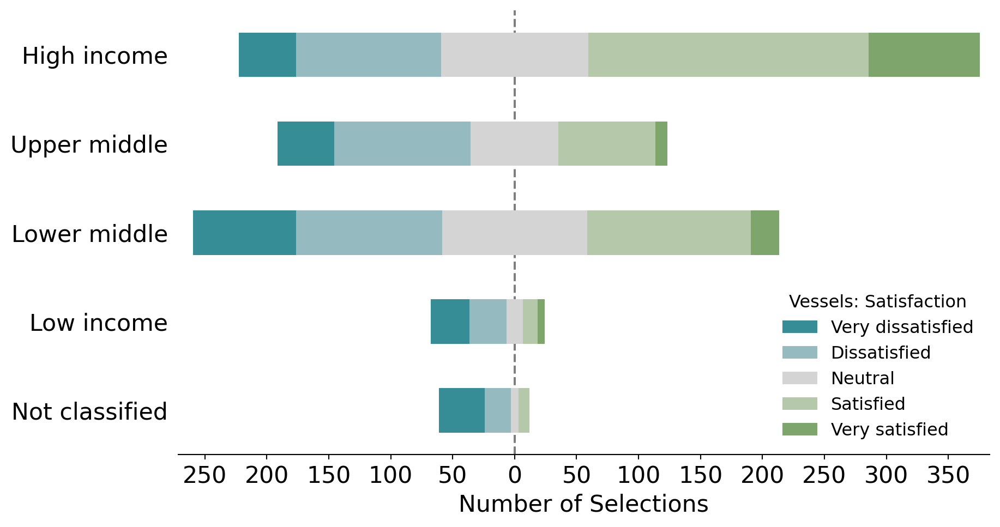

In [85]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M1')

### Vessel satisfaction plot #2.

In [86]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Availability', 'Capabilities', 'Cost', 'Duration', 'Size']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Size', 'Duration']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)



In [87]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                   \
col_name                               Q14_availability Q14_capabilities   
selection                                                                  
1 - Very dissatisfied                              61.0             51.0   
2 - Dissatisfied                                   88.0             96.0   
3 - Neither satisfied nor dissatisfied             65.0             57.0   
4 - Satisfied                                      90.0             79.0   
5 - Very satisfied                                 10.0             29.0   
Total                                             314.0            312.0   

                                                                       \
col_name                               Q14_cost Q14_duration Q14_size   
selection                                                               
1 - Very dissatisfied                      52.0         39.0     40.0   
2 - Dissatisfied                           71.0         76.0     65.0   
3 - Neither satisfied nor dissatisfied     75.0         66.0     63.0   
4 - Satisfied                              91.0         96.0    101.0   
5 - Very satisfied                         19.0         28.0     43.0   
Total                                     308.0        305.0    312.0   

                                                percent                   \
col_name                               Q14_availability Q14_capabilities   
selection                                                                  
1 - Very dissatisfied                             19.43            16.35   
2 - Dissatisfied                                  28.03            30.77   
3 - Neither satisfied nor dissatisfied            20.70            18.27   
4 - Satisfied                                     28.66            25.32   
5 - Very satisfied                                 3.18             9.29   
Total                                            100.00           100.00   

                                                                        count  \
col_name                               Q14_cost Q14_duration Q14_size   Total   
selection                                                                       
1 - Very dissatisfied                     16.88        12.79    12.82   243.0   
2 - Dissatisfied                          23.05        24.92    20.83   396.0   
3 - Neither satisfied nor dissatisfied    24.35        21.64    20.19   326.0   
4 - Satisfied                             29.55        31.48    32.37   457.0   
5 - Very satisfied                         6.17         9.18    13.78   129.0   
Total                                    100.00       100.01    99.99  1551.0   

                                       percent  
col_name                                 Total  
selection                                       
1 - Very dissatisfied                    15.67  
2 - Dissatisfied                         25.53  
3 - Neither satisfied nor dissatisfied   21.02  
4 - Satisfied                            29.46  
5 - Very satisfied                        8.32  
Total                                   100.00

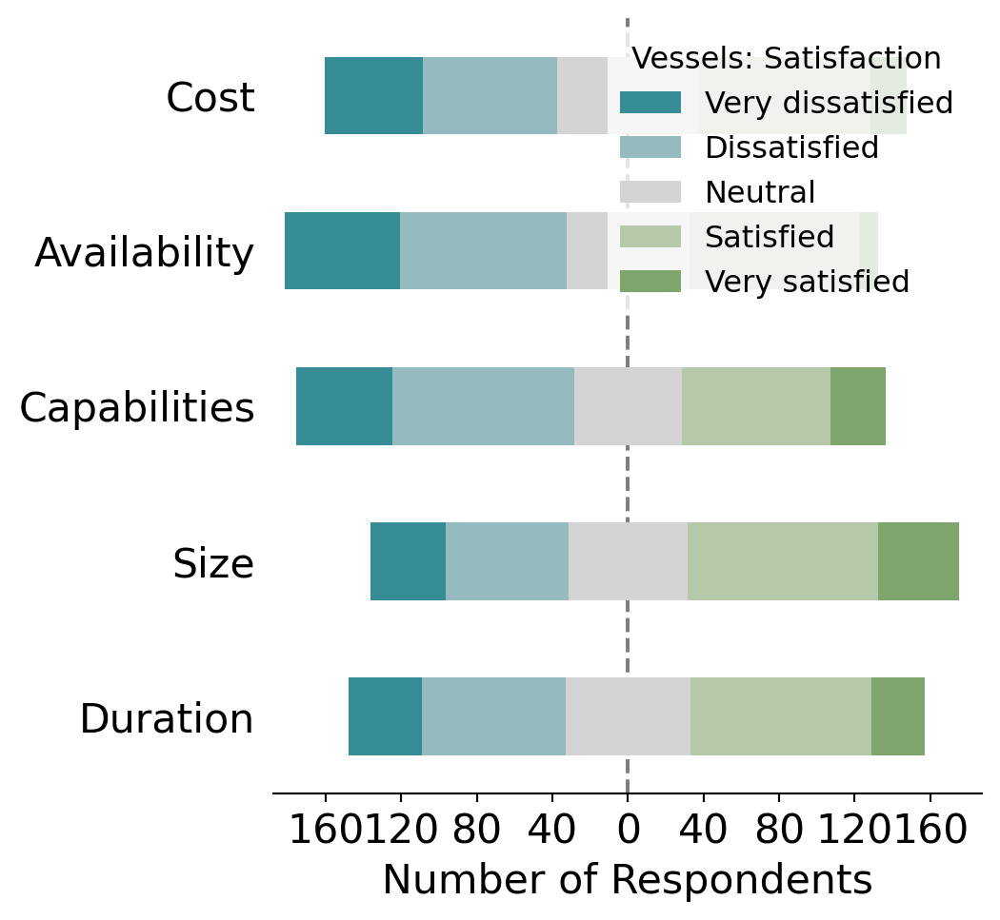

In [88]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M2')

#### Q14a: Vessel cost

In [89]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

cost = {}
fig_data = {}
for region in region_list:
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_cost') &
                (dataR[region]['selection'] != ''), 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]
    
    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [90]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          9.0        4.0   
2 - Dissatisfied                              26.0        6.0   
3 - Neither satisfied nor dissatisfied        32.0        4.0   
4 - Satisfied                                 43.0        2.0   
5 - Very satisfied                            10.0        2.0   
Total                                        120.0       18.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 22.0            6.0   
2 - Dissatisfied                                      17.0            5.0   
3 - Neither satisfied nor dissatisfied                25.0            1.0   
4 - Satisfied                                         25.0            2.0   
5 - Very satisfied                                     4.0            NaN   
Total                                                 93.0           14.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 11.0        7.50   
2 - Dissatisfied                                      17.0       21.67   
3 - Neither satisfied nor dissatisfied                13.0       26.67   
4 - Satisfied                                         19.0       35.83   
5 - Very satisfied                                     3.0        8.33   
Total                                                 63.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       22.22               23.66   
2 - Dissatisfied                            33.33               18.28   
3 - Neither satisfied nor dissatisfied      22.22               26.88   
4 - Satisfied                               11.11               26.88   
5 - Very satisfied                          11.11                4.30   
Total                                       99.99              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           42.86               17.46   
2 - Dissatisfied                                35.71               26.98   
3 - Neither satisfied nor dissatisfied           7.14               20.63   
4 - Satisfied                                   14.29               30.16   
5 - Very satisfied                                NaN                4.76   
Total                                          100.00               99.99   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    52.0   16.88  
2 - Dissatisfied                         71.0   23.05  
3 - Neither satisfied nor dissatisfied   75.0   24.35  
4 - Satisfied                            91.0   29.55  
5 - Very satisfied                       19.0    6.17  
Total                                   308.0  100.00

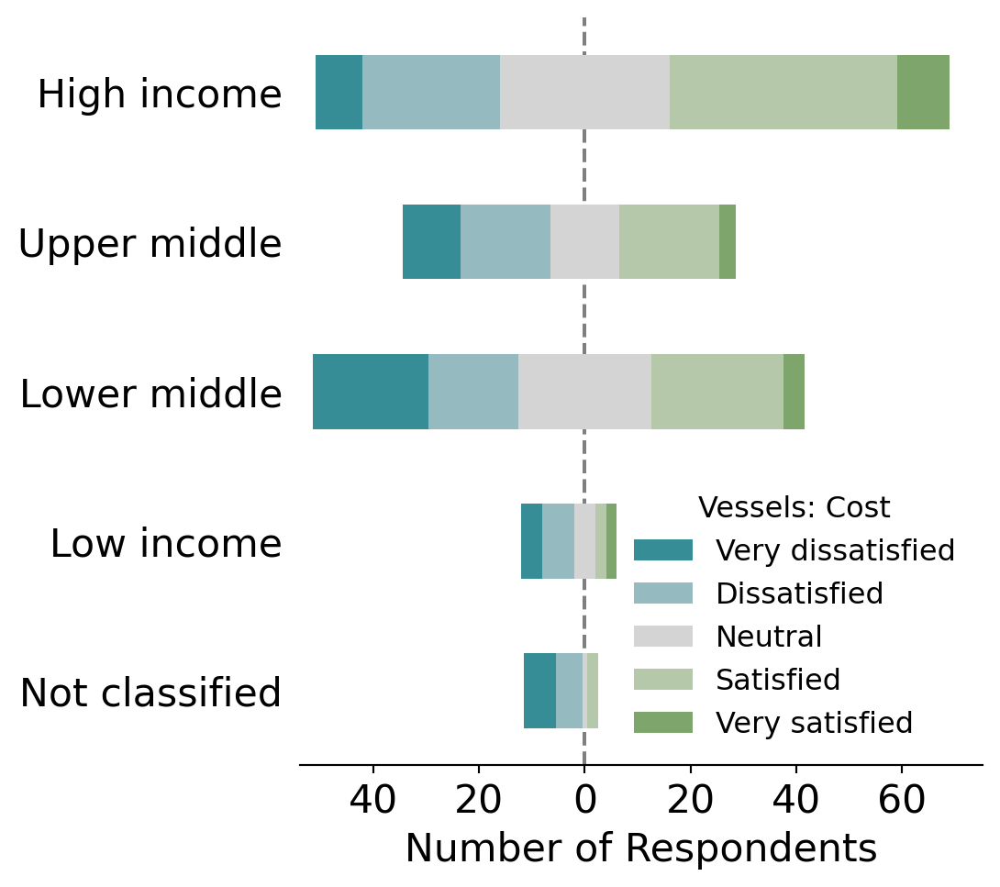

In [91]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Asia': 'lower left', 'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M3')

### Q14b: vessel availability

In [92]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

availability = {}
fig_data = {}
for region in region_list:
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]
    
    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [93]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                         14.0        8.0   
2 - Dissatisfied                              28.0        7.0   
3 - Neither satisfied nor dissatisfied        30.0        1.0   
4 - Satisfied                                 41.0        3.0   
5 - Very satisfied                             7.0        1.0   
Total                                        120.0       20.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 18.0            8.0   
2 - Dissatisfied                                      26.0            4.0   
3 - Neither satisfied nor dissatisfied                23.0            1.0   
4 - Satisfied                                         27.0            2.0   
5 - Very satisfied                                     2.0            NaN   
Total                                                 96.0           15.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 13.0       11.67   
2 - Dissatisfied                                      23.0       23.33   
3 - Neither satisfied nor dissatisfied                10.0       25.00   
4 - Satisfied                                         17.0       34.17   
5 - Very satisfied                                     NaN        5.83   
Total                                                 63.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                        40.0               18.75   
2 - Dissatisfied                             35.0               27.08   
3 - Neither satisfied nor dissatisfied        5.0               23.96   
4 - Satisfied                                15.0               28.12   
5 - Very satisfied                            5.0                2.08   
Total                                       100.0               99.99   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           53.33               20.63   
2 - Dissatisfied                                26.67               36.51   
3 - Neither satisfied nor dissatisfied           6.67               15.87   
4 - Satisfied                                   13.33               26.98   
5 - Very satisfied                                NaN                 NaN   
Total                                          100.00               99.99   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    61.0   19.43  
2 - Dissatisfied                         88.0   28.03  
3 - Neither satisfied nor dissatisfied   65.0   20.70  
4 - Satisfied                            90.0   28.66  
5 - Very satisfied                       10.0    3.18  
Total                                   314.0  100.00

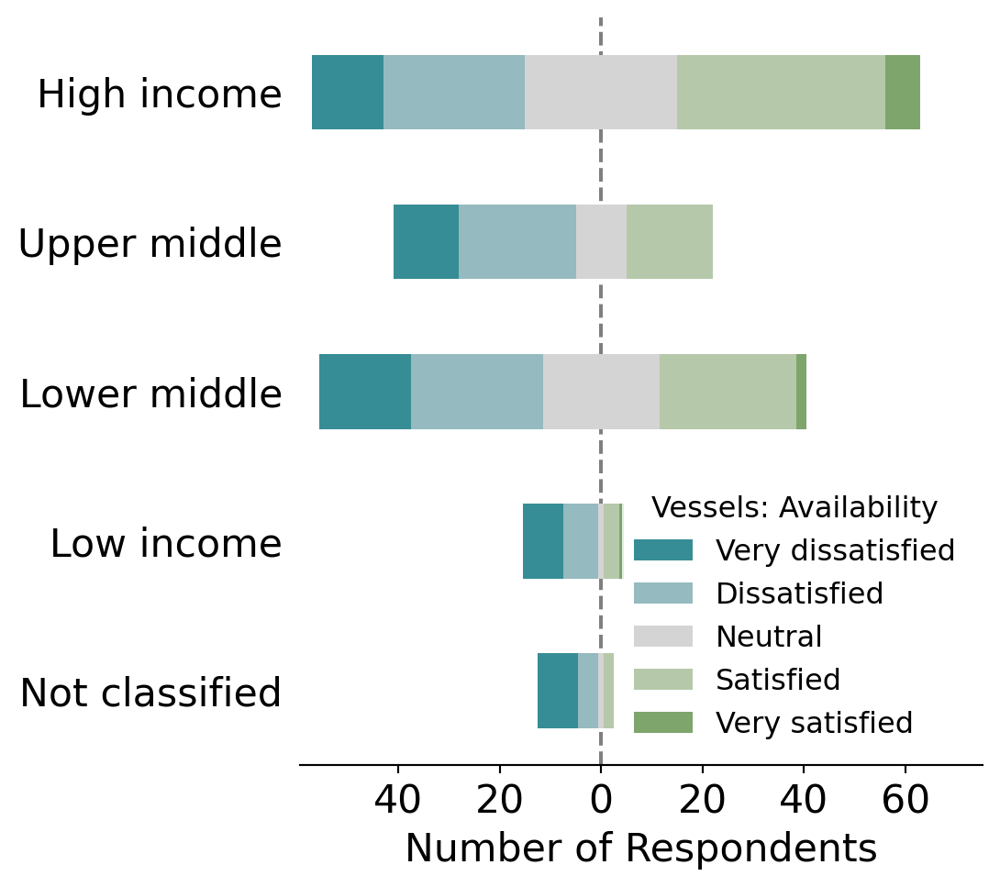

In [94]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Asia': 'lower left', 'Europe': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M4')

### Q14c: Vessel capabilities

In [95]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

capabilities = {}
fig_data = {}
for region in region_list:
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [96]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                         10.0        7.0   
2 - Dissatisfied                              24.0        6.0   
3 - Neither satisfied nor dissatisfied        17.0        4.0   
4 - Satisfied                                 45.0        1.0   
5 - Very satisfied                            24.0        1.0   
Total                                        120.0       19.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 17.0            8.0   
2 - Dissatisfied                                      26.0            5.0   
3 - Neither satisfied nor dissatisfied                23.0            NaN   
4 - Satisfied                                         25.0            2.0   
5 - Very satisfied                                     3.0            NaN   
Total                                                 94.0           15.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  9.0        8.33   
2 - Dissatisfied                                      35.0       20.00   
3 - Neither satisfied nor dissatisfied                13.0       14.17   
4 - Satisfied                                          6.0       37.50   
5 - Very satisfied                                     1.0       20.00   
Total                                                 64.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       36.84               18.09   
2 - Dissatisfied                            31.58               27.66   
3 - Neither satisfied nor dissatisfied      21.05               24.47   
4 - Satisfied                                5.26               26.60   
5 - Very satisfied                           5.26                3.19   
Total                                       99.99              100.01   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           53.33               14.06   
2 - Dissatisfied                                33.33               54.69   
3 - Neither satisfied nor dissatisfied            NaN               20.31   
4 - Satisfied                                   13.33                9.38   
5 - Very satisfied                                NaN                1.56   
Total                                           99.99              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    51.0   16.35  
2 - Dissatisfied                         96.0   30.77  
3 - Neither satisfied nor dissatisfied   57.0   18.27  
4 - Satisfied                            79.0   25.32  
5 - Very satisfied                       29.0    9.29  
Total                                   312.0  100.00

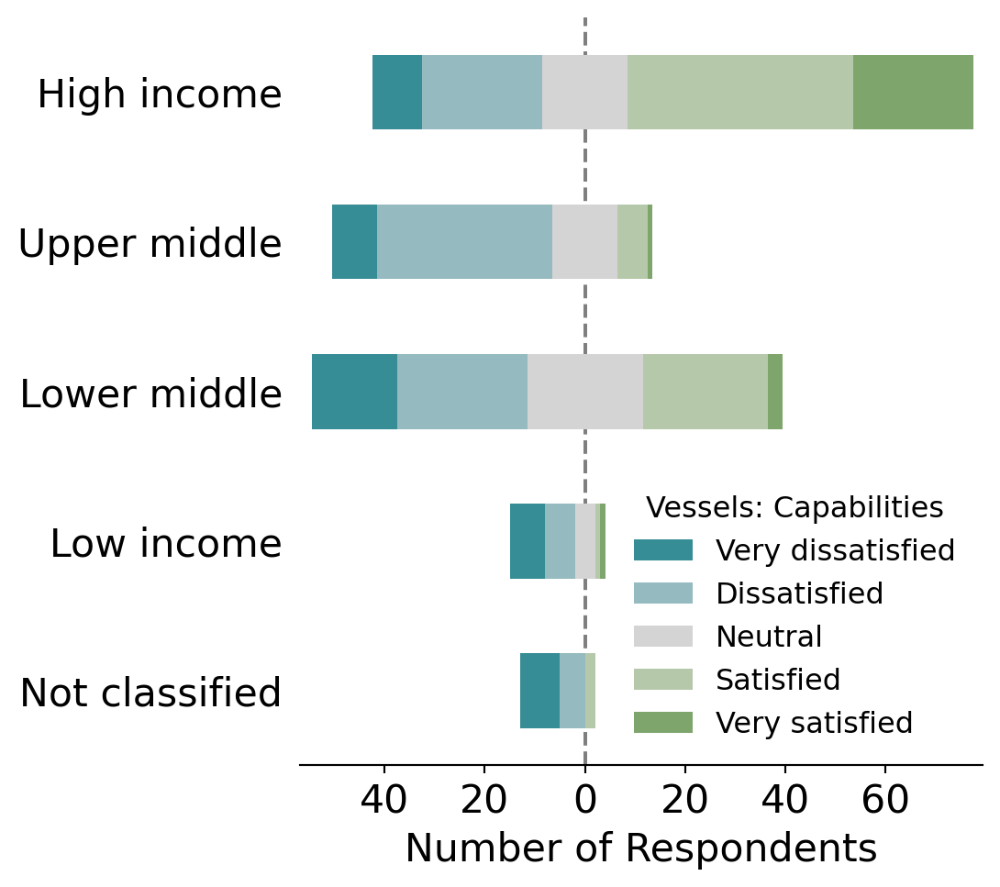

In [97]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right', 'Europe': 'upper left', 'Global': 'upper left', 'Oceania': 'upper right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M5')

### Q14d: Vessel size

In [98]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

size = {}
fig_data = {}
for region in region_list:
    size[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_size') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = size[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [99]:
## Calculate statistics

for region in region_list:
    percent_data = (size[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = size[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          6.0        6.0   
2 - Dissatisfied                              16.0        6.0   
3 - Neither satisfied nor dissatisfied        19.0        2.0   
4 - Satisfied                                 50.0        4.0   
5 - Very satisfied                            29.0        1.0   
Total                                        120.0       19.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 14.0            7.0   
2 - Dissatisfied                                      20.0            3.0   
3 - Neither satisfied nor dissatisfied                24.0            2.0   
4 - Satisfied                                         28.0            2.0   
5 - Very satisfied                                     9.0            NaN   
Total                                                 95.0           14.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  7.0        5.00   
2 - Dissatisfied                                      20.0       13.33   
3 - Neither satisfied nor dissatisfied                16.0       15.83   
4 - Satisfied                                         17.0       41.67   
5 - Very satisfied                                     4.0       24.17   
Total                                                 64.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       31.58               14.74   
2 - Dissatisfied                            31.58               21.05   
3 - Neither satisfied nor dissatisfied      10.53               25.26   
4 - Satisfied                               21.05               29.47   
5 - Very satisfied                           5.26                9.47   
Total                                      100.00               99.99   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           50.00               10.94   
2 - Dissatisfied                                21.43               31.25   
3 - Neither satisfied nor dissatisfied          14.29               25.00   
4 - Satisfied                                   14.29               26.56   
5 - Very satisfied                                NaN                6.25   
Total                                          100.01              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    40.0   12.82  
2 - Dissatisfied                         65.0   20.83  
3 - Neither satisfied nor dissatisfied   63.0   20.19  
4 - Satisfied                           101.0   32.37  
5 - Very satisfied                       43.0   13.78  
Total                                   312.0  100.00

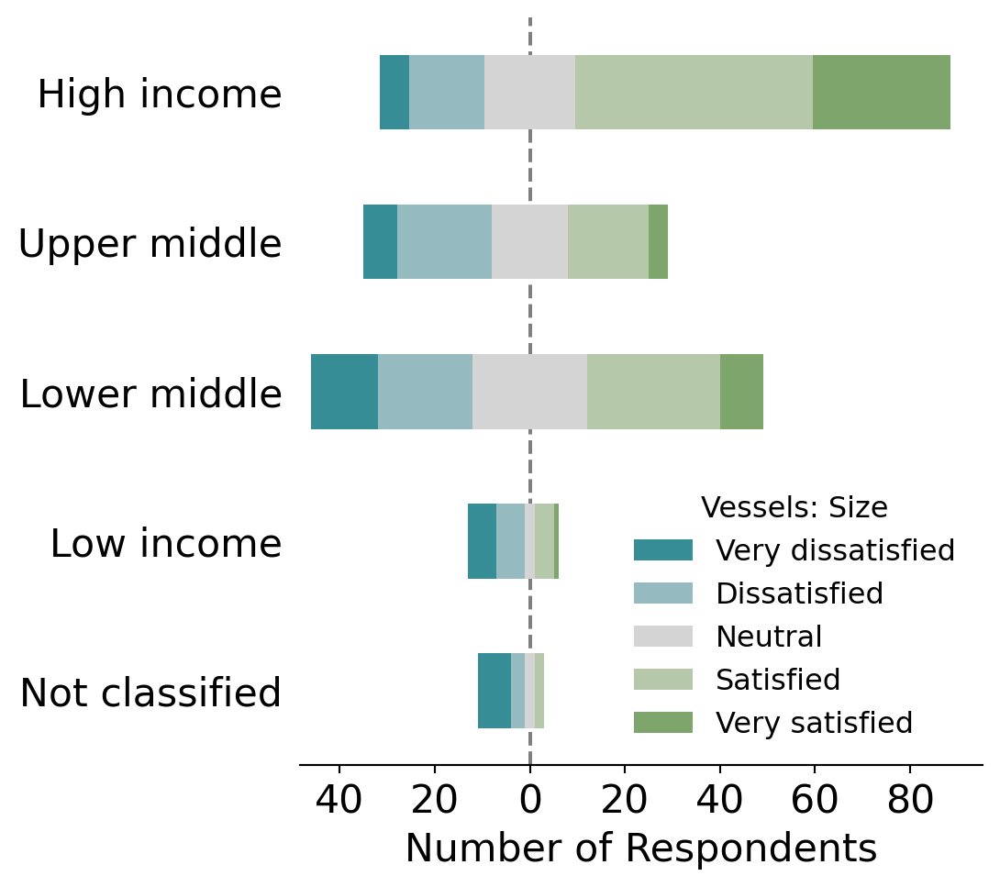

In [100]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Americas': 'lower right', 'Asia': 'lower left', 'Economies': 'lower right', 'Europe': 'upper left', 'Global': 'upper left', 'Oceania': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Size',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M6')

### Q14e: Vessel duration

In [101]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

duration = {}
fig_data = {}
for region in region_list:
    duration[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q14_duration') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = duration[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [102]:
## Calculate statistics

for region in region_list:
    percent_data = (duration[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = duration[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          7.0        6.0   
2 - Dissatisfied                              23.0        5.0   
3 - Neither satisfied nor dissatisfied        21.0        2.0   
4 - Satisfied                                 47.0        2.0   
5 - Very satisfied                            20.0        1.0   
Total                                        118.0       16.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 12.0            8.0   
2 - Dissatisfied                                      29.0            4.0   
3 - Neither satisfied nor dissatisfied                22.0            2.0   
4 - Satisfied                                         27.0            1.0   
5 - Very satisfied                                     5.0            NaN   
Total                                                 95.0           15.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  6.0        5.93   
2 - Dissatisfied                                      15.0       19.49   
3 - Neither satisfied nor dissatisfied                19.0       17.80   
4 - Satisfied                                         19.0       39.83   
5 - Very satisfied                                     2.0       16.95   
Total                                                 61.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       37.50               12.63   
2 - Dissatisfied                            31.25               30.53   
3 - Neither satisfied nor dissatisfied      12.50               23.16   
4 - Satisfied                               12.50               28.42   
5 - Very satisfied                           6.25                5.26   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           53.33                9.84   
2 - Dissatisfied                                26.67               24.59   
3 - Neither satisfied nor dissatisfied          13.33               31.15   
4 - Satisfied                                    6.67               31.15   
5 - Very satisfied                                NaN                3.28   
Total                                          100.00              100.01   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    39.0   12.79  
2 - Dissatisfied                         76.0   24.92  
3 - Neither satisfied nor dissatisfied   66.0   21.64  
4 - Satisfied                            96.0   31.48  
5 - Very satisfied                       28.0    9.18  
Total                                   305.0  100.00

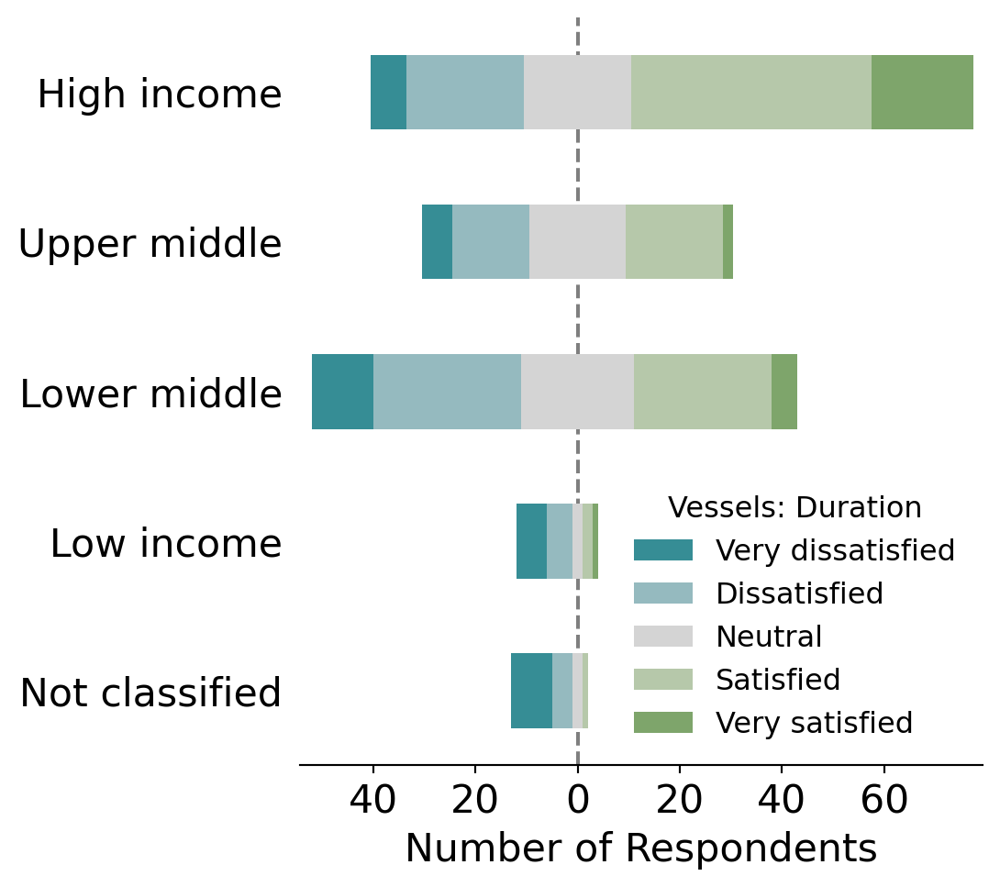

In [103]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Asia': 'lower left', 'Europe': 'upper left', 'Oceania': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Duration',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='M7')

## Fig N - Q11: Vessel importance

In [104]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

importance = {}
fig_data = {}
for region in region_list:
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q11'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [105]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection                                                           
1 - Not important              7.0        NaN                 5.0   
2 - A little important         2.0        1.0                 2.0   
3 - Somewhat important        13.0        5.0                19.0   
4 - Important                 14.0        2.0                13.0   
5 - Very important           100.0       16.0                68.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection                                                               
1 - Not important                 1.0                 9.0        5.15   
2 - A little important            1.0                 1.0        1.47   
3 - Somewhat important            4.0                 5.0        9.56   
4 - Important                     2.0                12.0       10.29   
5 - Very important               10.0                48.0       73.53   
Total                            18.0                75.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection                                                              
1 - Not important             NaN                4.67           5.56   
2 - A little important       4.17                1.87           5.56   
3 - Somewhat important      20.83               17.76          22.22   
4 - Important                8.33               12.15          11.11   
5 - Very important          66.67               63.55          55.56   
Total                      100.00              100.00         100.01   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection                                                  
1 - Not important                    12.00   22.0    6.11  
2 - A little important                1.33    7.0    1.94  
3 - Somewhat important                6.67   46.0   12.78  
4 - Important                        16.00   43.0   11.94  
5 - Very important                   64.00  242.0   67.22  
Total                               100.00  360.0  100.00

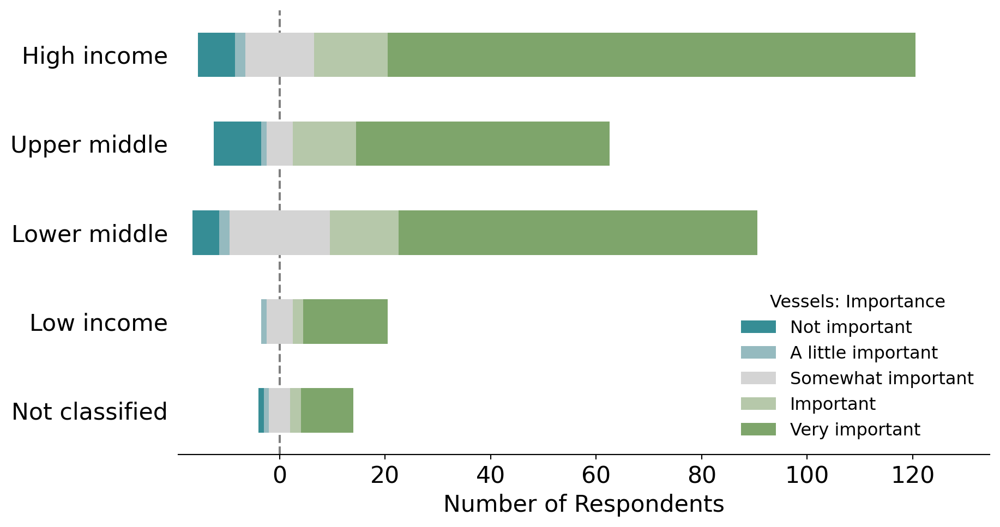

In [106]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper right', 'Oceania': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='N1')

### Q15: Vessel potential

In [107]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

potential = {}
fig_data = {}
for region in region_list:
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q15'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    
    # Change scale values
    fig_data[region].replace({'1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'}, inplace=True)

In [108]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                                \
subregion           High income Low income Lower middle income Not classified   
selection                                                                       
1 - No impact               7.0        3.0                10.0            1.0   
2 - Little impact           6.0        1.0                 6.0            1.0   
3 - Moderate impact        27.0        9.0                29.0            5.0   
4 - High impact            38.0        1.0                16.0            2.0   
5 - Transformative         58.0       10.0                46.0            9.0   
Total                     136.0       24.0               107.0           18.0   

                                            percent             \
subregion           Upper middle income High income Low income   
selection                                                        
1 - No impact                       1.0        5.15      12.50   
2 - Little impact                   4.0        4.41       4.17   
3 - Moderate impact                13.0       19.85      37.50   
4 - High impact                    13.0       27.94       4.17   
5 - Transformative                 44.0       42.65      41.67   
Total                              75.0      100.00     100.01   

                                                                            \
subregion           Lower middle income Not classified Upper middle income   
selection                                                                    
1 - No impact                      9.35           5.56                1.33   
2 - Little impact                  5.61           5.56                5.33   
3 - Moderate impact               27.10          27.78               17.33   
4 - High impact                   14.95          11.11               17.33   
5 - Transformative                42.99          50.00               58.67   
Total                            100.00         100.01               99.99   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         22.0    6.11  
2 - Little impact     18.0    5.00  
3 - Moderate impact   83.0   23.06  
4 - High impact       70.0   19.44  
5 - Transformative   167.0   46.39  
Total                360.0  100.00

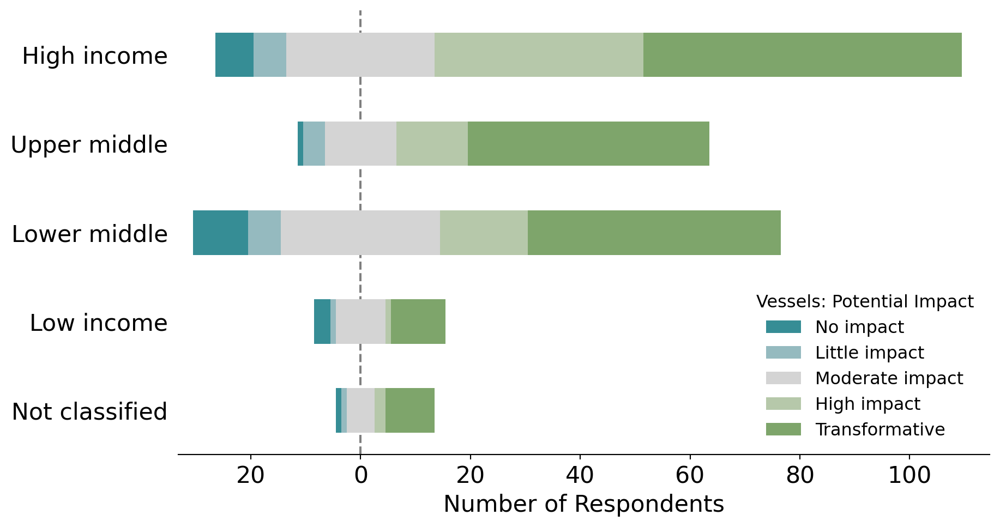

In [109]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Vessels: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='6', letter='N2')

---
# **Section 7**

## Fig O - DSV presence

In [110]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    dsv_presence = researchR[region].loc[(researchR[region]['question'] == 'Q18') &
                               (researchR[region]['col_name'] != 'Q18_comments'), ['geoarea',
                                                                          'col_name',
                                                                          'subregion',                    
                                                                          'research_tech_clean']]
    dsv_presence['selection_binary'] = dsv_presence['research_tech_clean']

    fig_data[region] = (dsv_presence.groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = dsv_presence.groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q18_rov':       'ROVs',
        'Q18_auv':       'AUVs',
        'Q18_bruv':      'Landers',
        'Q18_drifters':  'Drifters',
        'Q18_tow_sleds': 'Towsleds',
        'Q18_hov':       'HOVs',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'auv'):('count', 'tow')].sum()
    pivoted.loc['Total', ('percent', 'auv'):('percent', 'tow')] = \
        ((pivoted.loc['Total', ('count', 'auv'):('count', 'tow')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))
    
    ## Names of GeoAreas with all types present
    num_types = (dsv_presence
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(num_types[num_types['num_types'] == num_types['num_types'].max()])
    
    ## Names of GeoAreas with fewest types present
    display(num_types[num_types['num_types'] == num_types['num_types'].min()])
    
    ## % of areas in region that have all types
    num_types = (dsv_presence.groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(round((num_types[num_types['num_types'] == 6].shape[0]/num_types.shape[0])*100, 2))

    ## % of areas in region with < 3 types
    display(round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2))

count                                       percent           \
col_name        AUVs Drifters  HOVs Landers  ROVs Towsleds    AUVs Drifters   
subregion                                                                     
High income     29.0     21.0  22.0    27.0  35.0     14.0   54.72    39.62   
Low income       1.0      1.0   1.0     0.0   2.0      0.0    6.67     6.67   
Lower middle    10.0      7.0   8.0     5.0  20.0      4.0   24.39    17.07   
Not classified   4.0      1.0   3.0    11.0  10.0      4.0   13.79     3.45   
Upper middle    10.0     12.0  10.0     9.0  25.0      6.0   23.81    28.57   
Total           54.0     42.0  44.0    52.0  92.0     28.0  123.38    95.38   

                                                 
col_name          HOVs Landers    ROVs Towsleds  
subregion                                        
High income      41.51   50.94   66.04    26.42  
Low income        6.67    0.00   13.33     0.00  
Lower middle     19.51   12.20   48.78     9.76  
Not classified   10.34   37.93   34.48    13.79  
Upper middle     23.81   21.43   59.52    14.29  
Total           101.84  122.50  222.15    64.26

,subregion,geoarea,num_types
2,High income,Australia,6
8,High income,Canada,6
18,High income,Greece,6
25,High income,Japan,6
36,High income,Portugal,6
51,High income,United States of America,6
143,Upper middle income,China,6


,subregion,geoarea,num_types
1,High income,Aruba,0
6,High income,British Virgin Islands,0
17,High income,Gibraltar,0
19,High income,Greenland,0
39,High income,Saint Kitts and Nevis,0
55,Low income,Eritrea,0
56,Low income,Gambia,0
58,Low income,Guinea-Bissau,0
59,Low income,Liberia,0
60,Low income,Madagascar,0


3.89

71.11

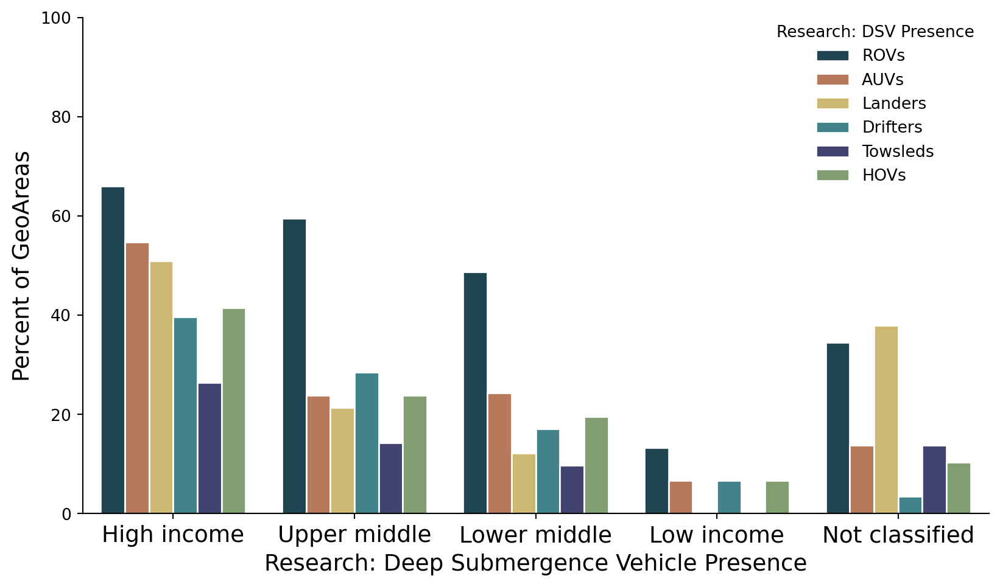

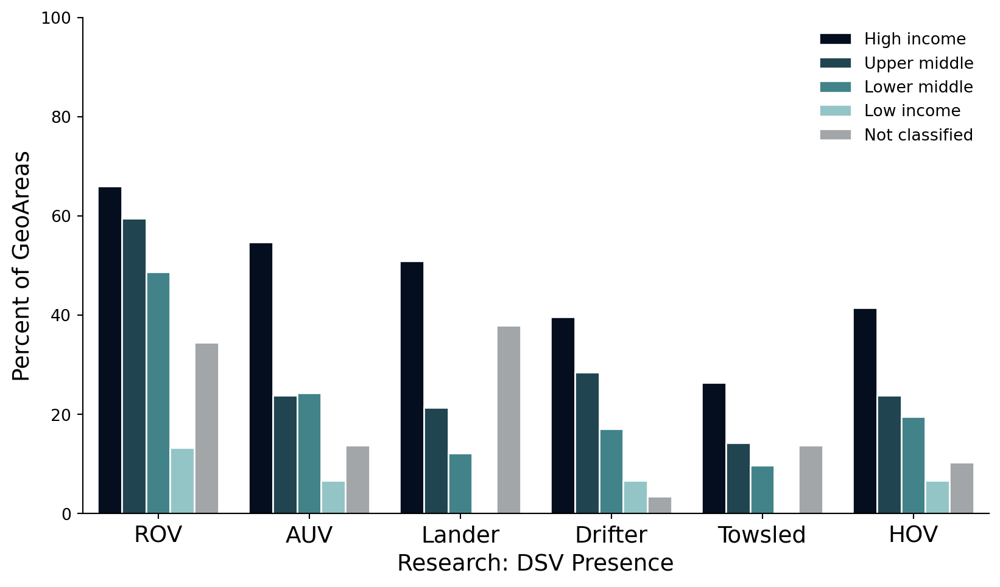

In [111]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_06,
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set_xlabel('Research: Deep Submergence Vehicle Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc=loc_tweaker(region, loc_tweaks),
              title='Research: DSV Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='O1')

    ## O2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=fig_data[region])            

    ax.set_xticklabels(['ROV', 'AUV', 'Lander', 'Drifter', 'Towsled', 'HOV'], rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_xlabel('Research: DSV Presence', fontsize=14)
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    loc_tweaks = {'Africa': 'upper left'}
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='O2')

## Fig P - Q18: DSV Access

In [112]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
percent_dataR = {}
for region in region_list:
    vessels = dataR[region].loc[dataR[region]['question'] == 'Q18', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]

    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data = (vessels.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    renames = {
        'Remotely Operated Vehicles (ROVs)':               'ROVs',
        'Autonomous Underwater Vehicles (AUVs)':           'AUVs',
        'Landers/Benthic Remote Underwater Video (BRUVs)': 'Landers',
        'Drifters':                                        'Drifters',
        'Tow sleds':                                       'Towsleds',
        'Submersibles/Human Occupied Vehicles (HOVs)':     'HOVs',
        'Other':                                           'Other',
        'None of the above':                               'None of the above',
    }
    hue_order = renames.values()
    fig_data['selection_survey_clean'].replace(renames, inplace=True)
    fig_data['subregion'].replace(label_adjustments, inplace=True)
    vessels['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    # Calculate percentages
    percent_data = fig_data.copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data['total'] = percent_data['subregion']
    percent_data['total'].replace(respondent_sub_dict, inplace=True)
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/num_respondents)*100, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)
    
    percent_dataR[region] = percent_data

count                                         \
subregion              High income Low income Lower middle Not classified   
selection_survey_clean                                                      
AUVs                          74.0        2.0          5.0            NaN   
Drifters                      43.0        NaN          7.0            NaN   
HOVs                          29.0        1.0          5.0            NaN   
Landers                       47.0        2.0         14.0            1.0   
None of the above             29.0       16.0         67.0           12.0   
Other                         12.0        NaN          5.0            2.0   
ROVs                          91.0        4.0         21.0            1.0   
Towsleds                      33.0        1.0          3.0            NaN   
Total                        135.0       23.0        105.0           16.0   

                                        percent                          \
subregion              Upper middle High income Low income Lower middle   
selection_survey_clean                                                    
AUVs                            5.0       54.81       8.70         4.76   
Drifters                        4.0       31.85        NaN         6.67   
HOVs                            7.0       21.48       4.35         4.76   
Landers                        10.0       34.81       8.70        13.33   
None of the above              35.0       21.48      69.57        63.81   
Other                           7.0        8.89        NaN         4.76   
ROVs                           29.0       67.41      17.39        20.00   
Towsleds                        7.0       24.44       4.35         2.86   
Total                          72.0       38.46       6.55        29.91   

                                                    count percent  
subregion              Not classified Upper middle  Total   Total  
selection_survey_clean                                             
AUVs                              NaN         6.94   86.0   24.50  
Drifters                          NaN         5.56   54.0   15.38  
HOVs                              NaN         9.72   42.0   11.97  
Landers                          6.25        13.89   74.0   21.08  
None of the above               75.00        48.61  159.0   45.30  
Other                           12.50         9.72   26.0    7.41  
ROVs                             6.25        40.28  146.0   41.60  
Towsleds                          NaN         9.72   44.0   12.54  
Total                            4.56        20.51  351.0  100.00

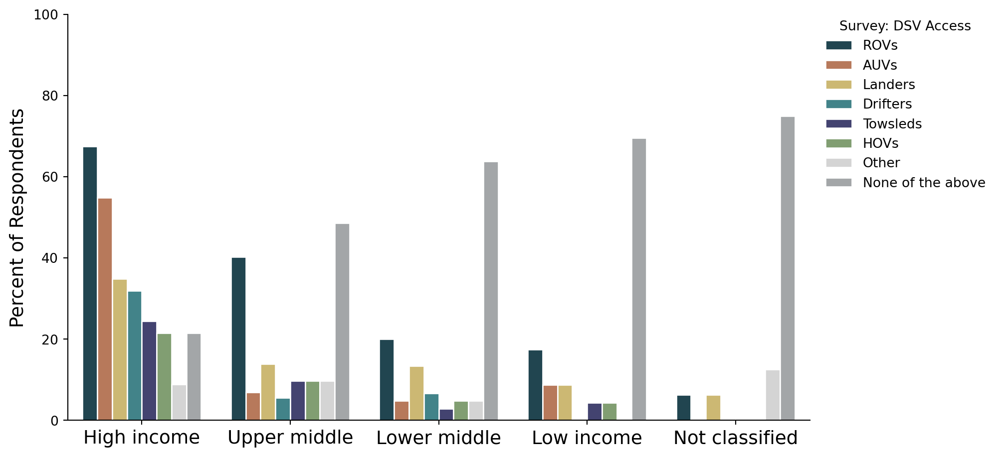

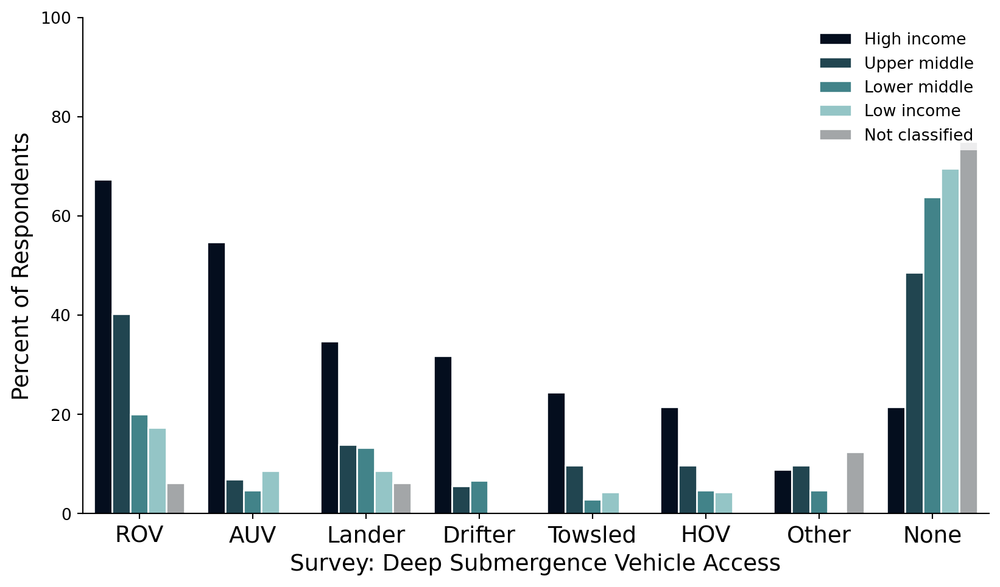

In [113]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_06 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_dataR[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(bbox_to_anchor=(1.005, 1.015), loc='upper left',
              title='Survey: DSV Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P1')
    
    ## P1b

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_dataR[region])            

    ax.set_xticklabels(['ROV', 'AUV', 'Lander', 'Drifter', 'Towsled', 'HOV', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Deep Submergence Vehicle Access', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P1b')

### Q19: DSV depth (ROVs)

In [114]:
## Get data for figure

fig_data = {}
for region in region_list:
    depth = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea',
                                                   'respondent_id', 
                                                   'selection_survey_clean']].copy()
    depth.loc[(depth['col_name'] == 'Q19_other') & (depth['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth.loc[(depth['col_name'] != 'Q19_other') & (depth['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth = depth[depth['selection_survey_clean'] != '']

    ## Select rovs
    rov_tow = depth.loc[depth['col_name'].isin(['Q19_rov'])].copy()

    fig_data[region] = (rov_tow.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection_survey_clean                                              
0 - 200 m                     16.0        1.0                25.0   
1000 - 2000 m                 17.0        1.0                 4.0   
200 - 1000 m                  10.0        3.0                 7.0   
2000 - 4000 m                 29.0        NaN                 2.0   
4000+ m                       22.0        1.0                 NaN   
NR                            42.0       18.0                69.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection_survey_clean                                                  
0 - 200 m                         1.0                21.0       11.76   
1000 - 2000 m                     NaN                 2.0       12.50   
200 - 1000 m                      NaN                 6.0        7.35   
2000 - 4000 m                     NaN                 NaN       21.32   
4000+ m                           NaN                 NaN       16.18   
NR                               17.0                46.0       30.88   
Total                            18.0                75.0       99.99   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection_survey_clean                                                 
0 - 200 m                    4.17               23.36           5.56   
1000 - 2000 m                4.17                3.74            NaN   
200 - 1000 m                12.50                6.54            NaN   
2000 - 4000 m                 NaN                1.87            NaN   
4000+ m                      4.17                 NaN            NaN   
NR                          75.00               64.49          94.44   
Total                      100.01              100.00         100.00   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection_survey_clean                                     
0 - 200 m                            28.00   64.0   17.78  
1000 - 2000 m                         2.67   24.0    6.67  
200 - 1000 m                          8.00   26.0    7.22  
2000 - 4000 m                          NaN   31.0    8.61  
4000+ m                                NaN   23.0    6.39  
NR                                   61.33  192.0   53.33  
Total                               100.00  360.0  100.00

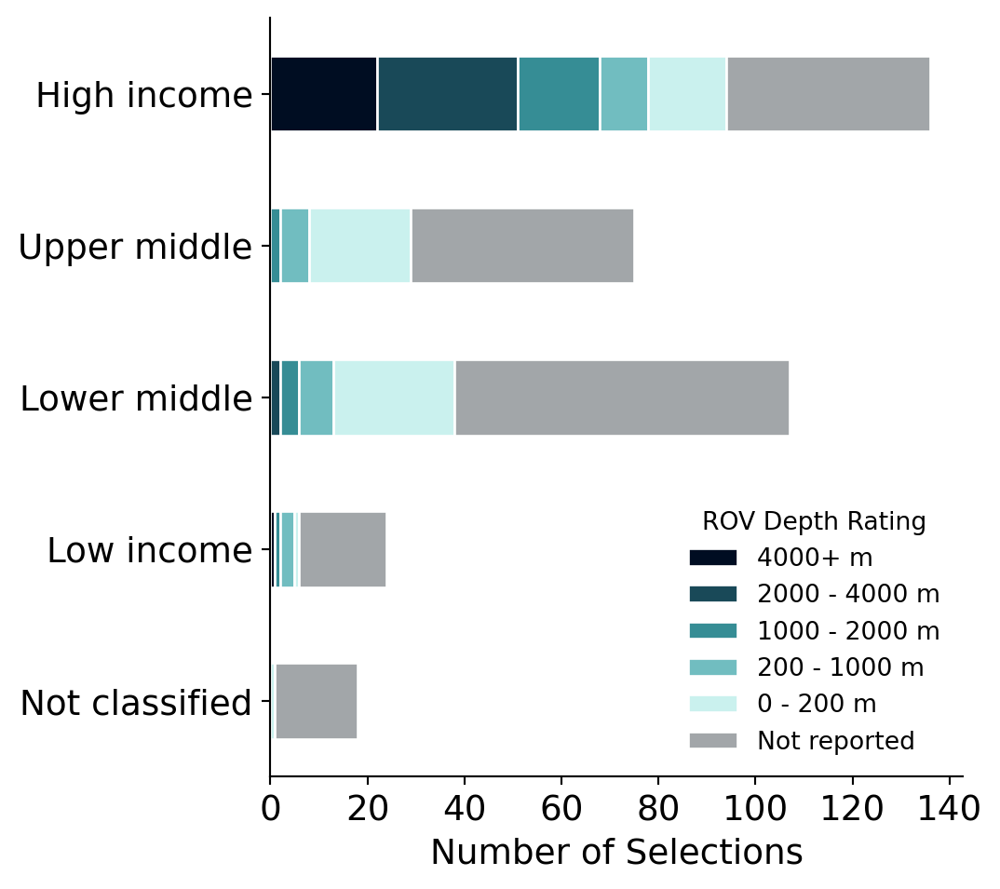

In [115]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'center right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='ROV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P2')

### Q19: DSV depth (Towsleds)

In [116]:
## Get data for figure

depth = {}  # also used in next figure
fig_data = {}
for region in region_list:
    depth[region] = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    depth[region].loc[(depth[region]['col_name'] == 'Q19_other') & (depth[region]['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth[region].loc[(depth[region]['col_name'] != 'Q19_other') & (depth[region]['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth[region] = depth[region][depth[region]['selection_survey_clean'] != '']

    ## Select towsleds
    rov_tow = depth[region].loc[depth[region]['col_name'].isin(['Q19_tow_sleds'])].copy()

    fig_data[region] = (rov_tow.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection_survey_clean                                              
0 - 200 m                      6.0        1.0                13.0   
1000 - 2000 m                  6.0        NaN                 2.0   
200 - 1000 m                   6.0        1.0                 1.0   
2000 - 4000 m                 12.0        NaN                 2.0   
4000+ m                        5.0        1.0                 NaN   
NR                           101.0       21.0                89.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection_survey_clean                                                  
0 - 200 m                         1.0                 3.0        4.41   
1000 - 2000 m                     NaN                 4.0        4.41   
200 - 1000 m                      NaN                 2.0        4.41   
2000 - 4000 m                     NaN                 NaN        8.82   
4000+ m                           NaN                 NaN        3.68   
NR                               17.0                66.0       74.26   
Total                            18.0                75.0       99.99   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection_survey_clean                                                 
0 - 200 m                    4.17               12.15           5.56   
1000 - 2000 m                 NaN                1.87            NaN   
200 - 1000 m                 4.17                0.93            NaN   
2000 - 4000 m                 NaN                1.87            NaN   
4000+ m                      4.17                 NaN            NaN   
NR                          87.50               83.18          94.44   
Total                      100.01              100.00         100.00   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection_survey_clean                                     
0 - 200 m                             4.00   24.0    6.67  
1000 - 2000 m                         5.33   12.0    3.33  
200 - 1000 m                          2.67   10.0    2.78  
2000 - 4000 m                          NaN   14.0    3.89  
4000+ m                                NaN    6.0    1.67  
NR                                   88.00  294.0   81.67  
Total                               100.00  360.0  100.00

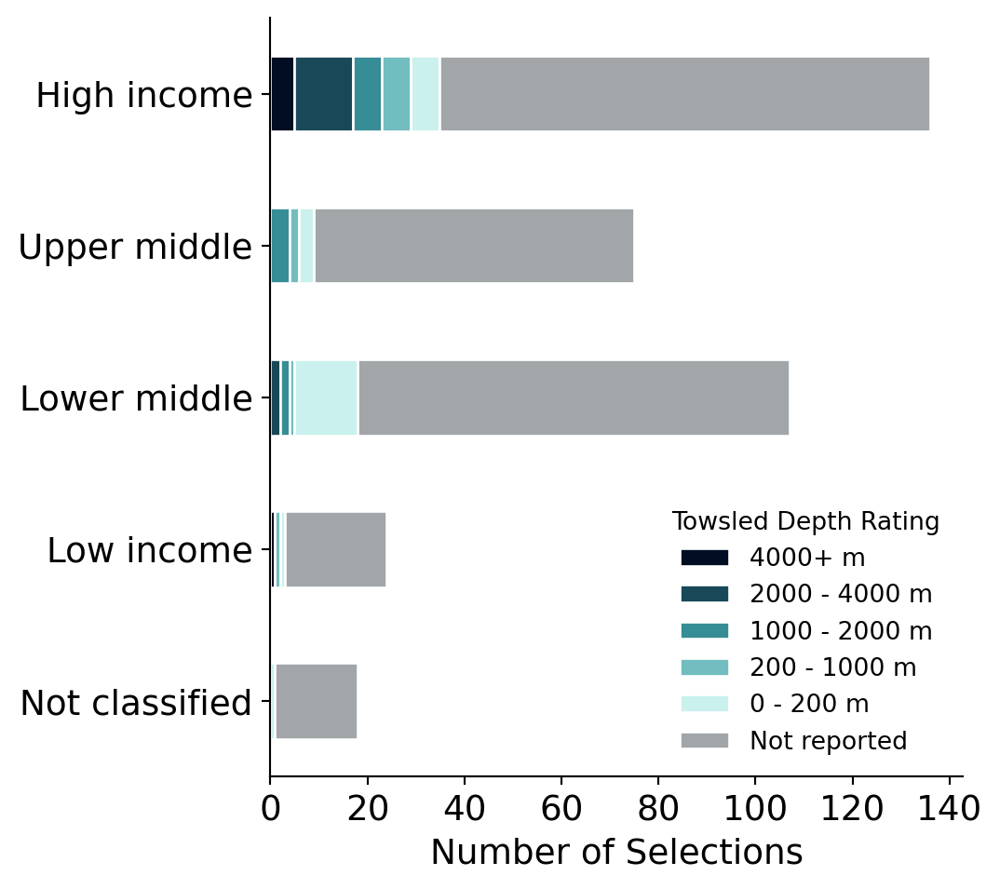

In [117]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='Towsled Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P3')

### Q19: DSV depth (AUVs)

In [118]:
## Get data for figure

fig_data = {}
for region in region_list:
    # NOTE: reusing 'depth' from previous fig!
    auv = depth[region][depth[region]['col_name'].isin(['Q19_auv'])].copy()
    
    fig_data[region] = (auv.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection_survey_clean                                              
0 - 200 m                      9.0        NaN                15.0   
1000 - 2000 m                 17.0        NaN                 1.0   
200 - 1000 m                  21.0        2.0                 1.0   
2000 - 4000 m                 21.0        NaN                 2.0   
4000+ m                       12.0        1.0                 1.0   
NR                            56.0       21.0                87.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection_survey_clean                                                  
0 - 200 m                         1.0                 1.0        6.62   
1000 - 2000 m                     NaN                 2.0       12.50   
200 - 1000 m                      NaN                 2.0       15.44   
2000 - 4000 m                     NaN                 NaN       15.44   
4000+ m                           NaN                 NaN        8.82   
NR                               17.0                70.0       41.18   
Total                            18.0                75.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection_survey_clean                                                 
0 - 200 m                     NaN               14.02           5.56   
1000 - 2000 m                 NaN                0.93            NaN   
200 - 1000 m                 8.33                0.93            NaN   
2000 - 4000 m                 NaN                1.87            NaN   
4000+ m                      4.17                0.93            NaN   
NR                          87.50               81.31          94.44   
Total                      100.00               99.99         100.00   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection_survey_clean                                     
0 - 200 m                             1.33   26.0    7.22  
1000 - 2000 m                         2.67   20.0    5.56  
200 - 1000 m                          2.67   26.0    7.22  
2000 - 4000 m                          NaN   23.0    6.39  
4000+ m                                NaN   14.0    3.89  
NR                                   93.33  251.0   69.72  
Total                               100.00  360.0  100.00

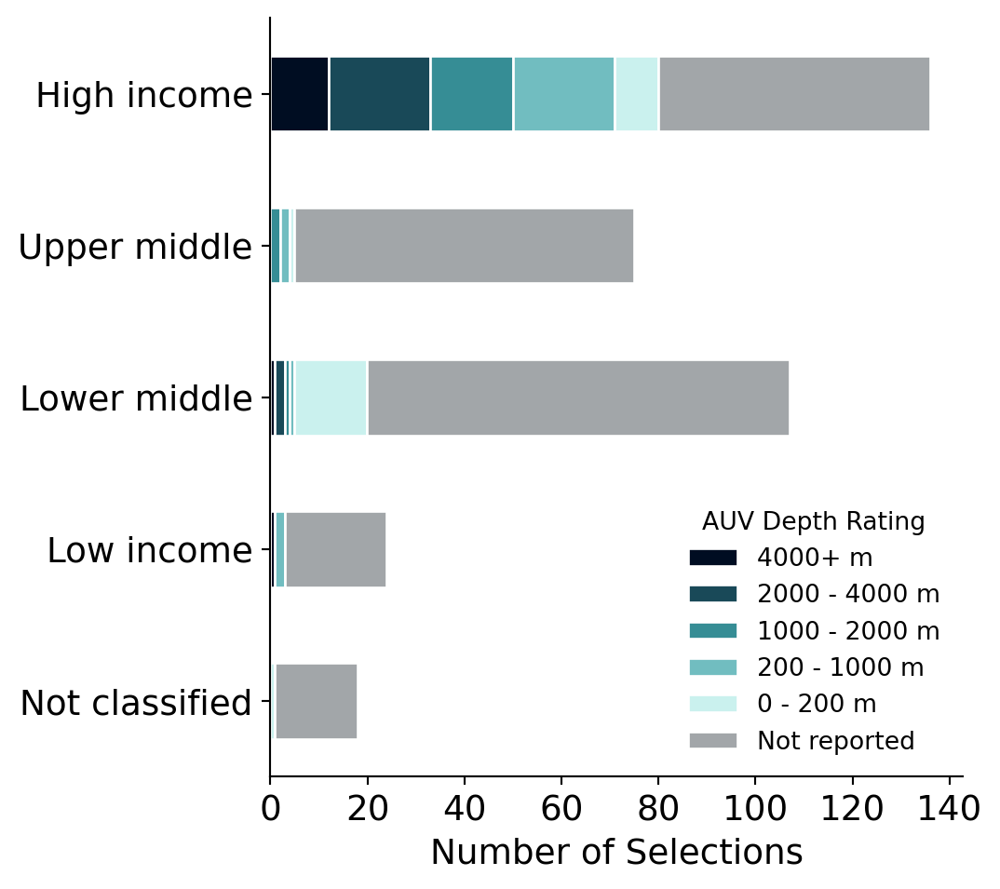

In [119]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='AUV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P4')

### Q19: DSV depth (HOVs)

In [120]:
## Get data for figure

for region in region_list:
    ## Select hovs
    # NOTE: reusing 'depth' from previous fig!
    hov = depth[region][depth[region]['col_name'].isin(['Q19_hov'])].copy()

    fig_data[region] = (hov.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['0-3,000 m'] = 0
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection_survey_clean                                              
0 - 200 m                      5.0        NaN                10.0   
1000 - 2000 m                  2.0        NaN                 1.0   
200 - 1000 m                   5.0        1.0                 5.0   
2000 - 4000 m                 13.0        NaN                 1.0   
4000+ m                       14.0        1.0                 1.0   
NR                            97.0       22.0                89.0   
0-3,000 m                      0.0        0.0                 0.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection_survey_clean                                                  
0 - 200 m                         2.0                 3.0        3.68   
1000 - 2000 m                     NaN                 NaN        1.47   
200 - 1000 m                      NaN                 4.0        3.68   
2000 - 4000 m                     NaN                 NaN        9.56   
4000+ m                           NaN                 NaN       10.29   
NR                               16.0                68.0       71.32   
0-3,000 m                         0.0                 0.0        0.00   
Total                            18.0                75.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection_survey_clean                                                 
0 - 200 m                     NaN                9.35          11.11   
1000 - 2000 m                 NaN                0.93            NaN   
200 - 1000 m                 4.17                4.67            NaN   
2000 - 4000 m                 NaN                0.93            NaN   
4000+ m                      4.17                0.93            NaN   
NR                          91.67               83.18          88.89   
0-3,000 m                    0.00                0.00           0.00   
Total                      100.01               99.99         100.00   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection_survey_clean                                     
0 - 200 m                             4.00   20.0    5.56  
1000 - 2000 m                          NaN    3.0    0.83  
200 - 1000 m                          5.33   15.0    4.17  
2000 - 4000 m                          NaN   14.0    3.89  
4000+ m                                NaN   16.0    4.44  
NR                                   90.67  292.0   81.11  
0-3,000 m                             0.00    0.0    0.00  
Total                               100.00  360.0  100.00

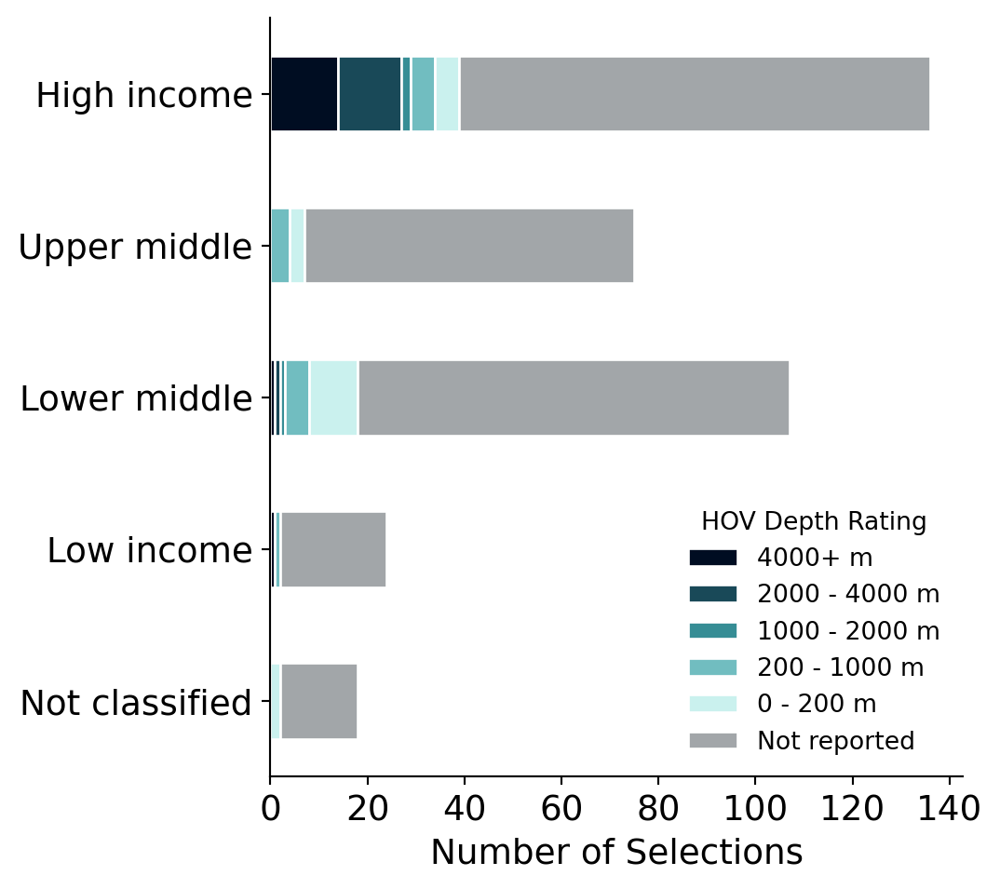

In [121]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='HOV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P5')

### Q19: Landers

In [122]:
## Get data for figure

fig_data = {}
for region in region_list:
    ## Select landers/drifters
    # NOTE: reusing 'depth' from previous fig!
    land_drift = depth[region][depth[region]['col_name'].isin(['Q19_bruv'])].copy()

    fig_data[region] = (land_drift.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection_survey_clean                                              
0 - 200 m                      8.0        2.0                17.0   
1000 - 2000 m                  3.0        1.0                 2.0   
200 - 1000 m                   4.0        NaN                 5.0   
2000 - 4000 m                 12.0        NaN                 3.0   
4000+ m                       23.0        1.0                 NaN   
NR                            86.0       20.0                80.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection_survey_clean                                                  
0 - 200 m                         1.0                 8.0        5.88   
1000 - 2000 m                     NaN                 1.0        2.21   
200 - 1000 m                      NaN                 3.0        2.94   
2000 - 4000 m                     NaN                 NaN        8.82   
4000+ m                           NaN                 NaN       16.91   
NR                               17.0                63.0       63.24   
Total                            18.0                75.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection_survey_clean                                                 
0 - 200 m                    8.33               15.89           5.56   
1000 - 2000 m                4.17                1.87            NaN   
200 - 1000 m                  NaN                4.67            NaN   
2000 - 4000 m                 NaN                2.80            NaN   
4000+ m                      4.17                 NaN            NaN   
NR                          83.33               74.77          94.44   
Total                      100.00              100.00         100.00   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection_survey_clean                                     
0 - 200 m                            10.67   36.0   10.00  
1000 - 2000 m                         1.33    7.0    1.94  
200 - 1000 m                          4.00   12.0    3.33  
2000 - 4000 m                          NaN   15.0    4.17  
4000+ m                                NaN   24.0    6.67  
NR                                   84.00  266.0   73.89  
Total                               100.00  360.0  100.00

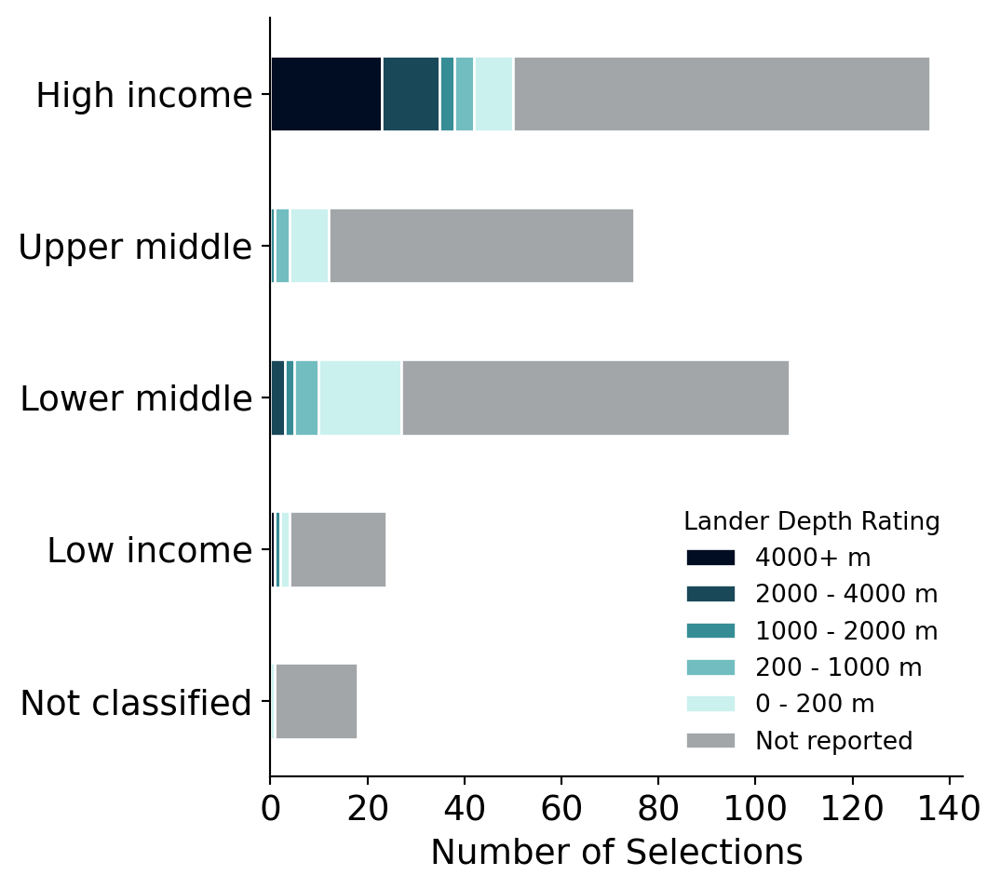

In [123]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='Lander Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P6')

### Q19: Drifters

In [124]:
## Get data for figure

fig_data = {}
for region in region_list:
    ## Select landers/drifters
    land_drift = depth[region][depth[region]['col_name'].isin(['Q19_drifters'])].copy()

    fig_data[region] = (land_drift.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection_survey_clean                                              
0 - 200 m                     13.0        NaN                15.0   
1000 - 2000 m                  4.0        NaN                 2.0   
200 - 1000 m                   8.0        1.0                 1.0   
2000 - 4000 m                  8.0        NaN                 1.0   
4000+ m                        5.0        1.0                 1.0   
NR                            98.0       22.0                87.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection_survey_clean                                                  
0 - 200 m                         NaN                 2.0        9.56   
1000 - 2000 m                     NaN                 1.0        2.94   
200 - 1000 m                      NaN                 NaN        5.88   
2000 - 4000 m                     NaN                 NaN        5.88   
4000+ m                           NaN                 NaN        3.68   
NR                               18.0                72.0       72.06   
Total                            18.0                75.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection_survey_clean                                                 
0 - 200 m                     NaN               14.02            NaN   
1000 - 2000 m                 NaN                1.87            NaN   
200 - 1000 m                 4.17                0.93            NaN   
2000 - 4000 m                 NaN                0.93            NaN   
4000+ m                      4.17                0.93            NaN   
NR                          91.67               81.31          100.0   
Total                      100.01               99.99          100.0   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection_survey_clean                                     
0 - 200 m                             2.67   30.0    8.33  
1000 - 2000 m                         1.33    7.0    1.94  
200 - 1000 m                           NaN   10.0    2.78  
2000 - 4000 m                          NaN    9.0    2.50  
4000+ m                                NaN    7.0    1.94  
NR                                   96.00  297.0   82.50  
Total                               100.00  360.0  100.00

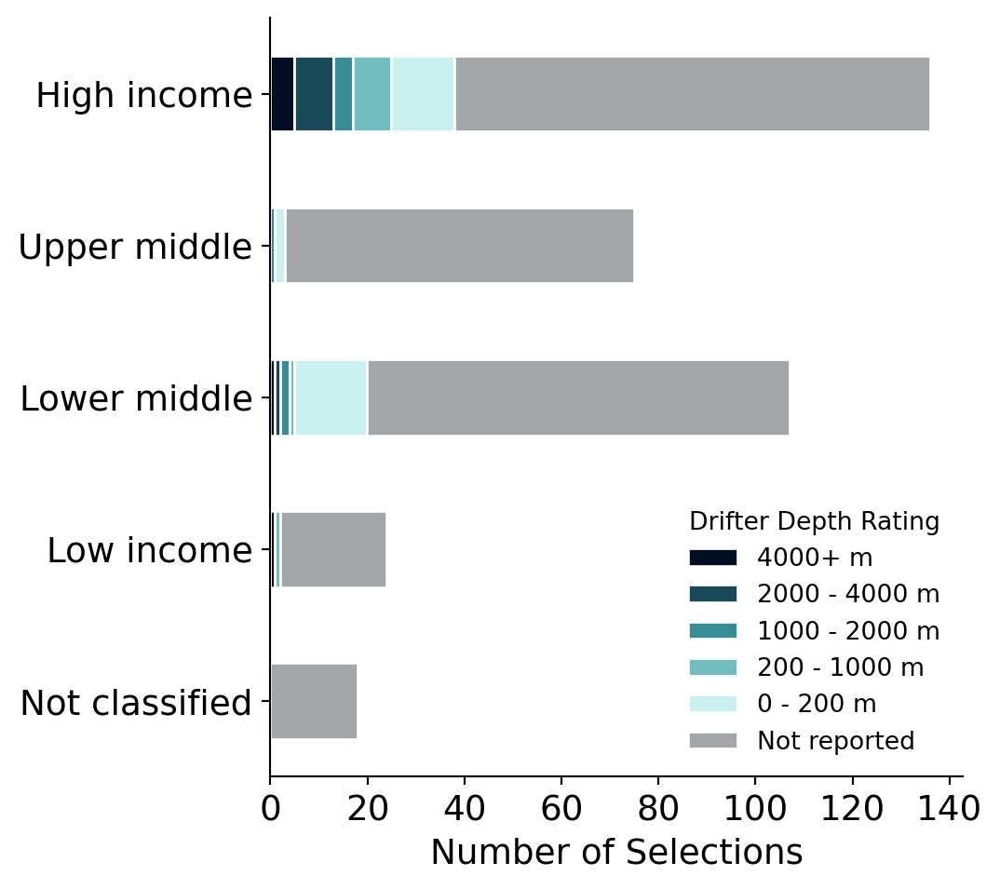

In [125]:
## Create horizontal bar plot

w = 960
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='Drifter Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P7')

### DSV Depth Rating

In [126]:
## Get data for figure

fig_data = {}
for region in region_list:
    depth = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']].copy()
    depth.loc[(depth['col_name'] == 'Q19_other') & (depth['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth.loc[(depth['col_name'] != 'Q19_other') & (depth['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth = depth[depth['selection_survey_clean'] != '']
    depth = depth[depth['selection_survey_clean'] != 'Other']

    rov_tow = depth.copy()

    fig_data[region] = (rov_tow.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count')
                       .reset_index())

    percent_data = fig_data[region].copy()
    fig_data[region] = fig_data[region].pivot(columns='selection_survey_clean', index='subregion', values='count')

    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, barh=True)
    
    col_order = ['4000+ m', '2000 - 4000 m', '1000 - 2000 m', '200 - 1000 m', '0 - 200 m', 'NR']
    fig_data[region] = reorder_columns(fig_data[region], col_order, createmissingcolumns=True)

    # Calculate percentages
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = rov_tow.shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection_survey_clean                                              
0 - 200 m                     57.0        4.0                95.0   
1000 - 2000 m                 49.0        2.0                12.0   
200 - 1000 m                  54.0        8.0                20.0   
2000 - 4000 m                 95.0        NaN                11.0   
4000+ m                       81.0        6.0                 3.0   
NR                           480.0      124.0               501.0   
Total                        816.0      144.0               642.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection_survey_clean                                                  
0 - 200 m                         6.0                38.0        6.99   
1000 - 2000 m                     NaN                10.0        6.00   
200 - 1000 m                      NaN                17.0        6.62   
2000 - 4000 m                     NaN                 NaN       11.64   
4000+ m                           NaN                 NaN        9.93   
NR                              102.0               385.0       58.82   
Total                           108.0               450.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection_survey_clean                                                 
0 - 200 m                    2.78               14.80           5.56   
1000 - 2000 m                1.39                1.87            NaN   
200 - 1000 m                 5.56                3.12            NaN   
2000 - 4000 m                 NaN                1.71            NaN   
4000+ m                      4.17                0.47            NaN   
NR                          86.11               78.04          94.44   
Total                      100.01              100.01         100.00   

                                             count percent  
subregion              Upper middle income   Total   Total  
selection_survey_clean                                      
0 - 200 m                             8.44   200.0    9.26  
1000 - 2000 m                         2.22    73.0    3.38  
200 - 1000 m                          3.78    99.0    4.58  
2000 - 4000 m                          NaN   106.0    4.91  
4000+ m                                NaN    90.0    4.17  
NR                                   85.56  1592.0   73.70  
Total                               100.00  2160.0  100.00

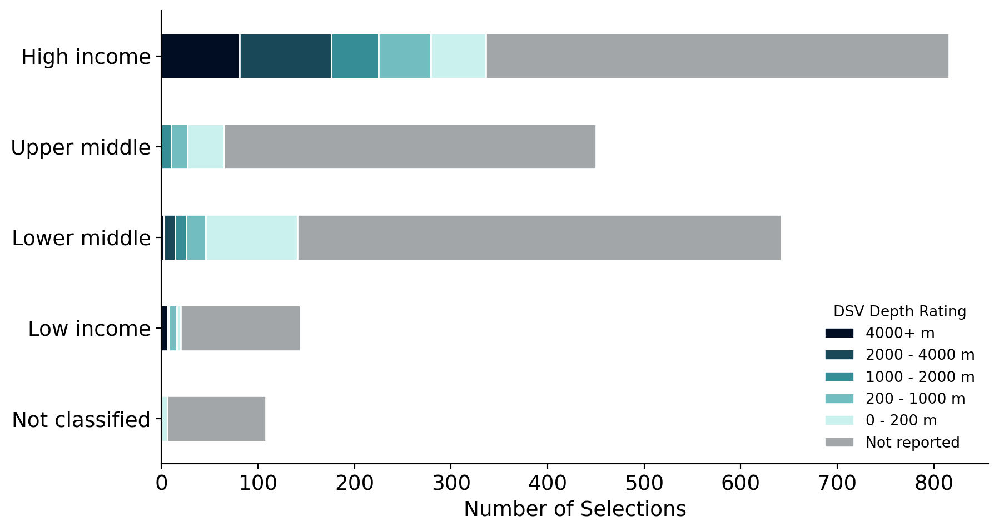

In [127]:
## Create horizontal bar plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)

    fig_data[region].plot(kind='barh', 
                  stacked=True,
                  legend=True,
                  fontsize=14,
                  color=val_05,
                  edgecolor='white',
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    barh_pixel_fix(ax)
    ax.set_ylabel('')
    loc_tweaks = {'Africa': 'center right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              labels=['4000+ m',
                      '2000 - 4000 m',
                      '1000 - 2000 m',
                      '200 - 1000 m',
                      '0 - 200 m',
                      'Not reported'], 
              title='DSV Depth Rating', 
              fontsize=10, 
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='7', letter='P8')

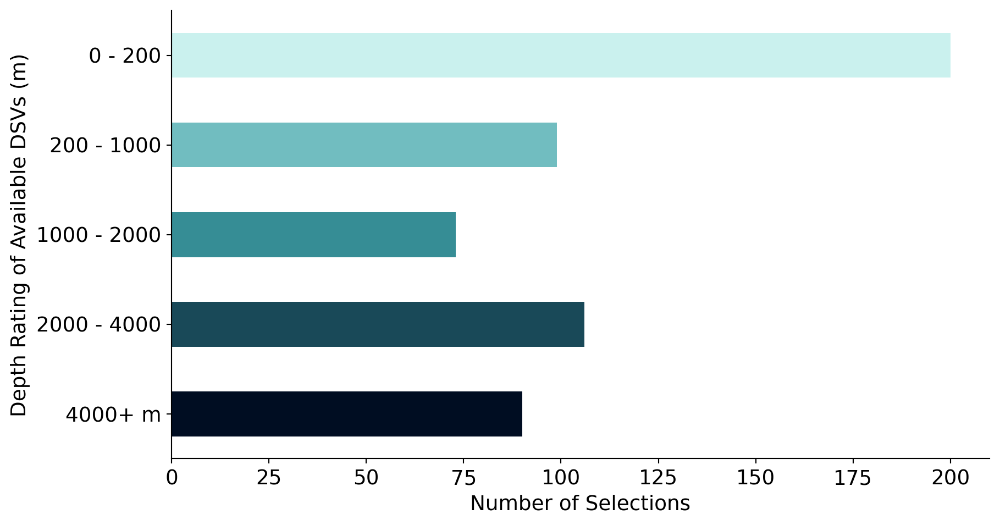

In [128]:
## Get data for figure

fig_data = {}
for region in region_list:
    depth = dataR[region].loc[dataR[region]['question'] == 'Q19', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']].copy()
    depth.loc[(depth['col_name'] == 'Q19_other') & (depth['selection_survey_clean'] != ''), 'selection_survey_clean'] = 'Other'
    depth.loc[(depth['col_name'] != 'Q19_other') & (depth['selection_survey_clean'] == ''), ['selection_survey_clean']] = 'N/A'

    depth = depth[depth['selection_survey_clean'] != '']
    depth = depth[depth['selection_survey_clean'] != 'Other']

    fig_data[region] = (depth.groupby(['selection_survey_clean'])['respondent_id']
                       .count()
                       .rename('count'))
    fig_data[region] = fig_data[region].drop(['NR'])
    fig_data[region] = reorder_rows_and_rename(
        fig_data[region],
        [
            ['0 - 200 m',     '0 - 200'],
            ['200 - 1000 m',  '200 - 1000'],
            ['1000 - 2000 m', '1000 - 2000'],
            ['2000 - 4000 m', '2000 - 4000'],
            ['4000+ m',       '4000+ m']
        ],
        createmissingrows=True
    )
    

## Create horizontal bar plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    fig_data[region].iloc[::-1].plot(kind='barh', 
                  fontsize=14,
                  color=val_05,
                  ax=ax)
    ax.set_xlabel('Number of Selections', fontsize=14)
    ax.set_ylabel('Depth Rating of Available DSVs (m)', fontsize=14)

    outputfigs(plt, fig, ax, region, section='7', letter='P9')

## Fig Q - Q20: DSV satisfaction

In [129]:
## Select data

satisfaction = {}
missing_responses = {}
for region in region_list:
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q20', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q20_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]
    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])

In [130]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [131]:
for region in region_list:
    ## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
    ## NA for more than one question
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)
    
    ## Calculate the number of people who chose NA on at least one part of the question - EXCLUDING OTHER
    display(missing_responses[region].loc[missing_responses[region]['col_name'] != 'Q20_other', 'respondent_id'].nunique())

    ## Calculate statistics
    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

subregion,High income,Low income,Lower middle income,Not classified,Upper middle income,Total
col_name,,,,,,
Q20_availability,40,13,54,13,39,159
Q20_capabilities,41,13,56,14,39,163
Q20_cost,41,12,55,14,41,163
Q20_depth,44,14,55,14,41,168
Q20_duration,39,12,57,14,39,161
Q20_other,136,24,107,18,75,360


178

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                         39.0       23.0   
2 - Dissatisfied                              92.0       10.0   
3 - Neither satisfied nor dissatisfied       113.0       10.0   
4 - Satisfied                                176.0        7.0   
5 - Very satisfied                            55.0        6.0   
Total                                        475.0       56.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 85.0           13.0   
2 - Dissatisfied                                      49.0            4.0   
3 - Neither satisfied nor dissatisfied                62.0            1.0   
4 - Satisfied                                         42.0            1.0   
5 - Very satisfied                                    20.0            2.0   
Total                                                258.0           21.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 74.0        8.21   
2 - Dissatisfied                                      47.0       19.37   
3 - Neither satisfied nor dissatisfied                32.0       23.79   
4 - Satisfied                                         18.0       37.05   
5 - Very satisfied                                     5.0       11.58   
Total                                                176.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       41.07               32.95   
2 - Dissatisfied                            17.86               18.99   
3 - Neither satisfied nor dissatisfied      17.86               24.03   
4 - Satisfied                               12.50               16.28   
5 - Very satisfied                          10.71                7.75   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           61.90               42.05   
2 - Dissatisfied                                19.05               26.70   
3 - Neither satisfied nor dissatisfied           4.76               18.18   
4 - Satisfied                                    4.76               10.23   
5 - Very satisfied                               9.52                2.84   
Total                                           99.99              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                   234.0   23.73  
2 - Dissatisfied                        202.0   20.49  
3 - Neither satisfied nor dissatisfied  218.0   22.11  
4 - Satisfied                           244.0   24.75  
5 - Very satisfied                       88.0    8.92  
Total                                   986.0  100.00

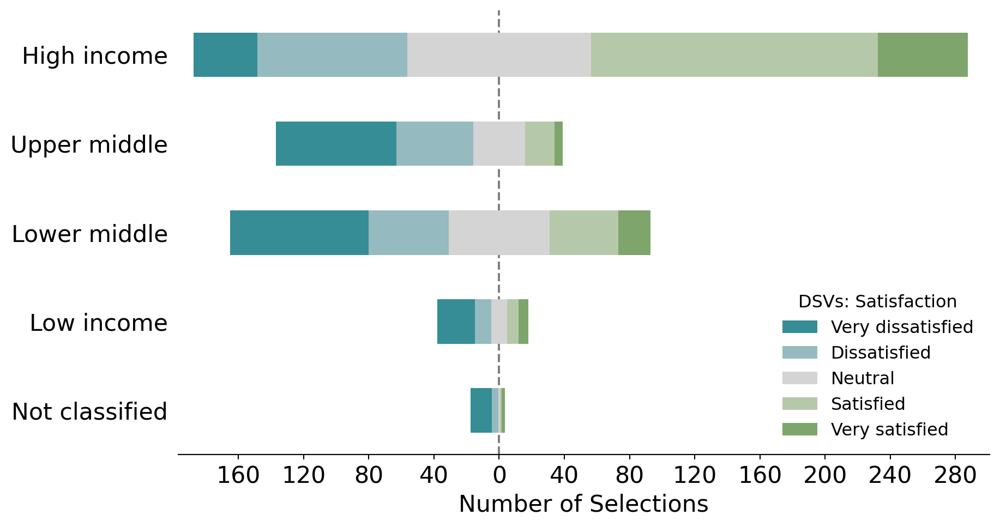

In [132]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q1')

### DSV satisfaction plot #2.

In [133]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Availability', 'Capabilities', 'Cost', 'Duration', 'Depth']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Depth', 'Duration']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [134]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                   \
col_name                               Q20_availability Q20_capabilities   
selection                                                                  
1 - Very dissatisfied                              54.0             44.0   
2 - Dissatisfied                                   51.0             37.0   
3 - Neither satisfied nor dissatisfied             49.0             37.0   
4 - Satisfied                                      39.0             53.0   
5 - Very satisfied                                  8.0             26.0   
Total                                             201.0            197.0   

                                                                        \
col_name                               Q20_cost Q20_depth Q20_duration   
selection                                                                
1 - Very dissatisfied                      49.0      44.0         43.0   
2 - Dissatisfied                           45.0      30.0         39.0   
3 - Neither satisfied nor dissatisfied     48.0      49.0         35.0   
4 - Satisfied                              43.0      50.0         59.0   
5 - Very satisfied                         12.0      19.0         23.0   
Total                                     197.0     192.0        199.0   

                                                percent                   \
col_name                               Q20_availability Q20_capabilities   
selection                                                                  
1 - Very dissatisfied                             26.87            22.34   
2 - Dissatisfied                                  25.37            18.78   
3 - Neither satisfied nor dissatisfied            24.38            18.78   
4 - Satisfied                                     19.40            26.90   
5 - Very satisfied                                 3.98            13.20   
Total                                            100.00           100.00   

                                                                        count  \
col_name                               Q20_cost Q20_depth Q20_duration  Total   
selection                                                                       
1 - Very dissatisfied                     24.87     22.92        21.61  234.0   
2 - Dissatisfied                          22.84     15.62        19.60  202.0   
3 - Neither satisfied nor dissatisfied    24.37     25.52        17.59  218.0   
4 - Satisfied                             21.83     26.04        29.65  244.0   
5 - Very satisfied                         6.09      9.90        11.56   88.0   
Total                                    100.00    100.00       100.01  986.0   

                                       percent  
col_name                                 Total  
selection                                       
1 - Very dissatisfied                    23.73  
2 - Dissatisfied                         20.49  
3 - Neither satisfied nor dissatisfied   22.11  
4 - Satisfied                            24.75  
5 - Very satisfied                        8.92  
Total                                   100.00

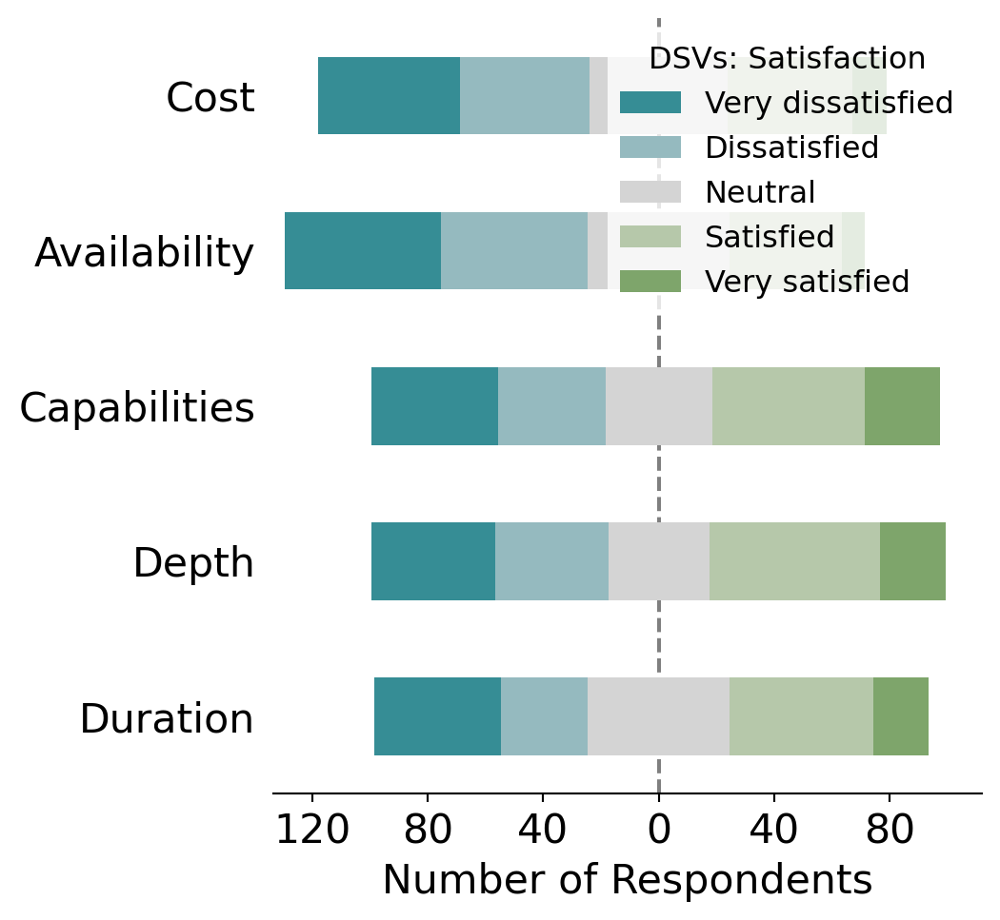

In [135]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q2')

### Q20a: DSV cost

In [136]:
## Select relevant survey data

cost = {}
for region in region_list:
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_cost') &
                (dataR[region]['selection'] != ''), 
                      ['respondent_id', 'subregion', 'col_name', 'selection']]

In [137]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [138]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          9.0        6.0   
2 - Dissatisfied                              21.0        3.0   
3 - Neither satisfied nor dissatisfied        28.0        2.0   
4 - Satisfied                                 32.0        NaN   
5 - Very satisfied                             5.0        1.0   
Total                                         95.0       12.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 19.0            2.0   
2 - Dissatisfied                                      10.0            NaN   
3 - Neither satisfied nor dissatisfied                13.0            1.0   
4 - Satisfied                                          7.0            NaN   
5 - Very satisfied                                     3.0            1.0   
Total                                                 52.0            4.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 13.0        9.47   
2 - Dissatisfied                                      11.0       22.11   
3 - Neither satisfied nor dissatisfied                 4.0       29.47   
4 - Satisfied                                          4.0       33.68   
5 - Very satisfied                                     2.0        5.26   
Total                                                 34.0       99.99   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       50.00               36.54   
2 - Dissatisfied                            25.00               19.23   
3 - Neither satisfied nor dissatisfied      16.67               25.00   
4 - Satisfied                                 NaN               13.46   
5 - Very satisfied                           8.33                5.77   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                            50.0               38.24   
2 - Dissatisfied                                  NaN               32.35   
3 - Neither satisfied nor dissatisfied           25.0               11.76   
4 - Satisfied                                     NaN               11.76   
5 - Very satisfied                               25.0                5.88   
Total                                           100.0               99.99   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    49.0   24.87  
2 - Dissatisfied                         45.0   22.84  
3 - Neither satisfied nor dissatisfied   48.0   24.37  
4 - Satisfied                            43.0   21.83  
5 - Very satisfied                       12.0    6.09  
Total                                   197.0  100.00

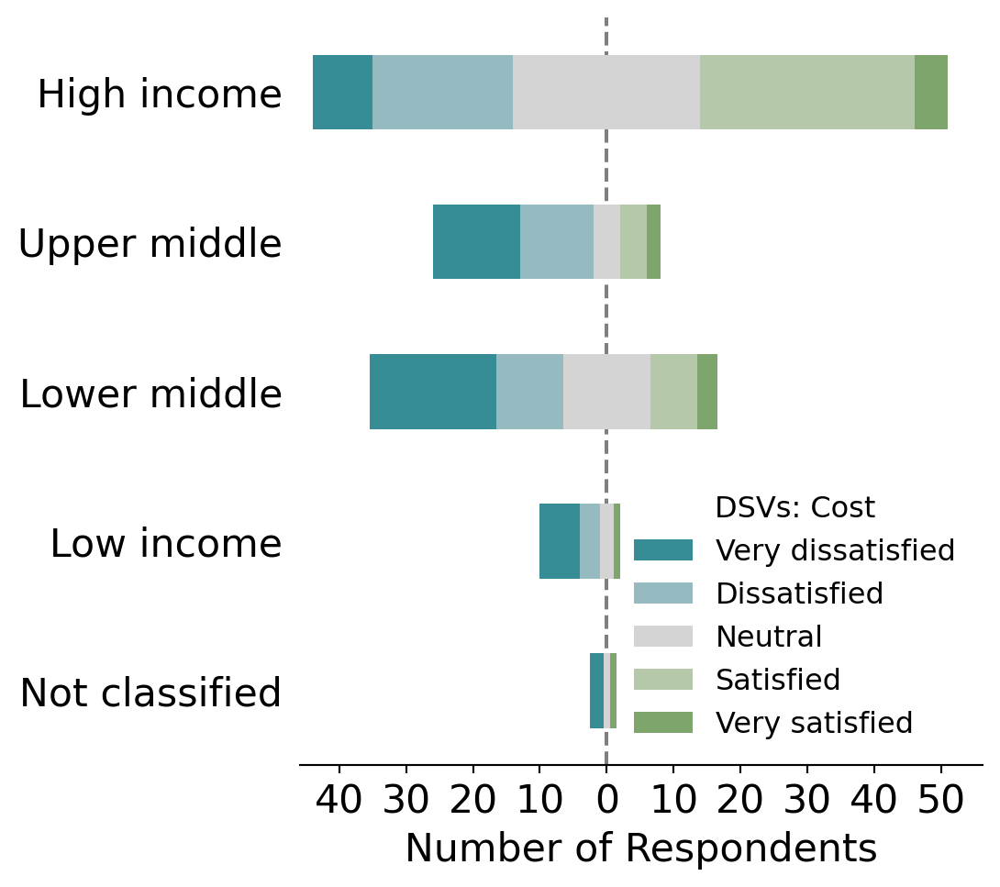

In [139]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Europe': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q3')

### Q20b: DSV availability

In [140]:
## Select relevant survey data

availability = {}
for region in region_list:
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [141]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

for region in region_list:
    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [142]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                         11.0        4.0   
2 - Dissatisfied                              25.0        3.0   
3 - Neither satisfied nor dissatisfied        29.0        2.0   
4 - Satisfied                                 28.0        1.0   
5 - Very satisfied                             3.0        1.0   
Total                                         96.0       11.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 19.0            3.0   
2 - Dissatisfied                                      13.0            1.0   
3 - Neither satisfied nor dissatisfied                11.0            NaN   
4 - Satisfied                                          7.0            NaN   
5 - Very satisfied                                     3.0            1.0   
Total                                                 53.0            5.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 17.0       11.46   
2 - Dissatisfied                                       9.0       26.04   
3 - Neither satisfied nor dissatisfied                 7.0       30.21   
4 - Satisfied                                          3.0       29.17   
5 - Very satisfied                                     NaN        3.12   
Total                                                 36.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       36.36               35.85   
2 - Dissatisfied                            27.27               24.53   
3 - Neither satisfied nor dissatisfied      18.18               20.75   
4 - Satisfied                                9.09               13.21   
5 - Very satisfied                           9.09                5.66   
Total                                       99.99              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                            60.0               47.22   
2 - Dissatisfied                                 20.0               25.00   
3 - Neither satisfied nor dissatisfied            NaN               19.44   
4 - Satisfied                                     NaN                8.33   
5 - Very satisfied                               20.0                 NaN   
Total                                           100.0               99.99   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    54.0   26.87  
2 - Dissatisfied                         51.0   25.37  
3 - Neither satisfied nor dissatisfied   49.0   24.38  
4 - Satisfied                            39.0   19.40  
5 - Very satisfied                        8.0    3.98  
Total                                   201.0  100.00

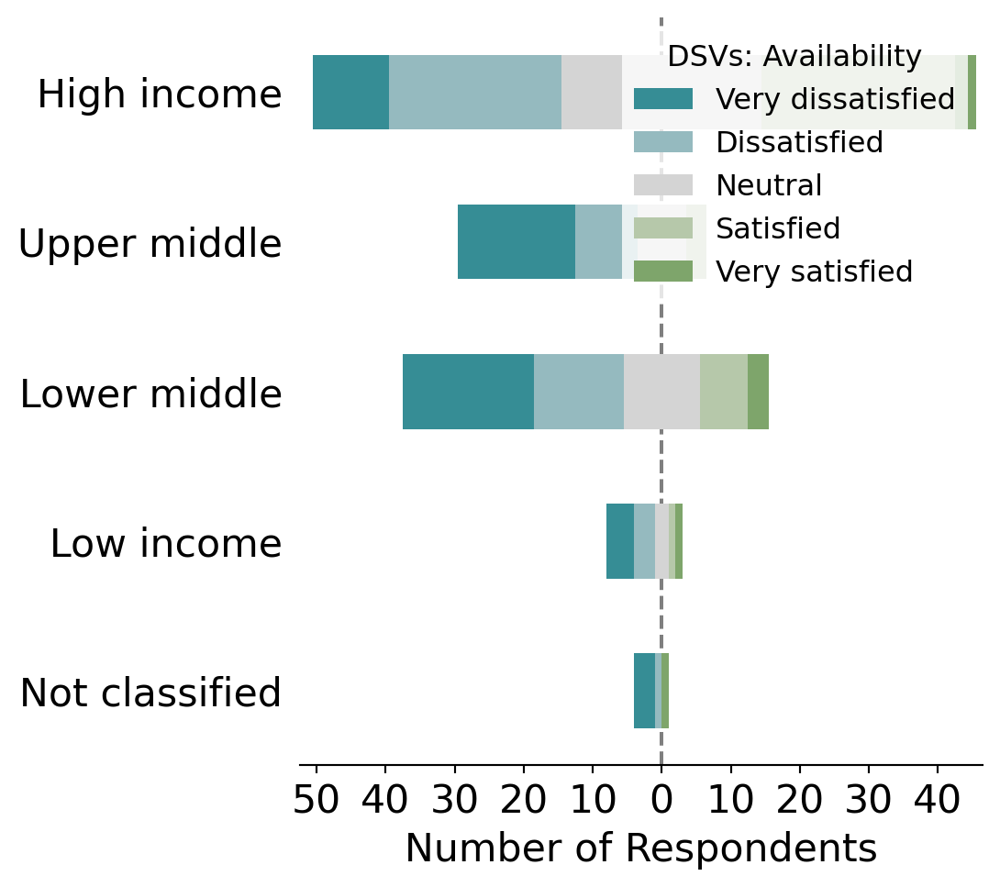

In [143]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q4')

### Q20c: DSV capabilities

In [144]:
## Select relevant survey data

capabilities = {}
for region in region_list:
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [145]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [146]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          6.0        4.0   
2 - Dissatisfied                              16.0        2.0   
3 - Neither satisfied nor dissatisfied        17.0        2.0   
4 - Satisfied                                 38.0        2.0   
5 - Very satisfied                            18.0        1.0   
Total                                         95.0       11.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 16.0            3.0   
2 - Dissatisfied                                       7.0            1.0   
3 - Neither satisfied nor dissatisfied                12.0            NaN   
4 - Satisfied                                         10.0            NaN   
5 - Very satisfied                                     6.0            NaN   
Total                                                 51.0            4.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 15.0        6.32   
2 - Dissatisfied                                      11.0       16.84   
3 - Neither satisfied nor dissatisfied                 6.0       17.89   
4 - Satisfied                                          3.0       40.00   
5 - Very satisfied                                     1.0       18.95   
Total                                                 36.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       36.36               31.37   
2 - Dissatisfied                            18.18               13.73   
3 - Neither satisfied nor dissatisfied      18.18               23.53   
4 - Satisfied                               18.18               19.61   
5 - Very satisfied                           9.09               11.76   
Total                                       99.99              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                            75.0               41.67   
2 - Dissatisfied                                 25.0               30.56   
3 - Neither satisfied nor dissatisfied            NaN               16.67   
4 - Satisfied                                     NaN                8.33   
5 - Very satisfied                                NaN                2.78   
Total                                           100.0              100.01   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    44.0   22.34  
2 - Dissatisfied                         37.0   18.78  
3 - Neither satisfied nor dissatisfied   37.0   18.78  
4 - Satisfied                            53.0   26.90  
5 - Very satisfied                       26.0   13.20  
Total                                   197.0  100.00

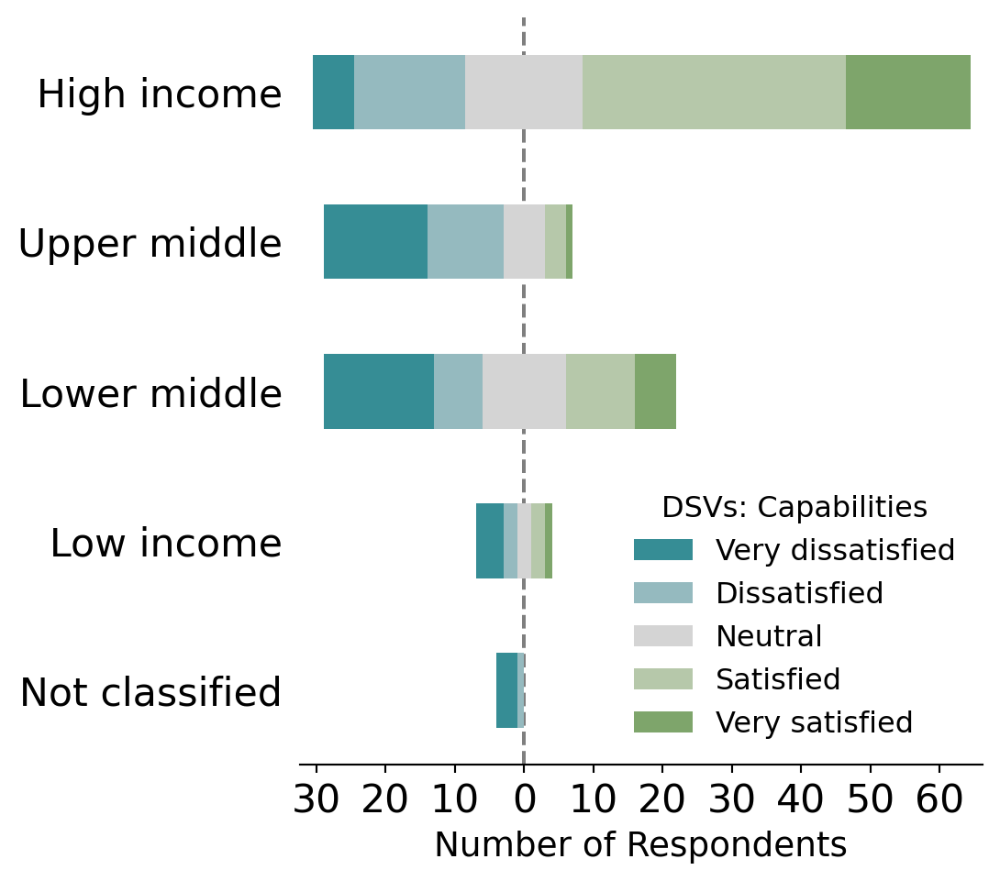

In [147]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Europe': 'upper left', 'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q5')

### Q20d: DSV depth

In [148]:
## Select relevant survey data

depth = {}
for region in region_list:
    depth[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_depth') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [149]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = depth[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [150]:
## Calculate statistics

for region in region_list:
    percent_data = (depth[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = depth[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          7.0        4.0   
2 - Dissatisfied                              13.0        1.0   
3 - Neither satisfied nor dissatisfied        26.0        2.0   
4 - Satisfied                                 34.0        2.0   
5 - Very satisfied                            12.0        1.0   
Total                                         92.0       10.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 17.0            3.0   
2 - Dissatisfied                                       8.0            1.0   
3 - Neither satisfied nor dissatisfied                12.0            NaN   
4 - Satisfied                                         10.0            NaN   
5 - Very satisfied                                     5.0            NaN   
Total                                                 52.0            4.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 13.0        7.61   
2 - Dissatisfied                                       7.0       14.13   
3 - Neither satisfied nor dissatisfied                 9.0       28.26   
4 - Satisfied                                          4.0       36.96   
5 - Very satisfied                                     1.0       13.04   
Total                                                 34.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                        40.0               32.69   
2 - Dissatisfied                             10.0               15.38   
3 - Neither satisfied nor dissatisfied       20.0               23.08   
4 - Satisfied                                20.0               19.23   
5 - Very satisfied                           10.0                9.62   
Total                                       100.0              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                            75.0               38.24   
2 - Dissatisfied                                 25.0               20.59   
3 - Neither satisfied nor dissatisfied            NaN               26.47   
4 - Satisfied                                     NaN               11.76   
5 - Very satisfied                                NaN                2.94   
Total                                           100.0              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    44.0   22.92  
2 - Dissatisfied                         30.0   15.62  
3 - Neither satisfied nor dissatisfied   49.0   25.52  
4 - Satisfied                            50.0   26.04  
5 - Very satisfied                       19.0    9.90  
Total                                   192.0  100.00

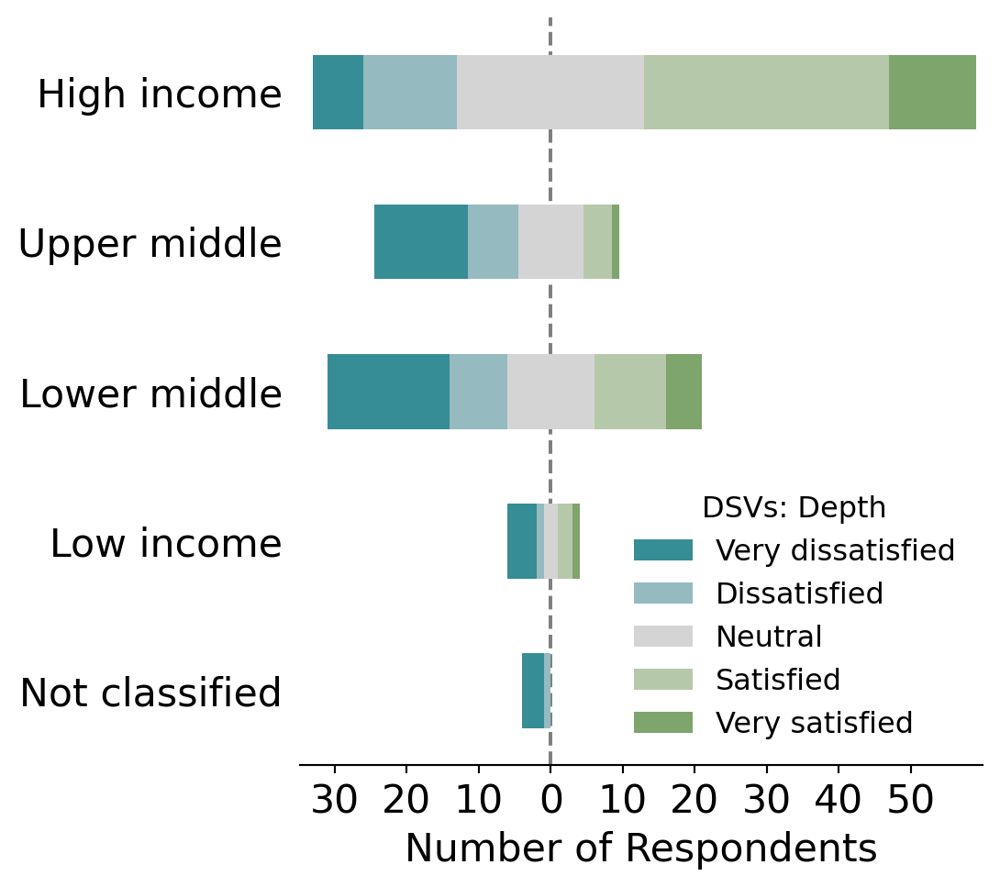

In [151]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right', 'Global': 'upper left', 'Oceania': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Depth',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q6')

### Q20e: DSV duration

In [152]:
## Select relevant survey data

duration = {}
for region in region_list:
    duration[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q20_duration') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

In [153]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = duration[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [154]:
## Calculate statistics

for region in region_list:
    percent_data = (duration[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = duration[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          6.0        5.0   
2 - Dissatisfied                              17.0        1.0   
3 - Neither satisfied nor dissatisfied        13.0        2.0   
4 - Satisfied                                 44.0        2.0   
5 - Very satisfied                            17.0        2.0   
Total                                         97.0       12.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 14.0            2.0   
2 - Dissatisfied                                      11.0            1.0   
3 - Neither satisfied nor dissatisfied                14.0            NaN   
4 - Satisfied                                          8.0            1.0   
5 - Very satisfied                                     3.0            NaN   
Total                                                 50.0            4.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 16.0        6.19   
2 - Dissatisfied                                       9.0       17.53   
3 - Neither satisfied nor dissatisfied                 6.0       13.40   
4 - Satisfied                                          4.0       45.36   
5 - Very satisfied                                     1.0       17.53   
Total                                                 36.0      100.01   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       41.67                28.0   
2 - Dissatisfied                             8.33                22.0   
3 - Neither satisfied nor dissatisfied      16.67                28.0   
4 - Satisfied                               16.67                16.0   
5 - Very satisfied                          16.67                 6.0   
Total                                      100.01               100.0   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                            50.0               44.44   
2 - Dissatisfied                                 25.0               25.00   
3 - Neither satisfied nor dissatisfied            NaN               16.67   
4 - Satisfied                                    25.0               11.11   
5 - Very satisfied                                NaN                2.78   
Total                                           100.0              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    43.0   21.61  
2 - Dissatisfied                         39.0   19.60  
3 - Neither satisfied nor dissatisfied   35.0   17.59  
4 - Satisfied                            59.0   29.65  
5 - Very satisfied                       23.0   11.56  
Total                                   199.0  100.00

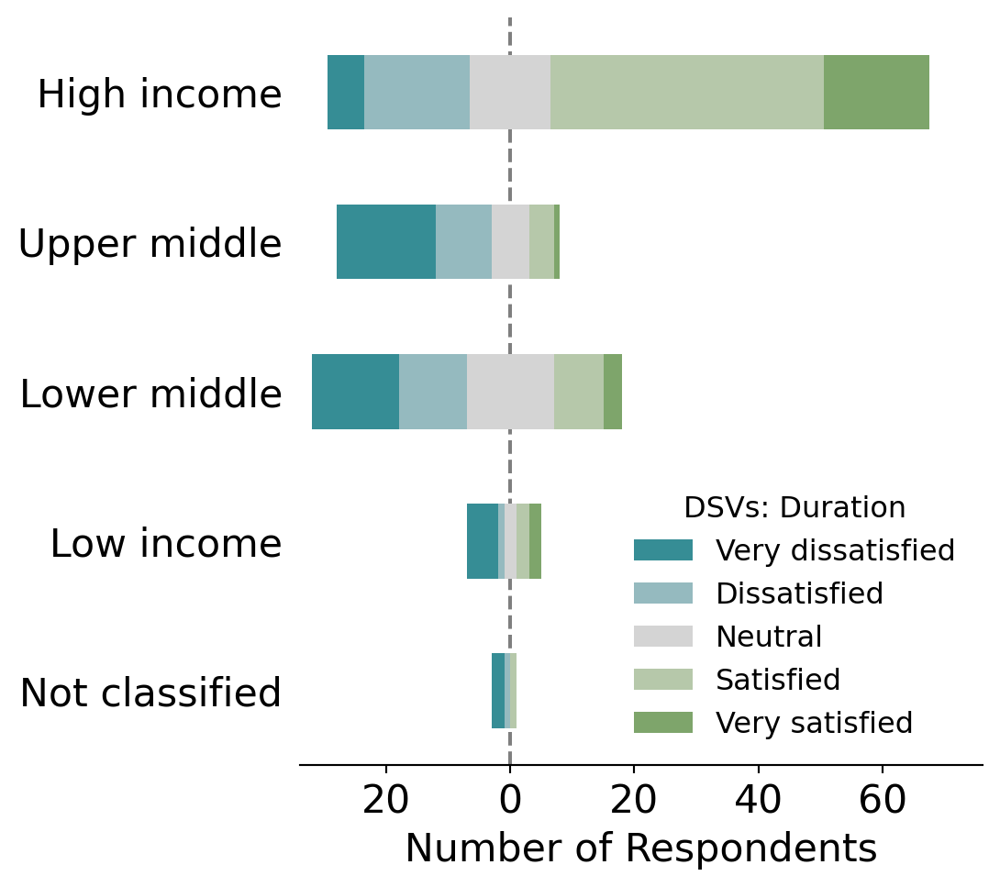

In [155]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Asia': 'lower left', 'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Duration',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='Q7')

## Fig R - Q17: DSV importance

In [156]:
## Select relevant survey data

importance = {}
for region in region_list:
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q17'), ['respondent_id', 'subregion', 'col_name', 'selection']] 

In [157]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

fig_data = {}
for region in region_list:
    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [158]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection                                                           
1 - Not important             11.0        3.0                19.0   
2 - A little important        10.0        1.0                 5.0   
3 - Somewhat important        18.0        1.0                20.0   
4 - Important                 16.0        3.0                10.0   
5 - Very important            81.0       16.0                53.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection                                                               
1 - Not important                 3.0                10.0        8.09   
2 - A little important            2.0                 3.0        7.35   
3 - Somewhat important            6.0                14.0       13.24   
4 - Important                     4.0                 5.0       11.76   
5 - Very important                3.0                43.0       59.56   
Total                            18.0                75.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection                                                              
1 - Not important           12.50               17.76          16.67   
2 - A little important       4.17                4.67          11.11   
3 - Somewhat important       4.17               18.69          33.33   
4 - Important               12.50                9.35          22.22   
5 - Very important          66.67               49.53          16.67   
Total                      100.01              100.00         100.00   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection                                                  
1 - Not important                    13.33   46.0   12.78  
2 - A little important                4.00   21.0    5.83  
3 - Somewhat important               18.67   59.0   16.39  
4 - Important                         6.67   38.0   10.56  
5 - Very important                   57.33  196.0   54.44  
Total                               100.00  360.0  100.00

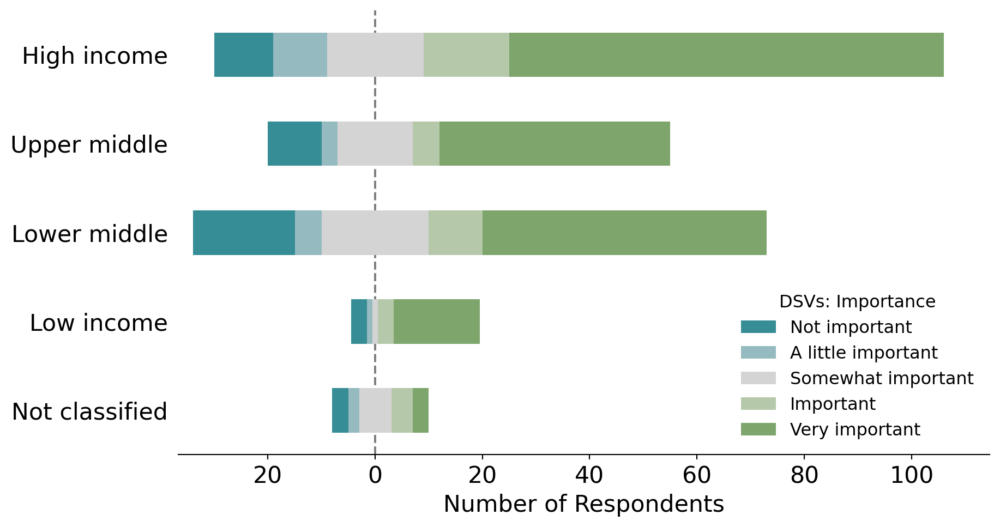

In [159]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='R1')

### Q21: DSV potential

In [160]:
## Select relevant survey data
potential = {}
for region in region_list:
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q21'), ['respondent_id', 'subregion', 'col_name', 'selection']]

In [161]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

fig_data = {}
for region in region_list:
    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'},
                      inplace=True)

In [162]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                                \
subregion           High income Low income Lower middle income Not classified   
selection                                                                       
1 - No impact               6.0        5.0                12.0            3.0   
2 - Little impact           7.0        NaN                 7.0            1.0   
3 - Moderate impact        18.0        4.0                20.0            3.0   
4 - High impact            37.0        2.0                11.0            1.0   
5 - Transformative         68.0       13.0                57.0           10.0   
Total                     136.0       24.0               107.0           18.0   

                                            percent             \
subregion           Upper middle income High income Low income   
selection                                                        
1 - No impact                       4.0        4.41      20.83   
2 - Little impact                   1.0        5.15        NaN   
3 - Moderate impact                12.0       13.24      16.67   
4 - High impact                     9.0       27.21       8.33   
5 - Transformative                 49.0       50.00      54.17   
Total                              75.0      100.01     100.00   

                                                                            \
subregion           Lower middle income Not classified Upper middle income   
selection                                                                    
1 - No impact                     11.21          16.67                5.33   
2 - Little impact                  6.54           5.56                1.33   
3 - Moderate impact               18.69          16.67               16.00   
4 - High impact                   10.28           5.56               12.00   
5 - Transformative                53.27          55.56               65.33   
Total                             99.99         100.02               99.99   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         30.0    8.33  
2 - Little impact     16.0    4.44  
3 - Moderate impact   57.0   15.83  
4 - High impact       60.0   16.67  
5 - Transformative   197.0   54.72  
Total                360.0  100.00

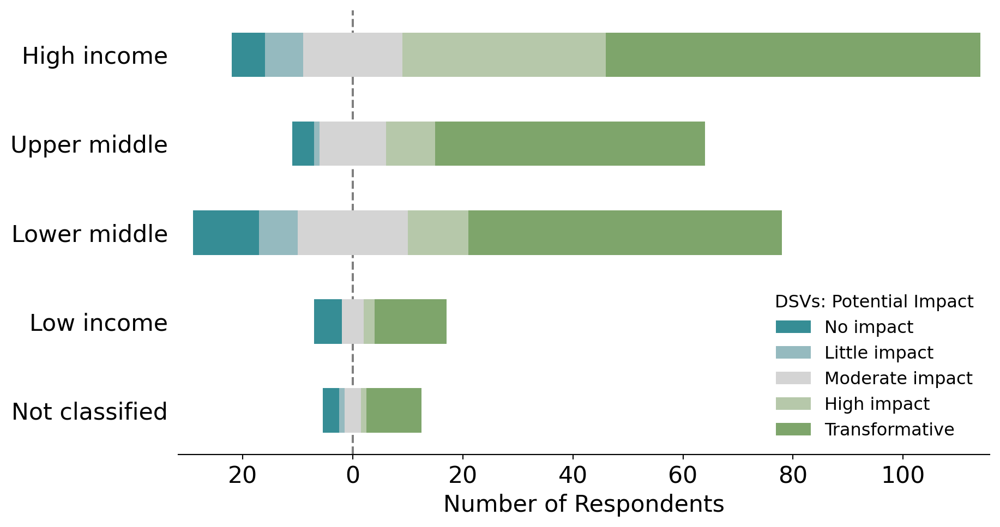

In [163]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='DSVs: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='7', letter='R2')

---
# **Section 8**

## Fig S - Sensor presence

In [164]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    sensor_presence = researchR[region].loc[(researchR[region]['question'] == 'Q24') &
                                   (researchR[region]['col_name'] != 'Q24_comments'), ['geoarea',
                                                                              'col_name',
                                                                              'subregion',
                                                                              'research_tech_clean']]
    sensor_presence['selection_binary'] = sensor_presence['research_tech_clean']

    fig_data[region] = (sensor_presence.groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = sensor_presence.groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q24_ctd':            'CTD',
        'Q24_water_sampling': 'Water sampling',
        'Q24_o2':             'Oxygen, pH, eH',
        'Q24_mapping':        'Seafloor mapping',
        'Q24_imaging':        'Imaging',
        'Q24_navigation':     'Navigation',
        'Q24_eDNA':           'eDNA sampling',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'ctd'):('count', 'water')].sum()
    pivoted.loc['Total', ('percent', 'ctd'):('percent', 'water')] = \
        ((pivoted.loc['Total', ('count', 'ctd'):('count', 'water')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

    ## Names of GeoAreas with all types present
    num_types = (sensor_presence
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(num_types[num_types['num_types'] == num_types['num_types'].max()])

    ## Names of GeoAreas with fewest types present
    display(num_types[num_types['num_types'] == num_types['num_types'].min()])

    ## % of areas in region that have all types
    num_types = (sensor_presence.groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())

    display(round((num_types[num_types['num_types'] == 7].shape[0]/num_types.shape[0])*100, 2))

    ## % of areas in region with < 3 types
    display(round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2))

count                                                     \
col_name         CTD Imaging Navigation Oxygen, pH, eH Seafloor mapping   
subregion                                                                 
High income     37.0    35.0       33.0           31.0             40.0   
Low income       0.0     2.0        3.0            0.0              1.0   
Lower middle    23.0    11.0       25.0           16.0             21.0   
Not classified   8.0    14.0       17.0           13.0              8.0   
Upper middle    24.0    24.0       27.0           25.0             24.0   
Total           92.0    86.0      105.0           85.0             94.0   

                                            percent                     \
col_name       Water sampling eDNA sampling     CTD Imaging Navigation   
subregion                                                                
High income              41.0          33.0   69.81   66.04      62.26   
Low income                5.0           1.0    0.00   13.33      20.00   
Lower middle             26.0           8.0   56.10   26.83      60.98   
Not classified           10.0           4.0   27.59   48.28      58.62   
Upper middle             25.0          14.0   57.14   57.14      64.29   
Total                   107.0          60.0  210.64  211.62     266.15   

                                                                             
col_name       Oxygen, pH, eH Seafloor mapping Water sampling eDNA sampling  
subregion                                                                    
High income             58.49            75.47          77.36         62.26  
Low income               0.00             6.67          33.33          6.67  
Lower middle            39.02            51.22          63.41         19.51  
Not classified          44.83            27.59          34.48         13.79  
Upper middle            59.52            57.14          59.52         33.33  
Total                  201.86           218.09         268.10        100.00

,subregion,geoarea,num_types
2,High income,Australia,7
8,High income,Canada,7
10,High income,Chile,7
13,High income,Cyprus,7
15,High income,France,7
16,High income,French Polynesia,7
18,High income,Greece,7
20,High income,Guam,7
22,High income,Ireland,7
24,High income,Italy,7


,subregion,geoarea,num_types
17,High income,Gibraltar,0
40,High income,Saint Martin,0
55,Low income,Eritrea,0
56,Low income,Gambia,0
58,Low income,Guinea-Bissau,0
59,Low income,Liberia,0
61,Low income,Mozambique,0
62,Low income,Sierra Leone,0
63,Low income,Somalia,0
65,Low income,Syria,0


18.33

40.0

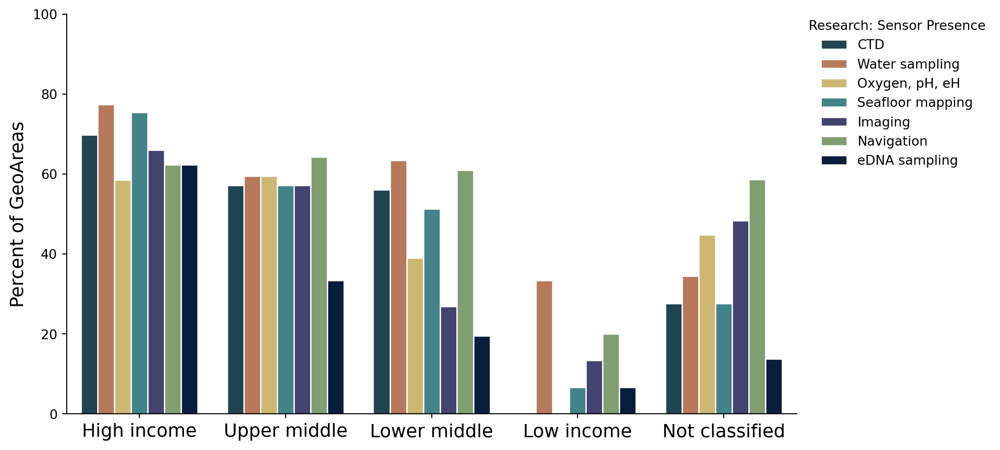

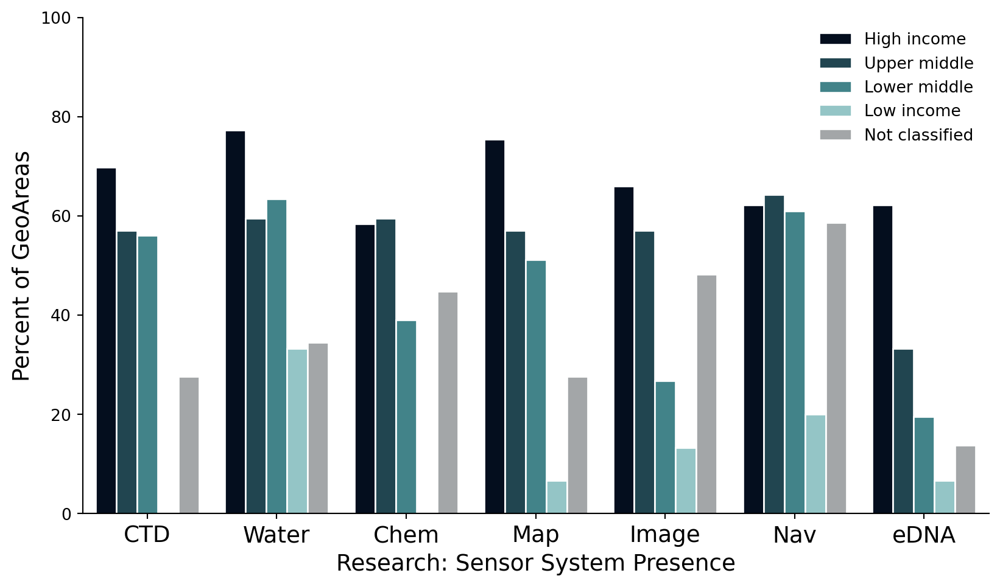

In [165]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07,
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Sensor Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='S1')

    ## S2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(['CTD', 'Water', 'Chem', 'Map', 'Image', 'Nav', 'eDNA'], rotation=0, fontsize=14)
    ax.set_xlabel('Research: Sensor System Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='S2')

## Fig T - Q24: Sensor Access

In [166]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
fig_data = {}
percent_data = {}
for region in region_list:
    vessels = dataR[region].loc[dataR[region]['question'] == 'Q24', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data[region] = (vessels.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    renames = {
        'CTD':            'CTD',
        'Water sampling':                               'Water sampling',
        'Oxygen, pH, and/or eH':                        'Oxygen, pH, eH',
        'Seafloor mapping (sidescan and/or multibeam)': 'Seafloor mapping',
        'Imaging (still and/or video)':                 'Imaging',
        'Navigation/tracking (USBL, LBL, etc.)':        'Navigation',
        'eDNA sampling':                                'eDNA sampling',
        'Other':                                        'Other',
        'None of the above':                            'None of the above',
    }
    hue_order = renames.values()
    fig_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    vessels['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    # Calculate percentages
    percent_data[region] = fig_data[region].copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data[region]['total'] = percent_data[region]['subregion']
    percent_data[region]['total'].replace(respondent_sub_dict, inplace=True)
    percent_data[region]['percent'] = round((percent_data[region]['count']/percent_data[region]['total'])*100, 2)

    pivoted = percent_data[region].pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/num_respondents)*100, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)

count                                         \
subregion              High income Low income Lower middle Not classified   
selection_survey_clean                                                      
CTD                          101.0        7.0         52.0            4.0   
Imaging                       82.0        3.0         26.0            5.0   
Navigation                    71.0        1.0         16.0            1.0   
None of the above             24.0       11.0         24.0           11.0   
Other                         12.0        1.0          8.0            1.0   
Oxygen, pH, eH                85.0        7.0         56.0            6.0   
Seafloor mapping              91.0        4.0         28.0            4.0   
Water sampling                84.0       10.0         62.0            5.0   
eDNA sampling                 44.0        2.0          5.0            NaN   
Total                        135.0       24.0        105.0           17.0   

                                        percent                          \
subregion              Upper middle High income Low income Lower middle   
selection_survey_clean                                                    
CTD                            41.0       74.81      29.17        49.52   
Imaging                        17.0       60.74      12.50        24.76   
Navigation                     15.0       52.59       4.17        15.24   
None of the above              21.0       17.78      45.83        22.86   
Other                           4.0        8.89       4.17         7.62   
Oxygen, pH, eH                 39.0       62.96      29.17        53.33   
Seafloor mapping               33.0       67.41      16.67        26.67   
Water sampling                 43.0       62.22      41.67        59.05   
eDNA sampling                   9.0       32.59       8.33         4.76   
Total                          74.0       38.03       6.76        29.58   

                                                    count percent  
subregion              Not classified Upper middle  Total   Total  
selection_survey_clean                                             
CTD                             23.53        55.41  205.0   57.75  
Imaging                         29.41        22.97  133.0   37.46  
Navigation                       5.88        20.27  104.0   29.30  
None of the above               64.71        28.38   91.0   25.63  
Other                            5.88         5.41   26.0    7.32  
Oxygen, pH, eH                  35.29        52.70  193.0   54.37  
Seafloor mapping                23.53        44.59  160.0   45.07  
Water sampling                  29.41        58.11  204.0   57.46  
eDNA sampling                     NaN        12.16   60.0   16.90  
Total                            4.79        20.85  355.0  100.00

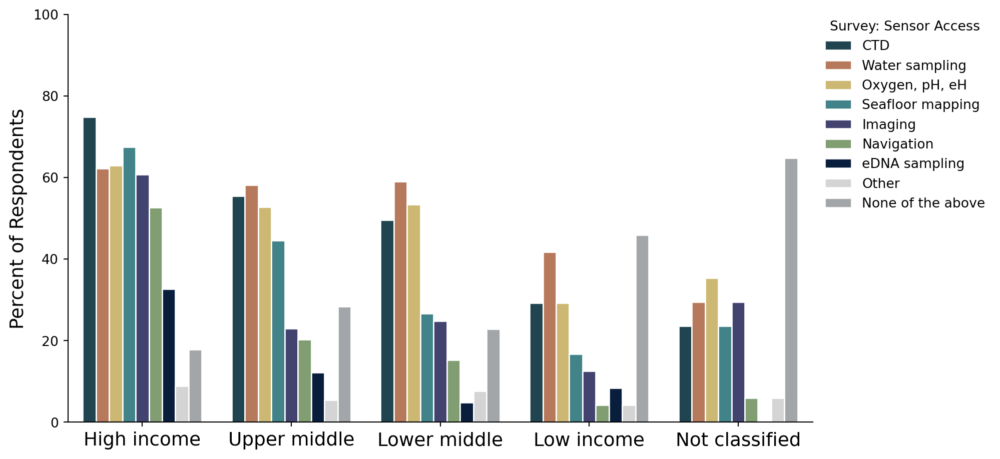

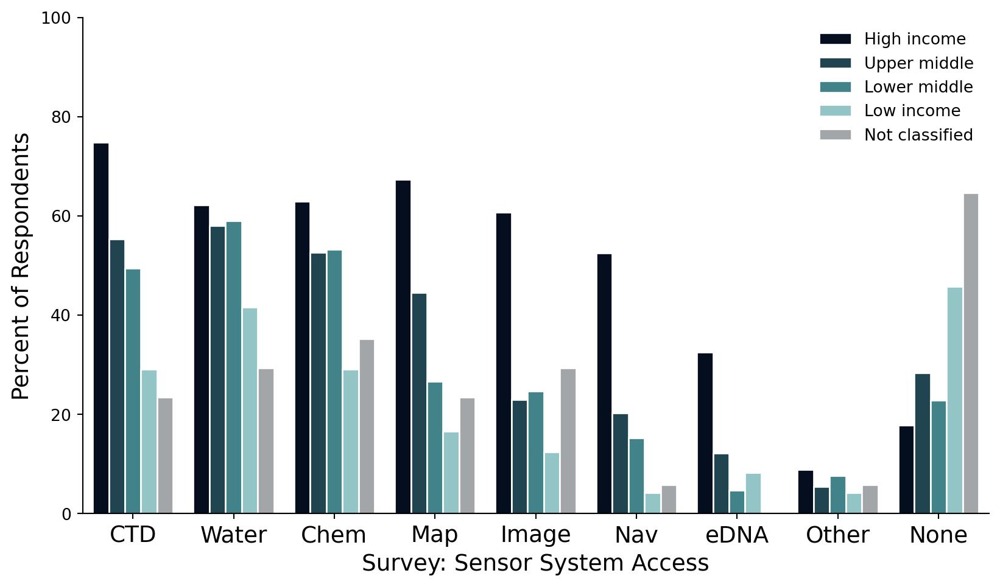

In [167]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(bbox_to_anchor=(1, 1.015), loc=loc_tweaker(region, loc_tweaks),
              title='Survey: Sensor Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='T1')

    ## T2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(['CTD', 'Water', 'Chem', 'Map', 'Image', 'Nav', 'eDNA', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Sensor System Access', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    loc_tweaks = {}
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='8', letter='T2')

## Fig U - Q25: Sensor satisfaction

In [168]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

satisfaction = {}
missing_responses = {}
fig_data = {}
for region in region_list:
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q25', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q25_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]

    # There's a note in the spreadsheet to exclude duration here
    satisfaction[region] = satisfaction[region][satisfaction[region]['col_name'] != 'Q25_duration']

    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])

    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')
    
    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [169]:
## Calculate statistics

for region in region_list:
    ## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
    ## NA for more than one question
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)

    ## Calculate the number of people who chose NA on at least one part of the question - EXCLUDING OTHER
    display(missing_responses[region].loc[missing_responses[region]['col_name'] != 'Q25_other', 'respondent_id'].nunique())

    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

subregion,High income,Low income,Lower middle income,Not classified,Upper middle income,Total
col_name,,,,,,
Q25_accuracy,34,10,34,12,25,115
Q25_availability,30,8,31,12,26,107
Q25_capabilities,34,8,38,12,26,118
Q25_cost,30,9,33,12,25,109
Q25_depth,30,8,33,12,25,108
Q25_duration,38,9,33,12,26,118
Q25_ease,29,10,33,12,25,109
Q25_other,136,24,107,18,75,360


138

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                         18.0       21.0   
2 - Dissatisfied                              77.0       24.0   
3 - Neither satisfied nor dissatisfied       150.0       18.0   
4 - Satisfied                                280.0       16.0   
5 - Very satisfied                           104.0       12.0   
Total                                        629.0       91.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 65.0           15.0   
2 - Dissatisfied                                      96.0            8.0   
3 - Neither satisfied nor dissatisfied               117.0           12.0   
4 - Satisfied                                        135.0            1.0   
5 - Very satisfied                                    27.0            NaN   
Total                                                440.0           36.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 49.0        2.86   
2 - Dissatisfied                                      83.0       12.24   
3 - Neither satisfied nor dissatisfied                65.0       23.85   
4 - Satisfied                                         85.0       44.52   
5 - Very satisfied                                    16.0       16.53   
Total                                                298.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       23.08               14.77   
2 - Dissatisfied                            26.37               21.82   
3 - Neither satisfied nor dissatisfied      19.78               26.59   
4 - Satisfied                               17.58               30.68   
5 - Very satisfied                          13.19                6.14   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           41.67               16.44   
2 - Dissatisfied                                22.22               27.85   
3 - Neither satisfied nor dissatisfied          33.33               21.81   
4 - Satisfied                                    2.78               28.52   
5 - Very satisfied                                NaN                5.37   
Total                                          100.00               99.99   

                                         count percent  
subregion                                Total   Total  
selection                                               
1 - Very dissatisfied                    168.0   11.24  
2 - Dissatisfied                         288.0   19.28  
3 - Neither satisfied nor dissatisfied   362.0   24.23  
4 - Satisfied                            517.0   34.61  
5 - Very satisfied                       159.0   10.64  
Total                                   1494.0  100.00

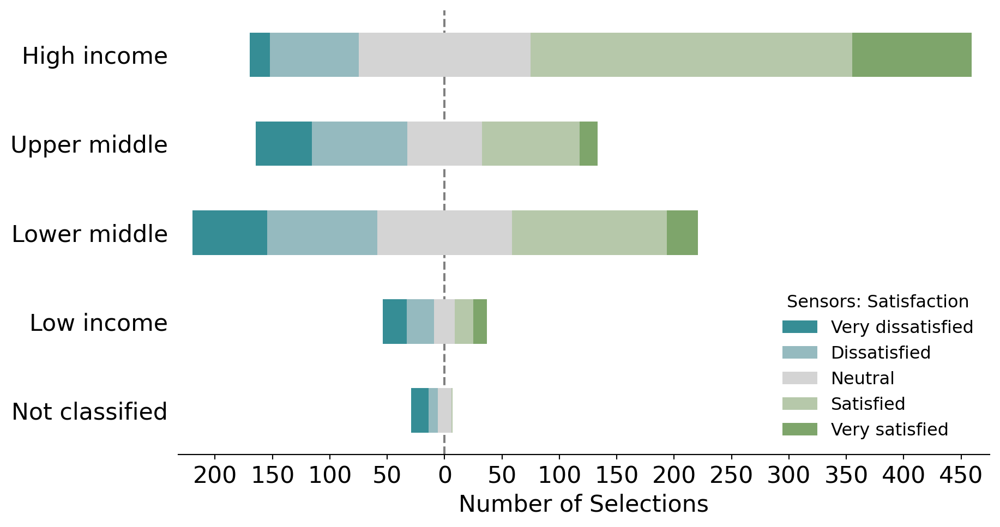

In [170]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U1')

### Sensor satisfaction plot #2.

In [171]:
## Calculate values for plot
#note: reuses satisfaction data from previous figure

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Accuracy', 'Availability', 'Capabilities', 'Cost', 'Depth', 'Ease']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Depth', 'Ease', 'Accuracy']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [172]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                   \
col_name                               Q25_accuracy Q25_availability   
selection                                                              
1 - Very dissatisfied                          21.0             35.0   
2 - Dissatisfied                               24.0             60.0   
3 - Neither satisfied nor dissatisfied         69.0             60.0   
4 - Satisfied                                  94.0             83.0   
5 - Very satisfied                             37.0             15.0   
Total                                         245.0            253.0   

                                                                            \
col_name                               Q25_capabilities Q25_cost Q25_depth   
selection                                                                    
1 - Very dissatisfied                              23.0     31.0      32.0   
2 - Dissatisfied                                   50.0     60.0      41.0   
3 - Neither satisfied nor dissatisfied             53.0     62.0      63.0   
4 - Satisfied                                      85.0     80.0      84.0   
5 - Very satisfied                                 31.0     18.0      32.0   
Total                                             242.0    251.0     252.0   

                                                     percent                   \
col_name                               Q25_ease Q25_accuracy Q25_availability   
selection                                                                       
1 - Very dissatisfied                      26.0         8.57            13.83   
2 - Dissatisfied                           53.0         9.80            23.72   
3 - Neither satisfied nor dissatisfied     55.0        28.16            23.72   
4 - Satisfied                              91.0        38.37            32.81   
5 - Very satisfied                         26.0        15.10             5.93   
Total                                     251.0       100.00           100.01   

                                                                            \
col_name                               Q25_capabilities Q25_cost Q25_depth   
selection                                                                    
1 - Very dissatisfied                              9.50    12.35     12.70   
2 - Dissatisfied                                  20.66    23.90     16.27   
3 - Neither satisfied nor dissatisfied            21.90    24.70     25.00   
4 - Satisfied                                     35.12    31.87     33.33   
5 - Very satisfied                                12.81     7.17     12.70   
Total                                             99.99    99.99    100.00   

                                                  count percent  
col_name                               Q25_ease   Total   Total  
selection                                                        
1 - Very dissatisfied                     10.36   168.0   11.24  
2 - Dissatisfied                          21.12   288.0   19.28  
3 - Neither satisfied nor dissatisfied    21.91   362.0   24.23  
4 - Satisfied                             36.25   517.0   34.61  
5 - Very satisfied                        10.36   159.0   10.64  
Total                                    100.00  1494.0  100.00

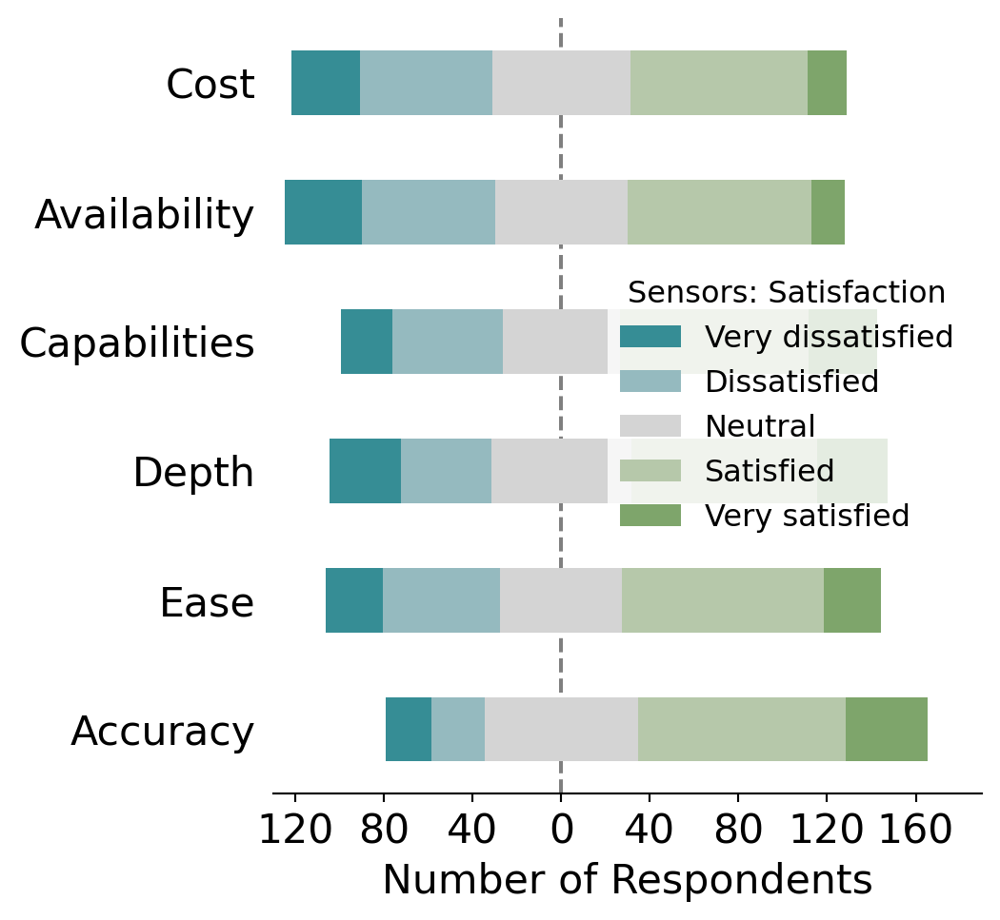

In [173]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U2')

### Q25a: Sensor cost

In [174]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

cost = {}
fig_data = {}
for region in region_list:
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_cost') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [175]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          3.0        4.0   
2 - Dissatisfied                              16.0        5.0   
3 - Neither satisfied nor dissatisfied        27.0        2.0   
4 - Satisfied                                 47.0        2.0   
5 - Very satisfied                            13.0        2.0   
Total                                        106.0       15.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 14.0            2.0   
2 - Dissatisfied                                      21.0            NaN   
3 - Neither satisfied nor dissatisfied                20.0            3.0   
4 - Satisfied                                         17.0            1.0   
5 - Very satisfied                                     2.0            NaN   
Total                                                 74.0            6.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  8.0        2.83   
2 - Dissatisfied                                      18.0       15.09   
3 - Neither satisfied nor dissatisfied                10.0       25.47   
4 - Satisfied                                         13.0       44.34   
5 - Very satisfied                                     1.0       12.26   
Total                                                 50.0       99.99   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       26.67               18.92   
2 - Dissatisfied                            33.33               28.38   
3 - Neither satisfied nor dissatisfied      13.33               27.03   
4 - Satisfied                               13.33               22.97   
5 - Very satisfied                          13.33                2.70   
Total                                       99.99              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           33.33                16.0   
2 - Dissatisfied                                  NaN                36.0   
3 - Neither satisfied nor dissatisfied          50.00                20.0   
4 - Satisfied                                   16.67                26.0   
5 - Very satisfied                                NaN                 2.0   
Total                                          100.00               100.0   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    31.0   12.35  
2 - Dissatisfied                         60.0   23.90  
3 - Neither satisfied nor dissatisfied   62.0   24.70  
4 - Satisfied                            80.0   31.87  
5 - Very satisfied                       18.0    7.17  
Total                                   251.0  100.00

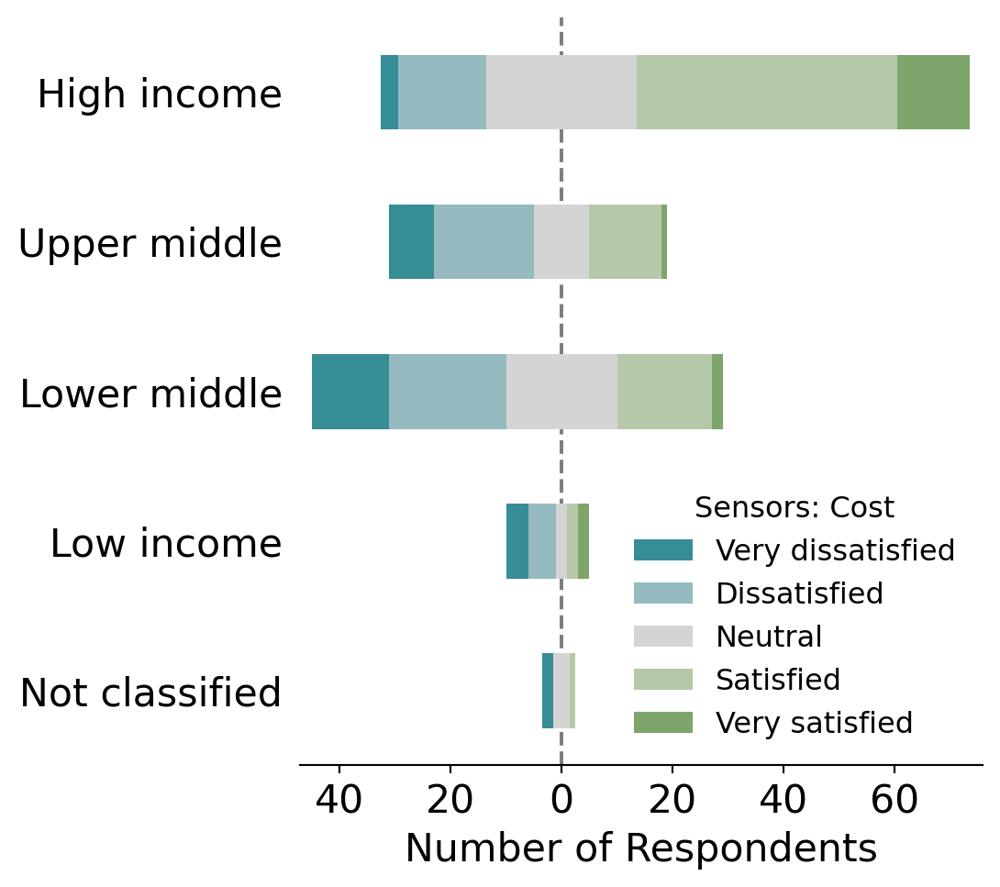

In [176]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U3')

### Q25b: Sensor availability

In [177]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

availability = {}
fig_data = {}
for region in region_list:
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({'1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [178]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          4.0        4.0   
2 - Dissatisfied                              18.0        6.0   
3 - Neither satisfied nor dissatisfied        28.0        3.0   
4 - Satisfied                                 45.0        1.0   
5 - Very satisfied                            11.0        2.0   
Total                                        106.0       16.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 14.0            2.0   
2 - Dissatisfied                                      19.0            3.0   
3 - Neither satisfied nor dissatisfied                19.0            1.0   
4 - Satisfied                                         23.0            NaN   
5 - Very satisfied                                     1.0            NaN   
Total                                                 76.0            6.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 11.0        3.77   
2 - Dissatisfied                                      14.0       16.98   
3 - Neither satisfied nor dissatisfied                 9.0       26.42   
4 - Satisfied                                         14.0       42.45   
5 - Very satisfied                                     1.0       10.38   
Total                                                 49.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       25.00               18.42   
2 - Dissatisfied                            37.50               25.00   
3 - Neither satisfied nor dissatisfied      18.75               25.00   
4 - Satisfied                                6.25               30.26   
5 - Very satisfied                          12.50                1.32   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           33.33               22.45   
2 - Dissatisfied                                50.00               28.57   
3 - Neither satisfied nor dissatisfied          16.67               18.37   
4 - Satisfied                                     NaN               28.57   
5 - Very satisfied                                NaN                2.04   
Total                                          100.00              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    35.0   13.83  
2 - Dissatisfied                         60.0   23.72  
3 - Neither satisfied nor dissatisfied   60.0   23.72  
4 - Satisfied                            83.0   32.81  
5 - Very satisfied                       15.0    5.93  
Total                                   253.0  100.00

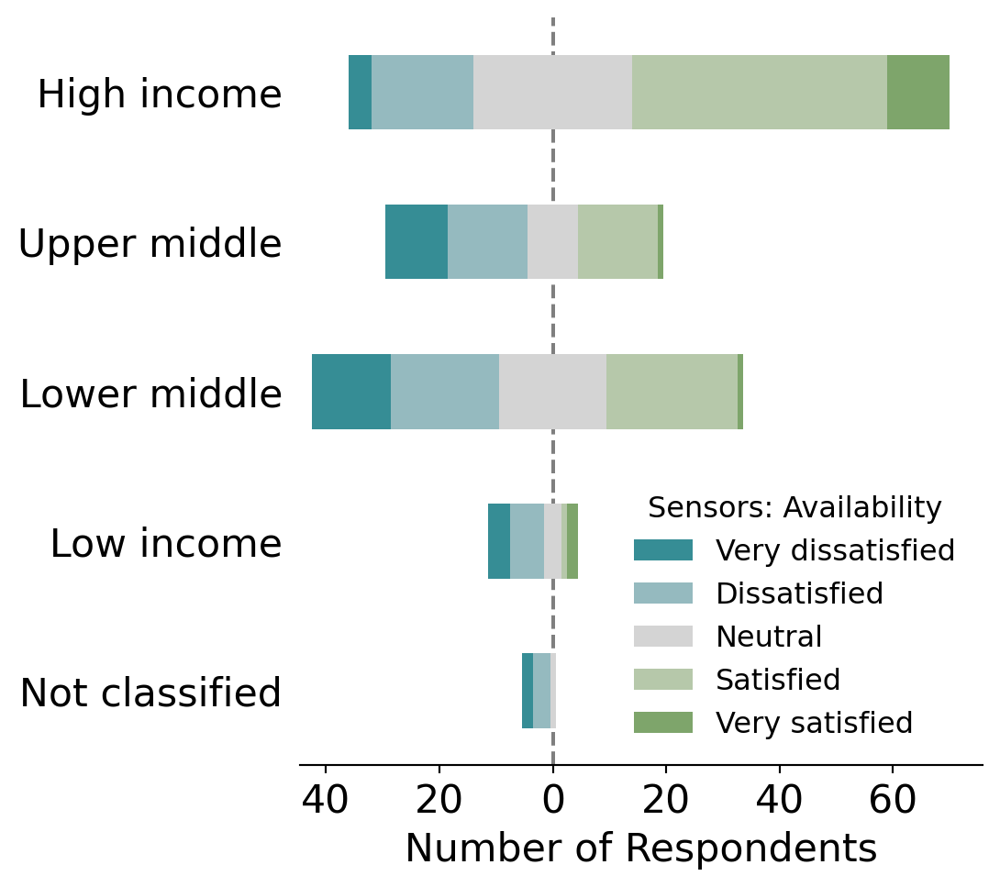

In [179]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Asia': 'lower left', 'Economies': 'lower right', 'Global': 'upper left', 'Oceania': 'upper right', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U4')

### Q25c: Sensor capabilities

In [180]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

capabilities = {}
fig_data = {}
for region in region_list:
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [181]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          1.0        4.0   
2 - Dissatisfied                              14.0        4.0   
3 - Neither satisfied nor dissatisfied        23.0        2.0   
4 - Satisfied                                 42.0        4.0   
5 - Very satisfied                            22.0        2.0   
Total                                        102.0       16.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                  9.0            2.0   
2 - Dissatisfied                                      13.0            2.0   
3 - Neither satisfied nor dissatisfied                18.0            2.0   
4 - Satisfied                                         24.0            NaN   
5 - Very satisfied                                     5.0            NaN   
Total                                                 69.0            6.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  7.0        0.98   
2 - Dissatisfied                                      17.0       13.73   
3 - Neither satisfied nor dissatisfied                 8.0       22.55   
4 - Satisfied                                         15.0       41.18   
5 - Very satisfied                                     2.0       21.57   
Total                                                 49.0      100.01   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                        25.0               13.04   
2 - Dissatisfied                             25.0               18.84   
3 - Neither satisfied nor dissatisfied       12.5               26.09   
4 - Satisfied                                25.0               34.78   
5 - Very satisfied                           12.5                7.25   
Total                                       100.0              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           33.33               14.29   
2 - Dissatisfied                                33.33               34.69   
3 - Neither satisfied nor dissatisfied          33.33               16.33   
4 - Satisfied                                     NaN               30.61   
5 - Very satisfied                                NaN                4.08   
Total                                           99.99              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    23.0    9.50  
2 - Dissatisfied                         50.0   20.66  
3 - Neither satisfied nor dissatisfied   53.0   21.90  
4 - Satisfied                            85.0   35.12  
5 - Very satisfied                       31.0   12.81  
Total                                   242.0  100.00

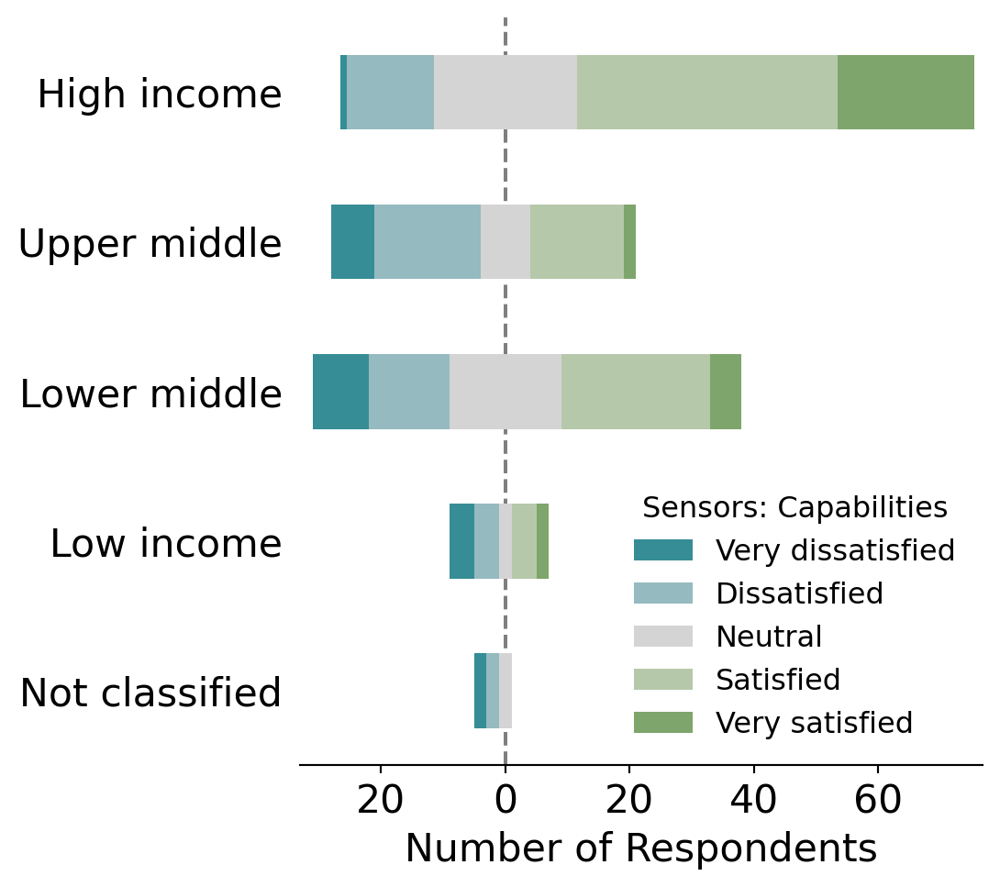

In [182]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U5')

### Q25d: Sensor depth

In [183]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

depth = {}
fig_data = {}
for region in region_list:
    depth[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_depth') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = depth[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [184]:
## Calculate statistics

for region in region_list:
    percent_data = (depth[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = depth[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          4.0        3.0   
2 - Dissatisfied                               7.0        4.0   
3 - Neither satisfied nor dissatisfied        26.0        4.0   
4 - Satisfied                                 48.0        3.0   
5 - Very satisfied                            21.0        2.0   
Total                                        106.0       16.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 10.0            4.0   
2 - Dissatisfied                                      17.0            NaN   
3 - Neither satisfied nor dissatisfied                20.0            2.0   
4 - Satisfied                                         22.0            NaN   
5 - Very satisfied                                     5.0            NaN   
Total                                                 74.0            6.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 11.0        3.77   
2 - Dissatisfied                                      13.0        6.60   
3 - Neither satisfied nor dissatisfied                11.0       24.53   
4 - Satisfied                                         11.0       45.28   
5 - Very satisfied                                     4.0       19.81   
Total                                                 50.0       99.99   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       18.75               13.51   
2 - Dissatisfied                            25.00               22.97   
3 - Neither satisfied nor dissatisfied      25.00               27.03   
4 - Satisfied                               18.75               29.73   
5 - Very satisfied                          12.50                6.76   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           66.67                22.0   
2 - Dissatisfied                                  NaN                26.0   
3 - Neither satisfied nor dissatisfied          33.33                22.0   
4 - Satisfied                                     NaN                22.0   
5 - Very satisfied                                NaN                 8.0   
Total                                          100.00               100.0   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    32.0   12.70  
2 - Dissatisfied                         41.0   16.27  
3 - Neither satisfied nor dissatisfied   63.0   25.00  
4 - Satisfied                            84.0   33.33  
5 - Very satisfied                       32.0   12.70  
Total                                   252.0  100.00

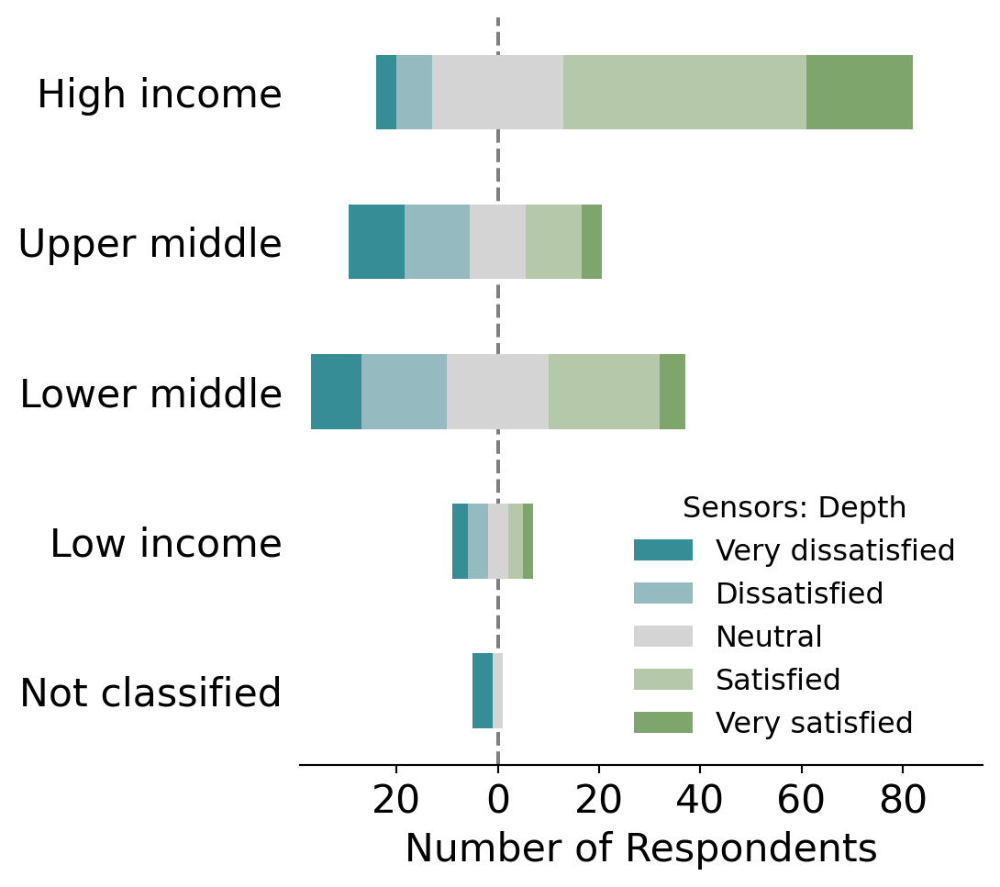

In [185]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper left', 'Oceania': 'upper right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Depth',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U6')

### Q25e: Sensor ease of use

In [186]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

ease = {}
fig_data = {}
for region in region_list:
    ease[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_ease') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = ease[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [187]:
## Calculate statistics

for region in region_list:
    percent_data = (ease[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = ease[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          4.0        3.0   
2 - Dissatisfied                              16.0        3.0   
3 - Neither satisfied nor dissatisfied        22.0        3.0   
4 - Satisfied                                 50.0        3.0   
5 - Very satisfied                            15.0        2.0   
Total                                        107.0       14.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                  9.0            3.0   
2 - Dissatisfied                                      19.0            2.0   
3 - Neither satisfied nor dissatisfied                18.0            1.0   
4 - Satisfied                                         22.0            NaN   
5 - Very satisfied                                     6.0            NaN   
Total                                                 74.0            6.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  7.0        3.74   
2 - Dissatisfied                                      13.0       14.95   
3 - Neither satisfied nor dissatisfied                11.0       20.56   
4 - Satisfied                                         16.0       46.73   
5 - Very satisfied                                     3.0       14.02   
Total                                                 50.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       21.43               12.16   
2 - Dissatisfied                            21.43               25.68   
3 - Neither satisfied nor dissatisfied      21.43               24.32   
4 - Satisfied                               21.43               29.73   
5 - Very satisfied                          14.29                8.11   
Total                                      100.01              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           50.00                14.0   
2 - Dissatisfied                                33.33                26.0   
3 - Neither satisfied nor dissatisfied          16.67                22.0   
4 - Satisfied                                     NaN                32.0   
5 - Very satisfied                                NaN                 6.0   
Total                                          100.00               100.0   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    26.0   10.36  
2 - Dissatisfied                         53.0   21.12  
3 - Neither satisfied nor dissatisfied   55.0   21.91  
4 - Satisfied                            91.0   36.25  
5 - Very satisfied                       26.0   10.36  
Total                                   251.0  100.00

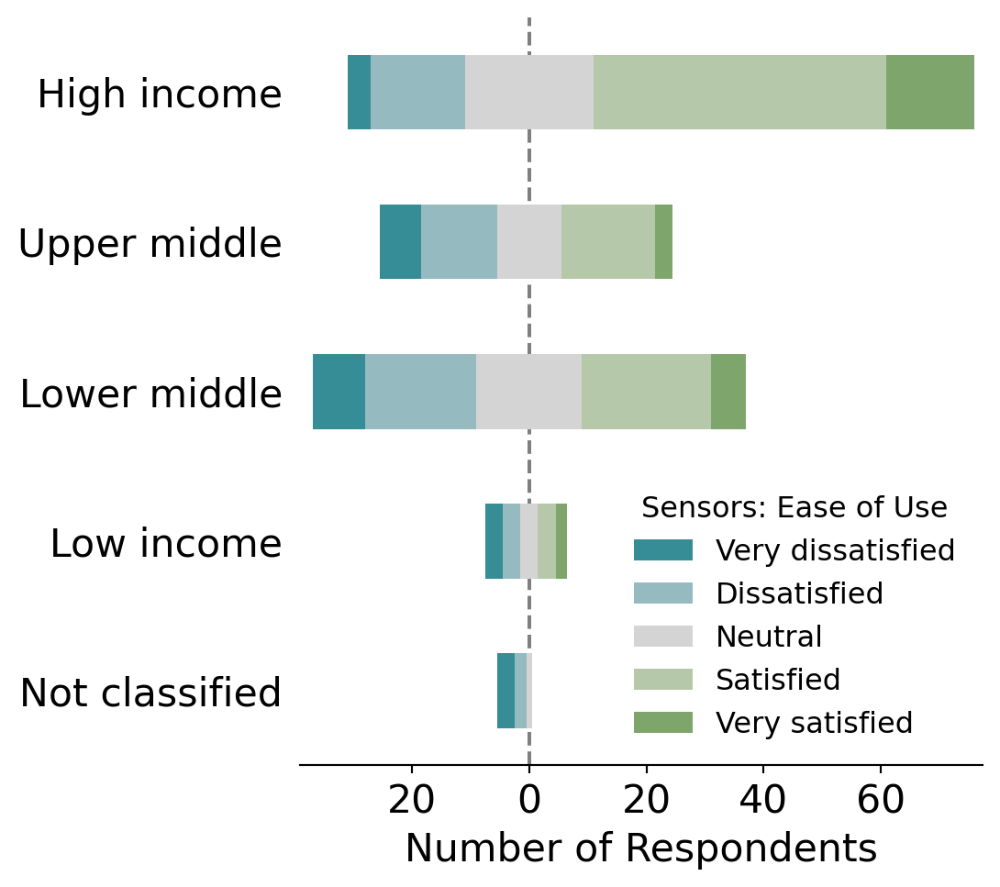

In [188]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Ease of Use',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U7')

### Q25f: Sensor accuracy

In [189]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

accuracy = {}
fig_data = {}
for region in region_list:
    accuracy[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q25_accuracy') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = accuracy[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [190]:
## Calculate statistics

for region in region_list:
    percent_data = (accuracy[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = accuracy[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          2.0        3.0   
2 - Dissatisfied                               6.0        2.0   
3 - Neither satisfied nor dissatisfied        24.0        4.0   
4 - Satisfied                                 48.0        3.0   
5 - Very satisfied                            22.0        2.0   
Total                                        102.0       14.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                  9.0            2.0   
2 - Dissatisfied                                       7.0            1.0   
3 - Neither satisfied nor dissatisfied                22.0            3.0   
4 - Satisfied                                         27.0            NaN   
5 - Very satisfied                                     8.0            NaN   
Total                                                 73.0            6.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  5.0        1.96   
2 - Dissatisfied                                       8.0        5.88   
3 - Neither satisfied nor dissatisfied                16.0       23.53   
4 - Satisfied                                         16.0       47.06   
5 - Very satisfied                                     5.0       21.57   
Total                                                 50.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       21.43               12.33   
2 - Dissatisfied                            14.29                9.59   
3 - Neither satisfied nor dissatisfied      28.57               30.14   
4 - Satisfied                               21.43               36.99   
5 - Very satisfied                          14.29               10.96   
Total                                      100.01              100.01   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           33.33                10.0   
2 - Dissatisfied                                16.67                16.0   
3 - Neither satisfied nor dissatisfied          50.00                32.0   
4 - Satisfied                                     NaN                32.0   
5 - Very satisfied                                NaN                10.0   
Total                                          100.00               100.0   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    21.0    8.57  
2 - Dissatisfied                         24.0    9.80  
3 - Neither satisfied nor dissatisfied   69.0   28.16  
4 - Satisfied                            94.0   38.37  
5 - Very satisfied                       37.0   15.10  
Total                                   245.0  100.00

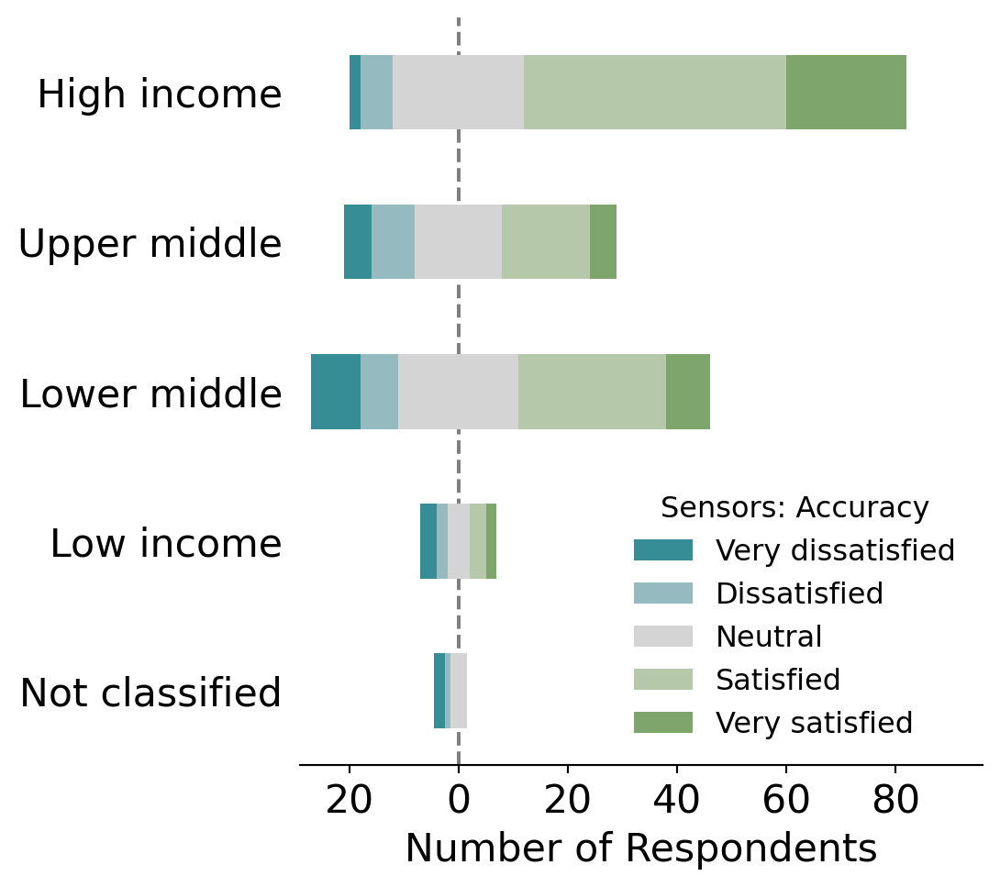

In [191]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left', 'SIDS': 'lower right'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Accuracy',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='U8')

## Fig V - Q23: Sensor importance

In [192]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

importance = {}
fig_data = {}
for region in region_list:
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q23'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [193]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection                                                           
1 - Not important              8.0        2.0                10.0   
2 - A little important         6.0        1.0                 6.0   
3 - Somewhat important        21.0        NaN                17.0   
4 - Important                 31.0        NaN                16.0   
5 - Very important            70.0       21.0                58.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection                                                               
1 - Not important                 2.0                 7.0        5.88   
2 - A little important            3.0                 1.0        4.41   
3 - Somewhat important            4.0                16.0       15.44   
4 - Important                     2.0                11.0       22.79   
5 - Very important                7.0                40.0       51.47   
Total                            18.0                75.0       99.99   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection                                                              
1 - Not important            8.33                9.35          11.11   
2 - A little important       4.17                5.61          16.67   
3 - Somewhat important        NaN               15.89          22.22   
4 - Important                 NaN               14.95          11.11   
5 - Very important          87.50               54.21          38.89   
Total                      100.00              100.01         100.00   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection                                                  
1 - Not important                     9.33   29.0    8.06  
2 - A little important                1.33   17.0    4.72  
3 - Somewhat important               21.33   58.0   16.11  
4 - Important                        14.67   60.0   16.67  
5 - Very important                   53.33  196.0   54.44  
Total                                99.99  360.0  100.00

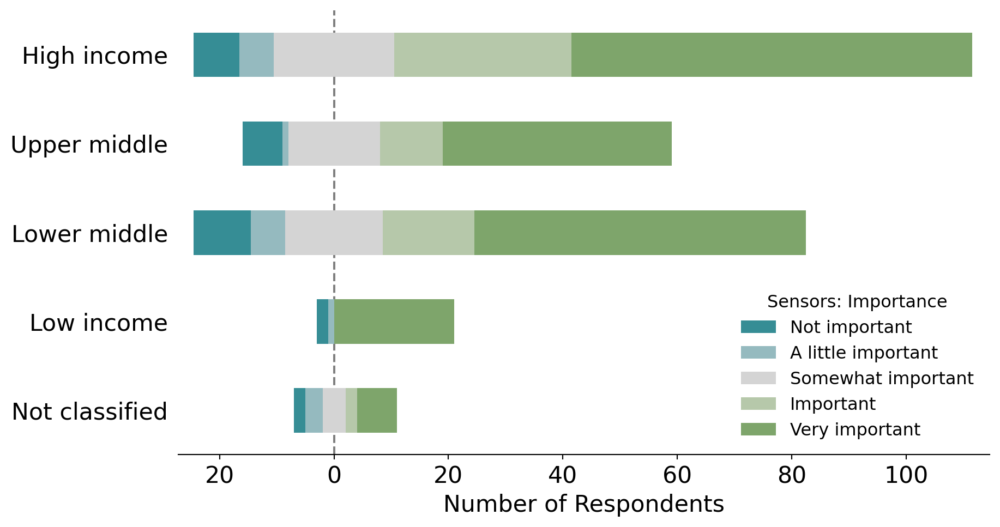

In [194]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='V1')

### Q26: Sensor potential

In [195]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

potential = {}
fig_data = {}
for region in region_list:
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q26'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'}, inplace=True)

In [196]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                                \
subregion           High income Low income Lower middle income Not classified   
selection                                                                       
1 - No impact               7.0        4.0                 7.0            2.0   
2 - Little impact           8.0        NaN                 5.0            NaN   
3 - Moderate impact        27.0        4.0                17.0            4.0   
4 - High impact            33.0        1.0                18.0            1.0   
5 - Transformative         61.0       15.0                60.0           11.0   
Total                     136.0       24.0               107.0           18.0   

                                            percent             \
subregion           Upper middle income High income Low income   
selection                                                        
1 - No impact                       2.0        5.15      16.67   
2 - Little impact                   NaN        5.88        NaN   
3 - Moderate impact                13.0       19.85      16.67   
4 - High impact                    14.0       24.26       4.17   
5 - Transformative                 46.0       44.85      62.50   
Total                              75.0       99.99     100.01   

                                                                            \
subregion           Lower middle income Not classified Upper middle income   
selection                                                                    
1 - No impact                      6.54          11.11                2.67   
2 - Little impact                  4.67            NaN                 NaN   
3 - Moderate impact               15.89          22.22               17.33   
4 - High impact                   16.82           5.56               18.67   
5 - Transformative                56.07          61.11               61.33   
Total                             99.99         100.00              100.00   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         22.0    6.11  
2 - Little impact     13.0    3.61  
3 - Moderate impact   65.0   18.06  
4 - High impact       67.0   18.61  
5 - Transformative   193.0   53.61  
Total                360.0  100.00

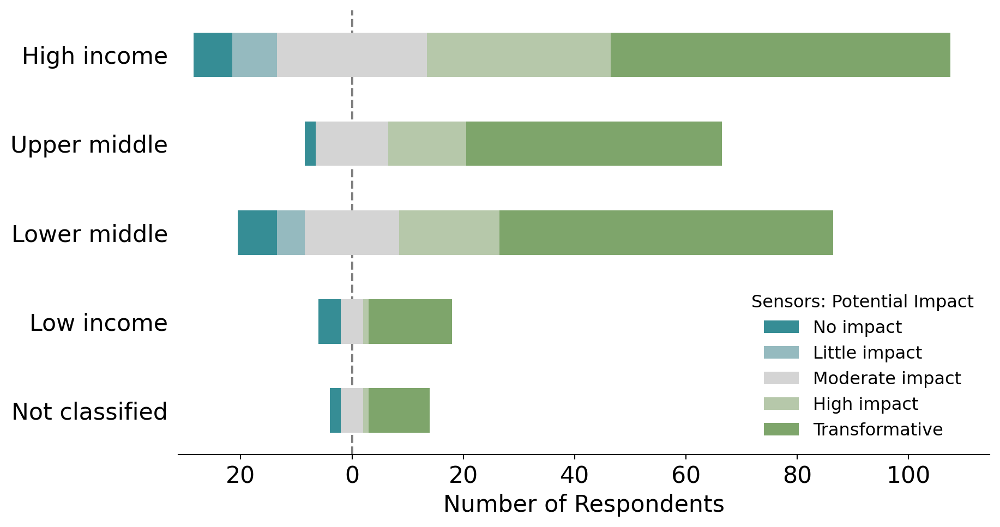

In [197]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Sensors: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='8', letter='V2')

---
# **Section 9**

## Fig W - Data tools presence

In [198]:
## Calculate values for plot

label_order = {}
fig_data = {}
for region in region_list:
    data_presence = researchR[region].loc[(researchR[region]['question'] == 'Q29') &
                                   (researchR[region]['col_name'] != 'Q29_comments'), ['geoarea',
                                                                              'col_name',
                                                                              'subregion',
                                                                              'research_tech_clean']]
    data_presence['selection_binary'] = data_presence['research_tech_clean']

    fig_data[region] = (data_presence.groupby(['subregion', 'col_name'])['selection_binary']
                    .sum()
                    .rename('count')
                    .reset_index())

    num_areas_per_subregion = data_presence.groupby('subregion')['geoarea'].nunique()
    num_areas_dict = dict(zip(num_areas_per_subregion.index, num_areas_per_subregion.values))
    fig_data[region]['total'] = fig_data[region]['subregion']
    fig_data[region]['total'].replace(num_areas_dict, inplace=True)

    fig_data[region]['percent'] = round((fig_data[region]['count']/fig_data[region]['total'])*100, 2)

    renames = {
        'Q29_gis':             'GIS',
        'Q29_data_management': 'Data management',
        'Q29_data_storage':    'Data storage',
        'Q29_data_viz':        'Data visualization',
        'Q29_cloud':           'Cloud computing',
        'Q29_sequencing':      'Genomic sequencing',
        'Q29_ml':              'ML/AI',
    }
    hue_order = renames.values()
    fig_data[region]['col_name'].replace(renames, inplace=True)
    fig_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = fig_data[region].pivot(columns='col_name', index='subregion', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()
    total_yes_in_region = pivoted.loc['Total', ('count', 'cloud'):('count', 'sequencing')].sum()
    pivoted.loc['Total', ('percent', 'cloud'):('percent', 'sequencing')] = \
        ((pivoted.loc['Total', ('count', 'cloud'):('count', 'sequencing')]/total_yes_in_region).values)*100

    display(round(pivoted, 2))

    ## Names of GeoAreas with all types present
    num_types = (data_presence
                     .groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(num_types[num_types['num_types'] == num_types['num_types'].max()])

    ## Names of GeoAreas with fewest types present
    display(num_types[num_types['num_types'] == num_types['num_types'].min()])

    ## % of areas in region that have all types
    num_types = (data_presence.groupby(['subregion', 'geoarea'])['selection_binary']
                     .sum()
                     .rename('num_types')
                     .reset_index())
    display(round((num_types[num_types['num_types'] == 7].shape[0]/num_types.shape[0])*100, 2))

    ## % of areas in region with < 3 types
    display(round((num_types[num_types['num_types'] < 3].shape[0]/num_types.shape[0])*100, 2))

count                               \
col_name       Cloud computing Data management Data storage   
subregion                                                     
High income               44.0            43.0         35.0   
Low income                 6.0             8.0          7.0   
Lower middle              31.0            29.0         29.0   
Not classified            13.0            16.0          8.0   
Upper middle              36.0            34.0         31.0   
Total                    130.0           130.0        110.0   

                                                                    \
col_name       Data visualization    GIS Genomic sequencing  ML/AI   
subregion                                                            
High income                  35.0   44.0               35.0   32.0   
Low income                    8.0   14.0                7.0   13.0   
Lower middle                 28.0   39.0               26.0   28.0   
Not classified               11.0   23.0                9.0   12.0   
Upper middle                 28.0   39.0               25.0   24.0   
Total                       110.0  159.0              102.0  109.0   

                       percent                               \
col_name       Cloud computing Data management Data storage   
subregion                                                     
High income              83.02           81.13        66.04   
Low income               40.00           53.33        46.67   
Lower middle             75.61           70.73        70.73   
Not classified           44.83           55.17        27.59   
Upper middle             85.71           80.95        73.81   
Total                   329.17          341.31       284.84   

                                                                      
col_name       Data visualization     GIS Genomic sequencing   ML/AI  
subregion                                                             
High income                 66.04   83.02              66.04   60.38  
Low income                  53.33   93.33              46.67   86.67  
Lower middle                68.29   95.12              63.41   68.29  
Not classified              37.93   79.31              31.03   41.38  
Upper middle                66.67   92.86              59.52   57.14  
Total                      292.26  443.64             266.67  313.86

,subregion,geoarea,num_types
2,High income,Australia,7
5,High income,Bermuda,7
7,High income,Brunei Darussalam,7
8,High income,Canada,7
10,High income,Chile,7
11,High income,Croatia,7
13,High income,Cyprus,7
15,High income,France,7
18,High income,Greece,7
22,High income,Ireland,7


,subregion,geoarea,num_types
29,High income,Nauru,0
37,High income,Puerto Rico,0
117,Not classified,French Guiana,0
172,Upper middle income,Saint Lucia,0


28.33

18.89

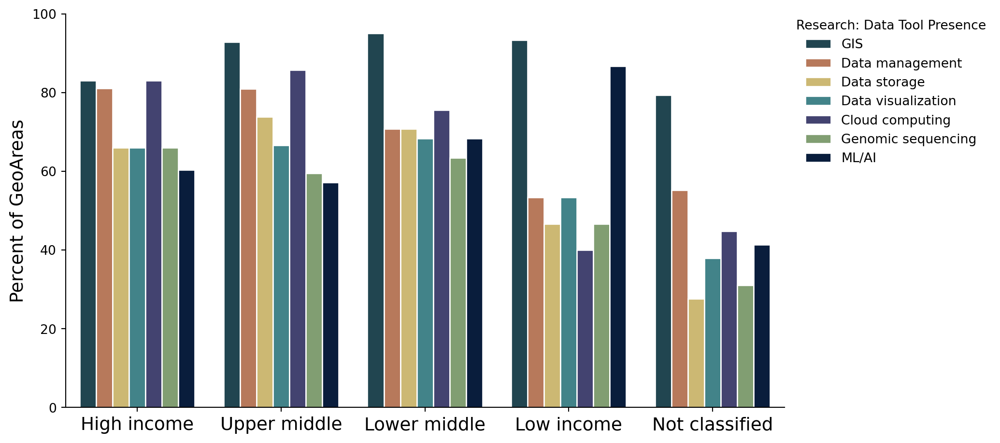

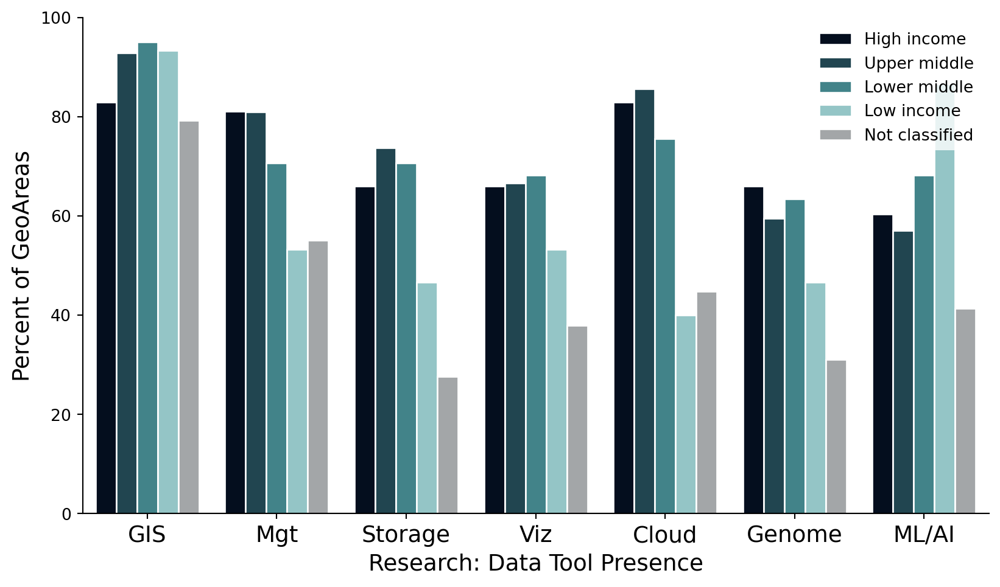

In [199]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='col_name',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07,
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015),
              loc='upper left',
              title='Research: Data Tool Presence',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='W1')

    ## W2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='col_name',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     ci=None,
                     edgecolor='white',
                     data=fig_data[region])            

    ax.set_xticklabels(['GIS', 'Mgt', 'Storage', 'Viz', 'Cloud', 'Genome', 'ML/AI'], rotation=0, fontsize=14)
    ax.set_xlabel('Research: Data Tool Presence', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of GeoAreas', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='W2')

## Fig X - Q29: Data Tools Access

In [200]:
## Get data for figure - using num respondents for aggregated calculations & denominators

label_order = {}
fig_data = {}
percent_data = {}
for region in region_list:
    data_tools = dataR[region].loc[dataR[region]['question'] == 'Q29', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    data_tools = data_tools[data_tools['selection_survey_clean'] != '']
    ## Group "I don't know" and "None of the above"
    data_tools.loc[data_tools['selection_survey_clean'] == "I don't know what tools are available",
                   'selection_survey_clean'] = 'None of the above'

    vessels = dataR[region].loc[dataR[region]['question'] == 'Q24', ['subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection_survey_clean']]
    vessels = vessels[vessels['selection_survey_clean'] != '']

    fig_data[region] = (data_tools.groupby(['subregion', 'selection_survey_clean'])['respondent_id']
                       .nunique()
                       .rename('count')
                       .reset_index())

    # Calculate percentages
    percent_data[region] = fig_data[region].copy()
    num_respondents_per_subregion = vessels.groupby('subregion')['respondent_id'].nunique().reset_index()
    respondent_sub_dict = dict(zip(num_respondents_per_subregion['subregion'], 
                                   num_respondents_per_subregion['respondent_id']))
    percent_data[region]['total'] = percent_data[region]['subregion']
    percent_data[region]['total'].replace(respondent_sub_dict, inplace=True)
    percent_data[region]['percent'] = round((percent_data[region]['count']/percent_data[region]['total'])*100, 2)

    renames = {
        'Geographical information systems (GIS)':   'GIS',
        'Data management tools':                    'Data management',
        'Data storage capacity':                    'Data storage',
        'Data visualization tools':                 'Data visualization',
        'Cloud computing':                          'Cloud computing',
        'Genomic sequencing':                       'Genomic sequencing',
        'Machine learning/artificial intelligence': 'ML/AI',
        'Other':                                    'Other',
        'None of the above':                        'None of the above',
    }
    hue_order = renames.values()
    percent_data[region]['selection_survey_clean'].replace(renames, inplace=True)
    percent_data[region]['subregion'].replace(label_adjustments, inplace=True)
    label_order[region] = []
    for x in orderR[region]:
        if x in label_adjustments:
            label_order[region].append(label_adjustments[x])
        else:
            label_order[region].append(x)

    pivoted = percent_data[region].pivot(columns='subregion', index='selection_survey_clean', values=['count', 'percent'])
    pivoted.loc['Total'] = num_respondents_per_subregion['respondent_id'].tolist()*2
    num_respondents = vessels['respondent_id'].nunique()
    pivoted.loc['Total', 'percent'] = round((pivoted.loc['Total', 'percent']/num_respondents)*100, 2).values

    pivoted[('count', 'Total')] = pivoted['count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_respondents)*100, 2)

    display(pivoted)

count                                         \
subregion              High income Low income Lower middle Not classified   
selection_survey_clean                                                      
Cloud computing               64.0        3.0         20.0            7.0   
Data management               93.0        7.0         54.0            6.0   
Data storage                 100.0        5.0         43.0            9.0   
Data visualization            88.0        4.0         52.0           10.0   
GIS                          110.0       13.0         80.0           13.0   
Genomic sequencing            54.0        2.0         13.0            1.0   
ML/AI                         55.0        2.0          9.0            2.0   
None of the above             17.0       11.0         24.0            4.0   
Other                          6.0        2.0          2.0            3.0   
Total                        135.0       24.0        105.0           17.0   

                                        percent                          \
subregion              Upper middle High income Low income Lower middle   
selection_survey_clean                                                    
Cloud computing                22.0       47.41      12.50        19.05   
Data management                42.0       68.89      29.17        51.43   
Data storage                   41.0       74.07      20.83        40.95   
Data visualization             40.0       65.19      16.67        49.52   
GIS                            61.0       81.48      54.17        76.19   
Genomic sequencing             14.0       40.00       8.33        12.38   
ML/AI                          11.0       40.74       8.33         8.57   
None of the above              13.0       12.59      45.83        22.86   
Other                           3.0        4.44       8.33         1.90   
Total                          74.0       38.03       6.76        29.58   

                                                    count percent  
subregion              Not classified Upper middle  Total   Total  
selection_survey_clean                                             
Cloud computing                 41.18        29.73  116.0   32.68  
Data management                 35.29        56.76  202.0   56.90  
Data storage                    52.94        55.41  198.0   55.77  
Data visualization              58.82        54.05  194.0   54.65  
GIS                             76.47        82.43  277.0   78.03  
Genomic sequencing               5.88        18.92   84.0   23.66  
ML/AI                           11.76        14.86   79.0   22.25  
None of the above               23.53        17.57   69.0   19.44  
Other                           17.65         4.05   16.0    4.51  
Total                            4.79        20.85  355.0  100.00

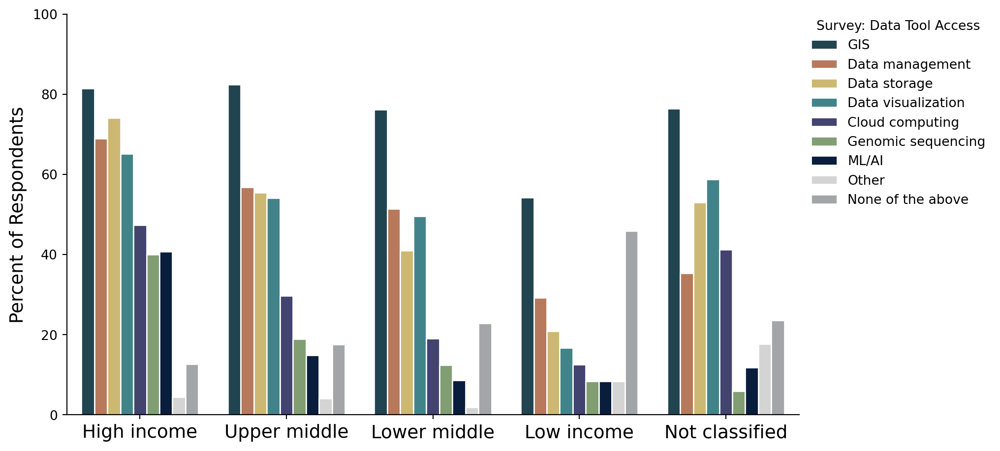

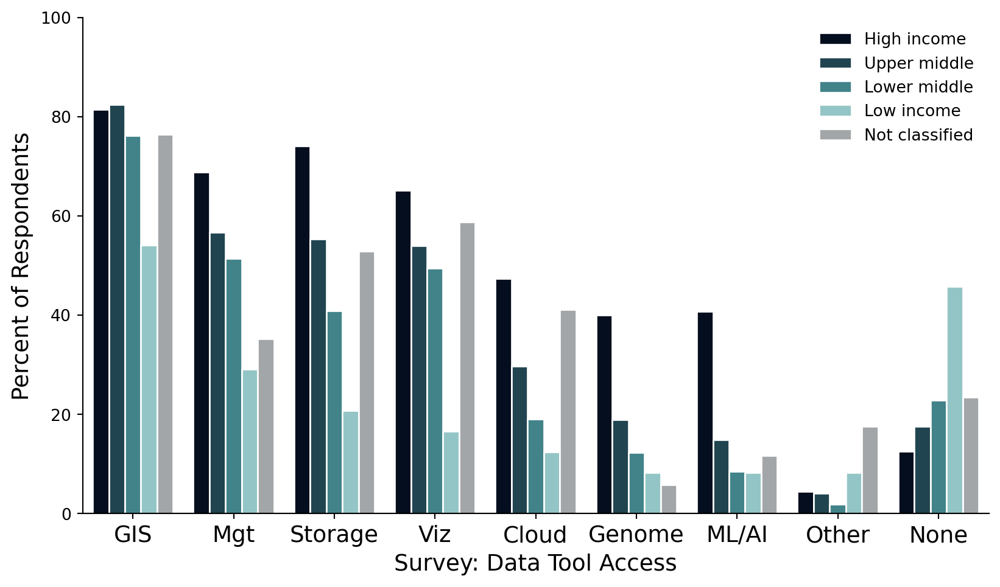

In [201]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='subregion',
                     y='percent',
                     hue='selection_survey_clean',
                     order=label_order[region],
                     hue_order=hue_order,
                     palette=cat_07 + ['#a2a6a9'],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=14)
    ax.set(xlabel=None)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(bbox_to_anchor=(1, 1.015), loc='upper left',
              title='Survey: Data Tool Access',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='X1')

    ## X2

    fig, ax = plt.subplots(1, 1, figsize=(w/my_dpi, h/my_dpi), dpi=my_dpi)
    ax = sns.barplot(x='selection_survey_clean',
                     y='percent',
                     hue='subregion',
                     order=hue_order,
                     hue_order=label_order[region],
                     palette=cat_d23e123_by_region[region],
                     edgecolor='white',
                     ci=None,
                     data=percent_data[region])            

    ax.set_xticklabels(['GIS', 'Mgt', 'Storage', 'Viz', 'Cloud', 'Genome', 'ML/AI', 'Other', 'None'], rotation=0, fontsize=14)
    ax.set_xlabel('Survey: Data Tool Access', fontsize=14)
    ax.set_ylim([0, 100])
    ax.set_ylabel('Percent of Respondents', fontsize=14)
    ax.legend(loc='upper right',
              fontsize=10,
              title_fontsize=10)

    outputfigs(plt, fig, ax, region, section='9', letter='X2')

## Fig Y - Q30: Data tools satisfaction

In [202]:
## Calculate values for plot


# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

satisfaction = {}
missing_responses = {}
fig_data = {}
for region in region_list:
    ## Select data
    satisfaction[region] = dataR[region].loc[dataR[region]['question'] == 'Q30', ['col_name', 
                                                   'subregion', 
                                                   'geoarea', 
                                                   'respondent_id', 
                                                   'selection',
                                                   'selection_other']]
    satisfaction[region].loc[(satisfaction[region]['col_name'] == 'Q30_other') & 
                     (satisfaction[region]['selection'] != ''), 'selection_other'] = 'Other'

    missing_responses[region] = satisfaction[region][satisfaction[region]['selection_other'] == ''].copy()

    satisfaction[region] = satisfaction[region][~satisfaction[region]['selection_other'].isin(['Other', ''])]

    satisfaction[region]['row_num'] = np.arange(satisfaction[region].shape[0])

    fig_data[region] = satisfaction[region].pivot(columns='subregion', index='row_num', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [203]:
## Calculate statistics

for region in region_list:
    ## Calculate number of people who chose NA for each question and subregion - recall that one individual could choose 
    ## NA for more than one question
    stats = missing_responses[region].groupby(['col_name', 'subregion'])['respondent_id'].nunique().rename('count').reset_index()
    stats = stats.pivot(columns='subregion', index='col_name', values='count')
    stats['Total'] = stats.sum(axis=1)
    display(stats)

    ## Calculate the number of people who chose NA on at least one part of the question - EXCLUDING OTHER
    display(missing_responses[region].loc[missing_responses[region]['col_name'] != 'Q30_other', 'respondent_id'].nunique())

    percent_data = (satisfaction[region].groupby(['subregion', 'selection'])['row_num']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

subregion,High income,Low income,Lower middle income,Not classified,Upper middle income,Total
col_name,,,,,,
Q30_availability,15,8,17,3,13,56
Q30_bandwidth,17,8,17,4,10,56
Q30_capabilities,16,8,18,3,11,56
Q30_cost,18,7,20,3,12,60
Q30_ease,13,7,18,3,11,52
Q30_other,136,24,107,18,75,360


67

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                         20.0       28.0   
2 - Dissatisfied                             111.0       24.0   
3 - Neither satisfied nor dissatisfied       125.0       12.0   
4 - Satisfied                                231.0       13.0   
5 - Very satisfied                           114.0        5.0   
Total                                        601.0       82.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 46.0           27.0   
2 - Dissatisfied                                      94.0           23.0   
3 - Neither satisfied nor dissatisfied               137.0           11.0   
4 - Satisfied                                        141.0           10.0   
5 - Very satisfied                                    27.0            3.0   
Total                                                445.0           74.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 52.0        3.33   
2 - Dissatisfied                                      81.0       18.47   
3 - Neither satisfied nor dissatisfied                77.0       20.80   
4 - Satisfied                                         90.0       38.44   
5 - Very satisfied                                    18.0       18.97   
Total                                                318.0      100.01   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       34.15               10.34   
2 - Dissatisfied                            29.27               21.12   
3 - Neither satisfied nor dissatisfied      14.63               30.79   
4 - Satisfied                               15.85               31.69   
5 - Very satisfied                           6.10                6.07   
Total                                      100.00              100.01   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           36.49               16.35   
2 - Dissatisfied                                31.08               25.47   
3 - Neither satisfied nor dissatisfied          14.86               24.21   
4 - Satisfied                                   13.51               28.30   
5 - Very satisfied                               4.05                5.66   
Total                                           99.99               99.99   

                                         count percent  
subregion                                Total   Total  
selection                                               
1 - Very dissatisfied                    173.0   11.38  
2 - Dissatisfied                         333.0   21.91  
3 - Neither satisfied nor dissatisfied   362.0   23.82  
4 - Satisfied                            485.0   31.91  
5 - Very satisfied                       167.0   10.99  
Total                                   1520.0  100.00

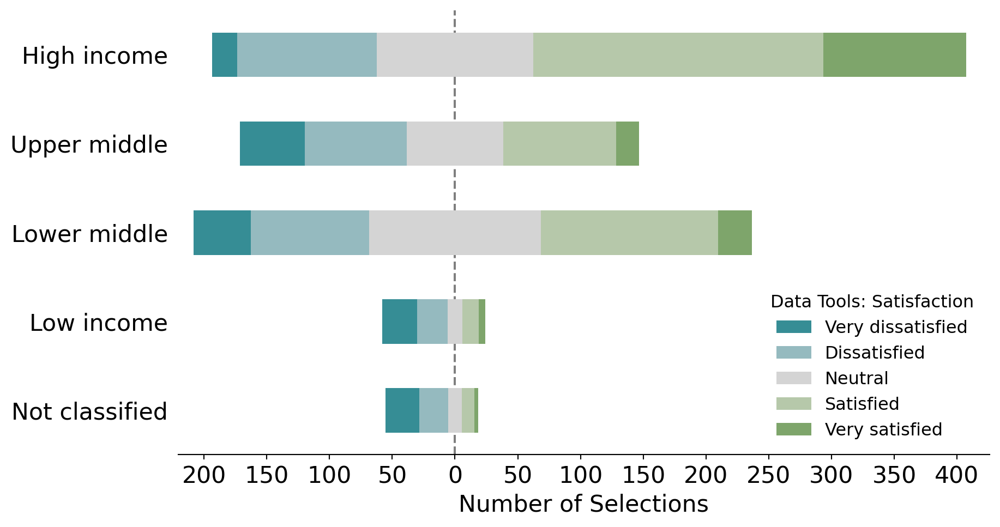

In [204]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region],
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Selections', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y1')

### Sensor satisfaction plot #2.

In [205]:
## Calculate values for plot
## Note: reuses satisfaction from previous figure

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

fig_data = {}
for region in region_list:
    fig_data[region] = satisfaction[region].pivot(columns='col_name', index='respondent_id', values='selection')

    # Change column names
    fig_data[region].columns = ['Availability', 'Bandwidth', 'Capabilities', 'Cost', 'Ease']

    # Change column order
    sorted_cols = ['Cost', 'Availability', 'Capabilities', 'Ease', 'Bandwidth']
    fig_data[region] = reorder_columns(fig_data[region], sorted_cols)

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [206]:
## Calculate statistics

for region in region_list:
    percent_data = (satisfaction[region].groupby(['col_name', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['col_name']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='col_name', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = satisfaction[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                \
col_name                               Q30_availability Q30_bandwidth   
selection                                                               
1 - Very dissatisfied                              36.0          44.0   
2 - Dissatisfied                                   71.0          61.0   
3 - Neither satisfied nor dissatisfied             69.0          67.0   
4 - Satisfied                                      97.0          88.0   
5 - Very satisfied                                 31.0          44.0   
Total                                             304.0         304.0   

                                                                           \
col_name                               Q30_capabilities Q30_cost Q30_ease   
selection                                                                   
1 - Very dissatisfied                              25.0     39.0     29.0   
2 - Dissatisfied                                   60.0     73.0     68.0   
3 - Neither satisfied nor dissatisfied             71.0     78.0     77.0   
4 - Satisfied                                     109.0     82.0    109.0   
5 - Very satisfied                                 39.0     28.0     25.0   
Total                                             304.0    300.0    308.0   

                                                percent                \
col_name                               Q30_availability Q30_bandwidth   
selection                                                               
1 - Very dissatisfied                             11.84         14.47   
2 - Dissatisfied                                  23.36         20.07   
3 - Neither satisfied nor dissatisfied            22.70         22.04   
4 - Satisfied                                     31.91         28.95   
5 - Very satisfied                                10.20         14.47   
Total                                            100.01        100.00   

                                                                           \
col_name                               Q30_capabilities Q30_cost Q30_ease   
selection                                                                   
1 - Very dissatisfied                              8.22    13.00     9.42   
2 - Dissatisfied                                  19.74    24.33    22.08   
3 - Neither satisfied nor dissatisfied            23.36    26.00    25.00   
4 - Satisfied                                     35.86    27.33    35.39   
5 - Very satisfied                                12.83     9.33     8.12   
Total                                            100.01    99.99   100.01   

                                         count percent  
col_name                                 Total   Total  
selection                                               
1 - Very dissatisfied                    173.0   11.38  
2 - Dissatisfied                         333.0   21.91  
3 - Neither satisfied nor dissatisfied   362.0   23.82  
4 - Satisfied                            485.0   31.91  
5 - Very satisfied                       167.0   10.99  
Total                                   1520.0  100.00

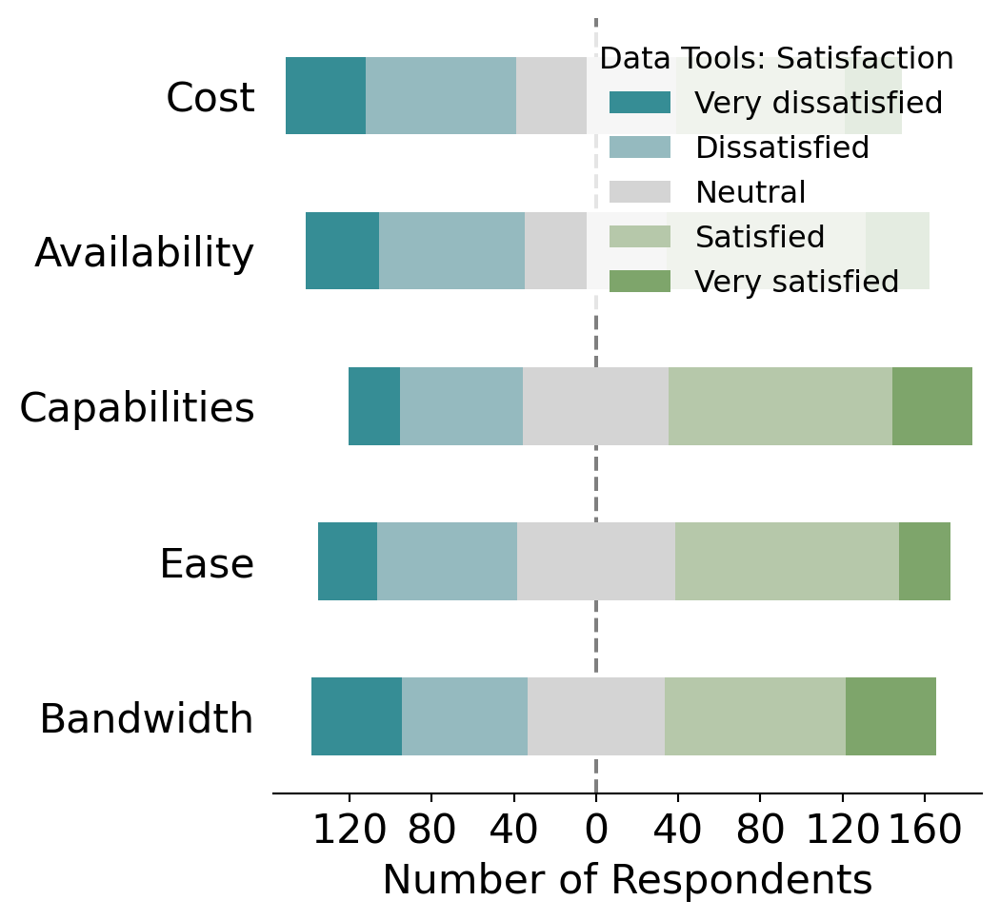

In [207]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Satisfaction',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y2')

### Q30a: Data tools cost

In [208]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

cost = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    cost[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_cost') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = cost[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [209]:
## Calculate statistics

for region in region_list:
    percent_data = (cost[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = cost[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          3.0        7.0   
2 - Dissatisfied                              26.0        7.0   
3 - Neither satisfied nor dissatisfied        28.0        NaN   
4 - Satisfied                                 42.0        2.0   
5 - Very satisfied                            19.0        1.0   
Total                                        118.0       17.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 10.0            6.0   
2 - Dissatisfied                                      18.0            4.0   
3 - Neither satisfied nor dissatisfied                30.0            2.0   
4 - Satisfied                                         25.0            2.0   
5 - Very satisfied                                     4.0            1.0   
Total                                                 87.0           15.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 13.0        2.54   
2 - Dissatisfied                                      18.0       22.03   
3 - Neither satisfied nor dissatisfied                18.0       23.73   
4 - Satisfied                                         11.0       35.59   
5 - Very satisfied                                     3.0       16.10   
Total                                                 63.0       99.99   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       41.18               11.49   
2 - Dissatisfied                            41.18               20.69   
3 - Neither satisfied nor dissatisfied        NaN               34.48   
4 - Satisfied                               11.76               28.74   
5 - Very satisfied                           5.88                4.60   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           40.00               20.63   
2 - Dissatisfied                                26.67               28.57   
3 - Neither satisfied nor dissatisfied          13.33               28.57   
4 - Satisfied                                   13.33               17.46   
5 - Very satisfied                               6.67                4.76   
Total                                          100.00               99.99   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    39.0   13.00  
2 - Dissatisfied                         73.0   24.33  
3 - Neither satisfied nor dissatisfied   78.0   26.00  
4 - Satisfied                            82.0   27.33  
5 - Very satisfied                       28.0    9.33  
Total                                   300.0  100.00

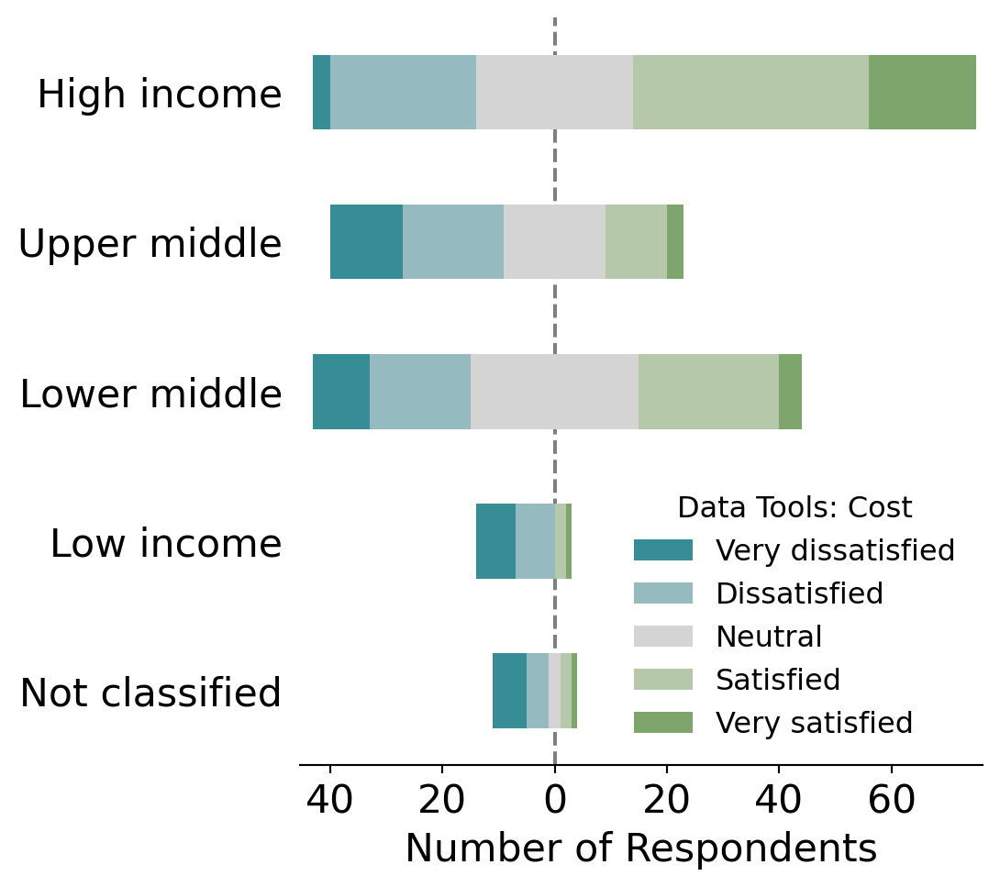

In [210]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower left', 'Americas': 'lower right', 'Economies': 'lower right', 'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Cost',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y3')

### Q30b: Data tools availability

In [211]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

availability = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    availability[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_availability') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = availability[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [212]:
## Calculate statistics

for region in region_list:
    percent_data = (availability[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = availability[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          4.0        6.0   
2 - Dissatisfied                              19.0        5.0   
3 - Neither satisfied nor dissatisfied        26.0        2.0   
4 - Satisfied                                 50.0        2.0   
5 - Very satisfied                            22.0        1.0   
Total                                        121.0       16.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 11.0            5.0   
2 - Dissatisfied                                      20.0            5.0   
3 - Neither satisfied nor dissatisfied                29.0            2.0   
4 - Satisfied                                         25.0            2.0   
5 - Very satisfied                                     5.0            1.0   
Total                                                 90.0           15.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 10.0        3.31   
2 - Dissatisfied                                      22.0       15.70   
3 - Neither satisfied nor dissatisfied                10.0       21.49   
4 - Satisfied                                         18.0       41.32   
5 - Very satisfied                                     2.0       18.18   
Total                                                 62.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       37.50               12.22   
2 - Dissatisfied                            31.25               22.22   
3 - Neither satisfied nor dissatisfied      12.50               32.22   
4 - Satisfied                               12.50               27.78   
5 - Very satisfied                           6.25                5.56   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           33.33               16.13   
2 - Dissatisfied                                33.33               35.48   
3 - Neither satisfied nor dissatisfied          13.33               16.13   
4 - Satisfied                                   13.33               29.03   
5 - Very satisfied                               6.67                3.23   
Total                                           99.99              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    36.0   11.84  
2 - Dissatisfied                         71.0   23.36  
3 - Neither satisfied nor dissatisfied   69.0   22.70  
4 - Satisfied                            97.0   31.91  
5 - Very satisfied                       31.0   10.20  
Total                                   304.0  100.00

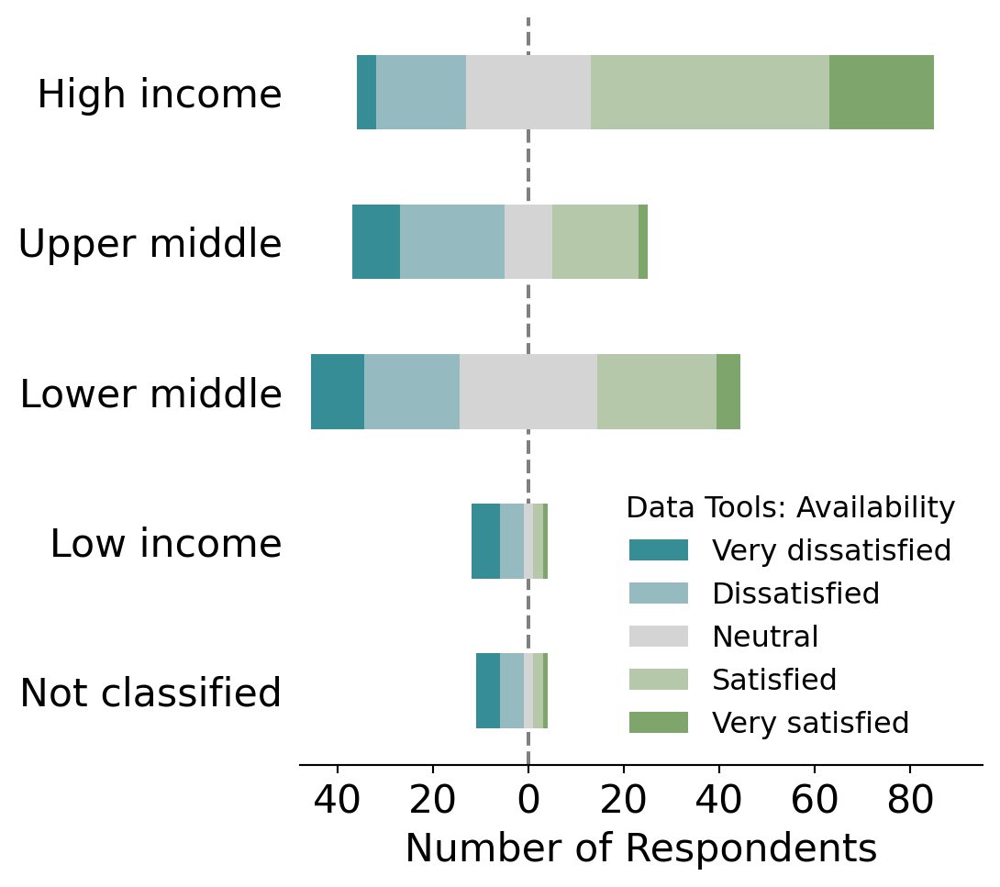

In [213]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Availability',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y4')

### Q30c: Data tools capabilities

In [214]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

capabilities = {}
fig_data = {}
for region in region_list:
## Select relevant survey data
    capabilities[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_capabilities') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = capabilities[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [215]:
## Calculate statistics

for region in region_list:
    percent_data = (capabilities[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = capabilities[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          2.0        5.0   
2 - Dissatisfied                              16.0        4.0   
3 - Neither satisfied nor dissatisfied        23.0        3.0   
4 - Satisfied                                 54.0        3.0   
5 - Very satisfied                            25.0        1.0   
Total                                        120.0       16.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                  6.0            4.0   
2 - Dissatisfied                                      19.0            5.0   
3 - Neither satisfied nor dissatisfied                28.0            3.0   
4 - Satisfied                                         28.0            2.0   
5 - Very satisfied                                     8.0            1.0   
Total                                                 89.0           15.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  8.0        1.67   
2 - Dissatisfied                                      16.0       13.33   
3 - Neither satisfied nor dissatisfied                14.0       19.17   
4 - Satisfied                                         22.0       45.00   
5 - Very satisfied                                     4.0       20.83   
Total                                                 64.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       31.25                6.74   
2 - Dissatisfied                            25.00               21.35   
3 - Neither satisfied nor dissatisfied      18.75               31.46   
4 - Satisfied                               18.75               31.46   
5 - Very satisfied                           6.25                8.99   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           26.67               12.50   
2 - Dissatisfied                                33.33               25.00   
3 - Neither satisfied nor dissatisfied          20.00               21.88   
4 - Satisfied                                   13.33               34.38   
5 - Very satisfied                               6.67                6.25   
Total                                          100.00              100.01   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    25.0    8.22  
2 - Dissatisfied                         60.0   19.74  
3 - Neither satisfied nor dissatisfied   71.0   23.36  
4 - Satisfied                           109.0   35.86  
5 - Very satisfied                       39.0   12.83  
Total                                   304.0  100.00

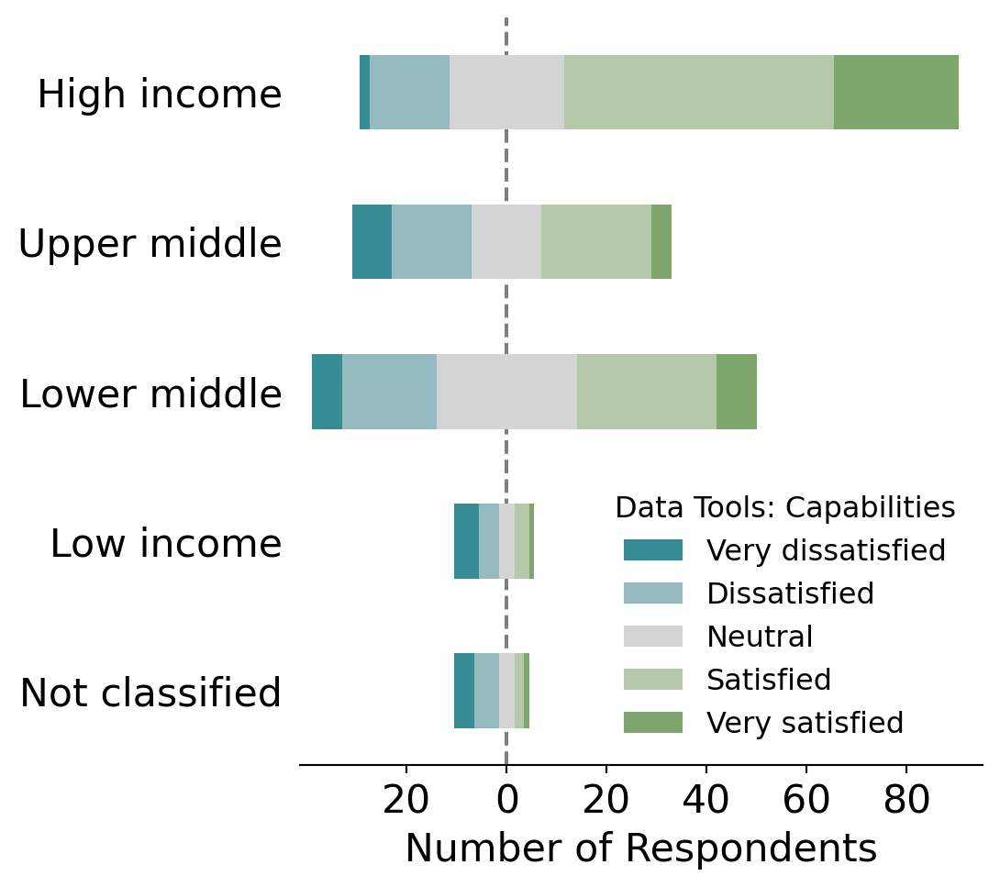

In [216]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Capabilities',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y5')

### Q30d: Data tools ease of use

In [217]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

ease = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    ease[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_ease') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = ease[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [218]:
## Calculate statistics

for region in region_list:
    percent_data = (ease[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = ease[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          4.0        4.0   
2 - Dissatisfied                              29.0        4.0   
3 - Neither satisfied nor dissatisfied        24.0        3.0   
4 - Satisfied                                 49.0        5.0   
5 - Very satisfied                            17.0        1.0   
Total                                        123.0       17.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                  7.0            5.0   
2 - Dissatisfied                                      19.0            5.0   
3 - Neither satisfied nor dissatisfied                28.0            2.0   
4 - Satisfied                                         31.0            3.0   
5 - Very satisfied                                     4.0            NaN   
Total                                                 89.0           15.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                  9.0        3.25   
2 - Dissatisfied                                      11.0       23.58   
3 - Neither satisfied nor dissatisfied                20.0       19.51   
4 - Satisfied                                         21.0       39.84   
5 - Very satisfied                                     3.0       13.82   
Total                                                 64.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       23.53                7.87   
2 - Dissatisfied                            23.53               21.35   
3 - Neither satisfied nor dissatisfied      17.65               31.46   
4 - Satisfied                               29.41               34.83   
5 - Very satisfied                           5.88                4.49   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           33.33               14.06   
2 - Dissatisfied                                33.33               17.19   
3 - Neither satisfied nor dissatisfied          13.33               31.25   
4 - Satisfied                                   20.00               32.81   
5 - Very satisfied                                NaN                4.69   
Total                                           99.99              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    29.0    9.42  
2 - Dissatisfied                         68.0   22.08  
3 - Neither satisfied nor dissatisfied   77.0   25.00  
4 - Satisfied                           109.0   35.39  
5 - Very satisfied                       25.0    8.12  
Total                                   308.0  100.00

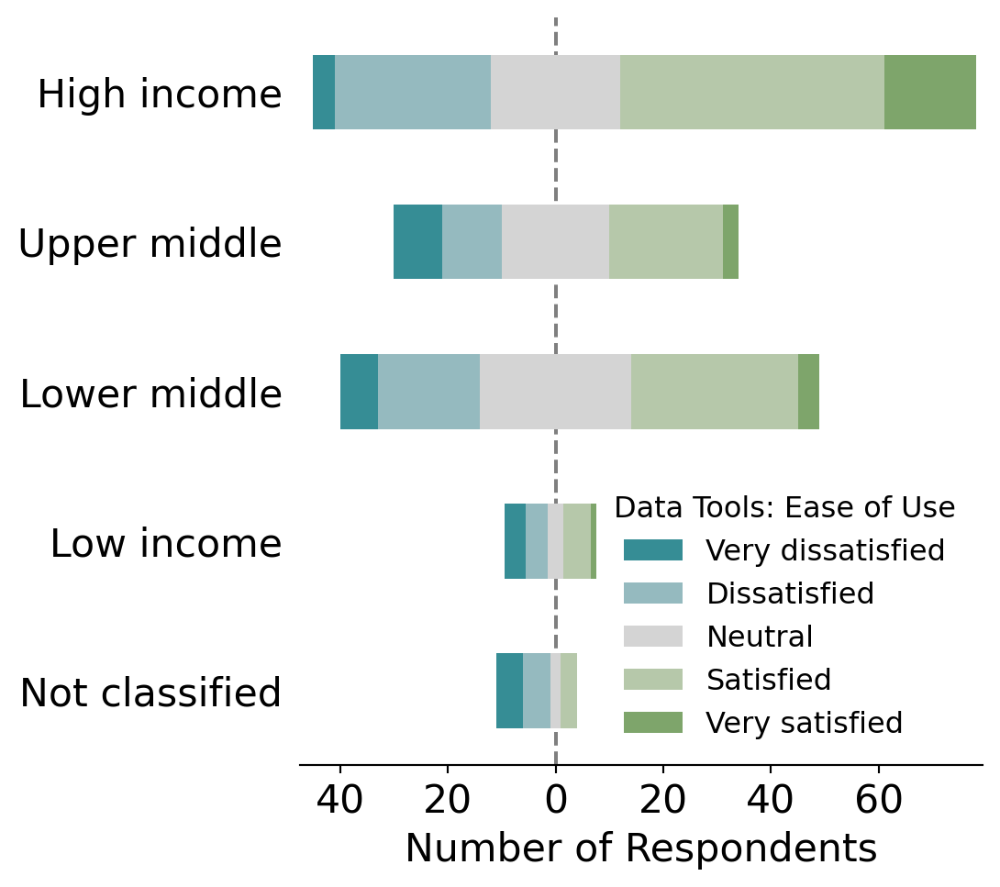

In [219]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Africa': 'lower right', 'Europe': 'upper right', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Ease of Use',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y6')

### Q30e: Data tools bandwidth

In [220]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Very dissatisfied', 
            'Dissatisfied', 
            'Neutral', 
            'Satisfied', 
            'Very satisfied']

bandwidth = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    bandwidth[region] = dataR[region].loc[(dataR[region]['col_name'] == 'Q30_bandwidth') &
                    (dataR[region]['selection'] != ''), 
                          ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = bandwidth[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Very dissatisfied': 'Very dissatisfied',
                      '2 - Dissatisfied': 'Dissatisfied',
                      '3 - Neither satisfied nor dissatisfied': 'Neutral',
                      '4 - Satisfied': 'Satisfied',
                      '5 - Very satisfied': 'Very satisfied'}, inplace=True)

In [221]:
## Calculate statistics

for region in region_list:
    percent_data = (bandwidth[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = bandwidth[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count             \
subregion                              High income Low income   
selection                                                       
1 - Very dissatisfied                          7.0        6.0   
2 - Dissatisfied                              21.0        4.0   
3 - Neither satisfied nor dissatisfied        24.0        4.0   
4 - Satisfied                                 36.0        1.0   
5 - Very satisfied                            31.0        1.0   
Total                                        119.0       16.0   

                                                                           \
subregion                              Lower middle income Not classified   
selection                                                                   
1 - Very dissatisfied                                 12.0            7.0   
2 - Dissatisfied                                      18.0            4.0   
3 - Neither satisfied nor dissatisfied                22.0            2.0   
4 - Satisfied                                         32.0            1.0   
5 - Very satisfied                                     6.0            NaN   
Total                                                 90.0           14.0   

                                                               percent  \
subregion                              Upper middle income High income   
selection                                                                
1 - Very dissatisfied                                 12.0        5.88   
2 - Dissatisfied                                      14.0       17.65   
3 - Neither satisfied nor dissatisfied                15.0       20.17   
4 - Satisfied                                         18.0       30.25   
5 - Very satisfied                                     6.0       26.05   
Total                                                 65.0      100.00   

                                                                       \
subregion                              Low income Lower middle income   
selection                                                               
1 - Very dissatisfied                       37.50               13.33   
2 - Dissatisfied                            25.00               20.00   
3 - Neither satisfied nor dissatisfied      25.00               24.44   
4 - Satisfied                                6.25               35.56   
5 - Very satisfied                           6.25                6.67   
Total                                      100.00              100.00   

                                                                           \
subregion                              Not classified Upper middle income   
selection                                                                   
1 - Very dissatisfied                           50.00               18.46   
2 - Dissatisfied                                28.57               21.54   
3 - Neither satisfied nor dissatisfied          14.29               23.08   
4 - Satisfied                                    7.14               27.69   
5 - Very satisfied                                NaN                9.23   
Total                                          100.00              100.00   

                                        count percent  
subregion                               Total   Total  
selection                                              
1 - Very dissatisfied                    44.0   14.47  
2 - Dissatisfied                         61.0   20.07  
3 - Neither satisfied nor dissatisfied   67.0   22.04  
4 - Satisfied                            88.0   28.95  
5 - Very satisfied                       44.0   14.47  
Total                                   304.0  100.00

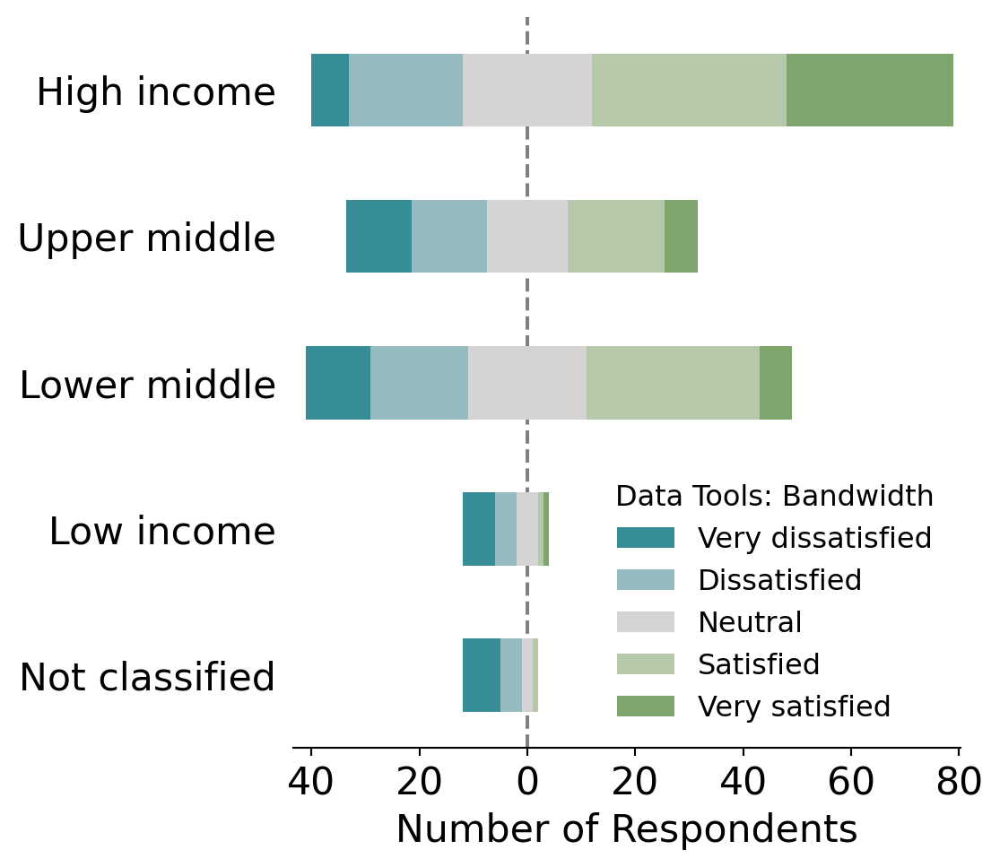

In [222]:
## Create plot

w = 960
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {'Europe': 'upper left', 'Global': 'upper left'}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Bandwidth',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Y7')

## Fig Z - Q28: Data tools importance

In [223]:
## Calculate values for plot

# Define scale for plot
my_scale = ['Not important', 
            'A little important', 
            'Somewhat important',
            'Important',
            'Very important']

importance = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    importance[region] = dataR[region].loc[(dataR[region]['question'] == 'Q28'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = importance[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - Not important': 'Not important',
                      '2 - A little important': 'A little important',
                      '3 - Somewhat important': 'Somewhat important',
                      '4 - Important': 'Important',
                      '5 - Very important': 'Very important'}, inplace=True)

In [224]:
## Calculate statistics

for region in region_list:
    percent_data = (importance[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = importance[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                 \
subregion              High income Low income Lower middle income   
selection                                                           
1 - Not important              2.0        3.0                 1.0   
2 - A little important         2.0        NaN                 4.0   
3 - Somewhat important        13.0        1.0                11.0   
4 - Important                 27.0        NaN                10.0   
5 - Very important            92.0       20.0                81.0   
Total                        136.0       24.0               107.0   

                                                              percent  \
subregion              Not classified Upper middle income High income   
selection                                                               
1 - Not important                 1.0                 NaN        1.47   
2 - A little important            1.0                 NaN        1.47   
3 - Somewhat important            2.0                 4.0        9.56   
4 - Important                     1.0                12.0       19.85   
5 - Very important               13.0                59.0       67.65   
Total                            18.0                75.0      100.00   

                                                                      \
subregion              Low income Lower middle income Not classified   
selection                                                              
1 - Not important           12.50                0.93           5.56   
2 - A little important        NaN                3.74           5.56   
3 - Somewhat important       4.17               10.28          11.11   
4 - Important                 NaN                9.35           5.56   
5 - Very important          83.33               75.70          72.22   
Total                      100.00              100.00         100.01   

                                            count percent  
subregion              Upper middle income  Total   Total  
selection                                                  
1 - Not important                      NaN    7.0    1.94  
2 - A little important                 NaN    7.0    1.94  
3 - Somewhat important                5.33   31.0    8.61  
4 - Important                        16.00   50.0   13.89  
5 - Very important                   78.67  265.0   73.61  
Total                               100.00  360.0  100.00

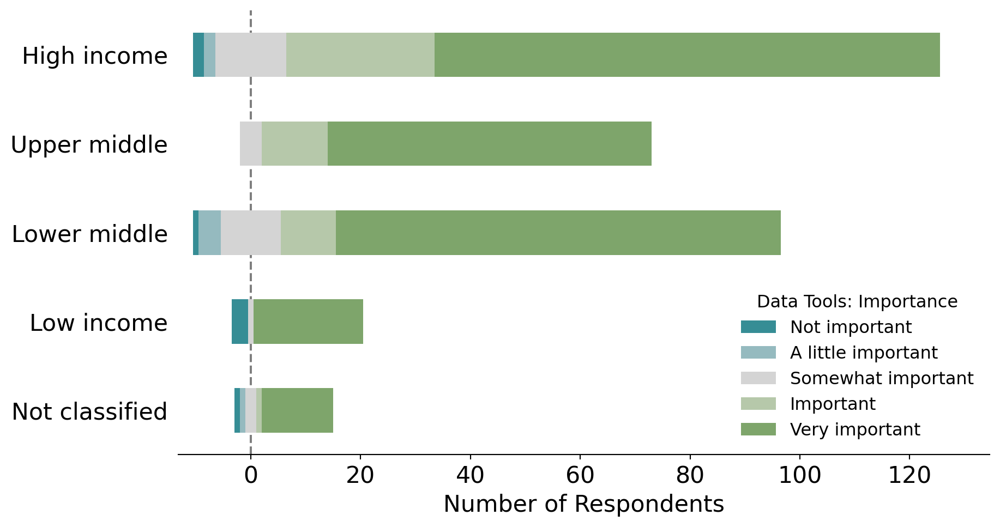

In [225]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data Tools: Importance',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Z1')

### Q31: Data tools potential

In [226]:
## Calculate values for plot

# Define scale for plot
my_scale = ['No impact', 
            'Little impact', 
            'Moderate impact',
            'High impact',
            'Transformative']

potential = {}
fig_data = {}
for region in region_list:
    ## Select relevant survey data
    potential[region] = dataR[region].loc[(dataR[region]['question'] == 'Q31'), ['respondent_id', 'subregion', 'col_name', 'selection']]

    fig_data[region] = potential[region].pivot(columns='subregion', index='respondent_id', values='selection')
    fig_data[region] = prep_fig_data_for_plotting(fig_data[region], region, axis='columns')

    # Change scale values
    fig_data[region].replace({
                      '1 - No impact': 'No impact',
                      '2 - Little impact': 'Little impact',
                      '3 - Moderate impact': 'Moderate impact',
                      '4 - High impact': 'High impact',
                      '5 - Transformative': 'Transformative'}, inplace=True)

In [227]:
## Calculate statistics

for region in region_list:
    percent_data = (potential[region].groupby(['subregion', 'selection'])['respondent_id']
                              .count()
                              .rename('count')
                              .reset_index())
    percent_data['total'] = percent_data['count'].groupby(percent_data['subregion']).transform('sum')
    percent_data['percent'] = round((percent_data['count']/percent_data['total'])*100, 2)

    pivoted = percent_data.pivot(columns='subregion', index='selection', values=['count', 'percent'])
    pivoted.loc['Total'] = pivoted.sum()

    num_responses = potential[region].shape[0]
    pivoted[('count', 'Total')] = pivoted.loc[:, 'count'].sum(axis=1)
    pivoted[('percent', 'Total')] = round((pivoted[('count', 'Total')]/num_responses)*100, 2)

    display(pivoted)

count                                                \
subregion           High income Low income Lower middle income Not classified   
selection                                                                       
1 - No impact               4.0        4.0                 6.0            2.0   
2 - Little impact           3.0        NaN                 3.0            NaN   
3 - Moderate impact        35.0        4.0                12.0            3.0   
4 - High impact            42.0        2.0                19.0            2.0   
5 - Transformative         52.0       14.0                67.0           11.0   
Total                     136.0       24.0               107.0           18.0   

                                            percent             \
subregion           Upper middle income High income Low income   
selection                                                        
1 - No impact                       1.0        2.94      16.67   
2 - Little impact                   NaN        2.21        NaN   
3 - Moderate impact                11.0       25.74      16.67   
4 - High impact                    19.0       30.88       8.33   
5 - Transformative                 44.0       38.24      58.33   
Total                              75.0      100.01     100.00   

                                                                            \
subregion           Lower middle income Not classified Upper middle income   
selection                                                                    
1 - No impact                      5.61          11.11                1.33   
2 - Little impact                  2.80            NaN                 NaN   
3 - Moderate impact               11.21          16.67               14.67   
4 - High impact                   17.76          11.11               25.33   
5 - Transformative                62.62          61.11               58.67   
Total                            100.00         100.00              100.00   

                     count percent  
subregion            Total   Total  
selection                           
1 - No impact         17.0    4.72  
2 - Little impact      6.0    1.67  
3 - Moderate impact   65.0   18.06  
4 - High impact       84.0   23.33  
5 - Transformative   188.0   52.22  
Total                360.0  100.00

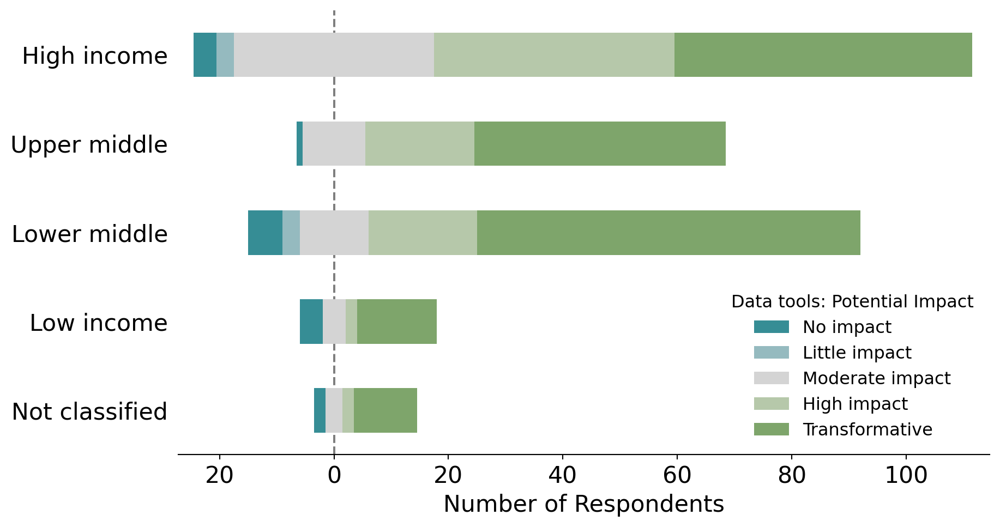

In [228]:
## Create plot

w = 1920
h = 1080

for region in region_list:
    ax = my_plot_likert(fig_data[region], 
                                 my_scale, 
                                 figsize=((w/my_dpi), (h/my_dpi)))
    ax.set_xlabel('Number of Respondents', fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=16)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)
    loc_tweaks = {}
    ax.legend(loc=loc_tweaker(region, loc_tweaks),
              title='Data tools: Potential Impact',
              fontsize=12,
              title_fontsize=12)

    outputfigs(plt, False, ax, region, section='9', letter='Z2')